In [1]:
import numpy as np
from sympy.physics.wigner import wigner_3j,wigner_6j
import sympy as sy
from numpy import linalg as LA
from IPython.display import Latex,display
import matplotlib.pyplot as plt
from matplotlib import colors
%matplotlib inline
import seaborn as sns
sns.set()
sns.set_palette('bright')
from Energy_Levels import MoleculeLevels
from Energy_Levels import branching_ratios, Calculate_TDMs,Calculate_TDM_evecs
from functools import partial
np.set_printoptions(precision=10, suppress=True)
from tabulate import tabulate
from matplotlib.collections import LineCollection

In [2]:
%matplotlib inline

In [3]:
N_list = [1,2]#,2]
print(N_list)

[1, 2]


In [4]:
# X010 = MoleculeLevels.initialize_state('CaOH','40','X010',N_list,M_values = 'custom',I=[0,1/2],S=1/2,round=16,M_range=[1])
X010 = MoleculeLevels.initialize_state('CaOH','40','X010',N_list,M_values = 'all',I=[0,1/2],S=1/2,round=6,P_values=[1/2,3/2],trap=True,theta_num=0)
# X000 = MoleculeLevels.initialize_state('CaOH','40','X000',N_list,M_values = 'none',I=[0,1/2],S=1/2,round=8,P_values=[1/2,3/2])

In [6]:
B0 = 1e-3
E0 = 0.1
X010.I_trap=0.01324*2/3.5
X010.theta_trap= 0#np.arccos(1/np.sqrt(3))
evals, evecs = X010.eigensystem(E0,B0,order=True,method='torch')

In [14]:
N_idx = [X010.select_q({'N':N}) for N in N_list]

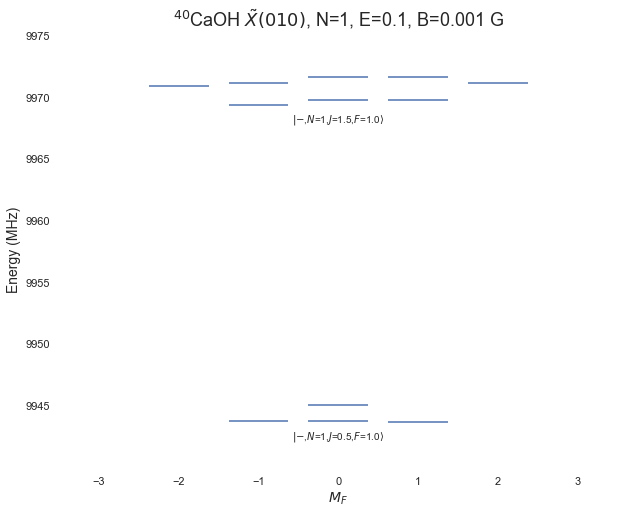

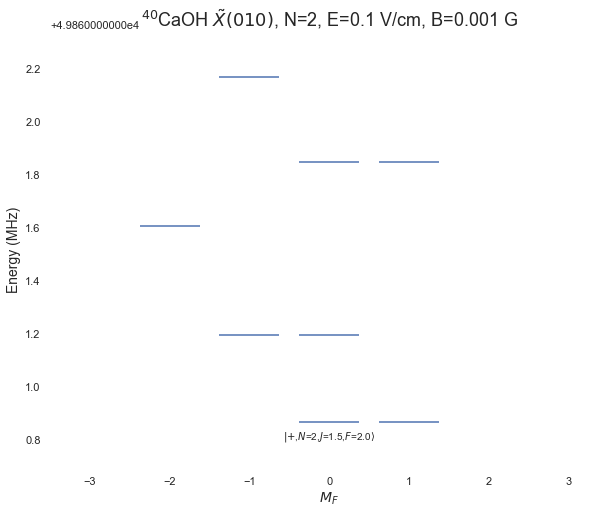

In [15]:
N=1
X010.display_levels(0.1,1e-3,'J',idx=X010.select_q({'N':1,},parity='-'),parity=True,label_q=[q for q in X010.q_str if q not in ['K']],label_off=0.05,figsize=(10,8),alt_label=False)
plt.title(X010.state_str+', N={}, E={}, B={} G'.format(N,E0,B0),fontsize=18)
plt.xlim(-3.5,3.5)
# plt.ylim(10000,10020)
plt.grid(False)
ax = plt.gca()
ax.set_facecolor('None')

N=2
X010.display_levels(0.1,1e-3,'J',idx=X010.select_q({'N':2,'J':1.5},parity='+'),parity=True,label_q=[q for q in X010.q_str if q not in ['K']],label_off=0.05,figsize=(10,8),alt_label=False)
plt.title(X010.state_str+', N={}, E={} V/cm, B={} G'.format(N,E0,B0),fontsize=18)
plt.xlim(-3.5,3.5)
# plt.ylim(50000,50020)
ax = plt.gca()
ax.set_facecolor('None')
plt.grid(False)

In [16]:
idx=X010.select_q({'N':2,'J':1.5},parity='+')
idx

array([24, 25, 26, 27, 28, 29, 30, 31])

In [12]:
X010.evecs0[24][0]

-0.0

In [5]:
Bstep = 0.001
Bz = np.arange(0,4+Bstep,Bstep)
Bz[0]=1e-4
Estep = 0.1
Ez = np.arange(0,100+Estep,Estep)

Text(0.5, 1.0, 'CaOH X(010) N=2, J=3/2+ Zeeman Shifts, E=0 V/cm')

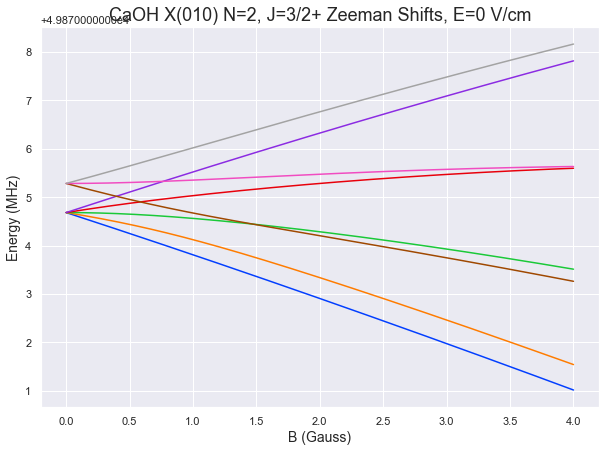

In [6]:
X010.ZeemanMap(Bz,0,plot=True,idx = X010.select_q({'N':2,'J':1.5},parity='+'))
plt.title('CaOH X(010) N=2, J=3/2+ Zeeman Shifts, E=0 V/cm',fontsize=18)

Text(0.5, 1.0, 'CaOH X(010) N=1, J=1/2- Zeeman Shifts, E=0 V/cm')

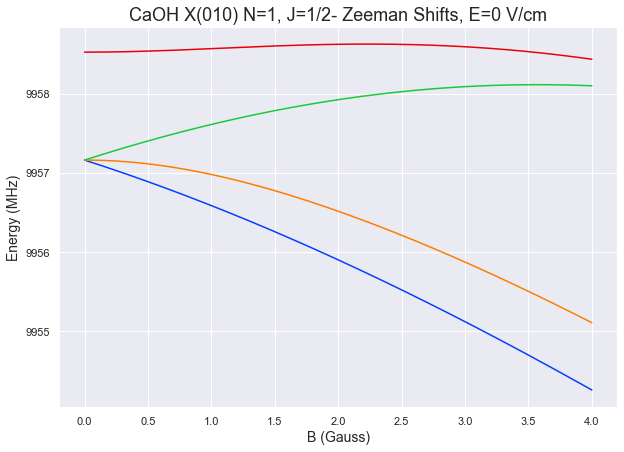

In [7]:
X010.ZeemanMap(Bz,0,plot=True,idx = X010.select_q({'N':1,'J':0.5},parity='-'))
plt.title('CaOH X(010) N=1, J=1/2- Zeeman Shifts, E=0 V/cm',fontsize=18)

Text(0.5, 1.0, 'CaOH X(010) N=1,J=1/2- Stark Shifts')

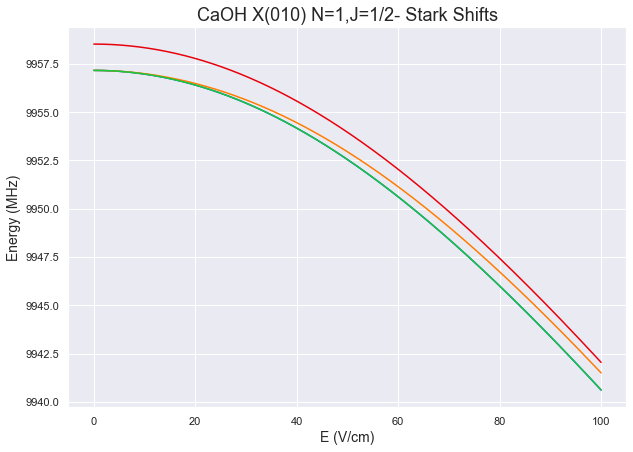

In [8]:
X010.StarkMap(Ez,1e-3,plot=True,idx = X010.select_q({'N':1,'J':0.5},parity='-'))
plt.title('CaOH X(010) N=1,J=1/2- Stark Shifts',fontsize=18)

Text(0.5, 1.0, 'CaOH X(010) N=2,J=3/2+ Stark Shifts')

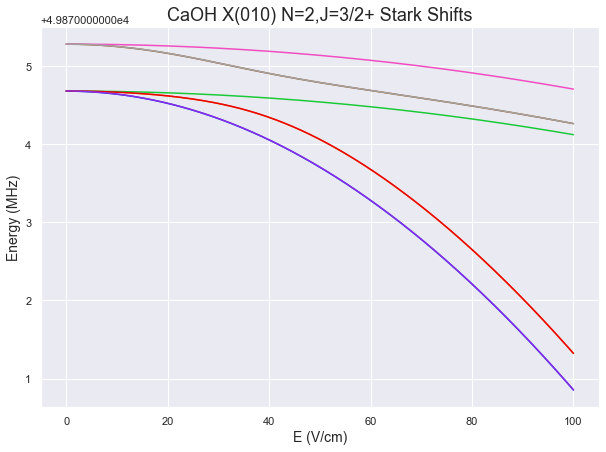

In [9]:
X010.StarkMap(Ez,1e-3,plot=True,idx = X010.select_q({'N':2,'J':1.5},parity='+'))
plt.title('CaOH X(010) N=2,J=3/2+ Stark Shifts',fontsize=18)

Text(0.5, 1.0, 'CaOH X(010) N=1- Zeeman Shifts')

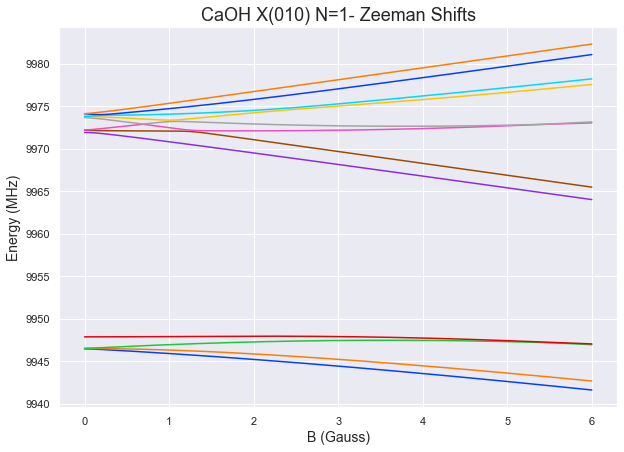

In [27]:
X010.ZeemanMap(Bz,0,plot=True,idx = X010.select_q({'N':1},parity='-'))
plt.title('CaOH X(010) N=1- Zeeman Shifts',fontsize=18)

Text(0.5, 1.0, 'CaOH X(010) N=2+,J=3/2 Zeeman Shifts')

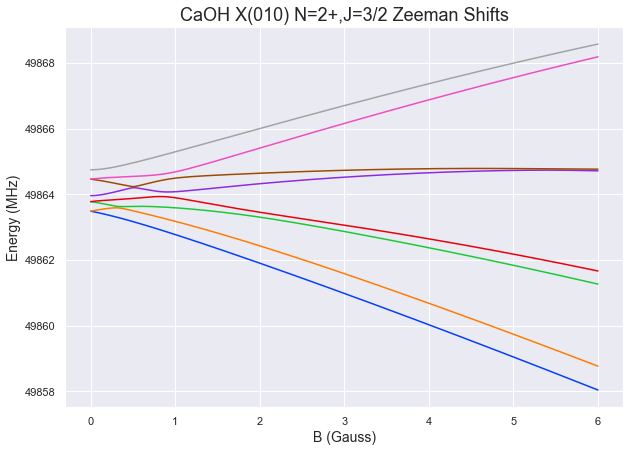

In [28]:
X010.ZeemanMap(Bz,0,plot=True,idx = X010.select_q({'N':2,'J':1.5},parity='+'))
plt.title('CaOH X(010) N=2+,J=3/2 Zeeman Shifts',fontsize=18)

In [7]:
B0 = 1e-3
E0 = 0
evals, evecs = X010.eigensystem(E0,B0,order=True,method='torch')
M0_idx = X010.select_q({'N':1})
print(M0_idx)
print('\n')
# for i in M0_idx:
#     display(Latex('$E = '+str(np.round(X010.evals0[i],4))+r'\:\mathrm{MHz}$'))
# #     print('Decoupled:')
# #     display(Latex(X010.gen_state_str(i,basis='decoupled',thresh=0.05,label_q=['K','M_N','M_S','M_I','M_F'],round=4)))
#     print('Case A:')
#     display(Latex(X010.gen_state_str(i,basis='aBJ',thresh=0.05,label_q=['K','J','F','Sigma','P','M'],round=4)))
#     print('Case BbS:')
#     display(Latex(X010.gen_state_str(i,basis='bBS',thresh=0.05,label_q=['K','G','N','F','M'],round=4)))
#     print('Case B:')
#     print('Parity=',X010.parities[i])
#     display(Latex(X010.gen_state_str(i,thresh=0.0005,round=4)))
#     print('\n')

[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23]




In [8]:
B0 = 1e-3
E0 = 0
evals, evecs = X000.eigensystem(E0,B0,order=True,method='torch')
M0_idx = X000.select_q({'N':[0,1]})
print(M0_idx)
print('\n')
# for i in M0_idx:
#     display(Latex('$E = '+str(np.round(X000.evals0[i],4))+r'\:\mathrm{MHz}$'))
# #     print('Decoupled:')
# #     display(Latex(X000.gen_state_str(i,basis='decoupled',thresh=0.05,label_q=['K','M_N','M_S','M_I','M_F'],round=4)))
#     print('Case A:')
#     display(Latex(X000.gen_state_str(i,basis='aBJ',thresh=0.05,label_q=['K','J','F','Sigma','P','M'],round=4)))
#     print('Case BbS:')
#     display(Latex(X000.gen_state_str(i,basis='bBS',thresh=0.05,label_q=['K','G','N','F','M'],round=4)))
#     print('Case B:')
#     print('Parity=',X000.parities[i])
#     display(Latex(X000.gen_state_str(i,thresh=0.0005,round=4)))
#     print('\n')

NameError: name 'X000' is not defined

In [282]:
E0=50
B0=1e-4
TDM0 = 1.465*Calculate_TDMs(0,N1,N2,E0,B0,[0])
# TDMp = 1.465*Calculate_TDMs(1,X010,X010,E0,B0)
# TDMm = 1.465*Calculate_TDMs(-1,X010,X010,E0,B0)
# TDMx = -1/np.sqrt(2)*(TDMp - TDMm)

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ


In [1]:
import numpy as np
from sympy.physics.wigner import wigner_3j,wigner_6j
import sympy as sy
from numpy import linalg as LA
from IPython.display import Latex,display
import matplotlib.pyplot as plt
from matplotlib import colors
%matplotlib inline
import seaborn as sns
sns.set()
sns.set_palette('bright')
from Energy_Levels import MoleculeLevels
from Energy_Levels import branching_ratios, Calculate_TDMs,Calculate_TDM_evecs
from functools import partial
np.set_printoptions(precision=10, suppress=True)
from tabulate import tabulate
from matplotlib.collections import LineCollection

In [127]:
x = False
4-1*x

4

In [163]:
# def track_transition_E(state_g,qdict_g,state_e,qdict_e,Ez,B0,dipole='z',parity_g='-',parity_e='+',Debye=1.465):
#     tables = []
#     lines = []
#     g_idx = state_g.select_q(qdict_g,parity=parity_g)
#     e_idx = state_e.select_q(qdict_e,parity=parity_e)
#     for E0 in Ez:
#         print(E0)
#         if dipole=='z': 
#             TDM = Debye*Calculate_TDMs(0,state_g,state_e,E0,B0)
#         elif dipole=='x':
#             TDM = Debye*(-1/np.sqrt(2)*(Calculate_TDMs(1,state_g,state_e,E0,B0) - Calculate_TDMs(-1,state_g,state_e,E0,B0)))
#         elif dipole=='+':
#             TDM = Debye*Calculate_TDMs(1,state_g,state_e,E0,B0)
#         elif dipole=='-':
#             TDM = Debye*Calculate_TDMs(-1,state_g,state_e,E0,B0)
#         elif dipole=='all':
#             TDM = Debye*1/np.sqrt(3)*sum([Calculate_TDMs(p,state_g,state_e,E0,B0) for p in [0,1,-1]])
#         field_lines = []
#         field_table = []
#         for i in g_idx:
#             Eg = state_g.evals0[i]
#             vec_g = state_g.evecs0[i]
#             q_g = abs(vec_g).argmax()
#             for j in e_idx:
#                 Ee = state_e.evals0[j]
#                 vec_e = state_e.evecs0[j]
#                 q_e = abs(vec_e).argmax()
#                 dE = np.round((Ee - Eg)/2,7)
#                 strength = np.round(TDM[j,i],4)
#                 if strength >1e-4:
#                     Ne,Je,Fe,Me = [state_e.q_numbers[_q][q_e] for _q in ['N','J','F','M']]
#                     Pe = {1:'+',-1:'-'}[state_e.parities[j]]
#                     Ng,Jg,Fg,Mg = [state_g.q_numbers[_q][q_g] for _q in ['N','J','F','M']]
#                     Pg = {1:'+',-1:'-'}[state_g.parities[i]]
#                     t_str = '(N={Ng}{Pg},J={Jg},F={Fg},M={Mg})->(N={Ne}{Pe},J={Je},F={Fe},M={Me}))'.format(Ne=Ne,Je=Je,Fe=int(Fe),Me=int(Me),Pe=Pe,Ng=Ng,Jg=Jg,Fg=int(Fg),Mg=int(Mg),Pg=Pg)
#                     e_str = str(dE)
#                     d_str = str(strength)
#                     field_table.append([t_str,e_str,d_str])
#                     field_lines.append(dE)
#         lines.append(sorted(field_lines))
#         tables.append(sorted(field_table,key=lambda x: x[1]))
#     return lines,tables

def transitions_B(state_g,state_e,Bsample,dipole='z',Debye=1.465,offset=True):
    if state_g.evecs_B is None:
        print('Run ZeemanMap on Ground State')
        return
    if state_e.evecs_B is None or not np.array_equiv(state_e.Bz,state_g.Bz):
        print('Run ZeemanMap on Excited State with same fields as Ground State')
        return
    print('Using E (V/cm) field of',state_g._Ez)
    gBz = state_g.Bz
    TDM_B = np.zeros((len(Bsample),state_e.size,state_g.size))
    dE_B = np.zeros((len(Bsample),state_e.size,state_g.size))
    t_str_B = np.empty_like(dE_B, dtype='object')
    for iB,B0 in enumerate(Bsample):
        idx = np.searchsorted(gBz,B0)
        B0 = gBz[idx]
        print(B0)
        TDM_func = partial(Calculate_TDM_evecs,G_evecs=state_g.evecs_B[idx],Ground=state_g,E_evecs = state_e.evecs_B[idx],Excited=state_e,q=[0])
        TDM_dict = {
            'z': TDM_func(0),
            '+': TDM_func(1),
            '-': TDM_func(-1),
                   }
        if dipole=='z' or dipole=='+' or dipole=='-':
            TDM = TDM_dict[dipole]
        elif 'x' in dipole:
            TDMx = -1/np.sqrt(2)*(TDM_dict['+']-TDM_dict['-'])
            if dipole=='x':
                TDM=TDMx
            elif dipole=='x+z' or dipole=='z+x':
                TDM = 1/np.sqrt(2)*(abs(TDMx)+abs(TDM_dict['z']))
        elif dipole=='all':
            TDM = 1/np.sqrt(3)*(TDM_dict['z']+TDM_dict['+']+TDM_dict['-'])
        else:
            TDM = 1/np.sqrt(3)*(abs(TDM_dict['z'])+abs(TDM_dict['+'])+abs(TDM_dict['-']))
        TDM*=Debye
        TDM_B[iB,:,:] = TDM
        for i in range(state_g.size):
            Eg = state_g.evals_B[idx][i]
#             vec_g = state_g.evecs_B[0][i] #correlate with zero field state
            vec_g = state_g.evecs_B[idx][i]
            q_g = abs(vec_g).argmax()
            for j in range(state_e.size):
                Ee = state_e.evals_B[idx][j]
#                 vec_e = state_e.evecs_B[0][j]
                vec_e = state_e.evecs_B[idx][j]
                q_e = abs(vec_e).argmax()
                dE = (Ee - Eg)-39820*offset
                dE_B[iB,j,i] = dE
                Ne,Je,Fe,Me = [state_e.q_numbers[_q][q_e] for _q in ['N','J','F','M']]
                Pe = {1:'+',-1:'-'}[state_e.parities[j]]
                Ng,Jg,Fg,Mg = [state_g.q_numbers[_q][q_g] for _q in ['N','J','F','M']]
                Pg = {1:'+',-1:'-'}[state_g.parities[i]]
                t_str = '(N={Ng}{Pg},J={Jg},F={Fg},M={Mg})->(N={Ne}{Pe},J={Je},F={Fe},M={Me})'.format(Ne=Ne,Je=Je,Fe=int(Fe),Me=int(Me),Pe=Pe,Ng=Ng,Jg=Jg,Fg=int(Fg),Mg=int(Mg),Pg=Pg)
                t_str_B[iB,j,i] = t_str
    return TDM_B,dE_B,t_str_B


def transitions_E(state_g,state_e,Esample,dipole='z',Debye=1.465,offset=True):
    if state_g.evecs_E is None:
        print('Run StarkMap on Ground State')
        return
    if state_e.evecs_E is None or not np.array_equiv(state_e.Ez,state_g.Ez):
        print('Run StarkMap on Excited State with same fields as Ground State')
        return
    print('Using B (G) field of',state_g._Bz)
    gEz = state_g.Ez
    TDM_E = np.zeros((len(Esample),state_e.size,state_g.size))
    dE_E = np.zeros((len(Esample),state_e.size,state_g.size))
    t_str_E = np.empty_like(dE_E, dtype='object')
    for iE,E0 in enumerate(Esample):
        idx = np.searchsorted(gEz,E0)
        E0 = gEz[idx]
        print(E0)
        TDM_func = partial(Calculate_TDM_evecs,G_evecs=state_g.evecs_E[idx],Ground=state_g,E_evecs = state_e.evecs_E[idx],Excited=state_e,q=[0])
        TDM_dict = {
            'z': TDM_func(0),
            '+': TDM_func(1),
            '-': TDM_func(-1),
                   }
        if dipole=='z' or dipole=='+' or dipole=='-':
            TDM = TDM_dict[dipole]
        elif 'x' in dipole:
            TDMx = -1/np.sqrt(2)*(TDM_dict['+']-TDM_dict['-'])
            if dipole=='x':
                TDM=TDMx
            elif dipole=='x+z' or dipole=='z+x':
                TDM = 1/np.sqrt(2)*(abs(TDMx)+abs(TDM_dict['z']))
        elif dipole=='all':
            TDM = 1/np.sqrt(3)*(TDM_dict['z']+TDM_dict['+']+TDM_dict['-'])
        else:
            TDM = 1/np.sqrt(3)*(abs(TDM_dict['z'])+abs(TDM_dict['+'])+abs(TDM_dict['-']))
        TDM*=Debye
        TDM_E[iE,:,:] = TDM
        for i in range(state_g.size):
            Eg = state_g.evals_E[idx][i]
            vec_g = state_g.evecs_E[0][i] #correlate with zero field state
            q_g = abs(vec_g).argmax()
            for j in range(state_e.size):
                Ee = state_e.evals_E[idx][j]
                vec_e = state_e.evecs_E[0][j]
                q_e = abs(vec_e).argmax()
                dE = (Ee - Eg)-39820*offset
                dE_E[iE,j,i] = dE
                Ne,Je,Fe,Me = [state_e.q_numbers[_q][q_e] for _q in ['N','J','F','M']]
                Pe = {1:'+',-1:'-'}[state_e.parities[j]]
                Ng,Jg,Fg,Mg = [state_g.q_numbers[_q][q_g] for _q in ['N','J','F','M']]
                Pg = {1:'+',-1:'-'}[state_g.parities[i]]
                t_str = '(N={Ng}{Pg},J={Jg},F={Fg},M={Mg})->(N={Ne}{Pe},J={Je},F={Fe},M={Me})'.format(Ne=Ne,Je=Je,Fe=int(Fe),Me=int(Me),Pe=Pe,Ng=Ng,Jg=Jg,Fg=int(Fg),Mg=int(Mg),Pg=Pg)
                t_str_E[iE,j,i] = t_str
    return TDM_E,dE_E,t_str_E

def print_table_E(Evals,TDM_E,dE_E,t_str_E,g_idx,e_idx,cut=True,thresh = 0.001,dipole='z'):
    header = ['Transition','Estimated Frequency (MHz-39820)','Dipole Moment (D)']
    all_table = []
    for iE in range(len(Evals)):
        print('\nE (V/cm) =',Evals[iE])
        print('Pol =',dipole)
        E_table = []
        for i in g_idx:
            for j in e_idx:
                _TDM = TDM_E[iE,j,i]
                _dE = dE_E[iE,j,i]
                _t_str = t_str_E[iE,j,i]
                if _dE<0:
                    continue
                if abs(_TDM)<thresh and cut:
                    continue
                E_table.append([_t_str,str(_dE),str(_TDM)])
        E_table = sorted(E_table,key=lambda x: x[1])
        print(tabulate(E_table,headers=header,floatfmt=('','.6f','.4f')))
        all_table.append(E_table)
    return all_table

def print_table_B(Bvals,TDM_B,dE_B,t_str_B,g_idx,e_idx,cut=True,thresh = 0.001,dipole='z'):
    header = ['Transition','Estimated Frequency (MHz-39820)','Dipole Moment (D)']
    all_table = []
    for iB in range(len(Bvals)):
        print('\nB (G) =',Bvals[iB])
        print('Pol =',dipole)
        B_table = []
        for i in g_idx:
            for j in e_idx:
                _TDM = TDM_B[iB,j,i]
                _dE = dE_B[iB,j,i]
                _t_str = t_str_B[iB,j,i]
                if _dE<0:
                    continue
                if abs(_TDM)<thresh and cut:
                    continue
                B_table.append([_t_str,str(_dE),str(_TDM)])
        B_table = sorted(B_table,key=lambda x: float(x[1]))
        print(tabulate(B_table,headers=header,floatfmt=('','.6f','.4f')))
        all_table.append(B_table)
    return all_table

def plot_B(Bvals,TDM_B,dE_B,g_idx=None,e_idx=None,thresh = 0.001,title=None,linescale=None,figure=None,**kwargs):
    if g_idx is None:
        g_idx = np.arange(0,TDM_B.shape[2])
    if e_idx is None:
        e_idx = np.arange(0,TDM_B.shape[1])
    if figure is None:
        fig,a = plt.subplots(figsize=(8,6))
    else:
        fig = figure
        a = fig.axes[0]
    for i in g_idx:
        for j in e_idx:
            linestyle='solid'
            _TDM = TDM_B[:,j,i]
            _dE = dE_B[:,j,i]
            if _dE.mean()<0:
                continue
            if abs(_TDM).mean()<thresh:
                continue
            if abs(_TDM).mean()<0.001:
                pass
#                 linestyle='dotted'
            scale_mean=abs(_TDM).mean()/1.465
            scale = 0.5*(abs(_TDM[1:])+abs(_TDM[:-1]))/1.465
            if linescale is None:
                a.plot(Bvals,_dE,linestyle=linestyle,**kwargs)
            else:
                filterByKey = lambda keys: {x: kwargs[x] for x in keys}
                pt_keys = ['marker','mfc','color']
                lc_keys = ['color']
                pt_kwargs = filterByKey(pt_keys)
                lc_kwargs = filterByKey(lc_keys)
                x = Bvals
                y = _dE
                lwidths = scale*linescale
                points = np.array([x, y]).T.reshape(-1, 1, 2)
                segments = np.concatenate([points[:-1], points[1:]], axis=1)
                lc = LineCollection(segments, linewidths=lwidths,**lc_kwargs)
                a.add_collection(lc)
                a.plot(Bvals,_dE,linestyle='None',**pt_kwargs)
    plt.xlabel('Magnetic Field (G)',fontsize=14)
    plt.ylabel('Transition Frequency (MHz-39820)',fontsize=14)
#     if title is None:
#         title = 'CaOH Microwave Transitions'
#     plt.title(title,fontsize=18)
    plt.ticklabel_format(useOffset=False, style='plain')
    return

def plot_E(Evals,TDM_E,dE_E,g_idx=None,e_idx=None,thresh = 0.001,title=None,linescale=None,figure=None,**kwargs):
    print('here')
    if g_idx is None:
        g_idx = np.arange(0,TDM_E.shape[2])
    if e_idx is None:
        e_idx = np.arange(0,TDM_E.shape[1])
    if figure is None:
        fig,a = plt.subplots(figsize=(8,6))
    else:
        fig = figure
        a = fig.axes[0]
    for i in g_idx:
        for j in e_idx:
            linestyle='solid'
            _TDM = TDM_E[:,j,i]
            _dE = dE_E[:,j,i]
            if _dE[0]<0:
                continue
            if abs(_TDM).mean()<thresh:
                continue
            if abs(_TDM).mean()<0.001:
                pass
#                 linestyle='dotted'
            scale_mean=abs(_TDM).mean()/1.465
            scale = 0.5*(abs(_TDM[1:])+abs(_TDM[:-1]))/1.465
            if linescale is None:
                a.plot(Evals,_dE,linestyle=linestyle,**kwargs)
            else:
                filterByKey = lambda keys: {x: kwargs[x] for x in keys}
                pt_keys = ['marker','mfc','color']
                lc_keys = ['color']
                pt_kwargs = filterByKey(pt_keys)
                lc_kwargs = filterByKey(lc_keys)
                x = Evals
                y = _dE
                lwidths = scale*linescale
                points = np.array([x, y]).T.reshape(-1, 1, 2)
                segments = np.concatenate([points[:-1], points[1:]], axis=1)
                lc = LineCollection(segments, linewidths=lwidths,**lc_kwargs)
                a.add_collection(lc)
                a.plot(Evals,_dE,linestyle='None',**pt_kwargs)
    plt.xlabel('Electric Field (V/cm)',fontsize=14)
    plt.ylabel('Transition Frequency (MHz-39820)',fontsize=14)
#     if title is None:
#         title = 'CaOH Microwave Transitions'
#     plt.title(title,fontsize=18)
    plt.ticklabel_format(useOffset=False, style='plain')
    return


# def track_transition_B(state_g,qdict_g,state_e,qdict_e,Bscan,dipole='z',parity_g='-',parity_e='+',Debye=1.465):
#     tables = []
#     lines = []
#     g_idx = state_g.select_q(qdict_g,parity=parity_g)
#     e_idx = state_e.select_q(qdict_e,parity=parity_e)
#     if state_g.evecs_B is None:
#         print('Run ZeemanMap on Ground State')
#         return
#     if state_e.evecs_B is None:
#         print('Run ZeemanMap on Excited State')
#         return
#     for B0 in Bscan:
#         idx = np.searchsorted(Bz,B0)
#         B0 = Bz[idx]
#         print(B0)
#         if dipole=='z': 
#             TDM = Debye*Calculate_TDM_evecs(0,state_g.evecs_B[idx],state_g,state_e.evecs_B[idx],state_e)
#         elif dipole=='x':
#             TDM = Debye*(-1/np.sqrt(2)*sum([p*Calculate_TDM_evecs(p,state_g.evecs_B[idx],state_g,state_e.evecs_B[idx],state_e) for p in [-1,1]]))
#         elif dipole=='+':
#             TDM = Debye**Calculate_TDM_evecs(1,state_g.evecs_B[idx],state_g,state_e.evecs_B[idx],state_e)
#         elif dipole=='-':
#             TDM = Debye**Calculate_TDM_evecs(-1,state_g.evecs_B[idx],state_g,state_e.evecs_B[idx],state_e)
#         elif dipole=='all':
#             TDM = Debye*1/np.sqrt(3)*sum([(-1)**p*Calculate_TDM_evecs(p,state_g.evecs_B[idx],state_g,state_e.evecs_B[idx],state_e) for p in [0,1,-1]])
#         else:
#             TDM = Debye*1/np.sqrt(3)*sum([abs(Calculate_TDM_evecs(p,state_g.evecs_B[idx],state_g,state_e.evecs_B[idx],state_e)) for p in [0,1,-1]])
#         field_lines = []
#         field_table = []
#         for i in g_idx:
#             Eg = state_g.evals_B[idx][i]
#             vec_g = state_g.evecs_B[idx][i]
#             q_g = abs(vec_g).argmax()
#             for j in e_idx:
#                 Ee = state_e.evals_B[idx][j]
#                 vec_e = state_e.evecs_B[idx][j]
#                 q_e = abs(vec_e).argmax()
#                 dE = np.round((Ee - Eg)/2,7)
#                 strength = np.round(TDM[j,i],5)
#                 if abs(strength) >1e-5:
#                     Ne,Je,Fe,Me = [state_e.q_numbers[_q][q_e] for _q in ['N','J','F','M']]
#                     Pe = {1:'+',-1:'-'}[state_e.parities[j]]
#                     Ng,Jg,Fg,Mg = [state_g.q_numbers[_q][q_g] for _q in ['N','J','F','M']]
#                     Pg = {1:'+',-1:'-'}[state_g.parities[i]]
#                     t_str = '(N={Ng}{Pg},J={Jg},F={Fg},M={Mg})->(N={Ne}{Pe},J={Je},F={Fe},M={Me})'.format(Ne=Ne,Je=Je,Fe=int(Fe),Me=int(Me),Pe=Pe,Ng=Ng,Jg=Jg,Fg=int(Fg),Mg=int(Mg),Pg=Pg)
#                     e_str = str(dE)
#                     d_str = str(strength)
#                     field_table.append([t_str,e_str,d_str])
#                     field_lines.append(dE)
#         lines.append(field_lines)
#         tables.append(sorted(field_table,key=lambda x: x[1]))
#     return lines,tables

# def all_B_tracking(state,g_q,e_q,Bvals,dipole='z',reorder_missing=True,plot=True):
#     B_lines,B_tables = track_transition_B(state,g_q,state,e_q,Bvals,dipole)
#     header = ['Transition','Estimated Frequency (MHz/2)','Dipole Moment (D)']
#     for i in range(len(Bvals)):
#         print('\nB (G) =',Bvals[i])
#         print('Pol =',dipole)
#         print(tabulate(B_tables[i],headers=header,floatfmt=('','.6f','.4f')))
#     for i,B in enumerate(B_lines):
#         print('Number of lines:',len(B))
#     if plot:   
#         B_linesT = plot_B_tracking(Bvals,B_lines,dipole,reorder_missing)
#         return B_lines,B_tables,B_linesT
#     else:
#         return B_lines,B_tables

# def plot_B_tracking(Bvals,B_lines,B_tables=None,dipole='z',reorder_missing=True,title=None,figure=None,color=None,marker='o'):
#     nlast = len(B_lines[-1])
#     for i,B in enumerate(B_lines):
#         while len(B)<nlast:
#             if reorder_missing:
#                 B_lines[i].append(B_lines[i][-1])
#             else:
#                 nlast=len(B)
#     BT = list(zip(*B_lines))
#     if figure is None:
#         plt.figure(figsize=(8,6))
#     else:
#         plt.figure(figure)
#     for i,line in enumerate(BT):
#         linestyle='solid'
#         if B_tables is not None:
#             strength = [float(B_tables[b][i][-1]) for b in range(1,len(B_tables))]
#             strength_avg = sum(strength)/(len(strength))
#             if strength_avg<0.05:
#                 linestyle='dotted'
#         if color is None:
#             plt.plot(Bvals,line,marker=marker,mfc='white',linestyle=linestyle)
#         else:
#             plt.plot(Bvals,line,marker=marker,mfc='white',linestyle=linestyle,color=color)
#     plt.xlabel('Magnetic Field (G)',fontsize=14)
#     plt.ylabel('Transition Frequency (MHz/2)',fontsize=14)
#     if title is None:
#         title = 'CaOH Microwave Transitions, {} Pol'.format(dipole)
#     plt.title(title,fontsize=18)
#     plt.ticklabel_format(useOffset=False, style='plain')
#     return BT

def simulate_spectra(TDM,dE,g_idx,e_idx,Fsample,F0=0,g=0.1,cut=True,dip=False,thresh = 0.001,dipole='z'):
    header = ['Transition','Estimated Frequency (cm-1)','Dipole Moment (D)']
    all_param = []
    flist = []
    iF = np.searchsorted(Fsample,F0)
    F0 = Fsample[iF]
    print(F0)
    for i in g_idx:
            for j in e_idx:
                _TDM = abs(TDM[iF,j,i])/0.5*0.1
                _dE = dE[iF,j,i]
                if _dE<0:
                    continue
                flist.append(_dE)
                all_param.append([_dE,_TDM,1])
    fmin = min(flist)-10*g
    fmax = max(flist)+10*g
    freq = np.linspace(fmin,fmax,10000)
    plt.figure(figsize=(12,8))
    tot_lor = np.zeros(10000)
    for param in all_param:
        tot_lor+=lorentzian(freq,*param)
    if dip:
        tot_lor*=-1
    plt.plot(freq,tot_lor)
    return tot_lor

def lorentzian(f,f0,g,N):
    return N * (g/2)**2/((f-f0)**2 + (g/2)**2)

In [3]:
Nall = MoleculeLevels.initialize_state('CaOH','40','X010',[1,2],M_values = 'all',I=[0,1/2],S=1/2,round=8,P_values=[1/2,3/2],trap=True)

In [5]:
# N1 = MoleculeLevels.initialize_state('CaOH','40','X010',[1],M_values = 'all',I=[0,1/2],S=1/2,round=8,P_values=[1/2,3/2])
# N2 = MoleculeLevels.initialize_state('CaOH','40','X010',[2],M_values = 'all',I=[0,1/2],S=1/2,round=8,P_values=[1/2,3/2])
Nall.I_trap = 0.01324*2/3.5
Nall.theta_trap =  0  #np.arccos(1/np.sqrt(3))
Bstep = 0.001
Bz = np.arange(0,4+Bstep,Bstep)
Bz[0]=1e-4
Estep = 0.1
Ez = np.arange(0,100+Estep,Estep)
# N1.ZeemanMap(Bz,0,plot=False)
# N2.ZeemanMap(Bz,0,plot=False)
# N1.StarkMap(Ez,1e-4,plot=False)
# N2.StarkMap(Ez,1e-4,plot=False)
Nall.ZeemanMap(Bz,0,plot=False)
Nall.StarkMap(Ez,1e-4,plot=False)

In [164]:
# Bscan = np.linspace(2,3,11)
Bscan = np.linspace(0,5,11)
Bscan[0]=1e-3
print(Bscan)

Escan = np.linspace(0,100,21)
print(Escan)

[0.001 0.5   1.    1.5   2.    2.5   3.    3.5   4.    4.5   5.   ]
[  0.   5.  10.  15.  20.  25.  30.  35.  40.  45.  50.  55.  60.  65.
  70.  75.  80.  85.  90.  95. 100.]


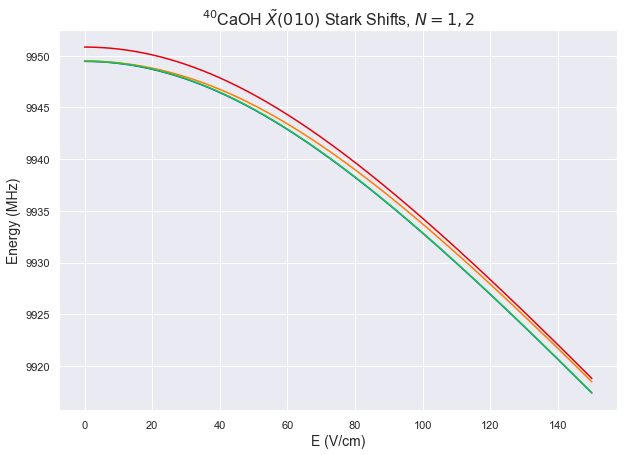

In [57]:
Nall.StarkMap(Ez,1e-3,plot=True,idx=Nall.select_q({'N':1,'J':0.5},parity='-'))

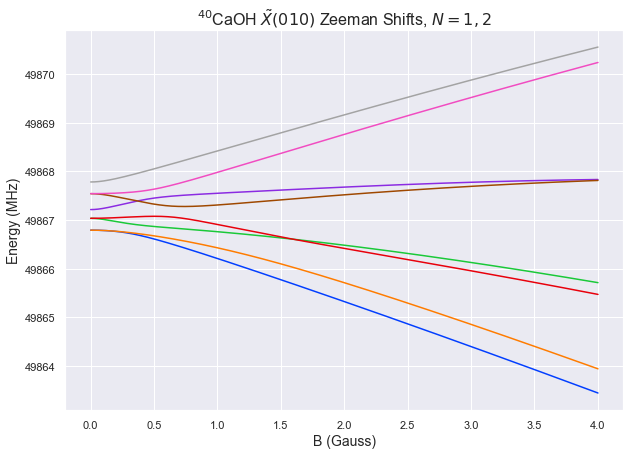

In [61]:
Nall.ZeemanMap(Bz,0,plot=True,idx=Nall.select_q({'N':2,'J':1.5},parity='+'))

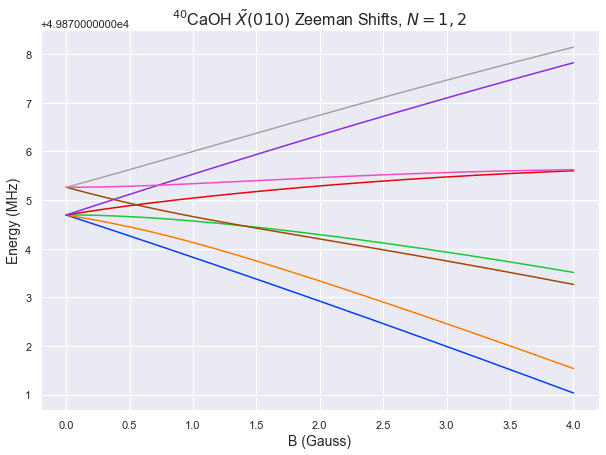

In [76]:
Nall.ZeemanMap(Bz,0,plot=True,idx=Nall.select_q({'N':2,'J':1.5},parity='+'))

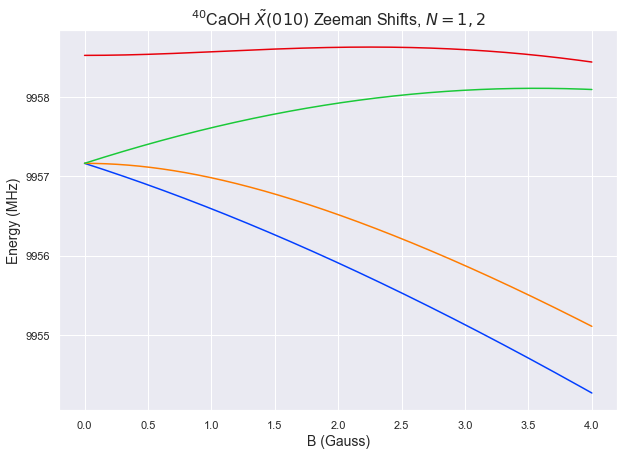

In [78]:
Nall.ZeemanMap(Bz,0,plot=True,idx=Nall.select_q({'N':1,'J':0.5},parity='-'))

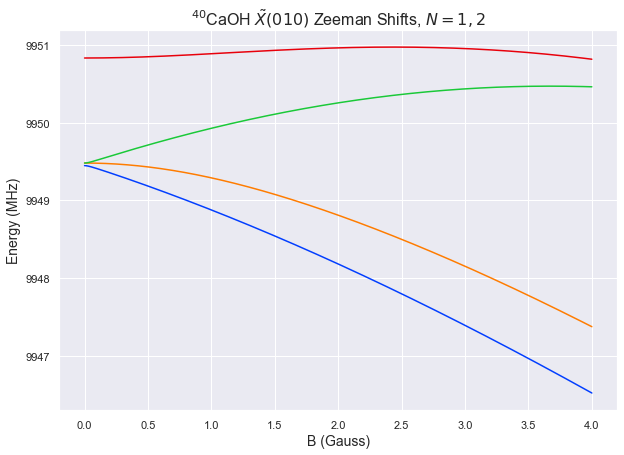

In [146]:
Nall.ZeemanMap(Bz,0,plot=True,idx=Nall.select_q({'N':1,'J':0.5},parity='-'))

In [78]:
Nall.select_q({'N':1})

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23])

In [82]:
TDM_E[0,3,13]

0.40820730631801766

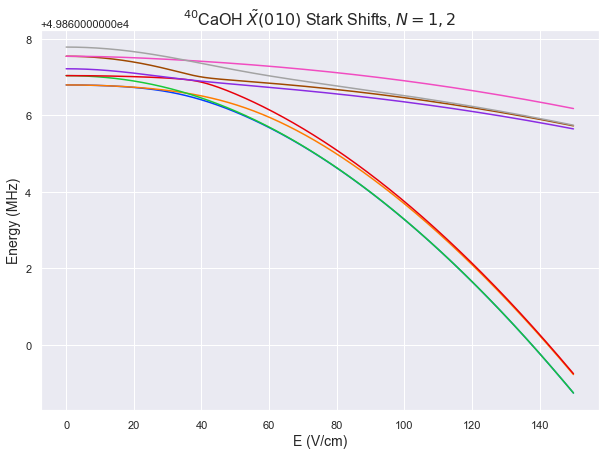

In [60]:
Nall.StarkMap(Ez,1e-4,plot=True,idx=Nall.select_q({'N':2,'J':1.5},parity='+'))

In [129]:
N1 = MoleculeLevels.initialize_state('CaOH','40','X010',[1],M_values = 'all',I=[0,1/2],S=1/2,round=8,P_values=[1/2,3/2],trap=True,theta_num=0)

In [131]:
Trans_B1 = {}
for _B in Bscan:
    N1.StarkMap(Ez,_B,plot=False)
    Trans_B1[_B] = {#'all': transitions_E(Nall,Nall,Escan,dipole='abs',Debye=1.465),
                   'x': transitions_E(N1,N1,Escan,dipole='x',Debye=1.465,offset=False),
                   'z': transitions_E(N1,N1,Escan,dipole='z',Debye=1.465,offset=False),
                   #'x+z': transitions_E(Nall,Nall,Escan,dipole='x+z',Debye=1.465),
                  }
#output of transitions_E is TDM_E, dE_E, table_E

Using B (G) field of 0.001
0.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.0005145100003574044
0.0010292899987689452
1.3632248800004163
26.004052950000187
26.005268240000078
26.006483469998784
27.608223589999398
27.608924340000158
27.60962499999914
27.610325569999986
27.61102605999986
43.05999999999949
43.06051450999985
43.06102929000008
44.42322487999991
69.06405294999968
69.06526823999957
69.0664834700001
70.66822358999889
70.66892433999965
70.66962500000045
70.67032556999948
70.67102605999935
-0.0005145100003574044
0.0
0.0005147799984115409
1.362710370000059
26.00353843999983
26.00475372999972
26.005968959998427
27.60770907999904
27.6084098299998
27.609110489998784
27.60981105999963
27.6105115499995
43.05948548999

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.005686270000296645
0.0010369699994043913
1.3640478600009374
25.980504270000893
25.998237269999663
25.982946629999788
27.576877920000697
27.594820020000043
27.601158159999613
27.59621487000004
27.57968038999934
43.190334240000084
43.18803855999977
43.19135497000025
44.54794631000004
69.17388331000075
69.13521127000058
69.17628746000082
70.79448086000048
70.75114842000039
70.73658597999929
70.7525697000001
70.79728333000094
-0.005686270000296645
0.0
-0.004649300000892254
1.3583615900006407
25.974818000000596
25.992550999999366
25.97726035999949
27.5711916500004
27.589133749999746
27.595471889999317
27.590528599999743
27.573994119999043
43.18464796999979
43.18235228999947
43.18566869999995
44.542260039999746
69.16819704000045
69.12952500000029
69.17060119000053
70.78879459000018

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.021043220000137808
0.001059739999618614
1.3664666099994065
25.910999330000777
25.98099990999981
25.913476370000353
27.48442747000081
27.557451009999568
27.580495860000156
27.558827779999774
27.487229930000467
43.57623516999956
43.56528375000016
43.57723070999964
44.91779185000087
69.49638752999999
69.34520302000055
69.49870365999959
71.17142799999965
71.0031096900002
70.93761418000031
71.00459996000063
71.17423047000011
-0.021043220000137808
0.0
-0.019983480000519194
1.3454233899992687
25.88995611000064
25.95995668999967
25.892433150000215
27.463384250000672
27.53640778999943
27.559452640000018
27.537784559999636
27.46618671000033
43.555191949999426
43.544240530000025
43.5561874899995
44.89674863000073
69.47534430999985
69.32415980000042
69.47766043999945
71.15038477999951
70

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.04611561999990954
0.0010967800008074846
1.370334940000248
25.798322430000553
25.964253800000733
25.80085345000043
27.33543416000066
27.51089275999948
27.56057630000032
27.512243880000824
27.3382366299993
44.20354052999937
44.177491599999485
44.20449544999974
45.52061590999983
70.00915159000033
69.69570802999988
70.01129380999919
71.79375210999933
71.44227139000031
71.27312540000094
71.4439036599997
71.79655457999979
-0.04611561999990954
0.0
-0.045018839999102056
1.3242193200003385
25.752206810000644
25.918138180000824
25.754737830000522
27.28931854000075
27.46477713999957
27.51446068000041
27.466128260000914
27.29212100999939
44.15742490999946
44.131375979999575
44.15837982999983
45.47450028999992
69.96303597000042
69.64959240999997
69.96517818999928
71.74763648999942
71.3961

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.08013890999973228
0.0011467999993328704
1.375423370000135
25.645634009999412
25.9633207400002
25.648230290000356
27.136888369999724
27.476108459999523
27.559390540000095
27.477434710001035
27.139690840000185
45.05184053999983
45.003470460000244
45.05274078000002
46.33850060000077
70.67326153000067
70.18742509000003
70.6751277000003
72.65309716000047
72.09973661000004
71.74374893999993
72.10159987999941
72.65589962000013
-0.08013890999973228
0.0
-0.07899211000039941
1.2952844600004028
25.56549509999968
25.883181830000467
25.568091380000624
27.056749459999992
27.39596954999979
27.479251630000363
27.397295800001302
27.059551930000453
44.9717016300001
44.92333155000051
44.97260187000029
46.25836169000104
70.59312262000094
70.1072861800003
70.59498879000057
72.57295825000074
72.01

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.1220840500009217
0.001208069999847794
1.3814392000003863
25.45594601999983
25.995457110000643
25.458607149999807
26.897433420001107
27.477314900001147
27.59641572000146
27.47862837000139
26.90023588999975
46.09764873000131
46.01895524000065
46.09848125999997
47.35021003000111
71.44490340999982
70.82118326000091
71.4464372600014
73.73869405000005
73.00920034000046
72.35024178999993
73.01133742000093
73.74149651000153
-0.1220840500009217
0.0
-0.12087598000107391
1.2593551499994646
25.333861969998907
25.87337305999972
25.336523099998885
26.775349370000185
27.355230850000225
27.474331670000538
27.356544320000467
26.778151839998827
45.97556468000039
45.89687118999973
45.97639720999905
47.228125980000186
71.3228193599989
70.69909920999999
71.32435321000048
73.61660999999913
72.8871

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.17070376000083343
0.0012785599992639618
1.3880519300000742
25.232946669999365
26.077493880000475
25.235661759999857
26.626513950001026
27.537598130000333
27.689788589999807
27.538920250000956
26.629316410000683
47.316888249999465
47.19922369000051
47.31764056999964
48.533293270000286
72.30185261999941
71.59781294999993
72.30308705000061
75.03805534000094
74.18106292000084
73.09338561000004
74.1834270899999
75.04085780999958
-0.17070376000083343
0.0
-0.16942520000156946
1.2173481699992408
25.06224290999853
25.90679011999964
25.064957999999024
26.455810190000193
27.3668943699995
27.519084829998974
27.368216490000123
26.45861264999985
47.14618448999863
47.028519929999675
47.146936809998806
48.36258950999945
72.13114885999858
71.4271091899991
72.13238328999978
74.8673515800001
74

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.2245949100015423
0.0013560400002461392
1.3949214399999619
24.98211568000079
26.224201890001495
24.98486919000061
26.333586370001285
27.675372050000078
27.854618770001252
27.67672705000041
26.336388839999927
48.68635664000067
48.52063142000043
48.6870163399999
49.865499430001364
73.2497735900015
72.51800368000113
73.25077409000005
76.53763193000123
75.5966928100006
73.97387822000019
75.59920448000048
76.54043440000169
-0.2245949100015423
0.0
-0.22323887000129616
1.1703265299984196
24.757520769999246
25.999606979999953
24.760274279999066
26.108991459999743
27.450777139998536
27.63002385999971
27.452132139998866
26.111793929998385
48.461761729999125
48.296036509998885
48.46242142999836
49.64090451999982
73.02517867999995
72.29340876999959
73.02617917999851
76.31303701999968
75.3

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.28227404999961436
0.0014382299996213987
1.4017251999994187
24.71074039999985
26.447403199999826
24.7135179600009
26.02748573000099
27.903038079999533
28.10228954000013
27.90444681000008
26.03028819999963
50.184349440000005
49.961274920000506
50.18490399000075
51.325541780001004
74.30328071999975
73.5821589799998
74.30409271999997
78.22336917999928
77.22783488999994
74.99222849000034
77.23043433000021
78.22617164000076
-0.28227404999961436
0.0
-0.28083581999999296
1.1194511499998043
24.428466350000235
26.16512915000021
24.431243910001285
25.745211680001375
27.62076402999992
27.820015490000515
27.622172760000467
25.748014150000017
49.90207539000039
49.67900087000089
49.902629940001134
51.04326773000139
74.02100667000013
73.29988493000019
74.02181867000036
77.94109512999967
76.9

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.34225934999994934
0.0015229300006467383
1.4081814199998917
24.426851039999747
26.75566437999987
24.429642139999487
25.715991479999502
28.227565279999908
28.440416800000094
28.229042349999872
25.718793949999963
51.79078708999987
51.50115113999891
51.79122386999916
52.893421149999995
75.47377572000005
74.7902551799998
75.47442016999958
80.08114129999922
79.04913112000031
76.14865825999914
79.05178315000012
80.08394376999968
-0.34225934999994934
0.0
-0.3407364199993026
1.0659220699999423
24.084591689999797
26.41340502999992
24.087382789999538
25.373732129999553
27.88530592999996
28.098157450000144
27.886782999999923
25.376534600000014
51.44852773999992
51.15889178999896
51.44896451999921
52.551161800000045
75.1315163700001
74.44799582999985
75.13216081999963
79.73888194999927
78

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.4031497100004344
0.0016081100002338644
1.4140651999987313
24.13802106000003
27.15437732999999
24.14081901999998
25.405591179998737
28.65176744999917
28.8731774099997
28.6533213900002
25.408393649999198
53.48713784999927
53.12211504999868
53.48744436999914
54.55052739999883
76.7680510199989
76.14170765000017
76.76853381999899
82.09707191999951
81.03976890000013
77.44300918999943
81.04245377000007
82.09987438999997
-0.4031497100004344
0.0
-0.40154160000020056
1.0109154899982968
23.734871349999594
26.751227619999554
23.737669309999546
25.002441469998303
28.248617739998735
28.470027699999264
28.250171679999767
25.005243939998763
53.08398813999884
52.71896533999825
53.084294659998704
54.14737768999839
76.36490130999846
75.73855793999974
76.36538410999856
81.69392220999907
80.63661

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.4636918800006242
0.0016920399993978208
1.4192165299991757
23.850630589999128
27.646070180000606
23.853431530000307
25.101412429999982
29.1754606100003
29.40181359000053
29.177095159999226
25.104214900000443
55.25631712999893
54.80781030000071
55.25648148000073
56.27967460000036
78.18965261999983
77.63524727999902
78.18997207999928
84.25776179999957
83.18227692999972
78.87464908000038
83.18498331999945
84.26056425999923
-0.4636918800006242
0.0
-0.4619998400012264
0.9555246499985515
23.386938709998503
27.182378299999982
23.389739649999683
24.637720549999358
28.711768729999676
28.938121709999905
28.7134032799986
24.64052301999982
54.79262524999831
54.344118420000086
54.792789600000106
55.81598271999974
77.72596073999921
77.1715553999984
77.72628019999866
83.79406991999895
82.718

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.5228281100007734
0.0017733200002112426
1.4235402800004522
23.569618069999706
28.230837889999748
23.572419850001097
24.807280290000563
29.796317750000526
30.02519809000114
29.798033250001026
24.810082760001023
57.082646439999735
56.543643050001265
57.08265782000126
58.06515165000019
79.74001576000046
79.26881133999996
79.74016699000094
86.5504463899997
85.46146894000049
80.44237287000033
85.46419007000077
86.55324886000017
-0.5228281100007734
0.0
-0.5210547900005622
0.9007121699996787
23.046789959998932
27.708009779998974
23.049591740000324
24.28445217999979
29.273489639999752
29.502369980000367
29.275205140000253
24.28725465000025
56.55981832999896
56.02081494000049
56.559829710000486
57.542323539999416
79.21718764999969
78.74598322999918
79.21733888000017
86.02761827999893
8

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.5797212400011631
0.0018508900011511287
1.4269998899999337
23.29853383000045
28.906818410001506
23.30133534000015
24.525855519999823
30.510495260001335
30.740392730000167
30.51228975000049
24.528657990000283
58.95189054000002
58.31680286000119
58.95173987000089
59.89281201000085
81.41908891999992
81.03945790000034
81.41906645000017
88.9631014000006
87.86383360000036
82.14429920000111
87.86656524000136
88.96590387000106
-0.5797212400011631
0.0
-0.577870350000012
0.8472786499987706
22.71881258999929
28.327097170000343
22.721614099998988
23.94613427999866
29.93077402000017
30.160671489999004
29.932568509999328
23.94893674999912
58.37216929999886
57.737081620000026
58.37201862999973
59.31309076999969
80.83936767999876
80.45973665999918
80.83934520999901
88.38338015999943
87.284112

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.6337577600006625
0.0019240300007368205
1.4296068200001173
23.039731169999868
29.67066461000104
23.042531869999948
24.258814490000077
31.313117870000497
31.54316136000125
31.314987910000127
24.261616960000538
60.8513537200015
60.11630112000057
60.85103420000087
61.75018881000142
83.22562709000158
82.94331672000044
83.22542642000008
91.48450870000124
90.37720681000064
83.97777208000116
90.37994618999983
91.48731116999988
-0.6337577600006625
0.0
-0.6318337299999257
0.7958490599994548
22.405973409999206
29.036906850000378
22.408774109999285
23.625056729999415
30.679360109999834
30.909403600000587
30.681230149999465
23.627859199999875
60.217595960000835
59.48254335999991
60.217276440000205
61.116431050000756
82.59186933000092
82.30955895999978
82.59166865999941
90.85075094000058
8

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.0005145100003574044
0.0010292899987689452
1.3632248800004163
26.004052950000187
26.005268240000078
26.006483469998784
27.608223589999398
27.608924340000158
27.60962499999914
27.610325569999986
27.61102605999986
43.05999999999949
43.06051450999985
43.06102929000008
44.42322487999991
69.06405294999968
69.06526823999957
69.0664834700001
70.66822358999889
70.66892433999965
70.66962500000045
70.67032556999948
70.67102605999935
-0.0005145100003574044
0.0
0.0005147799984115409
1.362710370000059
26.00353843999983
26.00475372999972
26.005968959998427
27.60770907999904
27.6084098299998
27.609110489998784
27.60981105999963
27.6105115499995
43.05948548999913
43.05999999999949
43.06051477999972
44.42271036999955
69.06353843999932
69.06475372999921
69.06596895999974
70.66770907999853
70.66

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.005686270000296645
0.0010369699994043913
1.3640478600009374
25.980504270000893
25.998237269999663
25.982946629999788
27.576877920000697
27.594820020000043
27.601158159999613
27.59621487000004
27.57968038999934
43.190334240000084
43.18803855999977
43.19135497000025
44.54794631000004
69.17388331000075
69.13521127000058
69.17628746000082
70.79448086000048
70.75114842000039
70.73658597999929
70.7525697000001
70.79728333000094
-0.005686270000296645
0.0
-0.004649300000892254
1.3583615900006407
25.974818000000596
25.992550999999366
25.97726035999949
27.5711916500004
27.589133749999746
27.595471889999317
27.590528599999743
27.573994119999043
43.18464796999979
43.18235228999947
43.18566869999995
44.542260039999746
69.16819704000045
69.12952500000029
69.17060119000053
70.78879459000018

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.021043220000137808
0.001059739999618614
1.3664666099994065
25.910999330000777
25.98099990999981
25.913476370000353
27.48442747000081
27.557451009999568
27.580495860000156
27.558827779999774
27.487229930000467
43.57623516999956
43.56528375000016
43.57723070999964
44.91779185000087
69.49638752999999
69.34520302000055
69.49870365999959
71.17142799999965
71.0031096900002
70.93761418000031
71.00459996000063
71.17423047000011
-0.021043220000137808
0.0
-0.019983480000519194
1.3454233899992687
25.88995611000064
25.95995668999967
25.892433150000215
27.463384250000672
27.53640778999943
27.559452640000018
27.537784559999636
27.46618671000033
43.555191949999426
43.544240530000025
43.5561874899995
44.89674863000073
69.47534430999985
69.32415980000042
69.47766043999945
71.15038477999951
70

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.04611561999990954
0.0010967800008074846
1.370334940000248
25.798322430000553
25.964253800000733
25.80085345000043
27.33543416000066
27.51089275999948
27.56057630000032
27.512243880000824
27.3382366299993
44.20354052999937
44.177491599999485
44.20449544999974
45.52061590999983
70.00915159000033
69.69570802999988
70.01129380999919
71.79375210999933
71.44227139000031
71.27312540000094
71.4439036599997
71.79655457999979
-0.04611561999990954
0.0
-0.045018839999102056
1.3242193200003385
25.752206810000644
25.918138180000824
25.754737830000522
27.28931854000075
27.46477713999957
27.51446068000041
27.466128260000914
27.29212100999939
44.15742490999946
44.131375979999575
44.15837982999983
45.47450028999992
69.96303597000042
69.64959240999997
69.96517818999928
71.74763648999942
71.3961

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.08013890999973228
0.0011467999993328704
1.375423370000135
25.645634009999412
25.9633207400002
25.648230290000356
27.136888369999724
27.476108459999523
27.559390540000095
27.477434710001035
27.139690840000185
45.05184053999983
45.003470460000244
45.05274078000002
46.33850060000077
70.67326153000067
70.18742509000003
70.6751277000003
72.65309716000047
72.09973661000004
71.74374893999993
72.10159987999941
72.65589962000013
-0.08013890999973228
0.0
-0.07899211000039941
1.2952844600004028
25.56549509999968
25.883181830000467
25.568091380000624
27.056749459999992
27.39596954999979
27.479251630000363
27.397295800001302
27.059551930000453
44.9717016300001
44.92333155000051
44.97260187000029
46.25836169000104
70.59312262000094
70.1072861800003
70.59498879000057
72.57295825000074
72.01

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.1220840500009217
0.001208069999847794
1.3814392000003863
25.45594601999983
25.995457110000643
25.458607149999807
26.897433420001107
27.477314900001147
27.59641572000146
27.47862837000139
26.90023588999975
46.09764873000131
46.01895524000065
46.09848125999997
47.35021003000111
71.44490340999982
70.82118326000091
71.4464372600014
73.73869405000005
73.00920034000046
72.35024178999993
73.01133742000093
73.74149651000153
-0.1220840500009217
0.0
-0.12087598000107391
1.2593551499994646
25.333861969998907
25.87337305999972
25.336523099998885
26.775349370000185
27.355230850000225
27.474331670000538
27.356544320000467
26.778151839998827
45.97556468000039
45.89687118999973
45.97639720999905
47.228125980000186
71.3228193599989
70.69909920999999
71.32435321000048
73.61660999999913
72.8871

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.17070376000083343
0.0012785599992639618
1.3880519300000742
25.232946669999365
26.077493880000475
25.235661759999857
26.626513950001026
27.537598130000333
27.689788589999807
27.538920250000956
26.629316410000683
47.316888249999465
47.19922369000051
47.31764056999964
48.533293270000286
72.30185261999941
71.59781294999993
72.30308705000061
75.03805534000094
74.18106292000084
73.09338561000004
74.1834270899999
75.04085780999958
-0.17070376000083343
0.0
-0.16942520000156946
1.2173481699992408
25.06224290999853
25.90679011999964
25.064957999999024
26.455810190000193
27.3668943699995
27.519084829998974
27.368216490000123
26.45861264999985
47.14618448999863
47.028519929999675
47.146936809998806
48.36258950999945
72.13114885999858
71.4271091899991
72.13238328999978
74.8673515800001
74

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.2245949100015423
0.0013560400002461392
1.3949214399999619
24.98211568000079
26.224201890001495
24.98486919000061
26.333586370001285
27.675372050000078
27.854618770001252
27.67672705000041
26.336388839999927
48.68635664000067
48.52063142000043
48.6870163399999
49.865499430001364
73.2497735900015
72.51800368000113
73.25077409000005
76.53763193000123
75.5966928100006
73.97387822000019
75.59920448000048
76.54043440000169
-0.2245949100015423
0.0
-0.22323887000129616
1.1703265299984196
24.757520769999246
25.999606979999953
24.760274279999066
26.108991459999743
27.450777139998536
27.63002385999971
27.452132139998866
26.111793929998385
48.461761729999125
48.296036509998885
48.46242142999836
49.64090451999982
73.02517867999995
72.29340876999959
73.02617917999851
76.31303701999968
75.3

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.28227404999961436
0.0014382299996213987
1.4017251999994187
24.71074039999985
26.447403199999826
24.7135179600009
26.02748573000099
27.903038079999533
28.10228954000013
27.90444681000008
26.03028819999963
50.184349440000005
49.961274920000506
50.18490399000075
51.325541780001004
74.30328071999975
73.5821589799998
74.30409271999997
78.22336917999928
77.22783488999994
74.99222849000034
77.23043433000021
78.22617164000076
-0.28227404999961436
0.0
-0.28083581999999296
1.1194511499998043
24.428466350000235
26.16512915000021
24.431243910001285
25.745211680001375
27.62076402999992
27.820015490000515
27.622172760000467
25.748014150000017
49.90207539000039
49.67900087000089
49.902629940001134
51.04326773000139
74.02100667000013
73.29988493000019
74.02181867000036
77.94109512999967
76.9

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.34225934999994934
0.0015229300006467383
1.4081814199998917
24.426851039999747
26.75566437999987
24.429642139999487
25.715991479999502
28.227565279999908
28.440416800000094
28.229042349999872
25.718793949999963
51.79078708999987
51.50115113999891
51.79122386999916
52.893421149999995
75.47377572000005
74.7902551799998
75.47442016999958
80.08114129999922
79.04913112000031
76.14865825999914
79.05178315000012
80.08394376999968
-0.34225934999994934
0.0
-0.3407364199993026
1.0659220699999423
24.084591689999797
26.41340502999992
24.087382789999538
25.373732129999553
27.88530592999996
28.098157450000144
27.886782999999923
25.376534600000014
51.44852773999992
51.15889178999896
51.44896451999921
52.551161800000045
75.1315163700001
74.44799582999985
75.13216081999963
79.73888194999927
78

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.4031497100004344
0.0016081100002338644
1.4140651999987313
24.13802106000003
27.15437732999999
24.14081901999998
25.405591179998737
28.65176744999917
28.8731774099997
28.6533213900002
25.408393649999198
53.48713784999927
53.12211504999868
53.48744436999914
54.55052739999883
76.7680510199989
76.14170765000017
76.76853381999899
82.09707191999951
81.03976890000013
77.44300918999943
81.04245377000007
82.09987438999997
-0.4031497100004344
0.0
-0.40154160000020056
1.0109154899982968
23.734871349999594
26.751227619999554
23.737669309999546
25.002441469998303
28.248617739998735
28.470027699999264
28.250171679999767
25.005243939998763
53.08398813999884
52.71896533999825
53.084294659998704
54.14737768999839
76.36490130999846
75.73855793999974
76.36538410999856
81.69392220999907
80.63661

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.4636918800006242
0.0016920399993978208
1.4192165299991757
23.850630589999128
27.646070180000606
23.853431530000307
25.101412429999982
29.1754606100003
29.40181359000053
29.177095159999226
25.104214900000443
55.25631712999893
54.80781030000071
55.25648148000073
56.27967460000036
78.18965261999983
77.63524727999902
78.18997207999928
84.25776179999957
83.18227692999972
78.87464908000038
83.18498331999945
84.26056425999923
-0.4636918800006242
0.0
-0.4619998400012264
0.9555246499985515
23.386938709998503
27.182378299999982
23.389739649999683
24.637720549999358
28.711768729999676
28.938121709999905
28.7134032799986
24.64052301999982
54.79262524999831
54.344118420000086
54.792789600000106
55.81598271999974
77.72596073999921
77.1715553999984
77.72628019999866
83.79406991999895
82.718

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.5228281100007734
0.0017733200002112426
1.4235402800004522
23.569618069999706
28.230837889999748
23.572419850001097
24.807280290000563
29.796317750000526
30.02519809000114
29.798033250001026
24.810082760001023
57.082646439999735
56.543643050001265
57.08265782000126
58.06515165000019
79.74001576000046
79.26881133999996
79.74016699000094
86.5504463899997
85.46146894000049
80.44237287000033
85.46419007000077
86.55324886000017
-0.5228281100007734
0.0
-0.5210547900005622
0.9007121699996787
23.046789959998932
27.708009779998974
23.049591740000324
24.28445217999979
29.273489639999752
29.502369980000367
29.275205140000253
24.28725465000025
56.55981832999896
56.02081494000049
56.559829710000486
57.542323539999416
79.21718764999969
78.74598322999918
79.21733888000017
86.02761827999893
8

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.5797212400011631
0.0018508900011511287
1.4269998899999337
23.29853383000045
28.906818410001506
23.30133534000015
24.525855519999823
30.510495260001335
30.740392730000167
30.51228975000049
24.528657990000283
58.95189054000002
58.31680286000119
58.95173987000089
59.89281201000085
81.41908891999992
81.03945790000034
81.41906645000017
88.9631014000006
87.86383360000036
82.14429920000111
87.86656524000136
88.96590387000106
-0.5797212400011631
0.0
-0.577870350000012
0.8472786499987706
22.71881258999929
28.327097170000343
22.721614099998988
23.94613427999866
29.93077402000017
30.160671489999004
29.932568509999328
23.94893674999912
58.37216929999886
57.737081620000026
58.37201862999973
59.31309076999969
80.83936767999876
80.45973665999918
80.83934520999901
88.38338015999943
87.284112

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.6337577600006625
0.0019240300007368205
1.4296068200001173
23.039731169999868
29.67066461000104
23.042531869999948
24.258814490000077
31.313117870000497
31.54316136000125
31.314987910000127
24.261616960000538
60.8513537200015
60.11630112000057
60.85103420000087
61.75018881000142
83.22562709000158
82.94331672000044
83.22542642000008
91.48450870000124
90.37720681000064
83.97777208000116
90.37994618999983
91.48731116999988
-0.6337577600006625
0.0
-0.6318337299999257
0.7958490599994548
22.405973409999206
29.036906850000378
22.408774109999285
23.625056729999415
30.679360109999834
30.909403600000587
30.681230149999465
23.627859199999875
60.217595960000835
59.48254335999991
60.217276440000205
61.116431050000756
82.59186933000092
82.30955895999978
82.59166865999941
90.85075094000058
8

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.09772995999992418
0.20581938000032096
1.4702871600002254
25.864523509999344
26.108742059999713
26.350388639999437
27.434265679999953
27.579481130000204
27.721424139999726
27.859929000000193
27.994759310000518
43.05999999999949
43.157729959999415
43.26581937999981
44.530287159999716
68.92452351000065
69.16874206000102
69.41038864000075
70.49426567999944
70.6394811299997
70.78142414000104
70.91992899999968
71.05475931000001
-0.09772995999992418
0.0
0.10808942000039679
1.3725572000003012
25.76679354999942
26.01101209999979
26.252658679999513
27.33653572000003
27.48175117000028
27.623694179999802
27.76219904000027
27.897029350000594
42.96227003999957
43.05999999999949
43.16808941999989
44.43255719999979
68.82679355000073
69.0710121000011
69.31265868000082
70.39653571999952
70.541

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.10354686999926344
0.2073553800000809
1.4719913299995824
25.840641490000053
26.10238224999921
26.328876120000132
27.403677270000117
27.566667679999227
27.713775320000423
27.845834649999233
27.964170899998862
43.1919427899993
43.286105310000494
43.396049949999
44.655667429999085
69.0375356099994
69.23951742999998
69.51812272999996
70.6212802099999
70.72067627999968
70.84908517999975
71.00513734000015
71.18177384000046
-0.10354686999926344
0.0
0.10380851000081748
1.368444460000319
25.73709462000079
25.998835379999946
26.22532925000087
27.300130400000853
27.463120809999964
27.61022845000116
27.74228777999997
27.8606240299996
43.08839592000004
43.18255844000123
43.29250307999973
44.55212055999982
68.93398874000013
69.13597056000071
69.4145758600007
70.51773334000063
70.61712941000

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.12080531999890809
0.21190838999973494
1.4770332199987024
25.77019065999957
26.087129149998873
26.26537370999904
27.313471049999862
27.53303718999996
27.69554393999897
27.80857583999932
27.873964669999623
43.58259106999867
43.665870650000215
43.78165918999912
45.02746528999887
69.37042090999967
69.45197645000007
69.83341422000012
71.0004715799987
70.9686654699999
71.0521876699986
71.26691421999931
71.56096520999927
-0.12080531999890809
0.0
0.09110307000082685
1.3562278999997943
25.649385340000663
25.966323829999965
26.14456839000013
27.192665730000954
27.41223187000105
27.574738620000062
27.687770520000413
27.753159350000715
43.46178574999976
43.54506533000131
43.66085387000021
44.906659969999964
69.24961559000076
69.33117113000117
69.71260890000121
70.8796662599998
70.8478601

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.14893574999950943
0.21931643999960215
1.4852062800000567
25.65621142999953
26.0735950899998
26.162221709999358
27.168127869999807
27.492195769998943
27.67959793999944
27.762572189998536
27.72862148999957
44.21757597999931
44.28216818999863
44.40851984999972
45.63346559999991
69.90317297000001
69.80649555999844
70.33152551999956
71.62644581999848
71.39835852999931
71.39107152999895
71.72486683999887
72.18693944000006
-0.14893574999950943
0.0
0.07038069000009273
1.3362705300005473
25.50727568000002
25.92465934000029
26.01328595999985
27.019192120000298
27.343260019999434
27.53066218999993
27.613636439999027
27.57968574000006
44.0686402299998
44.13323243999912
44.25958410000021
45.4845298500004
69.7542372200005
69.65755980999893
70.18258977000005
71.47751006999897
71.24942277999

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.18701372999930754
0.22931928999969386
1.4961834999994608
25.50247164999928
26.07696759999999
26.02158238999982
26.974508059998698
27.46421268999984
27.68380985999829
27.729563609998877
27.535001689999262
45.076216379999096
45.113646539999536
45.25622350999947
46.45564328999899
70.59909182999945
70.30363073999979
70.97264723999979
72.49071684999944
72.03840967999895
71.866245539999
72.41070626999863
73.0512104699992
-0.18701372999930754
0.0
0.04230556000038632
1.3091697700001532
25.31545791999997
25.88995387000068
25.834568660000514
26.78749432999939
27.277198960000533
27.496796129998984
27.54254987999957
27.347987959999955
44.88920264999979
44.92663281000023
45.069209780000165
46.26862955999968
70.41207810000014
70.11661701000048
70.78563351000048
72.30370312000014
71.8513959

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.23380017999988922
0.24157317000026524
1.5095421000005445
25.312860199999704
26.114330759999575
25.844999310000276
26.741083520000757
27.472124940000867
27.727491830000872
27.73486159999993
27.301577149999503
46.13474748000044
46.13582819000112
46.30121296000107
47.472628800000166
71.41085618000034
70.9440196200012
71.71831245000067
73.5823441499997
72.92570947999957
72.47831038000004
73.35240333000002
74.14283776999946
-0.23380017999988922
0.0
0.007772990000376012
1.2757419200006552
25.079060019999815
25.880530579999686
25.611199130000387
26.507283340000868
27.238324760000978
27.493691650000983
27.501061420000042
27.067776969999613
45.90094730000055
45.90202801000123
46.06741278000118
47.23882862000028
71.17705600000045
70.71021944000131
71.48451227000078
73.34854396999981
72

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.2878011399989191
0.25567108999894117
1.524795429999358
25.09180384999854
26.202319129999523
25.634782159999304
26.477096560000064
27.537994129999788
27.828575619998446
27.802412269998968
27.037590179999825
47.36883696999939
47.32373616999939
47.519261319999714
48.6618231199991
72.30669766999927
71.72826068999893
72.55419518999952
74.88863794999997
74.07982938999885
73.22786791999897
74.55201809999926
75.44913157999872
-0.2878011399989191
0.0
-0.03213004999997793
1.236994290000439
24.804002709999622
25.914517990000604
25.346981020000385
26.189295420001145
27.25019299000087
27.540774479999527
27.51461113000005
26.749789040000906
47.081035830000474
47.03593503000047
47.231460180000795
48.37402198000018
72.01889653000035
71.44045955000001
72.2663940500006
74.60083681000106
73.792

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.3473466699997516
0.27116761000070255
1.5414289500004088
24.84499543000129
26.355497750000723
25.3956820300009
26.19178285000089
27.679763620000813
28.00193708000006
27.95073450000018
26.752276479999637
48.75505433000035
48.65344304999962
48.886957300001086
50.00082413000018
73.28735505999975
72.65678108000066
73.48783465000088
76.39582841000083
75.48664869999993
74.11542752999958
75.98856945999978
76.95632203999958
-0.3473466699997516
0.0
-0.07617905999904906
1.1940822800006572
24.49764876000154
26.00815108000097
25.048335360001147
25.84443618000114
27.33241695000106
27.65459041000031
27.60338783000043
26.404929809999885
48.4077076600006
48.30609637999987
48.539610630001334
49.65347746000043
72.94000839
72.3094344100009
73.14048798000113
76.04848174000108
75.13930203000018
73

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.41068448000078206
0.2876060200014763
1.5589361700003792
24.579412020000746
26.585487520000243
25.13491888000135
25.893751950001388
27.909917770000902
28.258711630000107
28.191623210001126
26.454245580000133
50.27148640999985
50.10275137000099
50.38236335000147
51.468199840001034
74.36885172000075
73.72970220000025
74.53146599000138
78.0896354000015
77.11606509000012
75.14131735000046
77.63570872000128
78.65012902000126
-0.41068448000078206
0.0
-0.12307845999930578
1.1482516899995971
24.168727539999963
26.17480303999946
24.72423440000057
25.483067470000606
27.49923329000012
27.848027149999325
27.780938730000344
26.04356109999935
49.86080192999907
49.692066890000206
49.97167887000069
51.05751536000025
73.95816723999997
73.31901771999947
74.1207815100006
77.67895092000072
76.705

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.4760796200007462
0.30454500000087137
1.5768501500006096
24.30253193000135
26.900669990000097
24.86075073000029
25.590566220000255
28.235779540000294
28.60626902000149
28.531150190001426
26.15105985000082
51.89785284000027
51.65137261000018
51.98517963000086
53.043817580000905
75.56502499999988
74.94670903000042
75.69403812000019
79.95571603999997
78.93983963000028
76.30560224000146
79.47009609000088
80.51620967000053
-0.4760796200007462
0.0
-0.17153461999987485
1.1007705299998634
23.826452310000604
26.42459036999935
24.384671109999545
25.11448659999951
27.759699919999548
28.130189400000745
28.05507057000068
25.674980230000074
51.42177321999952
51.175292989999434
51.50910001000011
52.56773796000016
75.08894537999913
74.47062940999967
75.21795849999944
79.47963641999922
78.4637

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.541909300000043
0.321581829999559
1.5947671699996135
24.021386009999333
27.306276490000528
24.580978940000932
25.288515939999343
28.660537230000045
29.048556530000496
28.97128200000043
25.849009569999907
53.615418159999535
53.280903720000424
53.676699980000194
54.70894806999968
76.88417002999995
76.30692592000014
76.98080671000025
81.97999669000092
80.93521671999952
77.6080044900009
81.4720932399996
82.54049031000068
-0.541909300000043
0.0
-0.22032747000048403
1.0528578699995705
23.47947670999929
26.764367190000485
24.03906964000089
24.7466066399993
28.118627930000002
28.506647230000453
28.429372700000386
25.307100269999864
53.07350885999949
52.73899442000038
53.13479068000015
54.167038769999635
76.34226072999991
75.7650166200001
76.43889741000021
81.43808739000087
80.3933074

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.6067415100005746
0.3383697799999936
1.6123602999996365
23.741926930000773
27.804703640000298
24.302115380000032
24.992559520000214
29.184297089999745
29.5866151299997
29.511165940000865
25.55305315000078
55.40688120999948
54.97477339999932
55.43973673999972
56.44629969000016
78.33052925999982
77.8088010800002
78.39447536999978
84.1489088899998
83.08359933999964
79.04782005000015
83.62480848000087
84.70940250999956
-0.6067415100005746
0.0
-0.268371730000581
1.0056187899990618
23.135185420000198
27.197962129999723
23.695373869999457
24.38581800999964
28.57755557999917
28.979873619999125
28.90442443000029
24.946311640000204
54.80013969999891
54.36803188999875
54.83299522999914
55.839558179999585
77.72378774999925
77.20205956999962
77.78773385999921
83.54216737999923
82.476857829

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.6693894999989425
0.3546281499984616
1.6293829599999299
23.468790569999328
28.39594537999983
24.029147289998946
24.706385640000008
29.804928669998844
30.219152059999033
30.147989679999228
25.26687925999977
57.25632590999885
56.718226420000065
57.25859616999878
58.240066159998605
79.90577139999914
79.45000436999908
79.93606397999974
86.44955173000017
85.36915106000015
80.62382378999973
85.91332641000008
87.01004535999891
-0.6693894999989425
0.0
-0.3147613500004809
0.9599934600009874
22.799401070000386
27.726555880000888
23.359757790000003
24.036996140001065
29.135539169999902
29.54976256000009
29.478600180000285
24.597489760000826
56.58693640999991
56.04883692000112
56.58920666999984
57.57067665999966
79.2363819000002
78.78061487000014
79.2666744800008
85.78016223000122
84.6997

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.7289383400002407
0.37014526999882946
1.6456641099994158
23.20532619000005
29.078067769998597
23.765628709999874
24.43255267999848
30.518713779998507
30.94310251999923
30.877575219999926
24.993046309999045
59.149252969999
58.49834839999858
59.11912160999964
60.076012640000044
81.60982657999921
81.22734820999904
81.60537600999851
88.86979857000006
87.77797422000003
82.33416416999899
88.32426200999907
89.43029218999982
-0.7289383400002407
0.0
-0.35879307000141125
0.9167257699991751
22.47638784999981
28.349129429998356
23.036690369999633
23.70361433999824
29.789775439998266
30.21416417999899
30.148636879999685
24.264107969998804
58.42031462999876
57.769410059998336
58.3901832699994
59.347074299999804
80.88088823999897
80.4984098699988
80.87643766999827
88.14086022999982
87.049035

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.7847452299993165
0.38477545000023383
1.6610978200005775
22.953761009999653
29.847677809999368
23.5139013299995
24.17266697999912
31.32085533999998
31.754141620000155
31.69482934000007
24.7331606000007
61.07267565999973
60.3041016799998
61.00878453000041
61.94158788999994
83.44129111999973
83.13674541999899
83.40120450999893
91.39836119000029
90.29767098000048
84.17625636000048
90.84551483999894
91.95885481000005
-0.7847452299993165
0.0
-0.3999697799990827
0.876352590001261
22.169015780000336
29.06293258000005
22.729156100000182
23.387921749999805
30.536110110000664
30.96939639000084
30.910084110000753
23.948415370001385
60.287930430000415
59.51935645000049
60.224039300001095
61.15684266000062
82.65654589000042
82.35200018999967
82.61645927999962
90.61361596000097
89.512925750

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.09772995999992418
0.20581938000032096
1.4702871600002254
25.864523509999344
26.108742059999713
26.350388639999437
27.434265679999953
27.579481130000204
27.721424139999726
27.859929000000193
27.994759310000518
43.05999999999949
43.157729959999415
43.26581937999981
44.530287159999716
68.92452351000065
69.16874206000102
69.41038864000075
70.49426567999944
70.6394811299997
70.78142414000104
70.91992899999968
71.05475931000001
-0.09772995999992418
0.0
0.10808942000039679
1.3725572000003012
25.76679354999942
26.01101209999979
26.252658679999513
27.33653572000003
27.48175117000028
27.623694179999802
27.76219904000027
27.897029350000594
42.96227003999957
43.05999999999949
43.16808941999989
44.43255719999979
68.82679355000073
69.0710121000011
69.31265868000082
70.39653571999952
70.541

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.10354686999926344
0.2073553800000809
1.4719913299995824
25.840641490000053
26.10238224999921
26.328876120000132
27.403677270000117
27.566667679999227
27.713775320000423
27.845834649999233
27.964170899998862
43.1919427899993
43.286105310000494
43.396049949999
44.655667429999085
69.0375356099994
69.23951742999998
69.51812272999996
70.6212802099999
70.72067627999968
70.84908517999975
71.00513734000015
71.18177384000046
-0.10354686999926344
0.0
0.10380851000081748
1.368444460000319
25.73709462000079
25.998835379999946
26.22532925000087
27.300130400000853
27.463120809999964
27.61022845000116
27.74228777999997
27.8606240299996
43.08839592000004
43.18255844000123
43.29250307999973
44.55212055999982
68.93398874000013
69.13597056000071
69.4145758600007
70.51773334000063
70.61712941000

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.12080531999890809
0.21190838999973494
1.4770332199987024
25.77019065999957
26.087129149998873
26.26537370999904
27.313471049999862
27.53303718999996
27.69554393999897
27.80857583999932
27.873964669999623
43.58259106999867
43.665870650000215
43.78165918999912
45.02746528999887
69.37042090999967
69.45197645000007
69.83341422000012
71.0004715799987
70.9686654699999
71.0521876699986
71.26691421999931
71.56096520999927
-0.12080531999890809
0.0
0.09110307000082685
1.3562278999997943
25.649385340000663
25.966323829999965
26.14456839000013
27.192665730000954
27.41223187000105
27.574738620000062
27.687770520000413
27.753159350000715
43.46178574999976
43.54506533000131
43.66085387000021
44.906659969999964
69.24961559000076
69.33117113000117
69.71260890000121
70.8796662599998
70.8478601

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.14893574999950943
0.21931643999960215
1.4852062800000567
25.65621142999953
26.0735950899998
26.162221709999358
27.168127869999807
27.492195769998943
27.67959793999944
27.762572189998536
27.72862148999957
44.21757597999931
44.28216818999863
44.40851984999972
45.63346559999991
69.90317297000001
69.80649555999844
70.33152551999956
71.62644581999848
71.39835852999931
71.39107152999895
71.72486683999887
72.18693944000006
-0.14893574999950943
0.0
0.07038069000009273
1.3362705300005473
25.50727568000002
25.92465934000029
26.01328595999985
27.019192120000298
27.343260019999434
27.53066218999993
27.613636439999027
27.57968574000006
44.0686402299998
44.13323243999912
44.25958410000021
45.4845298500004
69.7542372200005
69.65755980999893
70.18258977000005
71.47751006999897
71.24942277999

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.18701372999930754
0.22931928999969386
1.4961834999994608
25.50247164999928
26.07696759999999
26.02158238999982
26.974508059998698
27.46421268999984
27.68380985999829
27.729563609998877
27.535001689999262
45.076216379999096
45.113646539999536
45.25622350999947
46.45564328999899
70.59909182999945
70.30363073999979
70.97264723999979
72.49071684999944
72.03840967999895
71.866245539999
72.41070626999863
73.0512104699992
-0.18701372999930754
0.0
0.04230556000038632
1.3091697700001532
25.31545791999997
25.88995387000068
25.834568660000514
26.78749432999939
27.277198960000533
27.496796129998984
27.54254987999957
27.347987959999955
44.88920264999979
44.92663281000023
45.069209780000165
46.26862955999968
70.41207810000014
70.11661701000048
70.78563351000048
72.30370312000014
71.8513959

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.23380017999988922
0.24157317000026524
1.5095421000005445
25.312860199999704
26.114330759999575
25.844999310000276
26.741083520000757
27.472124940000867
27.727491830000872
27.73486159999993
27.301577149999503
46.13474748000044
46.13582819000112
46.30121296000107
47.472628800000166
71.41085618000034
70.9440196200012
71.71831245000067
73.5823441499997
72.92570947999957
72.47831038000004
73.35240333000002
74.14283776999946
-0.23380017999988922
0.0
0.007772990000376012
1.2757419200006552
25.079060019999815
25.880530579999686
25.611199130000387
26.507283340000868
27.238324760000978
27.493691650000983
27.501061420000042
27.067776969999613
45.90094730000055
45.90202801000123
46.06741278000118
47.23882862000028
71.17705600000045
70.71021944000131
71.48451227000078
73.34854396999981
72

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.2878011399989191
0.25567108999894117
1.524795429999358
25.09180384999854
26.202319129999523
25.634782159999304
26.477096560000064
27.537994129999788
27.828575619998446
27.802412269998968
27.037590179999825
47.36883696999939
47.32373616999939
47.519261319999714
48.6618231199991
72.30669766999927
71.72826068999893
72.55419518999952
74.88863794999997
74.07982938999885
73.22786791999897
74.55201809999926
75.44913157999872
-0.2878011399989191
0.0
-0.03213004999997793
1.236994290000439
24.804002709999622
25.914517990000604
25.346981020000385
26.189295420001145
27.25019299000087
27.540774479999527
27.51461113000005
26.749789040000906
47.081035830000474
47.03593503000047
47.231460180000795
48.37402198000018
72.01889653000035
71.44045955000001
72.2663940500006
74.60083681000106
73.792

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.3473466699997516
0.27116761000070255
1.5414289500004088
24.84499543000129
26.355497750000723
25.3956820300009
26.19178285000089
27.679763620000813
28.00193708000006
27.95073450000018
26.752276479999637
48.75505433000035
48.65344304999962
48.886957300001086
50.00082413000018
73.28735505999975
72.65678108000066
73.48783465000088
76.39582841000083
75.48664869999993
74.11542752999958
75.98856945999978
76.95632203999958
-0.3473466699997516
0.0
-0.07617905999904906
1.1940822800006572
24.49764876000154
26.00815108000097
25.048335360001147
25.84443618000114
27.33241695000106
27.65459041000031
27.60338783000043
26.404929809999885
48.4077076600006
48.30609637999987
48.539610630001334
49.65347746000043
72.94000839
72.3094344100009
73.14048798000113
76.04848174000108
75.13930203000018
73

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.41068448000078206
0.2876060200014763
1.5589361700003792
24.579412020000746
26.585487520000243
25.13491888000135
25.893751950001388
27.909917770000902
28.258711630000107
28.191623210001126
26.454245580000133
50.27148640999985
50.10275137000099
50.38236335000147
51.468199840001034
74.36885172000075
73.72970220000025
74.53146599000138
78.0896354000015
77.11606509000012
75.14131735000046
77.63570872000128
78.65012902000126
-0.41068448000078206
0.0
-0.12307845999930578
1.1482516899995971
24.168727539999963
26.17480303999946
24.72423440000057
25.483067470000606
27.49923329000012
27.848027149999325
27.780938730000344
26.04356109999935
49.86080192999907
49.692066890000206
49.97167887000069
51.05751536000025
73.95816723999997
73.31901771999947
74.1207815100006
77.67895092000072
76.705

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.4760796200007462
0.30454500000087137
1.5768501500006096
24.30253193000135
26.900669990000097
24.86075073000029
25.590566220000255
28.235779540000294
28.60626902000149
28.531150190001426
26.15105985000082
51.89785284000027
51.65137261000018
51.98517963000086
53.043817580000905
75.56502499999988
74.94670903000042
75.69403812000019
79.95571603999997
78.93983963000028
76.30560224000146
79.47009609000088
80.51620967000053
-0.4760796200007462
0.0
-0.17153461999987485
1.1007705299998634
23.826452310000604
26.42459036999935
24.384671109999545
25.11448659999951
27.759699919999548
28.130189400000745
28.05507057000068
25.674980230000074
51.42177321999952
51.175292989999434
51.50910001000011
52.56773796000016
75.08894537999913
74.47062940999967
75.21795849999944
79.47963641999922
78.4637

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.541909300000043
0.321581829999559
1.5947671699996135
24.021386009999333
27.306276490000528
24.580978940000932
25.288515939999343
28.660537230000045
29.048556530000496
28.97128200000043
25.849009569999907
53.615418159999535
53.280903720000424
53.676699980000194
54.70894806999968
76.88417002999995
76.30692592000014
76.98080671000025
81.97999669000092
80.93521671999952
77.6080044900009
81.4720932399996
82.54049031000068
-0.541909300000043
0.0
-0.22032747000048403
1.0528578699995705
23.47947670999929
26.764367190000485
24.03906964000089
24.7466066399993
28.118627930000002
28.506647230000453
28.429372700000386
25.307100269999864
53.07350885999949
52.73899442000038
53.13479068000015
54.167038769999635
76.34226072999991
75.7650166200001
76.43889741000021
81.43808739000087
80.3933074

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.6067415100005746
0.3383697799999936
1.6123602999996365
23.741926930000773
27.804703640000298
24.302115380000032
24.992559520000214
29.184297089999745
29.5866151299997
29.511165940000865
25.55305315000078
55.40688120999948
54.97477339999932
55.43973673999972
56.44629969000016
78.33052925999982
77.8088010800002
78.39447536999978
84.1489088899998
83.08359933999964
79.04782005000015
83.62480848000087
84.70940250999956
-0.6067415100005746
0.0
-0.268371730000581
1.0056187899990618
23.135185420000198
27.197962129999723
23.695373869999457
24.38581800999964
28.57755557999917
28.979873619999125
28.90442443000029
24.946311640000204
54.80013969999891
54.36803188999875
54.83299522999914
55.839558179999585
77.72378774999925
77.20205956999962
77.78773385999921
83.54216737999923
82.476857829

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.6693894999989425
0.3546281499984616
1.6293829599999299
23.468790569999328
28.39594537999983
24.029147289998946
24.706385640000008
29.804928669998844
30.219152059999033
30.147989679999228
25.26687925999977
57.25632590999885
56.718226420000065
57.25859616999878
58.240066159998605
79.90577139999914
79.45000436999908
79.93606397999974
86.44955173000017
85.36915106000015
80.62382378999973
85.91332641000008
87.01004535999891
-0.6693894999989425
0.0
-0.3147613500004809
0.9599934600009874
22.799401070000386
27.726555880000888
23.359757790000003
24.036996140001065
29.135539169999902
29.54976256000009
29.478600180000285
24.597489760000826
56.58693640999991
56.04883692000112
56.58920666999984
57.57067665999966
79.2363819000002
78.78061487000014
79.2666744800008
85.78016223000122
84.6997

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.7289383400002407
0.37014526999882946
1.6456641099994158
23.20532619000005
29.078067769998597
23.765628709999874
24.43255267999848
30.518713779998507
30.94310251999923
30.877575219999926
24.993046309999045
59.149252969999
58.49834839999858
59.11912160999964
60.076012640000044
81.60982657999921
81.22734820999904
81.60537600999851
88.86979857000006
87.77797422000003
82.33416416999899
88.32426200999907
89.43029218999982
-0.7289383400002407
0.0
-0.35879307000141125
0.9167257699991751
22.47638784999981
28.349129429998356
23.036690369999633
23.70361433999824
29.789775439998266
30.21416417999899
30.148636879999685
24.264107969998804
58.42031462999876
57.769410059998336
58.3901832699994
59.347074299999804
80.88088823999897
80.4984098699988
80.87643766999827
88.14086022999982
87.049035

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.7847452299993165
0.38477545000023383
1.6610978200005775
22.953761009999653
29.847677809999368
23.5139013299995
24.17266697999912
31.32085533999998
31.754141620000155
31.69482934000007
24.7331606000007
61.07267565999973
60.3041016799998
61.00878453000041
61.94158788999994
83.44129111999973
83.13674541999899
83.40120450999893
91.39836119000029
90.29767098000048
84.17625636000048
90.84551483999894
91.95885481000005
-0.7847452299993165
0.0
-0.3999697799990827
0.876352590001261
22.169015780000336
29.06293258000005
22.729156100000182
23.387921749999805
30.536110110000664
30.96939639000084
30.910084110000753
23.948415370001385
60.287930430000415
59.51935645000049
60.224039300001095
61.15684266000062
82.65654589000042
82.35200018999967
82.61645927999962
90.61361596000097
89.512925750

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.18522044000019378
0.4114128300006996
1.5868553000000247
25.72447671000009
26.214919699999882
26.694802960000743
27.26429264000035
27.564508970001043
27.852282960000593
28.126582799999596
28.385279890000675
43.06000000000131
43.245220439999684
43.47141283000019
44.646855300001334
68.78447670999958
69.27491970000119
69.75480296000023
70.32429263999984
70.62450897000053
70.91228296000008
71.1865828000009
71.44527989000017
-0.18522044000019378
0.0
0.22619239000050584
1.401634859999831
25.539256269999896
26.02969925999969
26.50958252000055
27.079072200000155
27.37928853000085
27.6670625200004
27.941362359999403
28.20005945000048
42.874779560001116
43.05999999999949
43.28619239
44.46163486000114
68.59925626999939
69.089699260001
69.56958252000004
70.13907219999965
70.43928853000034

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.19145891000152915
0.41448382000089623
1.5896669500016287
25.70040930000141
26.20905349000168
26.67548681000153
27.234451060001447
27.55278541000007
27.84555823000119
28.112282390000473
28.355438309999954
43.19354503000068
43.37461715000063
43.601531780001096
44.77269487000012
68.90029715000128
69.34666316000039
69.86004379000042
70.45205400000123
70.7050489000012
70.98052315000132
71.27517283000088
71.57304125000155
-0.19145891000152915
0.0
0.22302490999936708
1.3982080400000996
25.50895038999988
26.01759458000015
26.4840279
27.042992149999918
27.36132649999854
27.65409931999966
27.920823479998944
28.163979399998425
43.00208611999915
43.1831582399991
43.41007286999957
44.581235959998594
68.70883823999975
69.15520424999886
69.66858487999889
70.2605950899997
70.51358998999967
7

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.20993726000051538
0.4235870200009231
1.5980223000005935
25.62945107000087
26.19524876000105
26.61848736000138
27.14645737000137
27.5222988000005
27.830083750000995
28.0744697500013
28.26744461999988
43.588916180000524
43.75740083000164
43.98682078999991
45.145851940000284
69.24236387000019
69.56199219000155
70.16700674000094
70.83345790000021
70.95026538999991
71.18533970000135
71.54788142000143
71.95444515000054
-0.20993726000051538
0.0
0.2136497600004077
1.3880850400000782
25.419513810000353
25.985311500000535
26.408550100000866
26.936520110000856
27.312361539999984
27.62014649000048
27.864532490000784
28.057507359999363
43.37897892000001
43.54746357000113
43.776883529999395
44.93591467999977
69.03242660999967
69.35205493000103
69.95706948000043
70.6235206399997
70.74032812

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.23995498000113002
0.43839892000141845
1.6116871100002754
25.514858180000374
26.184024710000813
26.52571650000027
27.004710160001196
27.48623327000132
27.818675940001413
28.02790208999977
28.125697409999702
44.23152461000063
44.37857944999996
44.61317614000109
45.75406072000078
69.79306110000107
69.92118110000047
70.64926354999989
71.46302810999987
71.37252835000072
71.52700471000026
72.02582371999961
72.5840153600002
-0.23995498000113002
0.0
0.19844394000028842
1.3717321299991454
25.274903199999244
25.944069729999683
26.28576151999914
26.764755180000066
27.24627829000019
27.578720960000283
27.78794710999864
27.885742429998572
43.9915696299995
44.13862446999883
44.37322115999996
45.51410573999965
69.55310611999994
69.68122611999934
70.40930856999876
71.22307312999874
71.132573

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.2803810599998542
0.4583997499994439
1.63028605999898
25.36088552000001
26.190427280000222
26.39824020999913
26.815938239999014
27.463892249999844
27.82910781999999
27.995204220000232
27.93692548999934
45.10040322999885
45.21658586999911
45.46017839999877
46.57922854000026
70.5189654400001
70.4246180099999
71.26793687999998
72.33214701999896
71.99697559999913
72.00592209000024
72.73948691999976
73.45313426999928
-0.2803810599998542
0.0
0.1780186899995897
1.3499049999991257
25.080504460000157
25.910046220000368
26.117859149999276
26.53555717999916
27.18351118999999
27.548726760000136
27.71482316000038
27.656544429999485
44.82002216999899
44.93620480999925
45.17979733999891
46.298847480000404
70.23858438000025
70.14423695000005
70.98755582000013
72.0517659599991
71.7165945399992

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.3297115400000621
0.4829028299991478
1.6533241099987208
25.17210576999969
26.231368609998754
26.235864589998528
26.588440909999917
27.477332469999965
27.880534869998883
28.00305965000007
27.709428160000243
46.17149902999881
46.2466530699985
46.50419154999872
47.59992020000027
71.37198444000023
71.07271021999986
71.99090947999866
73.42970153999886
72.86095142999875
72.62256281999908
73.71011025999906
74.55068878999919
-0.3297115400000621
0.0
0.1531912899990857
1.3236125699986587
24.842394229999627
25.90165706999869
25.906153049998466
26.258729369999855
27.147620929999903
27.55082332999882
27.673348110000006
27.37971662000018
45.84178748999875
45.91694152999844
46.17448000999866
47.27020866000021
71.04227290000017
70.7429986799998
71.6611979399986
73.0999899999988
72.53123988999

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.3861533400013286
0.5110951300011948
1.6802140700001473
24.953516460000174
26.323301620001075
26.039229370000612
26.331257840000035
27.547764290000487
27.990675010001723
28.076572630001465
27.45224509000036
47.42022167000141
47.4434505600002
47.720837520000714
48.79349060000095
72.31097415000113
71.86576782000157
72.80963583000084
74.74279923000176
73.99302481000086
73.37739090000105
74.93352736000088
75.86378648000027
-0.3861533400013286
0.0
0.12494178999986616
1.2940607299988187
24.567363119998845
25.937148279999747
25.653076029999283
25.945104499998706
27.161610949999158
27.604521670000395
27.690419290000136
27.066091749999032
47.03406833000008
47.05729721999887
47.334684179999385
48.40733725999962
71.9248208099998
71.47961448000024
72.42348248999951
74.35664589000044
73.60

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.44773198000075354
0.5420866399999795
1.7103073400012363
24.710975890000555
26.480618940000568
25.812258320000183
26.05340501000137
27.692714590000833
28.174142850000862
28.234472860000096
27.174392260001696
48.8229174600001
48.78264863000004
49.08650219000083
50.13752207000107
73.32849866000106
72.80387607000011
73.73176655000134
76.25745057000131
75.3868299500009
74.27079012000104
76.38816723000127
77.37843782000164
-0.44773198000075354
0.0
0.09435465999922599
1.2625753600004828
24.2632439099998
26.032886959999814
25.36452633999943
25.605673030000617
27.24498261000008
27.72641087000011
27.786740879999343
26.726660280000942
48.375185479999345
48.334916649999286
48.638770210000075
49.689790090000315
72.8807666800003
72.35614408999936
73.28403457000059
75.80971859000056
74.9390

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.5124164699991525
0.5749646299991582
1.742924829999538
24.451209049999306
26.71479240000008
25.56219487999988
25.763269090000904
27.92470151999987
28.441782879999664
28.487867309999274
26.88425633999941
50.35747599000024
50.2416225500001
50.57902746000036
51.61059931000091
74.4406301199997
73.88676572000077
74.76716945000044
77.9591525399992
77.01177325999925
75.30299799000022
78.04957291000028
79.08013978000054
-0.5124164699991525
0.0
0.06254816000000574
1.2305083600003854
23.938792580000154
26.202375930000926
25.049778410000727
25.25085262000175
27.41228505000072
27.92936641000051
27.97545084000012
26.371839870000258
49.84505952000109
49.72920608000095
50.06661099000121
51.098182840001755
73.92821365000054
73.37434925000161
74.25475298000129
77.44673607000004
76.499356790000

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.578248399999211
0.6088468399993872
1.7773849299992435
24.18122932999904
27.034085530000084
25.297659449999628
25.468199409999215
28.25132745999872
28.8006657599999
28.841808420000234
26.58918665999954
52.00343294999948
51.7996631799997
52.17791102999945
53.19262985000023
75.66399549999915
75.1136865899989
75.92278173999875
79.83334922999893
78.83637694000026
76.47404599999936
79.89597902999958
80.95433647999926
-0.578248399999211
0.0
0.030598440000176197
1.1991365300000325
23.60298092999983
26.455837130000873
24.719411050000417
24.889951010000004
27.67307905999951
28.22241736000069
28.263560020001023
26.01093826000033
51.42518455000027
51.22141478000049
51.59966263000024
52.61438145000102
75.08574709999994
74.5354381899997
75.34453333999954
79.25510082999972
78.25812854000105

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.6434597200004646
0.6429279000003589
1.8130268900004012
23.907591679999314
27.44364435999887
25.026775590000398
25.174294049998934
28.676103879999573
29.254452830000446
29.29733632999887
26.29528129999926
53.74186994000047
53.43798889000027
53.86429381999915
54.86493046000032
77.00887392999903
76.48328839999886
77.20262507000007
81.8657747899997
80.83545649000007
77.78369948999898
81.90861527999914
82.98676204000003
-0.6434597200004646
0.0
-0.0005318200001056539
1.1695671699999366
23.26413195999885
26.800184639998406
24.383315869999933
24.53083432999847
28.03264415999911
28.61099310999998
28.653876609998406
25.651821579998796
53.098410220000005
52.794529169999805
53.22083409999868
54.22147073999986
76.36541420999856
75.83982867999839
76.5591653499996
81.22231506999924
80.19199

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.7065641799999867
0.6765140500010602
1.8492292200007796
23.635860410000532
27.94581032000133
24.75623674000053
24.886347850000675
29.19940513000074
29.80392994000067
29.852896280001005
26.007335100001
55.555292680001
55.13972470000044
55.62090864000129
56.6102393000001
78.48048428000038
77.9935128699999
78.60871702000077
84.04269722000026
82.98900384999979
79.23138540000036
84.07100813000034
85.16368445999979
-0.7065641799999867
0.0
-0.030050129998926423
1.142665040000793
22.929296230000546
27.23924614000134
24.049672560000545
24.17978367000069
28.492840950000755
29.097365760000685
29.14633210000102
25.300770920001014
54.848728500001016
54.433160520000456
54.9143444600013
55.903675120000116
77.7739201000004
77.28694868999992
77.90215284000078
83.33613304000028
82.2824396699998

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.7664116800006013
0.7090433699995629
1.8854237499999726
23.37038930000017
28.54054689000077
24.491102530000717
24.607918659999996
29.819293849999667
30.44759182999951
30.50518331999956
25.72890591000032
57.42757164000068
56.8899101700008
57.432069799999226
58.41274212999997
80.08086768999965
79.64150596000036
80.1417359799998
86.35108475999914
85.2803874300007
80.81609695000043
86.3684324700007
87.47207200999947
-0.7664116800006013
0.0
-0.05736831000103848
1.1190120699993713
22.60397761999957
27.774135210000168
23.724690850000115
23.841506979999394
29.052882169999066
29.68118014999891
29.73877163999896
24.96249422999972
56.66115996000008
56.1234984900002
56.665658119998625
57.64633044999937
79.31445600999905
78.87509427999976
79.37532429999919
85.58467307999854
84.513975750000

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.8222028700001829
0.7400919100000465
1.921106839999993
23.11433708000004
29.22590848999971
24.234941970000364
24.341467569998713
30.532182199998715
31.182209270000385
31.249688500000047
25.46245481999904
59.343966119999095
58.675533719999294
59.28371976999915
60.25814381999953
81.81000280999979
81.42356476999885
81.80137302999901
88.77871344999949
87.69525047000025
82.5362699799989
88.78758910000033
89.89970069999981
-0.8222028700001829
0.0
-0.0821109600001364
1.0989039699998102
22.29213420999986
28.403705619999528
23.41273910000018
23.51926469999853
29.709979329998532
30.360006400000202
30.427485629999865
24.640251949998856
58.52176324999891
57.85333084999911
58.46151689999897
59.43594094999935
80.9877999399996
80.60136189999866
80.97917015999883
87.9565105799993
86.873047600

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.8734680300003674
0.7693675299997267
1.9558479400002398
22.86981053999989
29.998503490000076
23.990090919998693
24.088534999998956
31.333358410000073
32.00334079999993
32.0811069600004
25.20952224999928
61.29121696000038
60.48556284999904
61.16351262999888
62.1337763800002
83.66636083999947
83.3351372599991
83.58647301000019
91.31422921000012
90.22092381999937
84.38963573000001
91.31642042000021
92.43521645999863
-0.8734680300003674
0.0
-0.10410050000064075
1.0823799099998723
21.996342509999522
29.125035459999708
23.116622889998325
23.21506696999859
30.459890379999706
31.129872769999565
31.20763893000003
24.336054219998914
60.417748930000016
59.612094819998674
60.29004459999851
61.26030834999983
82.7928928099991
82.46166922999873
82.71300497999982
90.44076117999975
89.34745578

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.18522044000019378
0.4114128300006996
1.5868553000000247
25.72447671000009
26.214919699999882
26.694802960000743
27.26429264000035
27.564508970001043
27.852282960000593
28.126582799999596
28.385279890000675
43.06000000000131
43.245220439999684
43.47141283000019
44.646855300001334
68.78447670999958
69.27491970000119
69.75480296000023
70.32429263999984
70.62450897000053
70.91228296000008
71.1865828000009
71.44527989000017
-0.18522044000019378
0.0
0.22619239000050584
1.401634859999831
25.539256269999896
26.02969925999969
26.50958252000055
27.079072200000155
27.37928853000085
27.6670625200004
27.941362359999403
28.20005945000048
42.874779560001116
43.05999999999949
43.28619239
44.46163486000114
68.59925626999939
69.089699260001
69.56958252000004
70.13907219999965
70.43928853000034

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.19145891000152915
0.41448382000089623
1.5896669500016287
25.70040930000141
26.20905349000168
26.67548681000153
27.234451060001447
27.55278541000007
27.84555823000119
28.112282390000473
28.355438309999954
43.19354503000068
43.37461715000063
43.601531780001096
44.77269487000012
68.90029715000128
69.34666316000039
69.86004379000042
70.45205400000123
70.7050489000012
70.98052315000132
71.27517283000088
71.57304125000155
-0.19145891000152915
0.0
0.22302490999936708
1.3982080400000996
25.50895038999988
26.01759458000015
26.4840279
27.042992149999918
27.36132649999854
27.65409931999966
27.920823479998944
28.163979399998425
43.00208611999915
43.1831582399991
43.41007286999957
44.581235959998594
68.70883823999975
69.15520424999886
69.66858487999889
70.2605950899997
70.51358998999967
7

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.20993726000051538
0.4235870200009231
1.5980223000005935
25.62945107000087
26.19524876000105
26.61848736000138
27.14645737000137
27.5222988000005
27.830083750000995
28.0744697500013
28.26744461999988
43.588916180000524
43.75740083000164
43.98682078999991
45.145851940000284
69.24236387000019
69.56199219000155
70.16700674000094
70.83345790000021
70.95026538999991
71.18533970000135
71.54788142000143
71.95444515000054
-0.20993726000051538
0.0
0.2136497600004077
1.3880850400000782
25.419513810000353
25.985311500000535
26.408550100000866
26.936520110000856
27.312361539999984
27.62014649000048
27.864532490000784
28.057507359999363
43.37897892000001
43.54746357000113
43.776883529999395
44.93591467999977
69.03242660999967
69.35205493000103
69.95706948000043
70.6235206399997
70.74032812

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.23995498000113002
0.43839892000141845
1.6116871100002754
25.514858180000374
26.184024710000813
26.52571650000027
27.004710160001196
27.48623327000132
27.818675940001413
28.02790208999977
28.125697409999702
44.23152461000063
44.37857944999996
44.61317614000109
45.75406072000078
69.79306110000107
69.92118110000047
70.64926354999989
71.46302810999987
71.37252835000072
71.52700471000026
72.02582371999961
72.5840153600002
-0.23995498000113002
0.0
0.19844394000028842
1.3717321299991454
25.274903199999244
25.944069729999683
26.28576151999914
26.764755180000066
27.24627829000019
27.578720960000283
27.78794710999864
27.885742429998572
43.9915696299995
44.13862446999883
44.37322115999996
45.51410573999965
69.55310611999994
69.68122611999934
70.40930856999876
71.22307312999874
71.132573

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.2803810599998542
0.4583997499994439
1.63028605999898
25.36088552000001
26.190427280000222
26.39824020999913
26.815938239999014
27.463892249999844
27.82910781999999
27.995204220000232
27.93692548999934
45.10040322999885
45.21658586999911
45.46017839999877
46.57922854000026
70.5189654400001
70.4246180099999
71.26793687999998
72.33214701999896
71.99697559999913
72.00592209000024
72.73948691999976
73.45313426999928
-0.2803810599998542
0.0
0.1780186899995897
1.3499049999991257
25.080504460000157
25.910046220000368
26.117859149999276
26.53555717999916
27.18351118999999
27.548726760000136
27.71482316000038
27.656544429999485
44.82002216999899
44.93620480999925
45.17979733999891
46.298847480000404
70.23858438000025
70.14423695000005
70.98755582000013
72.0517659599991
71.7165945399992

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.3297115400000621
0.4829028299991478
1.6533241099987208
25.17210576999969
26.231368609998754
26.235864589998528
26.588440909999917
27.477332469999965
27.880534869998883
28.00305965000007
27.709428160000243
46.17149902999881
46.2466530699985
46.50419154999872
47.59992020000027
71.37198444000023
71.07271021999986
71.99090947999866
73.42970153999886
72.86095142999875
72.62256281999908
73.71011025999906
74.55068878999919
-0.3297115400000621
0.0
0.1531912899990857
1.3236125699986587
24.842394229999627
25.90165706999869
25.906153049998466
26.258729369999855
27.147620929999903
27.55082332999882
27.673348110000006
27.37971662000018
45.84178748999875
45.91694152999844
46.17448000999866
47.27020866000021
71.04227290000017
70.7429986799998
71.6611979399986
73.0999899999988
72.53123988999

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.3861533400013286
0.5110951300011948
1.6802140700001473
24.953516460000174
26.323301620001075
26.039229370000612
26.331257840000035
27.547764290000487
27.990675010001723
28.076572630001465
27.45224509000036
47.42022167000141
47.4434505600002
47.720837520000714
48.79349060000095
72.31097415000113
71.86576782000157
72.80963583000084
74.74279923000176
73.99302481000086
73.37739090000105
74.93352736000088
75.86378648000027
-0.3861533400013286
0.0
0.12494178999986616
1.2940607299988187
24.567363119998845
25.937148279999747
25.653076029999283
25.945104499998706
27.161610949999158
27.604521670000395
27.690419290000136
27.066091749999032
47.03406833000008
47.05729721999887
47.334684179999385
48.40733725999962
71.9248208099998
71.47961448000024
72.42348248999951
74.35664589000044
73.60

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.44773198000075354
0.5420866399999795
1.7103073400012363
24.710975890000555
26.480618940000568
25.812258320000183
26.05340501000137
27.692714590000833
28.174142850000862
28.234472860000096
27.174392260001696
48.8229174600001
48.78264863000004
49.08650219000083
50.13752207000107
73.32849866000106
72.80387607000011
73.73176655000134
76.25745057000131
75.3868299500009
74.27079012000104
76.38816723000127
77.37843782000164
-0.44773198000075354
0.0
0.09435465999922599
1.2625753600004828
24.2632439099998
26.032886959999814
25.36452633999943
25.605673030000617
27.24498261000008
27.72641087000011
27.786740879999343
26.726660280000942
48.375185479999345
48.334916649999286
48.638770210000075
49.689790090000315
72.8807666800003
72.35614408999936
73.28403457000059
75.80971859000056
74.9390

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.5124164699991525
0.5749646299991582
1.742924829999538
24.451209049999306
26.71479240000008
25.56219487999988
25.763269090000904
27.92470151999987
28.441782879999664
28.487867309999274
26.88425633999941
50.35747599000024
50.2416225500001
50.57902746000036
51.61059931000091
74.4406301199997
73.88676572000077
74.76716945000044
77.9591525399992
77.01177325999925
75.30299799000022
78.04957291000028
79.08013978000054
-0.5124164699991525
0.0
0.06254816000000574
1.2305083600003854
23.938792580000154
26.202375930000926
25.049778410000727
25.25085262000175
27.41228505000072
27.92936641000051
27.97545084000012
26.371839870000258
49.84505952000109
49.72920608000095
50.06661099000121
51.098182840001755
73.92821365000054
73.37434925000161
74.25475298000129
77.44673607000004
76.499356790000

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.578248399999211
0.6088468399993872
1.7773849299992435
24.18122932999904
27.034085530000084
25.297659449999628
25.468199409999215
28.25132745999872
28.8006657599999
28.841808420000234
26.58918665999954
52.00343294999948
51.7996631799997
52.17791102999945
53.19262985000023
75.66399549999915
75.1136865899989
75.92278173999875
79.83334922999893
78.83637694000026
76.47404599999936
79.89597902999958
80.95433647999926
-0.578248399999211
0.0
0.030598440000176197
1.1991365300000325
23.60298092999983
26.455837130000873
24.719411050000417
24.889951010000004
27.67307905999951
28.22241736000069
28.263560020001023
26.01093826000033
51.42518455000027
51.22141478000049
51.59966263000024
52.61438145000102
75.08574709999994
74.5354381899997
75.34453333999954
79.25510082999972
78.25812854000105

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.6434597200004646
0.6429279000003589
1.8130268900004012
23.907591679999314
27.44364435999887
25.026775590000398
25.174294049998934
28.676103879999573
29.254452830000446
29.29733632999887
26.29528129999926
53.74186994000047
53.43798889000027
53.86429381999915
54.86493046000032
77.00887392999903
76.48328839999886
77.20262507000007
81.8657747899997
80.83545649000007
77.78369948999898
81.90861527999914
82.98676204000003
-0.6434597200004646
0.0
-0.0005318200001056539
1.1695671699999366
23.26413195999885
26.800184639998406
24.383315869999933
24.53083432999847
28.03264415999911
28.61099310999998
28.653876609998406
25.651821579998796
53.098410220000005
52.794529169999805
53.22083409999868
54.22147073999986
76.36541420999856
75.83982867999839
76.5591653499996
81.22231506999924
80.19199

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.7065641799999867
0.6765140500010602
1.8492292200007796
23.635860410000532
27.94581032000133
24.75623674000053
24.886347850000675
29.19940513000074
29.80392994000067
29.852896280001005
26.007335100001
55.555292680001
55.13972470000044
55.62090864000129
56.6102393000001
78.48048428000038
77.9935128699999
78.60871702000077
84.04269722000026
82.98900384999979
79.23138540000036
84.07100813000034
85.16368445999979
-0.7065641799999867
0.0
-0.030050129998926423
1.142665040000793
22.929296230000546
27.23924614000134
24.049672560000545
24.17978367000069
28.492840950000755
29.097365760000685
29.14633210000102
25.300770920001014
54.848728500001016
54.433160520000456
54.9143444600013
55.903675120000116
77.7739201000004
77.28694868999992
77.90215284000078
83.33613304000028
82.2824396699998

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.7664116800006013
0.7090433699995629
1.8854237499999726
23.37038930000017
28.54054689000077
24.491102530000717
24.607918659999996
29.819293849999667
30.44759182999951
30.50518331999956
25.72890591000032
57.42757164000068
56.8899101700008
57.432069799999226
58.41274212999997
80.08086768999965
79.64150596000036
80.1417359799998
86.35108475999914
85.2803874300007
80.81609695000043
86.3684324700007
87.47207200999947
-0.7664116800006013
0.0
-0.05736831000103848
1.1190120699993713
22.60397761999957
27.774135210000168
23.724690850000115
23.841506979999394
29.052882169999066
29.68118014999891
29.73877163999896
24.96249422999972
56.66115996000008
56.1234984900002
56.665658119998625
57.64633044999937
79.31445600999905
78.87509427999976
79.37532429999919
85.58467307999854
84.513975750000

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.8222028700001829
0.7400919100000465
1.921106839999993
23.11433708000004
29.22590848999971
24.234941970000364
24.341467569998713
30.532182199998715
31.182209270000385
31.249688500000047
25.46245481999904
59.343966119999095
58.675533719999294
59.28371976999915
60.25814381999953
81.81000280999979
81.42356476999885
81.80137302999901
88.77871344999949
87.69525047000025
82.5362699799989
88.78758910000033
89.89970069999981
-0.8222028700001829
0.0
-0.0821109600001364
1.0989039699998102
22.29213420999986
28.403705619999528
23.41273910000018
23.51926469999853
29.709979329998532
30.360006400000202
30.427485629999865
24.640251949998856
58.52176324999891
57.85333084999911
58.46151689999897
59.43594094999935
80.9877999399996
80.60136189999866
80.97917015999883
87.9565105799993
86.873047600

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.8734680300003674
0.7693675299997267
1.9558479400002398
22.86981053999989
29.998503490000076
23.990090919998693
24.088534999998956
31.333358410000073
32.00334079999993
32.0811069600004
25.20952224999928
61.29121696000038
60.48556284999904
61.16351262999888
62.1337763800002
83.66636083999947
83.3351372599991
83.58647301000019
91.31422921000012
90.22092381999937
84.38963573000001
91.31642042000021
92.43521645999863
-0.8734680300003674
0.0
-0.10410050000064075
1.0823799099998723
21.996342509999522
29.125035459999708
23.116622889998325
23.21506696999859
30.459890379999706
31.129872769999565
31.20763893000003
24.336054219998914
60.417748930000016
59.612094819998674
60.29004459999851
61.26030834999983
82.7928928099991
82.46166922999873
82.71300497999982
90.44076117999975
89.34745578

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.263011290000577
0.6165553800001362
1.7116565300002549
25.58517172000029
26.323585649999586
27.037292330000128
27.099075410000296
27.56351334000101
28.0011432400006
28.409428979999575
28.780556280000383
43.05999999999949
43.32301129000007
43.67655537999963
44.771656529999746
68.64517171999978
69.3835856500009
70.09729232999962
70.15907540999979
70.6235133400005
71.06114324000009
71.46942898000088
71.84055627999987
-0.263011290000577
0.0
0.3535440899995592
1.4486452399996779
25.322160429999713
26.06057435999901
26.77428103999955
26.83606411999972
27.300502050000432
27.738131950000025
28.146417689998998
28.517544989999806
42.796988709998914
43.05999999999949
43.41354408999905
44.50864523999917
68.3821604299992
69.12057436000032
69.83428103999904
69.89606411999921
70.360502049999

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.2694733099997393
0.6211593900006847
1.7157677300001524
25.5610501200008
26.318045359999815
27.02031641999929
27.06996602000072
27.552691090000735
27.995430420000048
28.394715730000826
28.751446890000807
43.19513349999943
43.45357460999912
43.806545679999545
44.89777270999912
68.76345197000046
69.45641758999955
70.19967121000082
70.2875689600005
70.70373511999969
71.12984836000032
71.56175823999911
71.96904983000059
-0.2694733099997393
0.0
0.35168608000094537
1.446294420000413
25.29157681000106
26.048572050000075
26.75084310999955
26.80049271000098
27.283217780000996
27.72595711000031
28.125242420001086
28.481973580001068
42.92566018999969
43.184101299999384
43.537072369999805
44.62829939999938
68.49397866000072
69.1869442799998
69.93019790000108
70.01809565000076
70.434261809

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.2885726700005762
0.6348071299998992
1.7280184800001734
25.489967999999863
26.30518438999934
26.970292370000607
26.98414066999976
27.52479578999919
27.982982829998946
28.355692760000238
28.66562155000065
43.59518070999911
43.83980275000067
44.191459449999456
45.27174419000039
69.11354414000016
69.67497446000016
70.49738855000032
70.6711412099994
70.94729953000024
71.33603792000031
71.8462814100003
72.35262207999949
-0.2885726700005762
0.0
0.346234459999323
1.4394458099995973
25.201395329999286
26.016611719998764
26.68171970000003
26.695567999999184
27.236223119998613
27.69441015999837
28.067120089999662
28.377048880000075
43.30660803999854
43.551230080000096
43.90288677999888
44.983171519999814
68.82497146999958
69.38640178999958
70.20881587999975
70.38256853999883
70.65872685

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.3194658400007029
0.6570144500001334
1.7481617800003733
25.37534990000131
26.295426070000758
26.888776760000837
26.845915170000808
27.49264456000128
27.976580470000044
28.30739358000028
28.5273960500017
44.24531945000126
44.466542160000245
44.81720714000039
45.88126710000142
69.68000086000029
70.03941810000106
70.96324694000032
71.3042331200013
71.36425640000016
71.67992185000003
72.34469832000104
72.98571400000037
-0.3194658400007029
0.0
0.3375486099994305
1.4286959399996704
25.055884060000608
25.975960230000055
26.569310920000135
26.526449330000105
27.17317872000058
27.65711462999934
27.987927739999577
28.207930210000995
43.92585361000056
44.14707631999954
44.49774129999969
45.56180126000072
69.36053501999959
69.71995226000035
70.64378109999961
70.9847672800006
71.0447905599

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.3608030100003816
0.687003459999687
1.7757906000006187
25.221825300001
26.30367516000115
26.775694390000353
26.661886300000333
27.47489622000103
27.99391020999974
28.27338618000067
28.34336717000042
45.12428258
45.31196702000125
45.663348560001396
46.70820923000065
70.43310840000049
70.54994964999969
71.56092119000095
72.17809508000028
71.97579061000033
72.16181082000003
73.08464995000031
73.85957596000117
-0.3608030100003816
0.0
0.3262004499993054
1.414987590000237
24.86102229000062
25.942872150000767
26.414891379999972
26.30108328999995
27.114093210000647
27.63310719999936
27.91258317000029
27.982564160000038
44.76347956999962
44.951164010000866
45.302545550001014
46.347406220000266
70.07230539000011
70.18914663999931
71.20011818000057
71.8172920699999
71.61498759999995
71.8

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.41081416999986686
0.7237463199999183
1.8103444700009277
25.034488920000513
26.346681369999715
26.628818490000413
26.440180830000827
27.492796869999438
28.05397273000017
28.282033060000686
28.121661700000914
46.20771980999962
46.350961590000225
46.70616349000011
47.731122459999824
71.32663565000075
71.2067153299995
72.26455157000055
73.28144145000078
72.81706400000076
72.78206714999942
74.08073406999938
74.96292232999986
-0.41081416999986686
0.0
0.3129321500000515
1.3995303000010608
24.623674750000646
25.935867199999848
26.218004320000546
26.02936666000096
27.08198269999957
27.643158560000302
27.87121889000082
27.710847530001047
45.79690563999975
45.94014742000036
46.29534932000024
47.32030828999996
70.91582148000089
70.79590115999963
71.85373740000068
72.87062728000092
72.406

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.4674305099997582
0.7660258199994132
1.8511182599995664
24.818775120000282
26.4407393700003
26.446728410001015
26.18963690000055
27.566846560001068
28.174257349999607
28.359996590001174
27.871117779999622
47.47078114000033
47.557761829999436
47.9211238099997
48.927401540000574
72.31217022000055
72.00968964999993
73.0693054000003
74.60117829999945
73.92353248000109
73.54105243000049
75.32462422000026
76.28265916999953
-0.4674305099997582
0.0
0.298595309999655
1.3836877499998081
24.351344610000524
25.973308860000543
25.979297900001256
25.722206390000792
27.09941605000131
27.70682683999985
27.892566080001416
27.403687269999864
47.00335063000057
47.09033131999968
47.45369329999994
48.459971030000816
71.8447397100008
71.54225914000017
72.60187489000054
74.13374778999969
73.45610197

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.5284342800005106
0.8125091799993243
1.8972738800002844
24.580669670000134
26.600108829999954
26.232364120000057
25.919053420000637
27.714201790000516
28.36908684000082
28.526383250000436
27.600534290000724
48.88959570999941
48.90753091999977
49.284420840000166
50.27473746999931
73.37116201999925
72.95854617000077
73.98199544999989
76.12309898000058
75.29952211999989
74.43908136000027
76.79510882999966
77.80457985000066
-0.5284342800005106
0.0
0.28407489999881363
1.3688395999997738
24.052235389999623
26.071674549999443
25.703929839999546
25.390619140000126
27.185767510000005
27.840652560000308
27.997948969999925
27.072100010000213
48.3611614299989
48.37909663999926
48.755986559999656
49.7463031899988
72.84272773999874
72.43011189000026
73.45356116999938
75.59466470000007
74.77

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.5916230599996197
0.8618289700007153
1.9478568800004723
24.326691640000718
26.836166160001085
25.993100170000616
25.63659811999969
27.94737873000122
28.64897275000112
28.791515560000335
27.318078989999776
50.441868070000055
50.37708868000118
50.773690280000665
51.751891089999845
74.51714313000048
74.05252420000033
75.01035276000039
77.83248156000082
76.91653469000084
75.47638605999964
78.46939264000139
79.51396243999989
-0.5916230599996197
0.0
0.2702059100010956
1.3562338200008526
23.735068580001098
26.244543100001465
25.401477110000997
25.04497506000007
27.3557556700016
28.0573496900015
28.199892500000715
26.726455930000157
49.850245010000435
49.78546562000156
50.182067220001045
51.160268030000225
73.92552007000086
73.46090114000071
74.41872970000077
77.2408585000012
76.32491

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.654967279999255
0.912662779999664
2.00182132000009
24.063462340000115
27.15712007000002
25.738088719999723
25.3494125899997
28.274200039999414
29.020639669999582
29.15927098999964
27.03089345999979
52.106967390000136
51.9451651899999
52.368246730000465
53.3389908299996
75.76951779999945
75.29029834999892
76.15967110999918
79.71456240999942
78.73986372000036
76.65308745999937
80.32691695999893
81.3960432799995
-0.654967279999255
0.0
0.2576955000004091
1.346854040000835
23.40849506000086
26.502152790000764
25.08312144000047
24.694445310000447
27.61923276000016
28.365672390000327
28.504303710000386
26.375926180000533
51.45200011000088
51.29019791000064
51.71327945000121
52.68402355000035
75.1145505200002
74.63533106999967
75.50470382999993
79.05959513000016
78.0848964400011
75.9

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.7167379799993796
0.963802719999876
2.058065679999345
23.79711997999948
27.568097949999355
25.475890949999666
25.0634088099996
28.69845746000101
29.48741710000104
29.629663589999836
26.744889679999687
53.865813790000175
53.5924691500004
54.049101009999504
55.01757698000074
77.14109941999959
76.66985772999942
77.43296437000026
81.75488955000037
80.74134288999994
77.96916102000068
82.34955253999942
83.43637042999944
-0.7167379799993796
0.0
0.24706474000049639
1.3413276999999653
23.0803820000001
26.851359969999976
24.759152970000287
24.34667083000022
27.98171948000163
28.77067912000166
28.912925610000457
26.028151700000308
53.149075810000795
52.87573117000102
53.332363030000124
54.30083900000136
76.42436144000021
75.95311975000004
76.71622639000088
81.03815157000099
80.0246049100

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.7755867899995792
1.0142074300001696
2.115479919999416
23.532877429999644
28.071449990000474
25.213440489998902
24.78322432999994
29.220774069999607
30.049795359998825
30.200394469999083
26.464705200000026
55.70074401999955
55.301725269999224
55.798930709999695
56.77056162000008
78.63845043000038
78.18840735000049
78.83167804000004
83.93957368999872
82.89918240999941
79.42437593999966
84.52112719999968
85.62105456999961
-0.7755867899995792
0.0
0.23862064000059036
1.3398931299998367
22.757290640000065
27.295863200000895
24.437853699999323
24.00763754000036
28.445187280000027
29.274208569999246
29.424807679999503
25.689118410000447
54.92515722999997
54.526138479999645
55.023343920000116
55.9949748300005
77.8628636400008
77.41282056000091
78.05609125000046
83.16398689999914
82.12

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.8305714500002068
1.0630328000006557
2.1729998700011492
23.27482684000097
28.667166020000877
24.955896200001007
24.512292220000745
29.83940253000037
30.7060243800006
30.867655289999675
26.193773090000832
57.595440390001386
57.05772634999994
57.60208182000133
58.58220790000087
80.26417365000088
79.84231327999987
80.3562016800006
86.25545831999989
85.19576241000141
81.01818306000132
86.8270482099997
87.93693918999998
-0.8305714500002068
0.0
0.23246135000044887
1.3424284200009424
22.444255390000762
27.83659457000067
24.1253247500008
23.68172077000054
29.008831080000164
29.875452930000392
30.037083839999468
25.363201640000625
56.76486894000118
56.22715489999973
56.771510370001124
57.75163645000066
79.43360220000068
79.01174182999966
79.52563023000039
85.42488686999968
84.365190960

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.8811322800011112
1.1096412200004124
2.229660660001173
23.02594735999992
29.353335310001057
24.70685438000146
24.252981480000017
30.550889969999844
31.45268679000037
31.62660789000074
25.934462350000103
59.53494525000133
58.847385130000475
59.44461631000013
60.438173940001434
82.01839010000003
81.62712247000127
82.00613587000043
88.69022736000079
87.61616998000136
82.74952894000126
89.25407328000074
90.37170823999986
-0.8811322800011112
0.0
0.22850893999930122
1.3485283800000616
22.144815079998807
28.472203029999946
23.82572210000035
23.371849199998906
29.669757689998733
30.57155450999926
30.74547560999963
25.053330069998992
58.65381297000022
57.966252849999364
58.56348402999902
59.55704166000032
81.13725781999892
80.74599019000016
81.12500358999932
87.80909507999968
86.735037

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.9270345700006146
1.1535927400000219
2.2846403700004885
22.788231320000705
30.126602689999345
24.468651220000538
24.006770820000384
31.350616879999507
32.2852089299995
32.47174090000044
25.688251699999455
61.50574815999971
60.659751150000375
61.314385550000225
62.325619900000675
83.89949471
83.53768579999996
83.78038471000036
91.23246502999973
90.14741478999895
84.61659017999955
91.79017274000034
92.91394591000062
-0.9270345700006146
0.0
0.22655816999940726
1.3576057999998739
21.86119675000009
29.19956811999873
23.541616649999924
23.07973624999977
30.423582309998892
31.358174359998884
31.544706329999826
24.76121712999884
60.5787135899991
59.73271657999976
60.38735097999961
61.39858533000006
82.97246013999938
82.61065122999935
82.85335013999975
90.30543045999912
89.220380219998

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.263011290000577
0.6165553800001362
1.7116565300002549
25.58517172000029
26.323585649999586
27.037292330000128
27.099075410000296
27.56351334000101
28.0011432400006
28.409428979999575
28.780556280000383
43.05999999999949
43.32301129000007
43.67655537999963
44.771656529999746
68.64517171999978
69.3835856500009
70.09729232999962
70.15907540999979
70.6235133400005
71.06114324000009
71.46942898000088
71.84055627999987
-0.263011290000577
0.0
0.3535440899995592
1.4486452399996779
25.322160429999713
26.06057435999901
26.77428103999955
26.83606411999972
27.300502050000432
27.738131950000025
28.146417689998998
28.517544989999806
42.796988709998914
43.05999999999949
43.41354408999905
44.50864523999917
68.3821604299992
69.12057436000032
69.83428103999904
69.89606411999921
70.360502049999

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.2694733099997393
0.6211593900006847
1.7157677300001524
25.5610501200008
26.318045359999815
27.02031641999929
27.06996602000072
27.552691090000735
27.995430420000048
28.394715730000826
28.751446890000807
43.19513349999943
43.45357460999912
43.806545679999545
44.89777270999912
68.76345197000046
69.45641758999955
70.19967121000082
70.2875689600005
70.70373511999969
71.12984836000032
71.56175823999911
71.96904983000059
-0.2694733099997393
0.0
0.35168608000094537
1.446294420000413
25.29157681000106
26.048572050000075
26.75084310999955
26.80049271000098
27.283217780000996
27.72595711000031
28.125242420001086
28.481973580001068
42.92566018999969
43.184101299999384
43.537072369999805
44.62829939999938
68.49397866000072
69.1869442799998
69.93019790000108
70.01809565000076
70.434261809

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.2885726700005762
0.6348071299998992
1.7280184800001734
25.489967999999863
26.30518438999934
26.970292370000607
26.98414066999976
27.52479578999919
27.982982829998946
28.355692760000238
28.66562155000065
43.59518070999911
43.83980275000067
44.191459449999456
45.27174419000039
69.11354414000016
69.67497446000016
70.49738855000032
70.6711412099994
70.94729953000024
71.33603792000031
71.8462814100003
72.35262207999949
-0.2885726700005762
0.0
0.346234459999323
1.4394458099995973
25.201395329999286
26.016611719998764
26.68171970000003
26.695567999999184
27.236223119998613
27.69441015999837
28.067120089999662
28.377048880000075
43.30660803999854
43.551230080000096
43.90288677999888
44.983171519999814
68.82497146999958
69.38640178999958
70.20881587999975
70.38256853999883
70.65872685

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.3194658400007029
0.6570144500001334
1.7481617800003733
25.37534990000131
26.295426070000758
26.888776760000837
26.845915170000808
27.49264456000128
27.976580470000044
28.30739358000028
28.5273960500017
44.24531945000126
44.466542160000245
44.81720714000039
45.88126710000142
69.68000086000029
70.03941810000106
70.96324694000032
71.3042331200013
71.36425640000016
71.67992185000003
72.34469832000104
72.98571400000037
-0.3194658400007029
0.0
0.3375486099994305
1.4286959399996704
25.055884060000608
25.975960230000055
26.569310920000135
26.526449330000105
27.17317872000058
27.65711462999934
27.987927739999577
28.207930210000995
43.92585361000056
44.14707631999954
44.49774129999969
45.56180126000072
69.36053501999959
69.71995226000035
70.64378109999961
70.9847672800006
71.0447905599

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.3608030100003816
0.687003459999687
1.7757906000006187
25.221825300001
26.30367516000115
26.775694390000353
26.661886300000333
27.47489622000103
27.99391020999974
28.27338618000067
28.34336717000042
45.12428258
45.31196702000125
45.663348560001396
46.70820923000065
70.43310840000049
70.54994964999969
71.56092119000095
72.17809508000028
71.97579061000033
72.16181082000003
73.08464995000031
73.85957596000117
-0.3608030100003816
0.0
0.3262004499993054
1.414987590000237
24.86102229000062
25.942872150000767
26.414891379999972
26.30108328999995
27.114093210000647
27.63310719999936
27.91258317000029
27.982564160000038
44.76347956999962
44.951164010000866
45.302545550001014
46.347406220000266
70.07230539000011
70.18914663999931
71.20011818000057
71.8172920699999
71.61498759999995
71.8

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.41081416999986686
0.7237463199999183
1.8103444700009277
25.034488920000513
26.346681369999715
26.628818490000413
26.440180830000827
27.492796869999438
28.05397273000017
28.282033060000686
28.121661700000914
46.20771980999962
46.350961590000225
46.70616349000011
47.731122459999824
71.32663565000075
71.2067153299995
72.26455157000055
73.28144145000078
72.81706400000076
72.78206714999942
74.08073406999938
74.96292232999986
-0.41081416999986686
0.0
0.3129321500000515
1.3995303000010608
24.623674750000646
25.935867199999848
26.218004320000546
26.02936666000096
27.08198269999957
27.643158560000302
27.87121889000082
27.710847530001047
45.79690563999975
45.94014742000036
46.29534932000024
47.32030828999996
70.91582148000089
70.79590115999963
71.85373740000068
72.87062728000092
72.406

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.4674305099997582
0.7660258199994132
1.8511182599995664
24.818775120000282
26.4407393700003
26.446728410001015
26.18963690000055
27.566846560001068
28.174257349999607
28.359996590001174
27.871117779999622
47.47078114000033
47.557761829999436
47.9211238099997
48.927401540000574
72.31217022000055
72.00968964999993
73.0693054000003
74.60117829999945
73.92353248000109
73.54105243000049
75.32462422000026
76.28265916999953
-0.4674305099997582
0.0
0.298595309999655
1.3836877499998081
24.351344610000524
25.973308860000543
25.979297900001256
25.722206390000792
27.09941605000131
27.70682683999985
27.892566080001416
27.403687269999864
47.00335063000057
47.09033131999968
47.45369329999994
48.459971030000816
71.8447397100008
71.54225914000017
72.60187489000054
74.13374778999969
73.45610197

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.5284342800005106
0.8125091799993243
1.8972738800002844
24.580669670000134
26.600108829999954
26.232364120000057
25.919053420000637
27.714201790000516
28.36908684000082
28.526383250000436
27.600534290000724
48.88959570999941
48.90753091999977
49.284420840000166
50.27473746999931
73.37116201999925
72.95854617000077
73.98199544999989
76.12309898000058
75.29952211999989
74.43908136000027
76.79510882999966
77.80457985000066
-0.5284342800005106
0.0
0.28407489999881363
1.3688395999997738
24.052235389999623
26.071674549999443
25.703929839999546
25.390619140000126
27.185767510000005
27.840652560000308
27.997948969999925
27.072100010000213
48.3611614299989
48.37909663999926
48.755986559999656
49.7463031899988
72.84272773999874
72.43011189000026
73.45356116999938
75.59466470000007
74.77

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.5916230599996197
0.8618289700007153
1.9478568800004723
24.326691640000718
26.836166160001085
25.993100170000616
25.63659811999969
27.94737873000122
28.64897275000112
28.791515560000335
27.318078989999776
50.441868070000055
50.37708868000118
50.773690280000665
51.751891089999845
74.51714313000048
74.05252420000033
75.01035276000039
77.83248156000082
76.91653469000084
75.47638605999964
78.46939264000139
79.51396243999989
-0.5916230599996197
0.0
0.2702059100010956
1.3562338200008526
23.735068580001098
26.244543100001465
25.401477110000997
25.04497506000007
27.3557556700016
28.0573496900015
28.199892500000715
26.726455930000157
49.850245010000435
49.78546562000156
50.182067220001045
51.160268030000225
73.92552007000086
73.46090114000071
74.41872970000077
77.2408585000012
76.32491

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.654967279999255
0.912662779999664
2.00182132000009
24.063462340000115
27.15712007000002
25.738088719999723
25.3494125899997
28.274200039999414
29.020639669999582
29.15927098999964
27.03089345999979
52.106967390000136
51.9451651899999
52.368246730000465
53.3389908299996
75.76951779999945
75.29029834999892
76.15967110999918
79.71456240999942
78.73986372000036
76.65308745999937
80.32691695999893
81.3960432799995
-0.654967279999255
0.0
0.2576955000004091
1.346854040000835
23.40849506000086
26.502152790000764
25.08312144000047
24.694445310000447
27.61923276000016
28.365672390000327
28.504303710000386
26.375926180000533
51.45200011000088
51.29019791000064
51.71327945000121
52.68402355000035
75.1145505200002
74.63533106999967
75.50470382999993
79.05959513000016
78.0848964400011
75.9

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.7167379799993796
0.963802719999876
2.058065679999345
23.79711997999948
27.568097949999355
25.475890949999666
25.0634088099996
28.69845746000101
29.48741710000104
29.629663589999836
26.744889679999687
53.865813790000175
53.5924691500004
54.049101009999504
55.01757698000074
77.14109941999959
76.66985772999942
77.43296437000026
81.75488955000037
80.74134288999994
77.96916102000068
82.34955253999942
83.43637042999944
-0.7167379799993796
0.0
0.24706474000049639
1.3413276999999653
23.0803820000001
26.851359969999976
24.759152970000287
24.34667083000022
27.98171948000163
28.77067912000166
28.912925610000457
26.028151700000308
53.149075810000795
52.87573117000102
53.332363030000124
54.30083900000136
76.42436144000021
75.95311975000004
76.71622639000088
81.03815157000099
80.0246049100

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.7755867899995792
1.0142074300001696
2.115479919999416
23.532877429999644
28.071449990000474
25.213440489998902
24.78322432999994
29.220774069999607
30.049795359998825
30.200394469999083
26.464705200000026
55.70074401999955
55.301725269999224
55.798930709999695
56.77056162000008
78.63845043000038
78.18840735000049
78.83167804000004
83.93957368999872
82.89918240999941
79.42437593999966
84.52112719999968
85.62105456999961
-0.7755867899995792
0.0
0.23862064000059036
1.3398931299998367
22.757290640000065
27.295863200000895
24.437853699999323
24.00763754000036
28.445187280000027
29.274208569999246
29.424807679999503
25.689118410000447
54.92515722999997
54.526138479999645
55.023343920000116
55.9949748300005
77.8628636400008
77.41282056000091
78.05609125000046
83.16398689999914
82.12

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.8305714500002068
1.0630328000006557
2.1729998700011492
23.27482684000097
28.667166020000877
24.955896200001007
24.512292220000745
29.83940253000037
30.7060243800006
30.867655289999675
26.193773090000832
57.595440390001386
57.05772634999994
57.60208182000133
58.58220790000087
80.26417365000088
79.84231327999987
80.3562016800006
86.25545831999989
85.19576241000141
81.01818306000132
86.8270482099997
87.93693918999998
-0.8305714500002068
0.0
0.23246135000044887
1.3424284200009424
22.444255390000762
27.83659457000067
24.1253247500008
23.68172077000054
29.008831080000164
29.875452930000392
30.037083839999468
25.363201640000625
56.76486894000118
56.22715489999973
56.771510370001124
57.75163645000066
79.43360220000068
79.01174182999966
79.52563023000039
85.42488686999968
84.365190960

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.8811322800011112
1.1096412200004124
2.229660660001173
23.02594735999992
29.353335310001057
24.70685438000146
24.252981480000017
30.550889969999844
31.45268679000037
31.62660789000074
25.934462350000103
59.53494525000133
58.847385130000475
59.44461631000013
60.438173940001434
82.01839010000003
81.62712247000127
82.00613587000043
88.69022736000079
87.61616998000136
82.74952894000126
89.25407328000074
90.37170823999986
-0.8811322800011112
0.0
0.22850893999930122
1.3485283800000616
22.144815079998807
28.472203029999946
23.82572210000035
23.371849199998906
29.669757689998733
30.57155450999926
30.74547560999963
25.053330069998992
58.65381297000022
57.966252849999364
58.56348402999902
59.55704166000032
81.13725781999892
80.74599019000016
81.12500358999932
87.80909507999968
86.735037

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.9270345700006146
1.1535927400000219
2.2846403700004885
22.788231320000705
30.126602689999345
24.468651220000538
24.006770820000384
31.350616879999507
32.2852089299995
32.47174090000044
25.688251699999455
61.50574815999971
60.659751150000375
61.314385550000225
62.325619900000675
83.89949471
83.53768579999996
83.78038471000036
91.23246502999973
90.14741478999895
84.61659017999955
91.79017274000034
92.91394591000062
-0.9270345700006146
0.0
0.22655816999940726
1.3576057999998739
21.86119675000009
29.19956811999873
23.541616649999924
23.07973624999977
30.423582309998892
31.358174359998884
31.544706329999826
24.76121712999884
60.5787135899991
59.73271657999976
60.38735097999961
61.39858533000006
82.97246013999938
82.61065122999935
82.85335013999975
90.30543045999912
89.220380219998

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.3319439099996089
0.8210240400003386
1.8436378400001558
25.447097860000213
26.435248980000324
26.938497330000246
27.377357249999477
27.575877920000494
28.16724090000025
28.708617059999597
29.180471830000897
43.05999999999949
43.39194391000092
43.88102403999983
44.90363783999965
68.5070978599997
69.49524897999981
69.99849732999974
70.43735725000079
70.63587791999998
71.22724089999974
71.7686170600009
72.24047183000039
-0.3319439099996089
0.0
0.4890801300007297
1.511693930000547
25.115153950000604
26.103305070000715
26.606553420000637
27.045413339999868
27.243934010000885
27.835296990000643
28.376673149999988
28.84852792000129
42.72805608999988
43.06000000000131
43.54908013000022
44.57169393000004
68.1751539500001
69.1633050700002
69.66655342000013
70.10541334000118
70.303934010

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.3384713399991597
0.8271580699984042
1.8491997000000993
25.423032549999334
26.429886739999347
26.910105150000163
27.362825229998634
27.565789799999038
28.162607379999827
28.69332220999968
29.152079649998996
43.196709109999574
43.523790679999365
44.010867889999645
45.029876359998525
68.62753650999912
69.5692733299984
70.12770808999994
70.53659973999856
70.71607054999913
71.29631205999976
71.86494806999872
72.36968258999877
-0.3384713399991597
0.0
0.48868672999924456
1.5107283600009396
25.084561210000174
26.091415400000187
26.571633810001003
27.024353889999475
27.22731845999988
27.824136040000667
28.35485087000052
28.813608309999836
42.858237770000414
43.185319340000206
43.672396550000485
44.691405019999365
68.28906516999996
69.23080198999924
69.78923675000078
70.1981283999994
7

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.3577190799987875
0.8453418499993859
1.8657985699992423
25.352146719998927
26.417526469998847
26.826403069999287
27.320151809999516
27.539998499998546
28.153393709999364
28.652523949998795
29.06837756999994
43.60138783000002
43.9138068100001
44.39534954999908
45.40420034999988
68.98463598999842
69.79136798999934
70.51340359999995
70.82454687999962
70.9589630800001
71.50357837999945
72.16177420999884
72.75537809999878
-0.3577190799987875
0.0
0.4876227700005984
1.5080794900004548
24.99442764000014
26.05980739000006
26.4686839900005
26.962432730000728
27.18227941999976
27.795674630000576
28.294804870000007
28.71065849000115
43.243668750001234
43.55608773000131
44.037630470000295
45.046481270001095
68.62691690999964
69.43364891000056
70.15568452000116
70.46682780000083
70.60124400

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.38870863000011013
0.8749319100006687
1.8931698100004724
25.237987630000134
26.40849832999993
26.691623740000068
27.250686719999067
27.51100693999979
28.15235376000055
28.60139702000015
28.93359824000072
44.25896631999967
44.54665826999917
45.0203852199993
46.01427205000073
69.56480379999994
70.16157607999958
71.14994169000056
71.27428899000006
71.37259647000064
71.84918948000086
72.68032191999919
73.39191618999939
-0.38870863000011013
0.0
0.4862232800005586
1.5044611800003622
24.849279000000024
26.01978969999982
26.302915109999958
26.861978089998956
27.122298309999678
27.76364513000044
28.21268839000004
28.54488961000061
43.87025768999956
44.15794963999906
44.63167658999919
45.62556342000062
69.17609516999983
69.77286744999947
70.76123306000045
70.88558035999995
70.9838878400

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.42989312000099744
0.9148942900010297
1.9308580100005202
25.08546277000096
26.4175743600008
26.512231730001076
27.153269910000745
27.4969344000001
28.17709450000075
28.564411700001074
28.75420622999991
45.147862240000904
45.40023314000064
45.865505519999715
46.84193283000059
70.34196105999945
70.67989963999935
72.02844052
71.85313931000019
71.97427437000078
72.33336808000058
73.44429827000022
74.27041502000066
-0.42989312000099744
0.0
0.4850011700000323
1.5009648899995227
24.65556964999996
25.9876812399998
26.08233861000008
26.723376789999747
27.067041279999103
27.74720137999975
28.134518580000076
28.32431310999891
44.71796911999991
44.97034001999964
45.43561239999872
46.41203970999959
69.91206793999845
70.25000651999835
71.598547399999
71.42324618999919
71.54438124999979
71.9

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.4792820999991818
0.96386265000001
1.978198060000068
24.90005815999939
26.461359839999204
26.29618174999996
27.023361920000752
27.518354739999268
28.246455979999155
28.571902539999428
28.53815625000061
46.24341832000027
46.449029760000485
46.90690177000033
47.86575278000055
71.27361926999947
71.34620265999911
73.13744238000072
72.54064715999993
72.79509148000034
72.95638001999941
74.46250712999972
75.37941687999955
-0.4792820999991818
0.0
0.4845805500008282
1.4989159600008861
24.420776060000208
25.982077740000022
25.816899650000778
26.54407982000157
27.039072640000086
27.767173879999973
28.092620440000246
28.05887415000143
45.76413622000109
45.9697476600013
46.42761967000115
47.386470680001366
70.79433717000029
70.86692055999993
72.65816028000154
72.06136506000075
72.315809380

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.5346091499995964
1.0202184099998703
2.034295760000532
24.687539210000978
26.556021210000836
26.052111970000624
26.856974599999376
27.59517070000038
28.377678369999558
28.652608059999693
28.294086469999456
47.52052315000037
47.66679569000007
48.119898150000154
49.0632279800011
72.30764228999942
72.16008882000096
74.46365336000054
73.3340517100005
73.87384290999944
73.71850901000107
75.72410314999979
76.70562785999937
-0.5346091499995964
0.0
0.48560926000027393
1.4996866100009356
24.15293006000138
26.02141206000124
25.517502820001027
26.32236544999978
27.060561550000784
27.84306921999996
28.117998910000097
27.75947731999986
46.985914000000776
47.132186540000475
47.58528900000056
48.528618830001506
71.77303313999982
71.62547967000137
73.92904421000094
72.7994425600009
73.3392337

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.593526139999085
1.0821886300000187
2.098017209998943
24.453987469998538
26.71572654999909
25.7886070200002
26.655812569999398
27.7442081600002
28.58476034999876
28.826273429998764
28.030581519999032
48.95509429999947
49.0281030999995
49.48050043999865
50.412261800000124
73.41299568999966
73.12076269999852
75.99265258000014
74.2389298500002
75.22691406000013
74.62004518999856
77.20863329999884
78.23462707999897
-0.593526139999085
0.0
0.48866249000093376
1.5044910699998582
23.860461329999453
26.122200410000005
25.195080880001115
26.062286430000313
27.150682020001113
27.991234209999675
28.23274728999968
27.437055379999947
48.36156816000039
48.43457696000041
48.886974299999565
49.81873566000104
72.81946955000058
72.52723655999944
75.39912644000106
73.64540371000112
74.63338792000

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.6537982000008924
1.1479532699995616
2.167998950000765
24.20575115000065
26.95180654000069
25.513619990000734
26.427496690001135
27.97795698000118
28.87784264000038
29.102333169999838
27.755594489999567
50.52466337000078
50.509096960000534
50.96615327000109
51.89194207000037
74.596863140001
74.22688243999983
77.70950344000084
75.26117642999998
76.83170815999983
75.66129060000094
78.89466530000027
79.95147793999968
-0.6537982000008924
0.0
0.4941550699986692
1.5142007499998726
23.55195294999976
26.298008339999797
24.85982178999984
25.773698490000243
27.32415878000029
28.22404443999949
28.448534969998946
27.101796289998674
49.87086516999989
49.85529875999964
50.312355070000194
51.238143869999476
73.94306494000011
73.57308423999893
77.05570523999995
74.60737822999909
76.1779099599

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.7134692399995402
1.2157509499993466
2.2426892900002713
23.949118239999734
27.272468249999292
25.23409010999967
26.181918049998785
28.304414889998952
29.263266660000227
29.483296309999787
27.47606461000032
52.20844996000051
52.08779933000005
52.5560079400002
53.48280562000036
75.8806358999991
75.4764123699988
79.59923992999938
76.40474012999948
78.65107784999964
76.8425740499988
80.76255031999972
81.84121443000004
-0.7134692399995402
0.0
0.5022817099998065
1.5292200500007311
23.235649000000194
26.558999009999752
24.52062087000013
25.468448809999245
27.590945649999412
28.549797420000687
28.769827070000247
26.76259537000078
51.49498072000097
51.37433009000051
51.84253870000066
52.76933638000082
75.16716665999957
74.76294312999926
78.88577068999984
75.69127088999994
77.9376086100

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.7709724699998333
1.283971400000155
2.3204233899996325
23.689860709999266
27.68287233999945
24.955749229999128
25.928212819999317
28.727619549999872
29.743998349998947
29.968028839999533
27.19772372999978
53.98723353999958
53.74426081999991
54.23096798000006
55.16681014999995
77.2802063199997
76.8664909099989
81.6472299699999
77.67179880000003
80.65332727999885
78.16425299999901
82.79462824999973
83.88920447000055
-0.7709724699998333
0.0
0.5129989300003217
1.5494509199997992
22.918888239999433
26.911899869999615
24.184776759999295
25.157240349999483
27.95664708000004
28.973025879999113
29.1970563699997
26.426751259999946
53.216261069999746
52.973288350000075
53.459995510000226
54.39583768000011
76.50923384999987
76.09551843999907
80.87625750000007
76.9008263300002
79.882354809

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.8251748099992255
1.3512249300001713
2.3995236299997487
23.43287306000093
28.185424799999964
24.683083789999728
25.67362114000025
29.248427160000574
30.320208560000538
30.553437419999682
26.92505829000038
55.84320547000061
55.46069528000044
55.97367961999953
56.927198589999534
78.8039547999997
78.39334478000092
83.83943315999932
79.06331078000039
82.81440696000027
79.62666202999935
84.97494071999972
86.08140765999997
-0.8251748099992255
0.0
0.5260501200009458
1.5743488200005231
22.607698250001704
27.36024999000074
23.857908980000502
24.848446330001025
28.42325235000135
29.495033750001312
29.728262610000456
26.099883480001154
55.018030660001386
54.63552047000121
55.148504810000304
56.10202378000031
77.97877999000048
77.56816997000169
83.01425835000009
78.23813597000117
81.98923

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.8753607899998315
1.4163836700008687
2.4784069400011504
23.182004770000276
28.780181530000846
24.41940781000085
25.423429669999678
29.865278479999688
30.989886290000868
31.235196749999886
26.66138230999968
57.75988495999991
57.22161019000123
57.76854297000136
58.748392650000824
80.45530434000102
80.05230394000137
86.16257390999999
80.57941453000058
85.11544658000093
81.22994920000019
87.28898389999995
88.40454841000064
-0.8753607899998315
0.0
0.5410228800010373
1.603046150001319
22.306643980000445
27.904820740001014
23.544047020001017
24.548068879999846
28.989917689999857
30.114525500001037
30.359835960000055
25.78602151999985
56.88452417000008
56.3462494000014
56.89318218000153
57.87303186000099
79.57994355000119
79.17694315000153
85.28721312000016
79.70405374000075
84.240085

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.9211742500010587
1.478594449999946
2.5556784400014294
22.94006582000111
29.465297970000393
24.167003130000012
25.18127457999981
30.574860640001134
31.749416880000354
32.0081400600011
26.40897761999986
59.72212204000061
59.01388686000064
59.60175816999981
60.6159932999999
82.23464887000046
81.8379850399997
88.60424901000079
82.21963368999968
87.54084411999975
82.97374046000004
89.72355071000129
90.84622351000144
-0.9211742500010587
0.0
0.5574201999988873
1.6345041900003707
22.01889157000005
28.544123719999334
23.245828879998953
24.26010032999875
29.653686390000075
30.828242629999295
31.086965810000038
25.4878033699988
58.800947789999555
58.09271260999958
58.68058391999875
59.69481904999884
81.3134746199994
80.91681078999864
87.68307475999973
81.29845943999862
86.61966986999869

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.962539400001333
1.537267409999913
2.6301955200015072
22.708939719999762
30.237478279999777
23.927290700001322
24.949498350000795
31.372653460000947
32.59409065
32.866553970001405
26.169265200000154
61.716177150001386
60.826767390000896
61.46138651000001
62.51689974000146
84.14037571000154
83.74467336000089
91.15298491000067
83.98293376000038
90.07721971000137
84.8566227700012
92.26662828000008
93.39495941000132
-0.962539400001333
0.0
0.5747280099985801
1.6676561200001743
21.74640031999843
29.274938879998444
22.96475129999999
23.98695894999946
30.410114059999614
31.631551249998665
31.904014570000072
25.20672579999882
60.75363775000005
59.86422798999956
60.49884710999868
61.55436034000013
83.1778363100002
82.78213395999956
90.19044550999934
83.02039435999905
89.11468031000004
8

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.3319439099996089
0.8210240400003386
1.8436378400001558
25.447097860000213
26.435248980000324
26.938497330000246
27.377357249999477
27.575877920000494
28.16724090000025
28.708617059999597
29.180471830000897
43.05999999999949
43.39194391000092
43.88102403999983
44.90363783999965
68.5070978599997
69.49524897999981
69.99849732999974
70.43735725000079
70.63587791999998
71.22724089999974
71.7686170600009
72.24047183000039
-0.3319439099996089
0.0
0.4890801300007297
1.511693930000547
25.115153950000604
26.103305070000715
26.606553420000637
27.045413339999868
27.243934010000885
27.835296990000643
28.376673149999988
28.84852792000129
42.72805608999988
43.06000000000131
43.54908013000022
44.57169393000004
68.1751539500001
69.1633050700002
69.66655342000013
70.10541334000118
70.303934010

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.3384713399991597
0.8271580699984042
1.8491997000000993
25.423032549999334
26.429886739999347
26.910105150000163
27.362825229998634
27.565789799999038
28.162607379999827
28.69332220999968
29.152079649998996
43.196709109999574
43.523790679999365
44.010867889999645
45.029876359998525
68.62753650999912
69.5692733299984
70.12770808999994
70.53659973999856
70.71607054999913
71.29631205999976
71.86494806999872
72.36968258999877
-0.3384713399991597
0.0
0.48868672999924456
1.5107283600009396
25.084561210000174
26.091415400000187
26.571633810001003
27.024353889999475
27.22731845999988
27.824136040000667
28.35485087000052
28.813608309999836
42.858237770000414
43.185319340000206
43.672396550000485
44.691405019999365
68.28906516999996
69.23080198999924
69.78923675000078
70.1981283999994
7

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.3577190799987875
0.8453418499993859
1.8657985699992423
25.352146719998927
26.417526469998847
26.826403069999287
27.320151809999516
27.539998499998546
28.153393709999364
28.652523949998795
29.06837756999994
43.60138783000002
43.9138068100001
44.39534954999908
45.40420034999988
68.98463598999842
69.79136798999934
70.51340359999995
70.82454687999962
70.9589630800001
71.50357837999945
72.16177420999884
72.75537809999878
-0.3577190799987875
0.0
0.4876227700005984
1.5080794900004548
24.99442764000014
26.05980739000006
26.4686839900005
26.962432730000728
27.18227941999976
27.795674630000576
28.294804870000007
28.71065849000115
43.243668750001234
43.55608773000131
44.037630470000295
45.046481270001095
68.62691690999964
69.43364891000056
70.15568452000116
70.46682780000083
70.60124400

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.38870863000011013
0.8749319100006687
1.8931698100004724
25.237987630000134
26.40849832999993
26.691623740000068
27.250686719999067
27.51100693999979
28.15235376000055
28.60139702000015
28.93359824000072
44.25896631999967
44.54665826999917
45.0203852199993
46.01427205000073
69.56480379999994
70.16157607999958
71.14994169000056
71.27428899000006
71.37259647000064
71.84918948000086
72.68032191999919
73.39191618999939
-0.38870863000011013
0.0
0.4862232800005586
1.5044611800003622
24.849279000000024
26.01978969999982
26.302915109999958
26.861978089998956
27.122298309999678
27.76364513000044
28.21268839000004
28.54488961000061
43.87025768999956
44.15794963999906
44.63167658999919
45.62556342000062
69.17609516999983
69.77286744999947
70.76123306000045
70.88558035999995
70.9838878400

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.42989312000099744
0.9148942900010297
1.9308580100005202
25.08546277000096
26.4175743600008
26.512231730001076
27.153269910000745
27.4969344000001
28.17709450000075
28.564411700001074
28.75420622999991
45.147862240000904
45.40023314000064
45.865505519999715
46.84193283000059
70.34196105999945
70.67989963999935
72.02844052
71.85313931000019
71.97427437000078
72.33336808000058
73.44429827000022
74.27041502000066
-0.42989312000099744
0.0
0.4850011700000323
1.5009648899995227
24.65556964999996
25.9876812399998
26.08233861000008
26.723376789999747
27.067041279999103
27.74720137999975
28.134518580000076
28.32431310999891
44.71796911999991
44.97034001999964
45.43561239999872
46.41203970999959
69.91206793999845
70.25000651999835
71.598547399999
71.42324618999919
71.54438124999979
71.9

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.4792820999991818
0.96386265000001
1.978198060000068
24.90005815999939
26.461359839999204
26.29618174999996
27.023361920000752
27.518354739999268
28.246455979999155
28.571902539999428
28.53815625000061
46.24341832000027
46.449029760000485
46.90690177000033
47.86575278000055
71.27361926999947
71.34620265999911
73.13744238000072
72.54064715999993
72.79509148000034
72.95638001999941
74.46250712999972
75.37941687999955
-0.4792820999991818
0.0
0.4845805500008282
1.4989159600008861
24.420776060000208
25.982077740000022
25.816899650000778
26.54407982000157
27.039072640000086
27.767173879999973
28.092620440000246
28.05887415000143
45.76413622000109
45.9697476600013
46.42761967000115
47.386470680001366
70.79433717000029
70.86692055999993
72.65816028000154
72.06136506000075
72.315809380

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.5346091499995964
1.0202184099998703
2.034295760000532
24.687539210000978
26.556021210000836
26.052111970000624
26.856974599999376
27.59517070000038
28.377678369999558
28.652608059999693
28.294086469999456
47.52052315000037
47.66679569000007
48.119898150000154
49.0632279800011
72.30764228999942
72.16008882000096
74.46365336000054
73.3340517100005
73.87384290999944
73.71850901000107
75.72410314999979
76.70562785999937
-0.5346091499995964
0.0
0.48560926000027393
1.4996866100009356
24.15293006000138
26.02141206000124
25.517502820001027
26.32236544999978
27.060561550000784
27.84306921999996
28.117998910000097
27.75947731999986
46.985914000000776
47.132186540000475
47.58528900000056
48.528618830001506
71.77303313999982
71.62547967000137
73.92904421000094
72.7994425600009
73.3392337

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.593526139999085
1.0821886300000187
2.098017209998943
24.453987469998538
26.71572654999909
25.7886070200002
26.655812569999398
27.7442081600002
28.58476034999876
28.826273429998764
28.030581519999032
48.95509429999947
49.0281030999995
49.48050043999865
50.412261800000124
73.41299568999966
73.12076269999852
75.99265258000014
74.2389298500002
75.22691406000013
74.62004518999856
77.20863329999884
78.23462707999897
-0.593526139999085
0.0
0.48866249000093376
1.5044910699998582
23.860461329999453
26.122200410000005
25.195080880001115
26.062286430000313
27.150682020001113
27.991234209999675
28.23274728999968
27.437055379999947
48.36156816000039
48.43457696000041
48.886974299999565
49.81873566000104
72.81946955000058
72.52723655999944
75.39912644000106
73.64540371000112
74.63338792000

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.6537982000008924
1.1479532699995616
2.167998950000765
24.20575115000065
26.95180654000069
25.513619990000734
26.427496690001135
27.97795698000118
28.87784264000038
29.102333169999838
27.755594489999567
50.52466337000078
50.509096960000534
50.96615327000109
51.89194207000037
74.596863140001
74.22688243999983
77.70950344000084
75.26117642999998
76.83170815999983
75.66129060000094
78.89466530000027
79.95147793999968
-0.6537982000008924
0.0
0.4941550699986692
1.5142007499998726
23.55195294999976
26.298008339999797
24.85982178999984
25.773698490000243
27.32415878000029
28.22404443999949
28.448534969998946
27.101796289998674
49.87086516999989
49.85529875999964
50.312355070000194
51.238143869999476
73.94306494000011
73.57308423999893
77.05570523999995
74.60737822999909
76.1779099599

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.7134692399995402
1.2157509499993466
2.2426892900002713
23.949118239999734
27.272468249999292
25.23409010999967
26.181918049998785
28.304414889998952
29.263266660000227
29.483296309999787
27.47606461000032
52.20844996000051
52.08779933000005
52.5560079400002
53.48280562000036
75.8806358999991
75.4764123699988
79.59923992999938
76.40474012999948
78.65107784999964
76.8425740499988
80.76255031999972
81.84121443000004
-0.7134692399995402
0.0
0.5022817099998065
1.5292200500007311
23.235649000000194
26.558999009999752
24.52062087000013
25.468448809999245
27.590945649999412
28.549797420000687
28.769827070000247
26.76259537000078
51.49498072000097
51.37433009000051
51.84253870000066
52.76933638000082
75.16716665999957
74.76294312999926
78.88577068999984
75.69127088999994
77.9376086100

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.7709724699998333
1.283971400000155
2.3204233899996325
23.689860709999266
27.68287233999945
24.955749229999128
25.928212819999317
28.727619549999872
29.743998349998947
29.968028839999533
27.19772372999978
53.98723353999958
53.74426081999991
54.23096798000006
55.16681014999995
77.2802063199997
76.8664909099989
81.6472299699999
77.67179880000003
80.65332727999885
78.16425299999901
82.79462824999973
83.88920447000055
-0.7709724699998333
0.0
0.5129989300003217
1.5494509199997992
22.918888239999433
26.911899869999615
24.184776759999295
25.157240349999483
27.95664708000004
28.973025879999113
29.1970563699997
26.426751259999946
53.216261069999746
52.973288350000075
53.459995510000226
54.39583768000011
76.50923384999987
76.09551843999907
80.87625750000007
76.9008263300002
79.882354809

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.8251748099992255
1.3512249300001713
2.3995236299997487
23.43287306000093
28.185424799999964
24.683083789999728
25.67362114000025
29.248427160000574
30.320208560000538
30.553437419999682
26.92505829000038
55.84320547000061
55.46069528000044
55.97367961999953
56.927198589999534
78.8039547999997
78.39334478000092
83.83943315999932
79.06331078000039
82.81440696000027
79.62666202999935
84.97494071999972
86.08140765999997
-0.8251748099992255
0.0
0.5260501200009458
1.5743488200005231
22.607698250001704
27.36024999000074
23.857908980000502
24.848446330001025
28.42325235000135
29.495033750001312
29.728262610000456
26.099883480001154
55.018030660001386
54.63552047000121
55.148504810000304
56.10202378000031
77.97877999000048
77.56816997000169
83.01425835000009
78.23813597000117
81.98923

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.8753607899998315
1.4163836700008687
2.4784069400011504
23.182004770000276
28.780181530000846
24.41940781000085
25.423429669999678
29.865278479999688
30.989886290000868
31.235196749999886
26.66138230999968
57.75988495999991
57.22161019000123
57.76854297000136
58.748392650000824
80.45530434000102
80.05230394000137
86.16257390999999
80.57941453000058
85.11544658000093
81.22994920000019
87.28898389999995
88.40454841000064
-0.8753607899998315
0.0
0.5410228800010373
1.603046150001319
22.306643980000445
27.904820740001014
23.544047020001017
24.548068879999846
28.989917689999857
30.114525500001037
30.359835960000055
25.78602151999985
56.88452417000008
56.3462494000014
56.89318218000153
57.87303186000099
79.57994355000119
79.17694315000153
85.28721312000016
79.70405374000075
84.240085

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.9211742500010587
1.478594449999946
2.5556784400014294
22.94006582000111
29.465297970000393
24.167003130000012
25.18127457999981
30.574860640001134
31.749416880000354
32.0081400600011
26.40897761999986
59.72212204000061
59.01388686000064
59.60175816999981
60.6159932999999
82.23464887000046
81.8379850399997
88.60424901000079
82.21963368999968
87.54084411999975
82.97374046000004
89.72355071000129
90.84622351000144
-0.9211742500010587
0.0
0.5574201999988873
1.6345041900003707
22.01889157000005
28.544123719999334
23.245828879998953
24.26010032999875
29.653686390000075
30.828242629999295
31.086965810000038
25.4878033699988
58.800947789999555
58.09271260999958
58.68058391999875
59.69481904999884
81.3134746199994
80.91681078999864
87.68307475999973
81.29845943999862
86.61966986999869

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.962539400001333
1.537267409999913
2.6301955200015072
22.708939719999762
30.237478279999777
23.927290700001322
24.949498350000795
31.372653460000947
32.59409065
32.866553970001405
26.169265200000154
61.716177150001386
60.826767390000896
61.46138651000001
62.51689974000146
84.14037571000154
83.74467336000089
91.15298491000067
83.98293376000038
90.07721971000137
84.8566227700012
92.26662828000008
93.39495941000132
-0.962539400001333
0.0
0.5747280099985801
1.6676561200001743
21.74640031999843
29.274938879998444
22.96475129999999
23.98695894999946
30.410114059999614
31.631551249998665
31.904014570000072
25.20672579999882
60.75363775000005
59.86422798999956
60.49884710999868
61.55436034000013
83.1778363100002
82.78213395999956
90.19044550999934
83.02039435999905
89.11468031000004
8

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.39301674000125786
1.0245987000016612
1.9815964100016572
25.3106643300016
26.550552000000607
26.782441010000184
27.601061470000786
27.71479737000118
28.349668490000113
29.023995260000447
29.5849091400014
43.06000000000131
43.45301674000075
44.08459870000115
45.04159641000115
68.37066433000109
69.6105520000001
69.8424410100015
70.66106147000028
70.77479737000067
71.40966849000142
72.08399525999994
72.64490914000089
-0.39301674000125786
0.0
0.6315819600004033
1.5885796700003993
24.917647590000342
26.15753525999935
26.389424269998926
27.20804472999953
27.32178062999992
27.956651749998855
28.63097851999919
29.191892400000143
42.66698326000005
43.05999999999949
43.691581959999894
44.64857966999989
67.97764758999983
69.21753525999884
69.44942427000024
70.26804472999902
70.3817806299

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.39949292999881436
1.0322587600003317
1.9887175299991213
25.286745849998624
26.545242479998706
26.754750809999678
27.591561119999824
27.702752929999406
28.346158729998933
29.008007989999896
29.557218939999075
43.19827301999976
43.58623403999991
44.214277779999975
45.16783332999876
68.49300579999908
69.68585412999892
69.97235374999946
70.74146732000008
70.87076451999928
71.47902427000008
72.18445441999938
72.77482187999885
-0.39949292999881436
0.0
0.6327658300015173
1.589224600000307
24.88725291999981
26.14574954999989
26.355257880000863
27.19206819000101
27.30326000000059
27.94666580000012
28.608515060001082
29.15772601000026
42.798780090000946
43.186741110001094
43.81478485000116
44.76834039999994
68.09351287000027
69.286361

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.4185458500014647
1.0549671900007525
2.0099847600013163
25.21631718000026
26.533009090000633
26.673126220000995
27.567448170000716
27.667643650000173
28.34031585000048
28.96502572999998
29.475594340001408
43.607541660001516
43.98029434000091
44.59826917999999
45.54213673000049
68.85624113000085
69.91174202000002
70.36012675000165
70.98451897000086
71.14888562000124
71.68712240000059
72.49360141000034
73.16259488000105
-0.4185458500014647
0.0
0.6364213399992877
1.5914389099998516
24.797771329998795
26.114463239999168
26.25458036999953
27.14890231999925
27.249097799998708
27.921769999999015
28.546479879998515
29.057048489999943
43.18899581000005
43.561748489999445
44.179723329998524
45.12359087999903
68.43769527999939
69.49319616999855
69.94158090000019
70.5659731199994
70.73033

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.44908437999947637
1.0919229699993593
2.045097109999915
25.103008030000638
26.524096249999275
26.541716570000062
27.540958510000564
27.610836739999286
28.34487398999954
28.910155449999365
29.344184690000475
44.272472909999124
44.61967109999932
45.22248742999909
46.15213238999968
69.44830198999989
70.28813782999896
71.00003452000055
71.39657724999961
71.58351380000022
72.03405045999898
73.03121353999995
73.80250263999915
-0.44908437999947637
0.0
0.642838589999883
1.5960127300004388
24.65392365000116
26.0750118699998
26.092632190000586
27.091874130001088
27.16175235999981
27.895789610000065
28.46107106999989
28.895100310001
43.82338852999965
44.17058671999985
44.773403049999615
45.7030480100002
68.99921761000041
69.83905344999948
70.55095014000108
70.94749287000013
71.1344294200

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.4894073699997534
1.1418388500005676
2.0935136200005218
24.951923549999265
26.533157879999635
26.366854329999114
27.529760249999526
27.53028792999976
28.37736131999918
28.86858643999949
29.16932246000033
45.171153029999914
45.48195248000047
46.066426629999114
46.97963485999935
70.24635809999927
70.81483920000028
71.88306311999986
71.99144788000012
72.14605004000077
72.51994222999929
73.81661408000036
74.68553124000027
-0.4894073699997534
0.0
0.6524314800008142
1.6041062500007683
24.46251617999951
26.04375050999988
25.87744695999936
27.040352879999773
27.040880560000005
27.887953949999428
28.379179069999736
28.679915090000577
44.68174566000016
44.99254511000072
45.57701925999936
46.4902274899996
69.75695072999952
70.32543183000053
71.39365575000011
71.50204051000037
71.65664267

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.5373715999994602
1.203013419999479
2.1544040299995686
24.768836150000425
26.576678209999955
26.15632295999967
27.553867489999902
27.418948569998975
28.456446919999507
28.872836909999023
28.958791089999067
46.27860741999939
46.54123533999882
47.106186609998986
48.00324251999882
71.21256346999871
71.49141679999957
72.99758359000043
72.7952554200001
72.82030613999996
73.14496994000001
74.85395977999906
75.80005170999902
-0.5373715999994602
0.0
0.6656418200000189
1.6170324300001084
24.231464550000965
26.039306610000494
25.61895136000021
27.016495890000442
26.881576969999514
27.919075320000047
28.335465309999563
28.421419489999607
45.74123581999993
46.00386373999936
46.568815009999526
47.46587091999936
70.67519186999925
70.95404520000011
72.46021199000097
72.25788382000064
72.2829

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.5906046899999637
1.2734304799996607
2.226601270000174
24.559757580000223
26.67072736999944
25.9185625099999
27.63267753999935
27.269632640000054
28.599099879998903
28.95436394999888
28.721030629998495
47.5694610599985
47.770751489999384
48.31694712999888
49.20058719000008
72.29494102999888
72.31708138999966
74.33010389999981
73.84624837999945
73.60447912000018
73.9093515099994
76.13100161999864
77.13257202000023
-0.5906046899999637
0.0
0.682825789999697
1.63599658000021
23.96915289000026
26.080122679999477
25.327957819999938
27.042072849999386
26.67902795000009
28.00849518999894
28.363759259998915
28.13042593999853
46.97885636999854
47.18014679999942
47.726342439998916
48.609982500000115
71.70433633999892
71.7264766999997
73.73949920999985
73.25564368999949
73.01387443000021


Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.6467337199992471
1.3508804400007648
2.3085775100007595
24.33083778999935
26.829420160000154
25.66194652000013
27.78272126000047
27.082407500000045
28.81896593000056
29.133964369999376
28.464414649999526
49.01942559000054
49.14442482999948
49.67453836999994
50.54986201000065
73.45116480999968
73.29052674000013
75.86599208000007
75.1716760700001
74.5028314200008
74.81338270000015
77.62812612000016
78.66846020999947
-0.6467337199992471
0.0
0.7041467200015177
1.6618437900015124
23.684104070000103
26.182686440000907
25.01521280000088
27.135987540001224
26.435673780000798
28.17223221000131
28.48723065000013
27.81768093000028
48.37269187000129
48.49769111000023
49.02780465000069
49.903128290001405
72.80443109000043
72.64379302000089
75.21925836000082
74.52494235000086
73.85609770000

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.7035921900005633
1.4330934299996443
2.398465579999538
24.088280030000533
27.064082369999596
25.3942179200003
28.016446859999633
26.865245920000234
29.12578589000077
29.420091120000507
28.1966860499997
50.60587132999899
50.63762126000074
51.156229640000674
52.03061743000035
74.67778702999931
74.40975461000016
77.59010137000041
76.75912378999965
75.519715299999
75.85749699000007
79.32497336000051
80.392569489999
-0.7035921900005633
0.0
0.729501239999081
1.6948733899989747
23.38468783999997
26.360490179999033
24.690625729999738
27.31285466999907
26.16165372999967
28.422193700000207
28.716498929999943
27.493093859999135
49.90227913999843
49.93402907000018
50.45263745000011
51.327025239999784
73.97419483999875
73.7061624199996
76.88650917999985
76.05553159999909
74.81612310999844


Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.7593713700007356
1.5178706999995484
2.4941378200001054
23.838086660000045
27.382959300000948
25.1221189099997
28.34199297000123
26.629029019999507
29.525493670000287
29.813647299999502
27.924587040000915
52.30788478000068
52.22750303000066
52.7410290200005
53.623990129999584
75.99608636000085
75.67189278000114
79.48726873000123
78.57110015000035
76.6579693599997
77.04234166999959
81.2025716600001
82.28973686000063
-0.7593713700007356
0.0
0.7584993299988128
1.7347664499993698
23.07871528999931
26.623587930000213
24.362747539998963
27.582621600000493
25.86965764999877
28.76612229999955
29.054275929998767
27.16521567000018
51.54851340999994
51.468131659999926
51.98165764999976
52.86461875999885
75.23671499000011
74.91252141000041
78.7278973600005
77.81172877999961
75.89859798999

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.8126977600004466
1.603199900000618
2.593335969999316
23.585706550000396
27.791281230000095
24.851207240000804
28.76361596999959
26.383631830000013
30.020674970000982
30.3122019500006
27.6536753700002
54.106124969999655
53.89329379999981
54.40975548000097
55.312568409999585
77.42536497000037
77.07303545000104
81.54268799000056
80.57204572999945
77.91906593000022
78.36883248999948
83.24360017000072
84.34515611000097
-0.8126977600004466
0.0
0.7905021400001715
1.7806382099988696
22.77300878999995
26.97858346999965
24.038509480000357
27.950918209999145
25.570934069999566
29.207977210000536
29.499504190000152
26.840977609999754
53.29342720999921
53.080596039999364
53.59705772000052
54.49987064999914
76.61266720999993
76.2603376900006
80.72999023000011
79.759347969999
77.10636816999

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.8626384299986967
1.687341999999262
2.6938279999994847
23.335745449998285
28.291541369999322
24.585824169998887
29.282392629998867
26.13667623999936
30.611171969998395
30.9118072199999
27.388292299998284
55.982660799998484
55.61656791999849
56.145047019999765
57.08009966999998
78.97640200999922
78.60817511999994
83.74217353999848
82.73506692999945
79.30353964999995
79.83810753999933
85.43224837999878
86.54464165999889
-0.8626384299986967
0.0
0.8247035700005654
1.831189570000788
22.47310701999959
27.428902940000626
23.72318574000019
28.41975420000017
25.274037810000664
29.7485335399997
30.049168790001204
26.525653869999587
55.12002236999979
54.75392948999979
55.28240859000107
56.217461240001285
78.11376358000052
77.74553669000125
82.87953510999978
81.87242850000075
78.440901220

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.9086531499997363
1.7688834000000497
2.7935594900009164
23.09182784999939
28.8838875800011
24.329170110000632
29.896951000000627
25.893607510000948
31.294709760000842
31.60760429000038
27.131638230001045
57.92087293000077
57.38151312000082
57.93137910000041
58.91123956000047
80.65379034000034
80.27134938000017
86.07233620000079
85.03969015000075
80.8113047400002
81.45125236999957
87.75406862999989
88.87480433000019
-0.9086531499997363
0.0
0.8602302500003134
1.88490634000118
22.183174699999654
27.975234430001365
23.420516960000896
28.98829785000089
24.98495436000121
30.386056610001106
30.698951140000645
26.22298508000131
57.01221978000103
56.47285997000108
57.02272595000068
58.00258641000073
79.7451371900006
79.36269623000044
85.16368305000105
84.13103700000102
79.9026515900004

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.9505180699998164
1.8467527699995117
2.890771210000821
22.856604419999712
29.566561850000653
24.083444420000887
30.604123580000305
25.658114420000857
32.06747755000106
32.39409720000003
26.885912550000285
59.90544381000109
59.175053720000506
59.755106860000524
60.79149029000109
82.45837788999961
82.05613520000043
88.52069031000065
87.46944158000042
82.44181527
83.2086701900007
90.19587266000053
91.32315843000106
-0.9505180699998164
0.0
0.8962346999996953
1.9402531400010048
21.906086349999896
28.616043780000837
23.13292635000107
29.65360551000049
24.70759635000104
31.116959480001242
31.443579130000217
25.93539448000047
58.95492574000127
58.22453565000069
58.80458879000071
59.84097222000128
81.5078598199998
81.10561713000061
87.57017224000083
86.5189235100006
81.49129720000019
8

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.9882425400010106
1.9202075600005628
2.984067490000598
22.631855170000563
30.33634256000005
23.850013910001508
31.39949672000148
25.432551460000468
32.92463314000088
33.265374320000774
26.6524820300001
61.922427569999854
60.9867743900013
61.60451186000137
62.70736075000059
84.38863988000048
83.95646360000137
91.07570812000085
90.01045780999993
84.19409590000032
85.10914279999997
92.74565600999995
93.87817624000127
-0.9882425400010106
0.0
0.9319650199995522
1.9958249499995873
21.643612629999552
29.348100019999038
22.861771370000497
30.41125418000047
24.444308919999457
31.936390599999868
32.27713177999976
25.66423948999909
60.934185029998844
59.99853185000029
60.616269320000356
61.71911820999958
83.40039733999947
82.96822106000036
90.08746557999984
89.02221526999892
83.205853359

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.39301674000125786
1.0245987000016612
1.9815964100016572
25.3106643300016
26.550552000000607
26.782441010000184
27.601061470000786
27.71479737000118
28.349668490000113
29.023995260000447
29.5849091400014
43.06000000000131
43.45301674000075
44.08459870000115
45.04159641000115
68.37066433000109
69.6105520000001
69.8424410100015
70.66106147000028
70.77479737000067
71.40966849000142
72.08399525999994
72.64490914000089
-0.39301674000125786
0.0
0.6315819600004033
1.5885796700003993
24.917647590000342
26.15753525999935
26.389424269998926
27.20804472999953
27.32178062999992
27.956651749998855
28.63097851999919
29.191892400000143
42.66698326000005
43.05999999999949
43.691581959999894
44.64857966999989
67.97764758999983
69.21753525999884
69.44942427000024
70.26804472999902
70.3817806299

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.39949292999881436
1.0322587600003317
1.9887175299991213
25.286745849998624
26.545242479998706
26.754750809999678
27.591561119999824
27.702752929999406
28.346158729998933
29.008007989999896
29.557218939999075
43.19827301999976
43.58623403999991
44.214277779999975
45.16783332999876
68.49300579999908
69.68585412999892
69.97235374999946
70.74146732000008
70.87076451999928
71.47902427000008
72.18445441999938
72.77482187999885
-0.39949292999881436
0.0
0.6327658300015173
1.589224600000307
24.88725291999981
26.14574954999989
26.355257880000863
27.19206819000101
27.30326000000059
27.94666580000012
28.608515060001082
29.15772601000026
42.798780090000946
43.186741110001094
43.81478485000116
44.76834039999994
68.09351287000027
69.2863612000001
69.57286082000064
70.34197439000127
70.47127

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.4185458500014647
1.0549671900007525
2.0099847600013163
25.21631718000026
26.533009090000633
26.673126220000995
27.567448170000716
27.667643650000173
28.34031585000048
28.96502572999998
29.475594340001408
43.607541660001516
43.98029434000091
44.59826917999999
45.54213673000049
68.85624113000085
69.91174202000002
70.36012675000165
70.98451897000086
71.14888562000124
71.68712240000059
72.49360141000034
73.16259488000105
-0.4185458500014647
0.0
0.6364213399992877
1.5914389099998516
24.797771329998795
26.114463239999168
26.25458036999953
27.14890231999925
27.249097799998708
27.921769999999015
28.546479879998515
29.057048489999943
43.18899581000005
43.561748489999445
44.179723329998524
45.12359087999903
68.43769527999939
69.49319616999855
69.94158090000019
70.5659731199994
70.73033

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.44908437999947637
1.0919229699993593
2.045097109999915
25.103008030000638
26.524096249999275
26.541716570000062
27.540958510000564
27.610836739999286
28.34487398999954
28.910155449999365
29.344184690000475
44.272472909999124
44.61967109999932
45.22248742999909
46.15213238999968
69.44830198999989
70.28813782999896
71.00003452000055
71.39657724999961
71.58351380000022
72.03405045999898
73.03121353999995
73.80250263999915
-0.44908437999947637
0.0
0.642838589999883
1.5960127300004388
24.65392365000116
26.0750118699998
26.092632190000586
27.091874130001088
27.16175235999981
27.895789610000065
28.46107106999989
28.895100310001
43.82338852999965
44.17058671999985
44.773403049999615
45.7030480100002
68.99921761000041
69.83905344999948
70.55095014000108
70.94749287000013
71.1344294200

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.4894073699997534
1.1418388500005676
2.0935136200005218
24.951923549999265
26.533157879999635
26.366854329999114
27.529760249999526
27.53028792999976
28.37736131999918
28.86858643999949
29.16932246000033
45.171153029999914
45.48195248000047
46.066426629999114
46.97963485999935
70.24635809999927
70.81483920000028
71.88306311999986
71.99144788000012
72.14605004000077
72.51994222999929
73.81661408000036
74.68553124000027
-0.4894073699997534
0.0
0.6524314800008142
1.6041062500007683
24.46251617999951
26.04375050999988
25.87744695999936
27.040352879999773
27.040880560000005
27.887953949999428
28.379179069999736
28.679915090000577
44.68174566000016
44.99254511000072
45.57701925999936
46.4902274899996
69.75695072999952
70.32543183000053
71.39365575000011
71.50204051000037
71.65664267

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.5373715999994602
1.203013419999479
2.1544040299995686
24.768836150000425
26.576678209999955
26.15632295999967
27.553867489999902
27.418948569998975
28.456446919999507
28.872836909999023
28.958791089999067
46.27860741999939
46.54123533999882
47.106186609998986
48.00324251999882
71.21256346999871
71.49141679999957
72.99758359000043
72.7952554200001
72.82030613999996
73.14496994000001
74.85395977999906
75.80005170999902
-0.5373715999994602
0.0
0.6656418200000189
1.6170324300001084
24.231464550000965
26.039306610000494
25.61895136000021
27.016495890000442
26.881576969999514
27.919075320000047
28.335465309999563
28.421419489999607
45.74123581999993
46.00386373999936
46.568815009999526
47.46587091999936
70.67519186999925
70.95404520000011
72.46021199000097
72.25788382000064
72.2829

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.5906046899999637
1.2734304799996607
2.226601270000174
24.559757580000223
26.67072736999944
25.9185625099999
27.63267753999935
27.269632640000054
28.599099879998903
28.95436394999888
28.721030629998495
47.5694610599985
47.770751489999384
48.31694712999888
49.20058719000008
72.29494102999888
72.31708138999966
74.33010389999981
73.84624837999945
73.60447912000018
73.9093515099994
76.13100161999864
77.13257202000023
-0.5906046899999637
0.0
0.682825789999697
1.63599658000021
23.96915289000026
26.080122679999477
25.327957819999938
27.042072849999386
26.67902795000009
28.00849518999894
28.363759259998915
28.13042593999853
46.97885636999854
47.18014679999942
47.726342439998916
48.609982500000115
71.70433633999892
71.7264766999997
73.73949920999985
73.25564368999949
73.01387443000021


Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.6467337199992471
1.3508804400007648
2.3085775100007595
24.33083778999935
26.829420160000154
25.66194652000013
27.78272126000047
27.082407500000045
28.81896593000056
29.133964369999376
28.464414649999526
49.01942559000054
49.14442482999948
49.67453836999994
50.54986201000065
73.45116480999968
73.29052674000013
75.86599208000007
75.1716760700001
74.5028314200008
74.81338270000015
77.62812612000016
78.66846020999947
-0.6467337199992471
0.0
0.7041467200015177
1.6618437900015124
23.684104070000103
26.182686440000907
25.01521280000088
27.135987540001224
26.435673780000798
28.17223221000131
28.48723065000013
27.81768093000028
48.37269187000129
48.49769111000023
49.02780465000069
49.903128290001405
72.80443109000043
72.64379302000089
75.21925836000082
74.52494235000086
73.85609770000

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.7035921900005633
1.4330934299996443
2.398465579999538
24.088280030000533
27.064082369999596
25.3942179200003
28.016446859999633
26.865245920000234
29.12578589000077
29.420091120000507
28.1966860499997
50.60587132999899
50.63762126000074
51.156229640000674
52.03061743000035
74.67778702999931
74.40975461000016
77.59010137000041
76.75912378999965
75.519715299999
75.85749699000007
79.32497336000051
80.392569489999
-0.7035921900005633
0.0
0.729501239999081
1.6948733899989747
23.38468783999997
26.360490179999033
24.690625729999738
27.31285466999907
26.16165372999967
28.422193700000207
28.716498929999943
27.493093859999135
49.90227913999843
49.93402907000018
50.45263745000011
51.327025239999784
73.97419483999875
73.7061624199996
76.88650917999985
76.05553159999909
74.81612310999844


Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.7593713700007356
1.5178706999995484
2.4941378200001054
23.838086660000045
27.382959300000948
25.1221189099997
28.34199297000123
26.629029019999507
29.525493670000287
29.813647299999502
27.924587040000915
52.30788478000068
52.22750303000066
52.7410290200005
53.623990129999584
75.99608636000085
75.67189278000114
79.48726873000123
78.57110015000035
76.6579693599997
77.04234166999959
81.2025716600001
82.28973686000063
-0.7593713700007356
0.0
0.7584993299988128
1.7347664499993698
23.07871528999931
26.623587930000213
24.362747539998963
27.582621600000493
25.86965764999877
28.76612229999955
29.054275929998767
27.16521567000018
51.54851340999994
51.468131659999926
51.98165764999976
52.86461875999885
75.23671499000011
74.91252141000041
78.7278973600005
77.81172877999961
75.89859798999

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.8126977600004466
1.603199900000618
2.593335969999316
23.585706550000396
27.791281230000095
24.851207240000804
28.76361596999959
26.383631830000013
30.020674970000982
30.3122019500006
27.6536753700002
54.106124969999655
53.89329379999981
54.40975548000097
55.312568409999585
77.42536497000037
77.07303545000104
81.54268799000056
80.57204572999945
77.91906593000022
78.36883248999948
83.24360017000072
84.34515611000097
-0.8126977600004466
0.0
0.7905021400001715
1.7806382099988696
22.77300878999995
26.97858346999965
24.038509480000357
27.950918209999145
25.570934069999566
29.207977210000536
29.499504190000152
26.840977609999754
53.29342720999921
53.080596039999364
53.59705772000052
54.49987064999914
76.61266720999993
76.2603376900006
80.72999023000011
79.759347969999
77.10636816999

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.8626384299986967
1.687341999999262
2.6938279999994847
23.335745449998285
28.291541369999322
24.585824169998887
29.282392629998867
26.13667623999936
30.611171969998395
30.9118072199999
27.388292299998284
55.982660799998484
55.61656791999849
56.145047019999765
57.08009966999998
78.97640200999922
78.60817511999994
83.74217353999848
82.73506692999945
79.30353964999995
79.83810753999933
85.43224837999878
86.54464165999889
-0.8626384299986967
0.0
0.8247035700005654
1.831189570000788
22.47310701999959
27.428902940000626
23.72318574000019
28.41975420000017
25.274037810000664
29.7485335399997
30.049168790001204
26.525653869999587
55.12002236999979
54.75392948999979
55.28240859000107
56.217461240001285
78.11376358000052
77.74553669000125
82.87953510999978
81.87242850000075
78.440901220

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.9086531499997363
1.7688834000000497
2.7935594900009164
23.09182784999939
28.8838875800011
24.329170110000632
29.896951000000627
25.893607510000948
31.294709760000842
31.60760429000038
27.131638230001045
57.92087293000077
57.38151312000082
57.93137910000041
58.91123956000047
80.65379034000034
80.27134938000017
86.07233620000079
85.03969015000075
80.8113047400002
81.45125236999957
87.75406862999989
88.87480433000019
-0.9086531499997363
0.0
0.8602302500003134
1.88490634000118
22.183174699999654
27.975234430001365
23.420516960000896
28.98829785000089
24.98495436000121
30.386056610001106
30.698951140000645
26.22298508000131
57.01221978000103
56.47285997000108
57.02272595000068
58.00258641000073
79.7451371900006
79.36269623000044
85.16368305000105
84.13103700000102
79.9026515900004

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.9505180699998164
1.8467527699995117
2.890771210000821
22.856604419999712
29.566561850000653
24.083444420000887
30.604123580000305
25.658114420000857
32.06747755000106
32.39409720000003
26.885912550000285
59.90544381000109
59.175053720000506
59.755106860000524
60.79149029000109
82.45837788999961
82.05613520000043
88.52069031000065
87.46944158000042
82.44181527
83.2086701900007
90.19587266000053
91.32315843000106
-0.9505180699998164
0.0
0.8962346999996953
1.9402531400010048
21.906086349999896
28.616043780000837
23.13292635000107
29.65360551000049
24.70759635000104
31.116959480001242
31.443579130000217
25.93539448000047
58.95492574000127
58.22453565000069
58.80458879000071
59.84097222000128
81.5078598199998
81.10561713000061
87.57017224000083
86.5189235100006
81.49129720000019
8

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.0
0.9882425400010106
1.9202075600005628
2.984067490000598
22.631855170000563
30.33634256000005
23.850013910001508
31.39949672000148
25.432551460000468
32.92463314000088
33.265374320000774
26.6524820300001
61.922427569999854
60.9867743900013
61.60451186000137
62.70736075000059
84.38863988000048
83.95646360000137
91.07570812000085
90.01045780999993
84.19409590000032
85.10914279999997
92.74565600999995
93.87817624000127
-0.9882425400010106
0.0
0.9319650199995522
1.9958249499995873
21.643612629999552
29.348100019999038
22.861771370000497
30.41125418000047
24.444308919999457
31.936390599999868
32.27713177999976
25.66423948999909
60.934185029998844
59.99853185000029
60.616269320000356
61.71911820999958
83.40039733999947
82.96822106000036
90.08746557999984
89.02221526999892
83.205853359

In [165]:
Trans_B = {}
for _B in Bscan:
    Nall.StarkMap(Ez,_B,plot=False)
    Trans_B[_B] = {#'all': transitions_E(Nall,Nall,Escan,dipole='abs',Debye=1.465),
                   'x': transitions_E(Nall,Nall,Escan,dipole='x',Debye=1.465),
                   'z': transitions_E(Nall,Nall,Escan,dipole='z',Debye=1.465),
                   #'x+z': transitions_E(Nall,Nall,Escan,dipole='x+z',Debye=1.465),
                  }
#output of transitions_E is TDM_E, dE_E, table_E

Using B (G) field of 0.001
0.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
5.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
10.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
15.0
Successfully conver

25.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
30.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
35.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
40.0
Successfully converted eigenvectors from bBJ

50.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
55.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
60.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
65.0
Successfully converted eigenvectors from bBJ

75.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
80.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
85.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
90.0
Successfully converted eigenvectors from bBJ

100.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Using B (G) field of 1.0
0.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
5.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
10.0
Successfully convert

20.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
25.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
30.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
35.0
Successfully converted eigenvectors from bBJ

45.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
50.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
55.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
60.0
Successfully converted eigenvectors from bBJ

70.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
75.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
80.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
85.0
Successfully converted eigenvectors from bBJ

95.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
100.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Using B (G) field of 2.5
0.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
5.0
Successfully convert

15.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
20.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
25.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
30.0
Successfully converted eigenvectors from bBJ

40.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
45.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
50.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
55.0
Successfully converted eigenvectors from bBJ

65.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
70.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
75.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
80.0
Successfully converted eigenvectors from bBJ

90.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
95.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
100.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Using B (G) field of 3.5
0.0
Successfully conver

10.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
15.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
20.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
25.0
Successfully converted eigenvectors from bBJ

35.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
40.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
45.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
50.0
Successfully converted eigenvectors from bBJ

60.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
65.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
70.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
75.0
Successfully converted eigenvectors from bBJ

85.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
90.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
95.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
100.0
Successfully converted eigenvectors from bB

5.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
10.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
15.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
20.0
Successfully converted eigenvectors from bBJ 

In [166]:
Trans_E = {}
for _E in Escan:
#     N1.ZeemanMap(Bz,_E,plot=False)
#     N2.ZeemanMap(Bz,_E,plot=False)
    Nall.ZeemanMap(Bz,_E,plot=False)
    Trans_E[_E] = {#'all': transitions_B(Nall,Nall,Bscan,dipole='abs',Debye=1.465),
#                    '+': transitions_B(Nall,Nall,Bscan,dipole='+',Debye=1.465),
#                    '-': transitions_B(Nall,Nall,Bscan,dipole='-',Debye=1.465),
                   'z': transitions_B(Nall,Nall,Bscan,dipole='z',Debye=1.465),
                   'x': transitions_B(Nall,Nall,Bscan,dipole='x',Debye=1.465),
                  # 'x+z': transitions_B(Nall,Nall,Bscan,dipole='x+z',Debye=1.465),
                  }
#     Trans_E[_E] = {'all': transitions_B(N1,N2,Bscan,dipole='abs',Debye=1.465),
#                    'x': transitions_B(N1,N2,Bscan,dipole='x',Debye=1.465),
#                    'z': transitions_B(N1,N2,Bscan,dipole='z',Debye=1.465),
#                    'x+z': transitions_B(N1,N2,Bscan,dipole='x+z',Debye=1.465),
#                   }
#output of transitions_B is TDM_B, dE_B, table_B

Using E (V/cm) field of 0.0
0.001
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.5
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
1.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
1.5
Successfully conve

IndexError: index 4002 is out of bounds for axis 0 with size 4002

In [144]:
dE_E = Trans_B1[0.001]['x'][1][0]
TDM_E = Trans_B1[0.001]['z'][0][0]

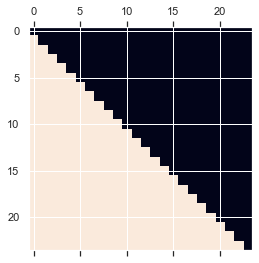

In [146]:
plt.matshow(dE_E>0)

here


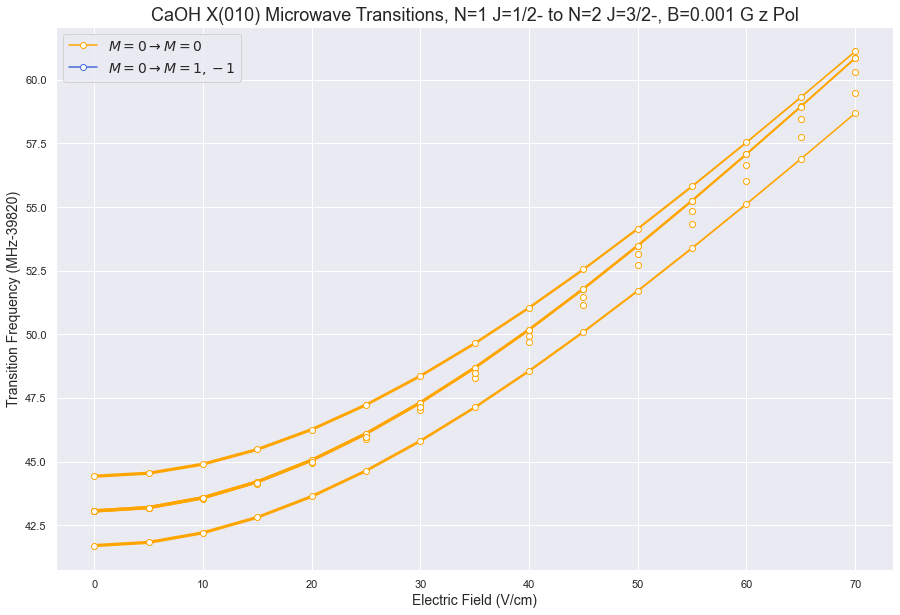

B = 0.001 g

E (V/cm) = 0.0
Pol = z
Transition                                      Estimated Frequency (MHz-39820)    Dipole Moment (D)
--------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=1+,J=0.5,F=1,M=0)                            41.697290               0.4749
(N=1-,J=0.5,F=1,M=1)->(N=1+,J=0.5,F=1,M=1)                            43.060000               0.5016
(N=1-,J=0.5,F=1,M=-1)->(N=1+,J=0.5,F=1,M=-1)                          43.060000               0.5015
(N=1-,J=0.5,F=1,M=0)->(N=1+,J=0.5,F=0,M=0)                            44.422710              -0.4749

E (V/cm) = 5.0
Pol = z
Transition                                      Estimated Frequency (MHz-39820)    Dipole Moment (D)
--------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=1+,J=0.5,F=1,M=0)                            41.823991               0.4721
(N=1-,J=0.5,F=1,M=-1)->(N=1+,J=

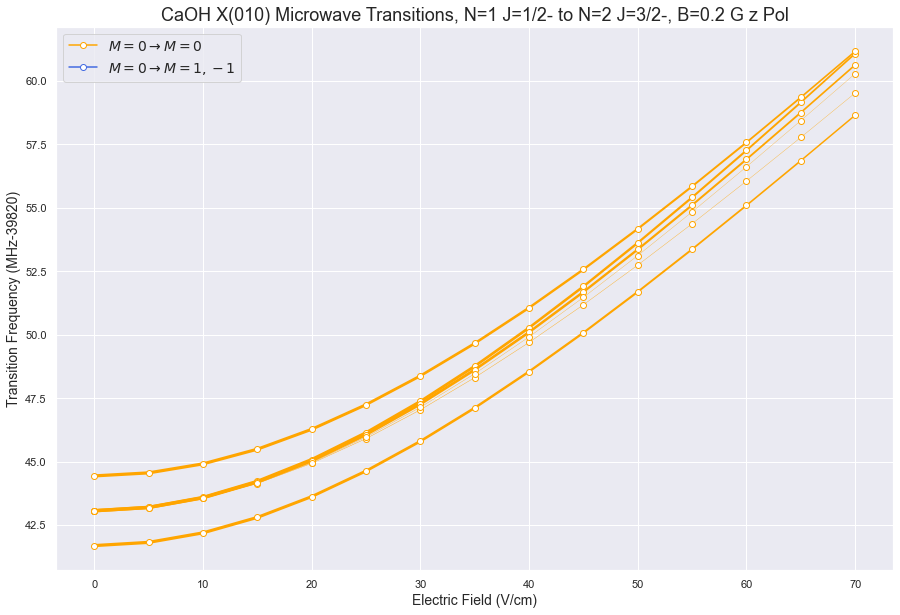

B = 0.2 g

E (V/cm) = 0.0
Pol = z
Transition                                      Estimated Frequency (MHz-39820)    Dipole Moment (D)
--------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=1+,J=0.5,F=1,M=0)                            41.687443               0.4714
(N=1-,J=0.5,F=1,M=1)->(N=1+,J=0.5,F=1,M=1)                            43.060000              -0.5080
(N=1-,J=0.5,F=1,M=0)->(N=1+,J=0.5,F=1,M=0)                            43.060000              -0.0642
(N=1-,J=0.5,F=1,M=-1)->(N=1+,J=0.5,F=1,M=-1)                          43.060000              -0.4950
(N=1-,J=0.5,F=0,M=0)->(N=1+,J=0.5,F=0,M=0)                            43.060000              -0.0498
(N=1-,J=0.5,F=1,M=0)->(N=1+,J=0.5,F=0,M=0)                            44.432557              -0.4714

E (V/cm) = 5.0
Pol = z
Transition                                      Estimated Frequency (MHz-39820)    Dipole Moment (D)
---------------------------------

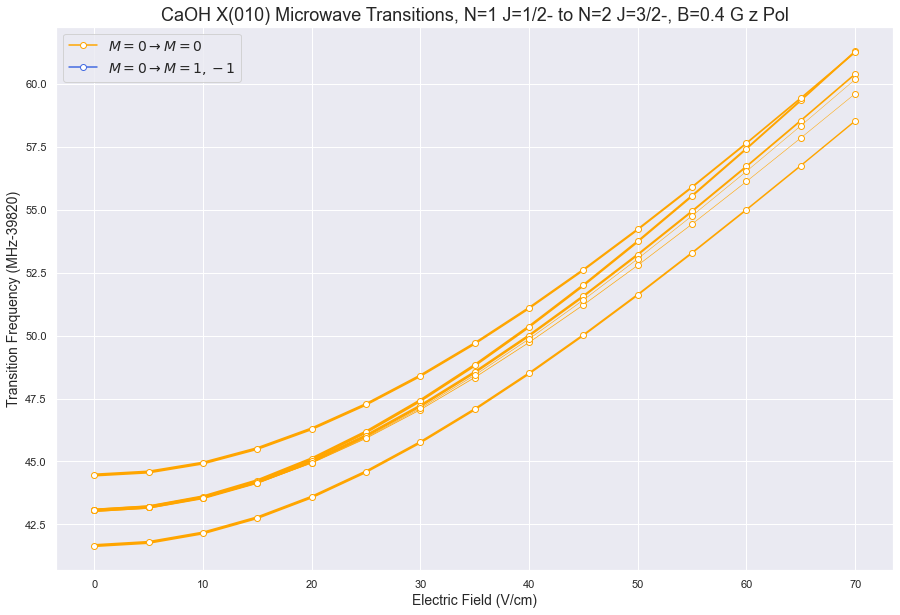

B = 0.4 g

E (V/cm) = 0.0
Pol = z
Transition                                      Estimated Frequency (MHz-39820)    Dipole Moment (D)
--------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=1+,J=0.5,F=1,M=0)                            41.658365               0.4614
(N=1-,J=0.5,F=1,M=0)->(N=1+,J=0.5,F=1,M=0)                            43.060000              -0.1259
(N=1-,J=0.5,F=1,M=-1)->(N=1+,J=0.5,F=1,M=-1)                          43.060000              -0.4882
(N=1-,J=0.5,F=1,M=1)->(N=1+,J=0.5,F=1,M=1)                            43.060000              -0.5143
(N=1-,J=0.5,F=0,M=0)->(N=1+,J=0.5,F=0,M=0)                            43.060000              -0.0971
(N=1-,J=0.5,F=1,M=0)->(N=1+,J=0.5,F=0,M=0)                            44.461635              -0.4614

E (V/cm) = 5.0
Pol = z
Transition                                      Estimated Frequency (MHz-39820)    Dipole Moment (D)
---------------------------------

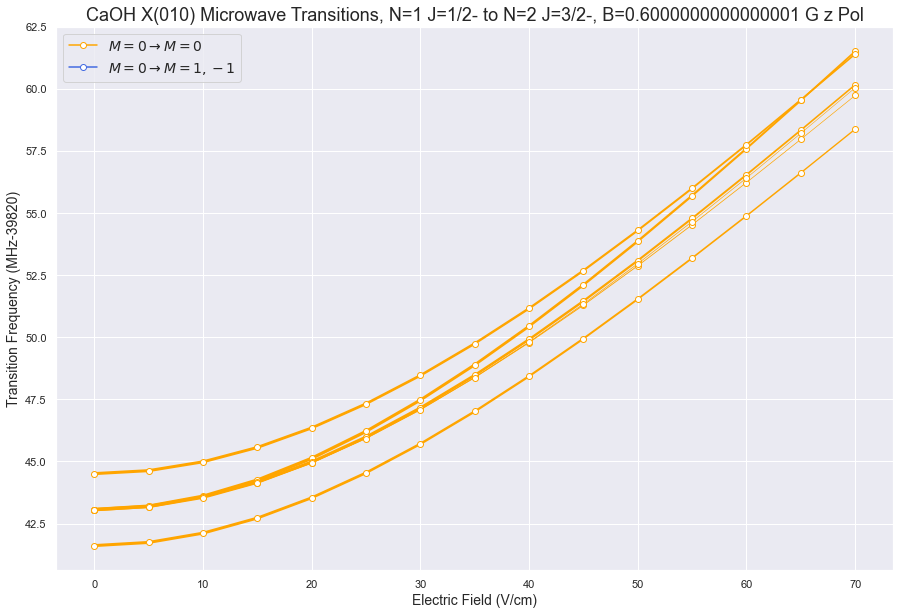

B = 0.6000000000000001 g

E (V/cm) = 0.0
Pol = z
Transition                                      Estimated Frequency (MHz-39820)    Dipole Moment (D)
--------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=1+,J=0.5,F=1,M=0)                            41.611355               0.4460
(N=1-,J=0.5,F=1,M=1)->(N=1+,J=0.5,F=1,M=1)                            43.060000              -0.5204
(N=1-,J=0.5,F=1,M=0)->(N=1+,J=0.5,F=1,M=0)                            43.060000              -0.1831
(N=1-,J=0.5,F=1,M=-1)->(N=1+,J=0.5,F=1,M=-1)                          43.060000               0.4814
(N=1-,J=0.5,F=0,M=0)->(N=1+,J=0.5,F=0,M=0)                            43.060000              -0.1399
(N=1-,J=0.5,F=1,M=0)->(N=1+,J=0.5,F=0,M=0)                            44.508645              -0.4460

E (V/cm) = 5.0
Pol = z
Transition                                      Estimated Frequency (MHz-39820)    Dipole Moment (D)
------------------

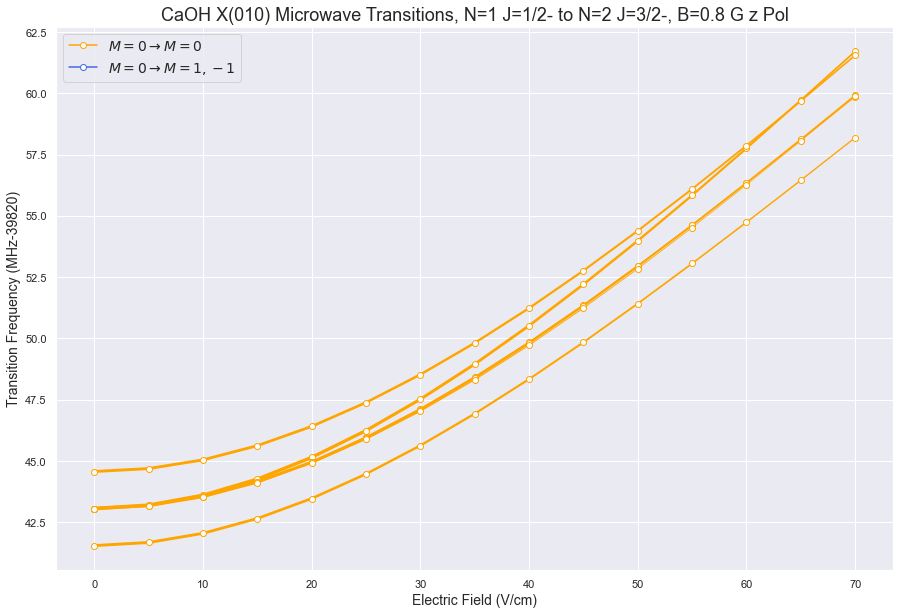

B = 0.8 g

E (V/cm) = 0.0
Pol = z
Transition                                      Estimated Frequency (MHz-39820)    Dipole Moment (D)
--------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=1+,J=0.5,F=1,M=0)                            41.548306               0.4268
(N=1-,J=0.5,F=1,M=1)->(N=1+,J=0.5,F=1,M=1)                            43.060000              -0.5264
(N=1-,J=0.5,F=1,M=-1)->(N=1+,J=0.5,F=1,M=-1)                          43.060000               0.4744
(N=1-,J=0.5,F=0,M=0)->(N=1+,J=0.5,F=0,M=0)                            43.060000              -0.1771
(N=1-,J=0.5,F=1,M=0)->(N=1+,J=0.5,F=1,M=0)                            43.060000              -0.2346
(N=1-,J=0.5,F=1,M=0)->(N=1+,J=0.5,F=0,M=0)                            44.571694              -0.4268

E (V/cm) = 5.0
Pol = z
Transition                                      Estimated Frequency (MHz-39820)    Dipole Moment (D)
---------------------------------

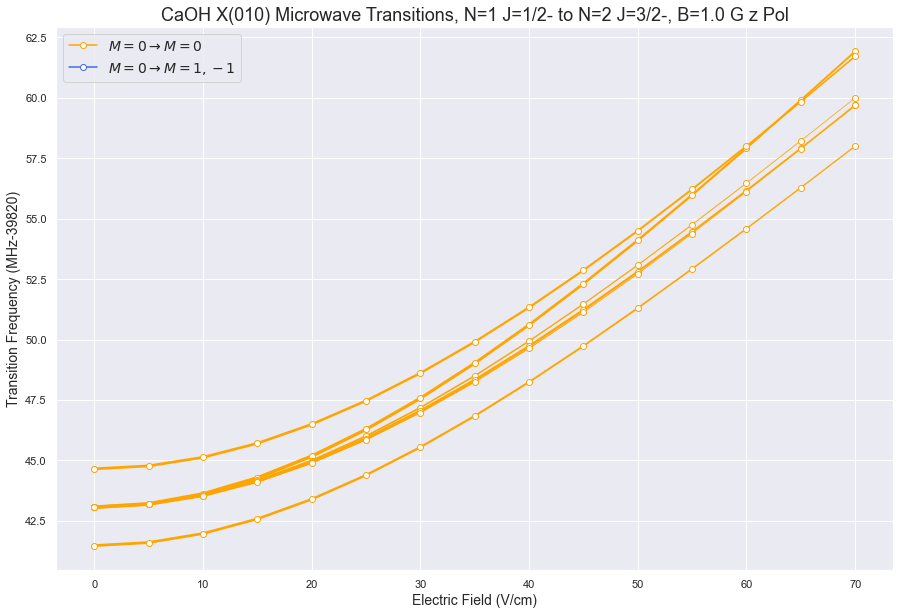

B = 1.0 g

E (V/cm) = 0.0
Pol = z
Transition                                      Estimated Frequency (MHz-39820)    Dipole Moment (D)
--------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=1+,J=0.5,F=1,M=0)                            41.471420               0.4054
(N=1-,J=0.5,F=1,M=0)->(N=1+,J=0.5,F=1,M=0)                            43.060000              -0.2800
(N=1-,J=0.5,F=1,M=-1)->(N=1+,J=0.5,F=1,M=-1)                          43.060000               0.4672
(N=1-,J=0.5,F=0,M=0)->(N=1+,J=0.5,F=0,M=0)                            43.060000              -0.2082
(N=1-,J=0.5,F=1,M=1)->(N=1+,J=0.5,F=1,M=1)                            43.060000              -0.5322
(N=1-,J=0.5,F=1,M=0)->(N=1+,J=0.5,F=0,M=0)                            44.648580              -0.4054

E (V/cm) = 5.0
Pol = z
Transition                                      Estimated Frequency (MHz-39820)    Dipole Moment (D)
---------------------------------

In [156]:
pol = 'z'
print_bool = True
for B in Trans_B1.keys():
    N1.eigensystem(0,B)
    g1 = N1.select_q({'N':1,'J':0.5,'F':[0,1]},parity='-')
    e1 = N1.select_q({'N':1,'J':0.5,'F':[0,1]},parity='+')
#     g2 = Nall.select_q({'N':1,'J':0.5,'F':[0],'M':0},parity='-')
#     e2 = Nall.select_q({'N':1,'J':0.5,'F':[1],'M':[-1,1]},parity='+')
    
#     g4 = Nall.select_q({'N':1,'J':0.5,'F':[1]},parity='-')
#     e4 = Nall.select_q({'N':2,'J':1.5,'F':[2]},parity='+')
#     g5 = Nall.select_q({'N':1,'J':0.5,'F':[0]},parity='-')
#     e5 = Nall.select_q({'N':2,'J':1.5,'F':[2]},parity='+')
    g3 = Nall.select_q({'N':1,'J':0.5,'F':[0]},parity='-')
    e3 = Nall.select_q({'N':1,'J':0.5,'F':[1,2]},parity='+')
    fig,a = plt.subplots(figsize=(15,10))
    TDM_E = Trans_B1[B][pol][0]
#     TDM_E = Trans_B[B]['z'][0] + Trans_B[B]['x'][0]
    dE_E,t_str_E = Trans_B1[B][pol][1:]
#     N1.eigensystem(E,1e-4)
#     N2.eigensystem(E,1e-4)
#     g1 = N1.select_q({'N':1,'J':0.5,'F':[0]},parity='-')
#     e1 = N2.select_q({'N':2,'J':1.5,'F':[1]},parity='+')
#     g2 = N1.select_q({'N':1,'J':0.5,'F':[1]},parity='-')
#     e2 = N2.select_q({'N':2,'J':1.5,'F':[1]},parity='+')
#     g4 = N1.select_q({'N':1,'J':0.5,'F':[1]},parity='-')
#     e4 = N2.select_q({'N':2,'J':1.5,'F':[2]},parity='+')
#     g5 = N1.select_q({'N':1,'J':0.5,'F':[0]},parity='-')
#     e5 = N2.select_q({'N':2,'J':1.5,'F':[2]},parity='+')
#     g3 = N1.select_q({'N':1,'J':0.5,'F':[0,1]},parity='-')
#     e3 = N2.select_q({'N':2,'J':1.5,'F':[1,2]},parity='+')
#     fig,a = plt.subplots(figsize=(12,8))
#     TDM_B,dE_B,t_str_B = Trans_E[E][pol]
    
#     g = N1.select_q({'N':1,'J':0.5,'F':0},parity='-')
#     e = N2.select_q({'N':2,'J':1.5,'M':[-2,-1,1,2]},parity='+')
#     plot_B(Bscan,TDM_B,dE_B,g_idx=g,e_idx=e,linescale=10,figure=fig,color='pink',marker=None,mfc='white')
#     g = N1.select_q({'N':1,'J':0.5,'F':[1]},parity='-')
#     e = N2.select_q({'N':2,'J':1.5,'M':[-2,-1,0,1,2]},parity='+')
#     plot_E(Escan,TDM_E,dE_E,g_idx=g4,e_idx=e4,linescale=10,figure=fig,color='hotpink',marker='o',mfc='white')
#     plot_E(Escan,TDM_E,dE_E,g_idx=g5,e_idx=e5,linescale=10,figure=fig,color='green',marker='o',mfc='white')
#     plot_E(Escan,TDM_E,dE_E,g_idx=g2,e_idx=e2,linescale=10,figure=fig,color='royalblue',marker='o',mfc='white')
    plot_E(Escan,TDM_E,dE_E,g_idx=g1,e_idx=e1,linescale=10,thresh=0.00001,figure=fig,color='orange',marker='o',mfc='white')
    colors = ['orange','royalblue','hotpink','green']
    mark = ['o','o','o','o']
    mf = ['white','white','white','white']
    lines = [plt.Line2D([0], [0], color=c, marker=mk,mfc=m) for c,m,mk in zip(colors,mf,mark)]
    labels = [r'$M=0\rightarrow M=0$',r'$M=0\rightarrow M=1,-1$']#r'$F=1\rightarrow F=2$',r'$F=0\rightarrow F=2$']#,r'$M_e\neq0$']
    plt.legend(lines, labels,loc='best',fontsize=14)
    plt.title('CaOH X(010) Microwave Transitions, N=1 J=1/2- to N=2 J=3/2-, B={} G {} Pol'.format(B,pol),fontsize=18)
    plt.show()
    if print_bool:
        print('B = {} g'.format(B))
        table = print_table_E(Escan,TDM_E,dE_E,t_str_E,g1,e1,thresh = 0.001,cut=True,dipole=pol)

here
here


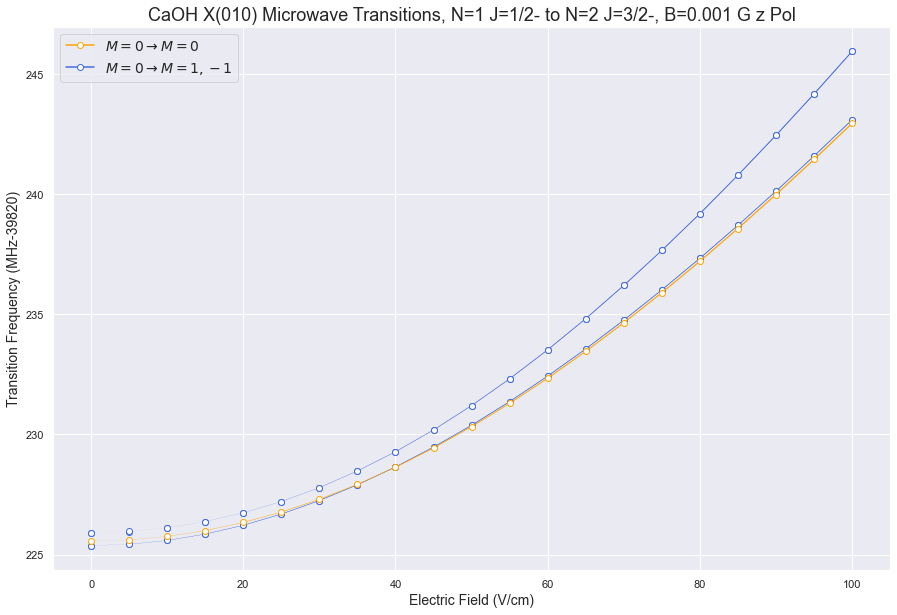

B = 0.001 g

E (V/cm) = 0.0
Pol = z
Transition    Estimated Frequency (MHz-39820)    Dipole Moment (D)
------------  ---------------------------------  -------------------

E (V/cm) = 5.0
Pol = z
Transition                                     Estimated Frequency (MHz-39820)    Dipole Moment (D)
-------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=2,M=1)                          225.427034              -0.0100
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=2,M=-1)                         225.428282              -0.0100
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=2,M=0)                          225.610506               0.0144
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=1,M=1)                          225.959329              -0.0013
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=1,M=-1)                         225.960354               0.0013

E (V/cm) = 10.0
Pol = z
Transition                                     Estimated Frequency (MHz-39820) 

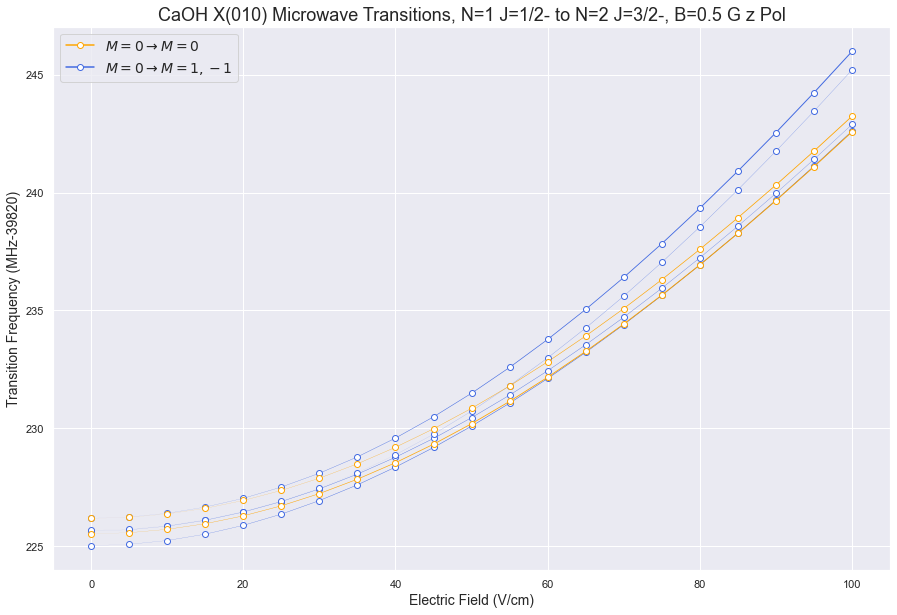

B = 0.5 g

E (V/cm) = 0.0
Pol = z
Transition    Estimated Frequency (MHz-39820)    Dipole Moment (D)
------------  ---------------------------------  -------------------

E (V/cm) = 5.0
Pol = z
Transition                                     Estimated Frequency (MHz-39820)    Dipole Moment (D)
-------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=2,M=1)                          225.075892               0.0095
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=2,M=0)                          225.568899               0.0136
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=2,M=-1)                         225.693550               0.0093
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=1,M=1)                          225.716207               0.0016
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=1,M=0)                          226.221381              -0.0042
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=1,M=-1)                         226.235171              -0.0046

E (V/

here
here


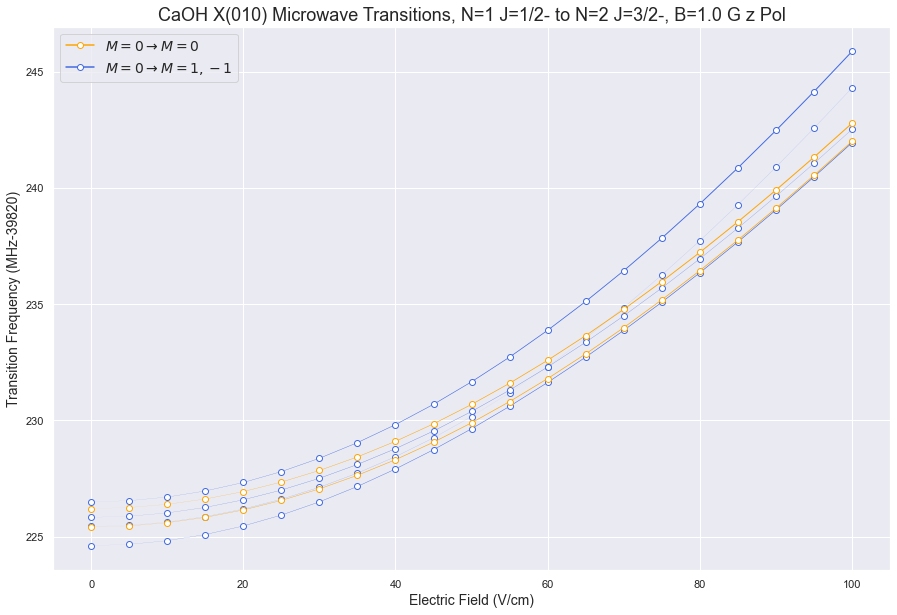

B = 1.0 g

E (V/cm) = 0.0
Pol = z
Transition    Estimated Frequency (MHz-39820)    Dipole Moment (D)
------------  ---------------------------------  -------------------

E (V/cm) = 5.0
Pol = z
Transition                                     Estimated Frequency (MHz-39820)    Dipole Moment (D)
-------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=2,M=1)                          224.668696               0.0084
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=2,M=0)                          225.460695              -0.0120
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=1,M=1)                          225.485615              -0.0034
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=2,M=-1)                         225.879202               0.0078
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=1,M=0)                          226.253005               0.0072
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=1,M=-1)                         226.547460               0.0069

E (V/

here
here


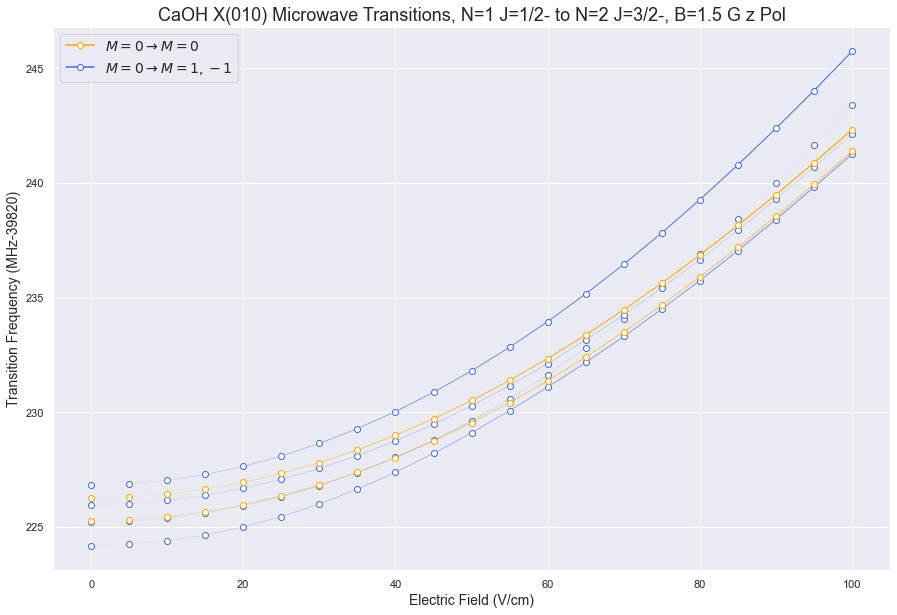

B = 1.5 g

E (V/cm) = 0.0
Pol = z
Transition    Estimated Frequency (MHz-39820)    Dipole Moment (D)
------------  ---------------------------------  -------------------

E (V/cm) = 5.0
Pol = z
Transition                                     Estimated Frequency (MHz-39820)    Dipole Moment (D)
-------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=1,M=1)                          224.237764               0.0073
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=2,M=1)                          225.261872              -0.0044
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=2,M=0)                          225.316670               0.0103
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=2,M=-1)                         226.020303               0.0064
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=1,M=0)                          226.298262              -0.0088
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=1,M=-1)                         226.885622              -0.0080

E (V/

here
here


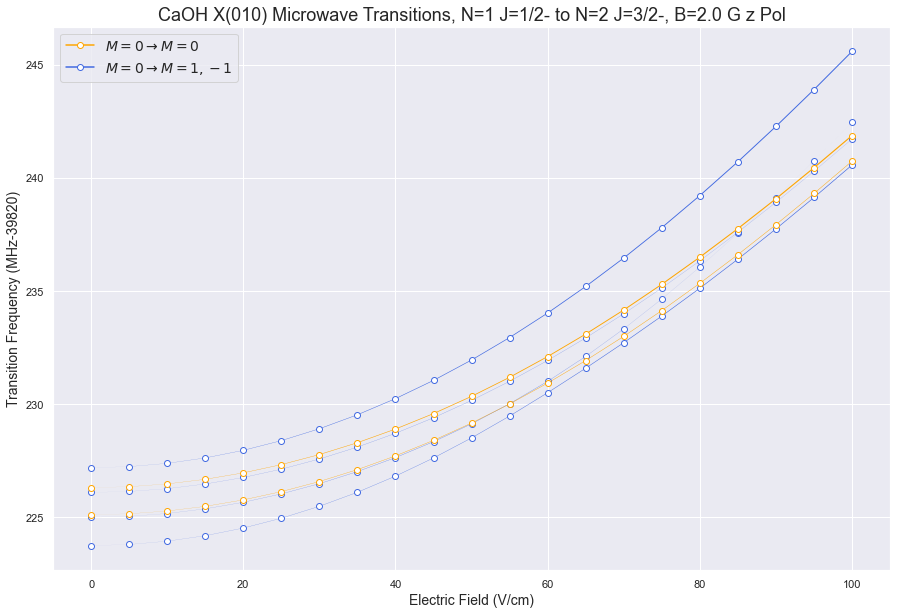

B = 2.0 g

E (V/cm) = 0.0
Pol = z
Transition    Estimated Frequency (MHz-39820)    Dipole Moment (D)
------------  ---------------------------------  -------------------

E (V/cm) = 5.0
Pol = z
Transition                                     Estimated Frequency (MHz-39820)    Dipole Moment (D)
-------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=1,M=1)                          223.804464              -0.0064
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=2,M=1)                          225.048551               0.0050
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=2,M=0)                          225.161004               0.0088
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=2,M=-1)                         226.146286              -0.0053
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=1,M=0)                          226.357519              -0.0095
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=1,M=-1)                         227.244277               0.0084

E (V/

here
here


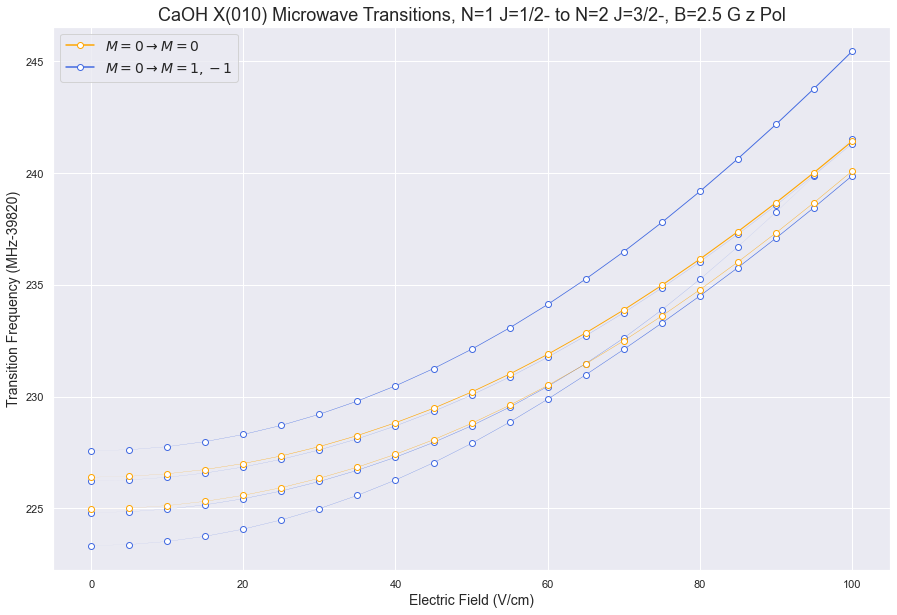

B = 2.5 g

E (V/cm) = 0.0
Pol = z
Transition    Estimated Frequency (MHz-39820)    Dipole Moment (D)
------------  ---------------------------------  -------------------

E (V/cm) = 5.0
Pol = z
Transition                                     Estimated Frequency (MHz-39820)    Dipole Moment (D)
-------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=1,M=1)                          223.381915               0.0057
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=2,M=1)                          224.850801              -0.0052
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=2,M=0)                          225.008758               0.0077
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=2,M=-1)                         226.274030               0.0044
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=1,M=0)                          226.433608              -0.0098
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=1,M=-1)                         227.623930               0.0084

E (V/

(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=1,M=-1)                         233.074143               0.0975

E (V/cm) = 60.0
Pol = z
Transition                                     Estimated Frequency (MHz-39820)    Dipole Moment (D)
-------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=1,M=1)                          229.883153               0.0510
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=2,M=1)                          230.451174              -0.0508
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=2,M=0)                          230.497997               0.0495
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=2,M=-1)                         231.758723               0.0224
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=1,M=0)                          231.889907              -0.1226
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=1,M=-1)                         234.121728               0.1054

E (V/cm) = 65.0
Pol = z
Transition                                     Est

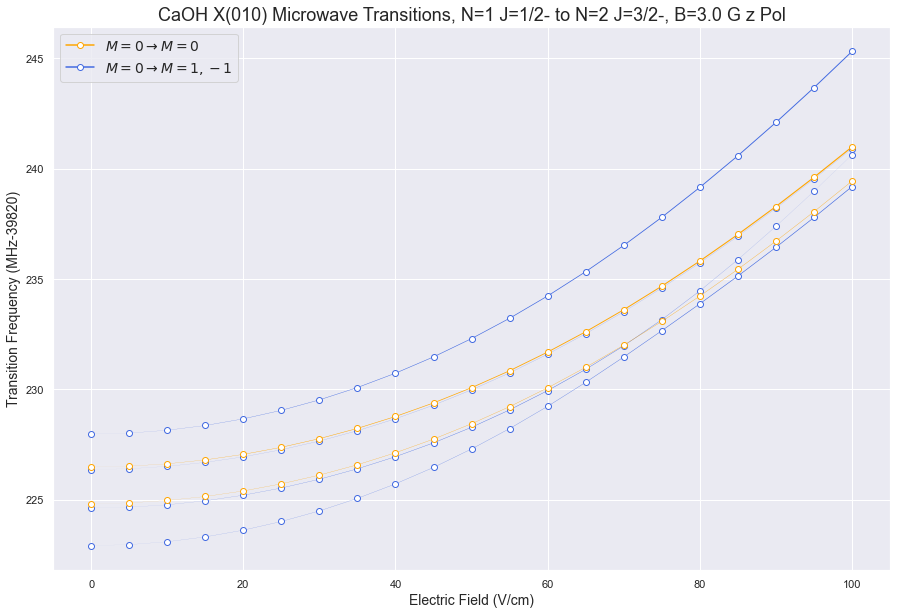

B = 3.0 g

E (V/cm) = 0.0
Pol = z
Transition    Estimated Frequency (MHz-39820)    Dipole Moment (D)
------------  ---------------------------------  -------------------

E (V/cm) = 5.0
Pol = z
Transition                                     Estimated Frequency (MHz-39820)    Dipole Moment (D)
-------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=1,M=1)                          222.977927              -0.0051
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=2,M=1)                          224.672571               0.0054
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=2,M=0)                          224.868767               0.0068
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=2,M=-1)                         226.412731              -0.0038
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=1,M=0)                          226.529108              -0.0098
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=1,M=-1)                         228.026273              -0.0083

E (V/

E (V/cm) = 95.0
Pol = z
Transition                                     Estimated Frequency (MHz-39820)    Dipole Moment (D)
-------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=1,M=1)                          237.785143              -0.0920
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=2,M=0)                          238.047145               0.0461
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=2,M=1)                          238.970968               0.0095
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=2,M=-1)                         239.525710              -0.0148
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=1,M=0)                          239.603588              -0.1677
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=1,M=-1)                         243.662288              -0.1410

E (V/cm) = 100.0
Pol = z
Transition                                     Estimated Frequency (MHz-39820)    Dipole Moment (D)
-------------------------------------------  -----

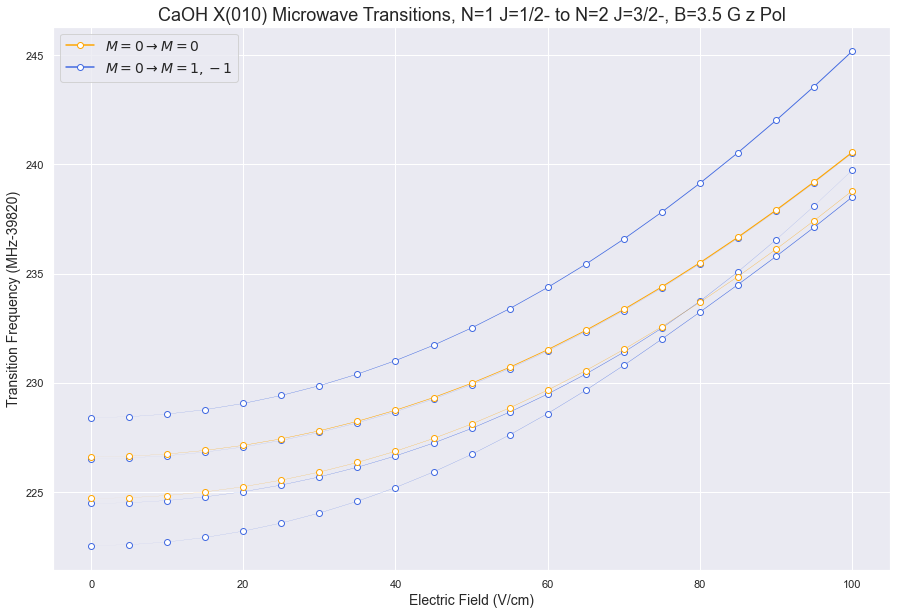

B = 3.5 g

E (V/cm) = 0.0
Pol = z
Transition    Estimated Frequency (MHz-39820)    Dipole Moment (D)
------------  ---------------------------------  -------------------

E (V/cm) = 5.0
Pol = z
Transition                                     Estimated Frequency (MHz-39820)    Dipole Moment (D)
-------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=1,M=1)                          222.597039              -0.0047
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=2,M=1)                          224.516357               0.0054
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=2,M=0)                          224.746098               0.0061
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=2,M=-1)                         226.567359              -0.0033
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=1,M=0)                          226.645652              -0.0097
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=1,M=-1)                         228.452500              -0.0080

E (V/

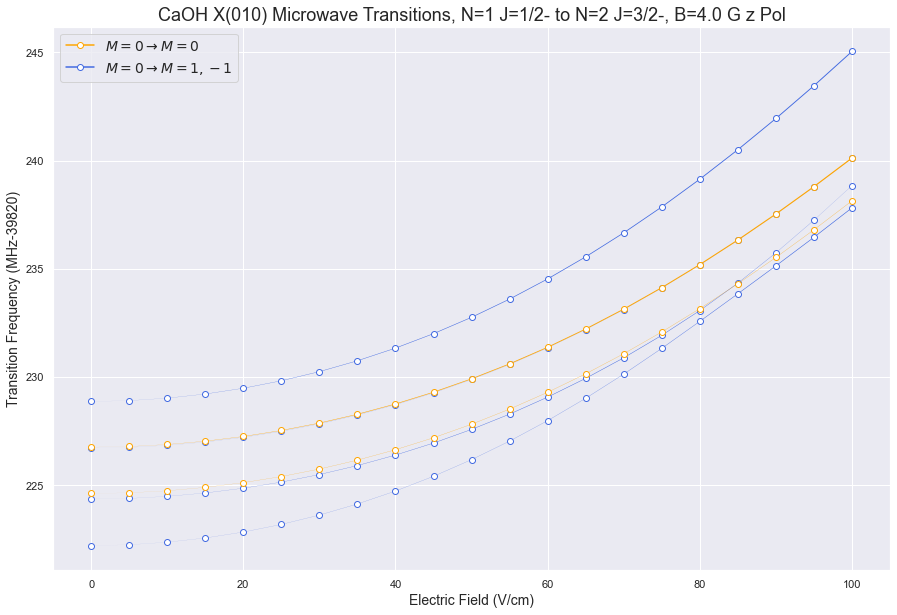

B = 4.0 g

E (V/cm) = 0.0
Pol = z
Transition    Estimated Frequency (MHz-39820)    Dipole Moment (D)
------------  ---------------------------------  -------------------

E (V/cm) = 5.0
Pol = z
Transition                                     Estimated Frequency (MHz-39820)    Dipole Moment (D)
-------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=1,M=1)                          222.241735               0.0043
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=2,M=1)                          224.383474               0.0054
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=2,M=0)                          224.643524               0.0055
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=2,M=-1)                         226.740455               0.0030
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=1,M=0)                          226.783971              -0.0094
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=1,M=-1)                         228.903020              -0.0076

E (V/

(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=1,M=-1)                         236.660071              -0.1101

E (V/cm) = 75.0
Pol = z
Transition                                     Estimated Frequency (MHz-39820)    Dipole Moment (D)
-------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=1,M=1)                          231.320132               0.0456
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=2,M=1)                          231.922936               0.0663
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=2,M=0)                          232.078060               0.0343
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=2,M=-1)                         234.105638               0.0145
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=1,M=0)                          234.126858              -0.1419
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=1,M=-1)                         237.857339              -0.1164

E (V/cm) = 80.0
Pol = z
Transition                                     Est

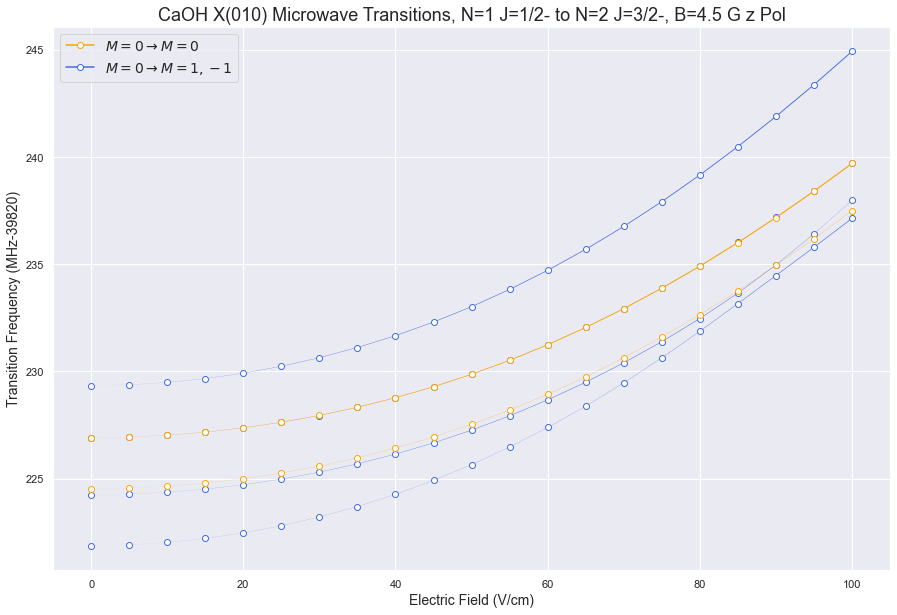

B = 4.5 g

E (V/cm) = 0.0
Pol = z
Transition    Estimated Frequency (MHz-39820)    Dipole Moment (D)
------------  ---------------------------------  -------------------

E (V/cm) = 5.0
Pol = z
Transition                                     Estimated Frequency (MHz-39820)    Dipole Moment (D)
-------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=1,M=1)                          221.913167               0.0040
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=2,M=1)                          224.274365              -0.0053
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=2,M=0)                          224.562359               0.0050
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=2,M=-1)                         226.933069              -0.0026
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=1,M=0)                          226.944062              -0.0091
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=1,M=-1)                         229.377539              -0.0073

E (V/

here
here


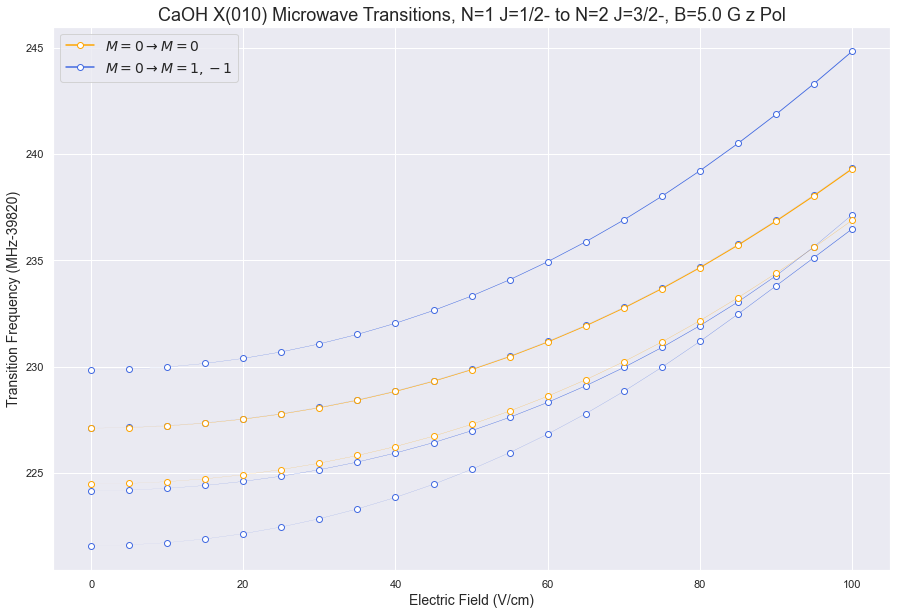

B = 5.0 g

E (V/cm) = 0.0
Pol = z
Transition    Estimated Frequency (MHz-39820)    Dipole Moment (D)
------------  ---------------------------------  -------------------

E (V/cm) = 5.0
Pol = z
Transition                                     Estimated Frequency (MHz-39820)    Dipole Moment (D)
-------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=1,M=1)                          221.611579               0.0037
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=2,M=1)                          224.188826              -0.0052
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=2,M=0)                          224.502949               0.0046
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=1,M=0)                          227.125365              -0.0088
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=2,M=-1)                         227.145279               0.0024
(N=1-,J=0.5,F=0,M=0)->(N=2-,J=1.5,F=1,M=-1)                         229.875195               0.0069

E (V/

In [169]:
pol = 'z'
print_bool = True
for B in Trans_B.keys():
    Nall.eigensystem(0,B)
    g1 = Nall.select_q({'N':1,'J':0.5,'F':[0],'M':0},parity='-')
    e1 = Nall.select_q({'N':2,'J':1.5,'F':[1,2],'M':0},parity='-')
    g2 = Nall.select_q({'N':1,'J':0.5,'F':[0],'M':0},parity='-')
    e2 = Nall.select_q({'N':2,'J':1.5,'F':[1,2],'M':[-1,1]},parity='-')
    
#     g4 = Nall.select_q({'N':1,'J':0.5,'F':[1]},parity='-')
#     e4 = Nall.select_q({'N':2,'J':1.5,'F':[2]},parity='+')
#     g5 = Nall.select_q({'N':1,'J':0.5,'F':[0]},parity='-')
#     e5 = Nall.select_q({'N':2,'J':1.5,'F':[2]},parity='+')
    g3 = Nall.select_q({'N':1,'J':0.5,'F':[0]},parity='-')
    e3 = Nall.select_q({'N':2,'J':1.5,'F':[1,2]},parity='-')
    fig,a = plt.subplots(figsize=(15,10))
#     TDM_E = Trans_B[B][pol][0]
    TDM_E = Trans_B[B]['z'][0] + Trans_B[B]['x'][0]
    dE_E,t_str_E = Trans_B[B][pol][1:]
#     N1.eigensystem(E,1e-4)
#     N2.eigensystem(E,1e-4)
#     g1 = N1.select_q({'N':1,'J':0.5,'F':[0]},parity='-')
#     e1 = N2.select_q({'N':2,'J':1.5,'F':[1]},parity='+')
#     g2 = N1.select_q({'N':1,'J':0.5,'F':[1]},parity='-')
#     e2 = N2.select_q({'N':2,'J':1.5,'F':[1]},parity='+')
#     g4 = N1.select_q({'N':1,'J':0.5,'F':[1]},parity='-')
#     e4 = N2.select_q({'N':2,'J':1.5,'F':[2]},parity='+')
#     g5 = N1.select_q({'N':1,'J':0.5,'F':[0]},parity='-')
#     e5 = N2.select_q({'N':2,'J':1.5,'F':[2]},parity='+')
#     g3 = N1.select_q({'N':1,'J':0.5,'F':[0,1]},parity='-')
#     e3 = N2.select_q({'N':2,'J':1.5,'F':[1,2]},parity='+')
#     fig,a = plt.subplots(figsize=(12,8))
#     TDM_B,dE_B,t_str_B = Trans_E[E][pol]
    
#     g = N1.select_q({'N':1,'J':0.5,'F':0},parity='-')
#     e = N2.select_q({'N':2,'J':1.5,'M':[-2,-1,1,2]},parity='+')
#     plot_B(Bscan,TDM_B,dE_B,g_idx=g,e_idx=e,linescale=10,figure=fig,color='pink',marker=None,mfc='white')
#     g = N1.select_q({'N':1,'J':0.5,'F':[1]},parity='-')
#     e = N2.select_q({'N':2,'J':1.5,'M':[-2,-1,0,1,2]},parity='+')
#     plot_E(Escan,TDM_E,dE_E,g_idx=g4,e_idx=e4,linescale=10,figure=fig,color='hotpink',marker='o',mfc='white')
#     plot_E(Escan,TDM_E,dE_E,g_idx=g5,e_idx=e5,linescale=10,figure=fig,color='green',marker='o',mfc='white')
    plot_E(Escan,TDM_E,dE_E,g_idx=g2,e_idx=e2,linescale=10,figure=fig,color='royalblue',marker='o',mfc='white')
    plot_E(Escan,TDM_E,dE_E,g_idx=g1,e_idx=e1,linescale=10,figure=fig,color='orange',marker='o',mfc='white')
    colors = ['orange','royalblue','hotpink','green']
    mark = ['o','o','o','o']
    mf = ['white','white','white','white']
    lines = [plt.Line2D([0], [0], color=c, marker=mk,mfc=m) for c,m,mk in zip(colors,mf,mark)]
    labels = [r'$M=0\rightarrow M=0$',r'$M=0\rightarrow M=1,-1$']#r'$F=1\rightarrow F=2$',r'$F=0\rightarrow F=2$']#,r'$M_e\neq0$']
    plt.legend(lines, labels,loc='best',fontsize=14)
    plt.title('CaOH X(010) Microwave Transitions, N=1 J=1/2- to N=2 J=3/2-, B={} G {} Pol'.format(B,pol),fontsize=18)
    plt.show()
    if print_bool:
        print('B = {} g'.format(B))
        table = print_table_E(Escan,TDM_E,dE_E,t_str_E,g3,e3,thresh = 0.001,cut=True,dipole=pol)

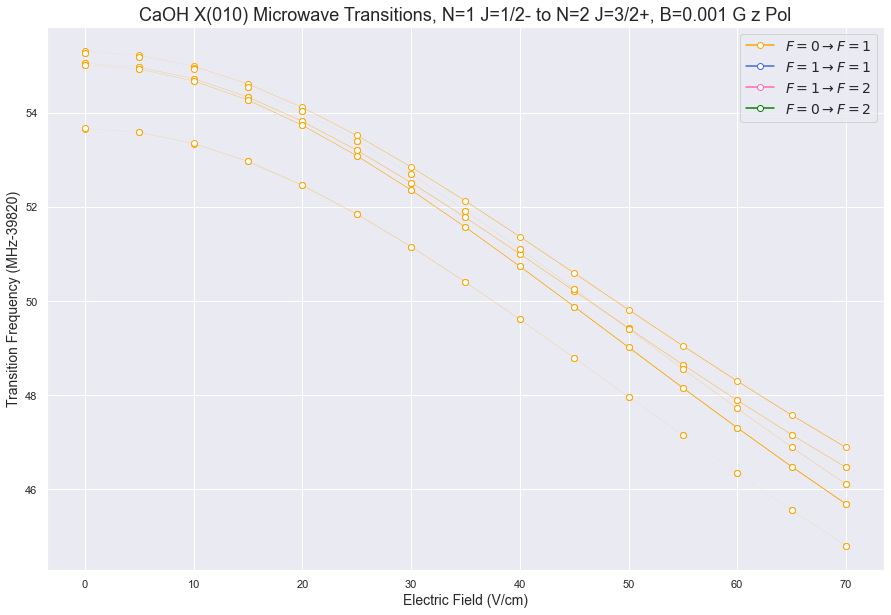

B = 0.001 g

E (V/cm) = 0.0
Pol = z
Transition    Estimated Frequency (MHz-39820)    Dipole Moment (D)
------------  ---------------------------------  -------------------

E (V/cm) = 5.0
Pol = z
Transition                                      Estimated Frequency (MHz-39820)    Dipole Moment (D)
--------------------------------------------  ---------------------------------  -------------------
(N=1+,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=1,M=1)                            53.587159              -0.0068
(N=1+,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=1,M=-1)                           53.588169              -0.0069
(N=1+,J=0.5,F=1,M=1)->(N=2+,J=1.5,F=1,M=1)                            54.932780              -0.0087
(N=1+,J=0.5,F=1,M=-1)->(N=2+,J=1.5,F=1,M=-1)                          54.932829              -0.0087
(N=1+,J=0.5,F=1,M=0)->(N=2+,J=1.5,F=1,M=1)                            54.971137               0.0082
(N=1+,J=0.5,F=1,M=0)->(N=2+,J=1.5,F=1,M=-1)                           54.972147              -0.0

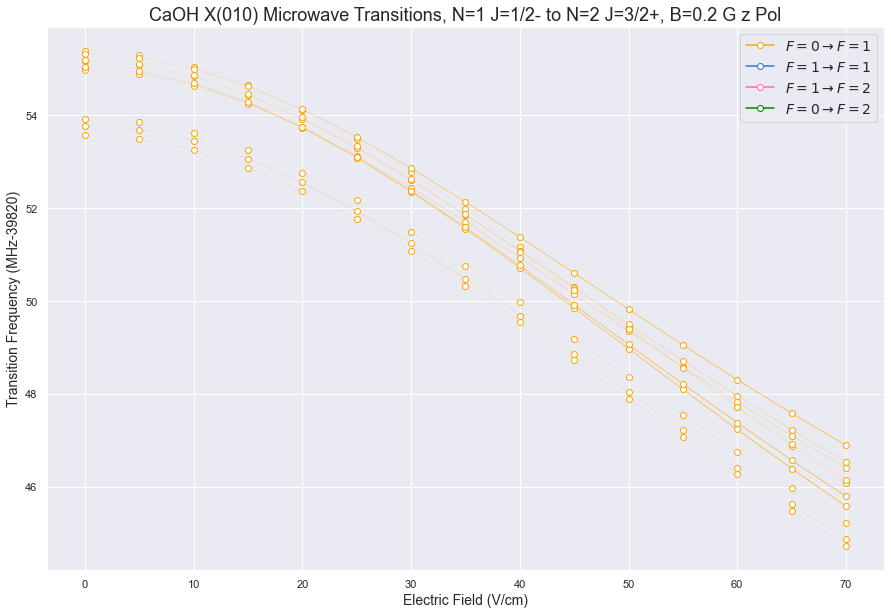

B = 0.2 g

E (V/cm) = 0.0
Pol = z
Transition    Estimated Frequency (MHz-39820)    Dipole Moment (D)
------------  ---------------------------------  -------------------

E (V/cm) = 5.0
Pol = z
Transition                                      Estimated Frequency (MHz-39820)    Dipole Moment (D)
--------------------------------------------  ---------------------------------  -------------------
(N=1+,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=1,M=1)                            53.489091              -0.0055
(N=1+,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=1,M=-1)                           53.691719              -0.0083
(N=1+,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=1,M=0)                            53.845283               0.0015
(N=1+,J=0.5,F=1,M=0)->(N=2+,J=1.5,F=1,M=1)                            54.881065               0.0076
(N=1+,J=0.5,F=1,M=1)->(N=2+,J=1.5,F=1,M=1)                            54.934130               0.0093
(N=1+,J=0.5,F=1,M=-1)->(N=2+,J=1.5,F=1,M=-1)                          54.944454               0.008

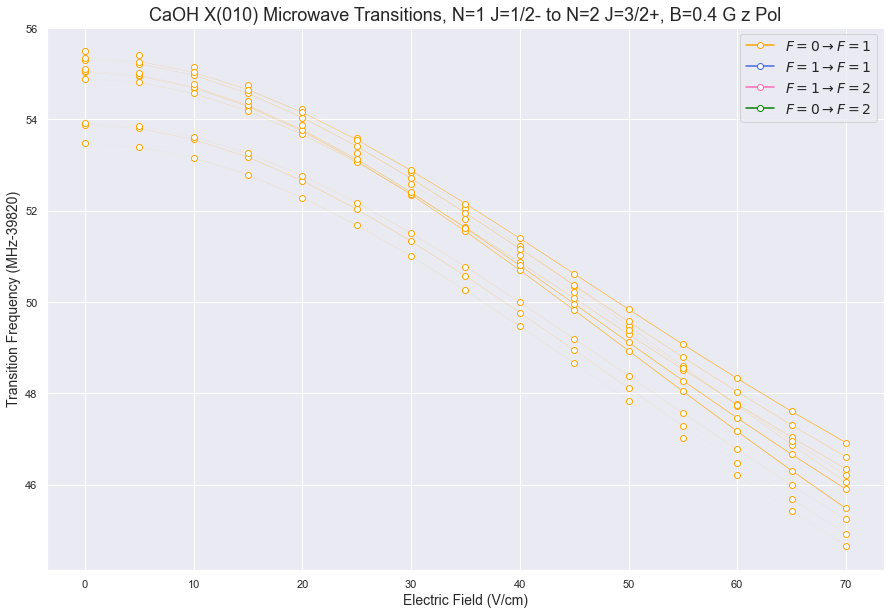

B = 0.4 g

E (V/cm) = 0.0
Pol = z
Transition    Estimated Frequency (MHz-39820)    Dipole Moment (D)
------------  ---------------------------------  -------------------

E (V/cm) = 5.0
Pol = z
Transition                                      Estimated Frequency (MHz-39820)    Dipole Moment (D)
--------------------------------------------  ---------------------------------  -------------------
(N=1+,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=1,M=1)                            53.394425               0.0043
(N=1+,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=1,M=-1)                           53.802418              -0.0097
(N=1+,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=1,M=0)                            53.851850               0.0030
(N=1+,J=0.5,F=1,M=0)->(N=2+,J=1.5,F=1,M=1)                            54.810076              -0.0070
(N=1+,J=0.5,F=1,M=1)->(N=2+,J=1.5,F=1,M=1)                            54.946587              -0.0097
(N=1+,J=0.5,F=1,M=-1)->(N=2+,J=1.5,F=1,M=-1)                          54.970195               0.007

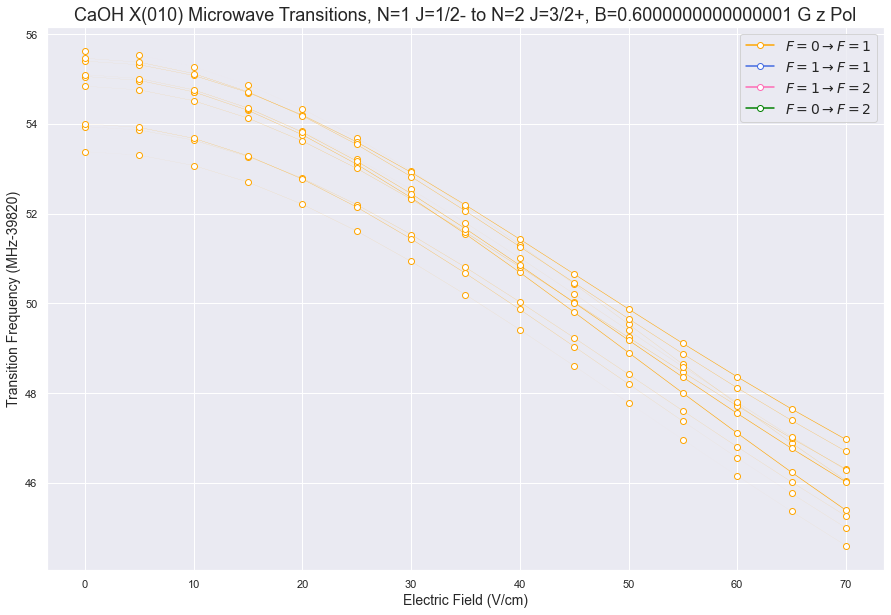

B = 0.6000000000000001 g

E (V/cm) = 0.0
Pol = z
Transition    Estimated Frequency (MHz-39820)    Dipole Moment (D)
------------  ---------------------------------  -------------------

E (V/cm) = 5.0
Pol = z
Transition                                      Estimated Frequency (MHz-39820)    Dipole Moment (D)
--------------------------------------------  ---------------------------------  -------------------
(N=1+,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=1,M=1)                            53.302255               0.0033
(N=1+,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=1,M=0)                            53.862152               0.0042
(N=1+,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=1,M=-1)                           53.920019               0.0110
(N=1+,J=0.5,F=1,M=0)->(N=2+,J=1.5,F=1,M=1)                            54.756376              -0.0064
(N=1+,J=0.5,F=1,M=1)->(N=2+,J=1.5,F=1,M=1)                            54.968216              -0.0100
(N=1+,J=0.5,F=1,M=-1)->(N=2+,J=1.5,F=1,M=-1)                          55.009957     

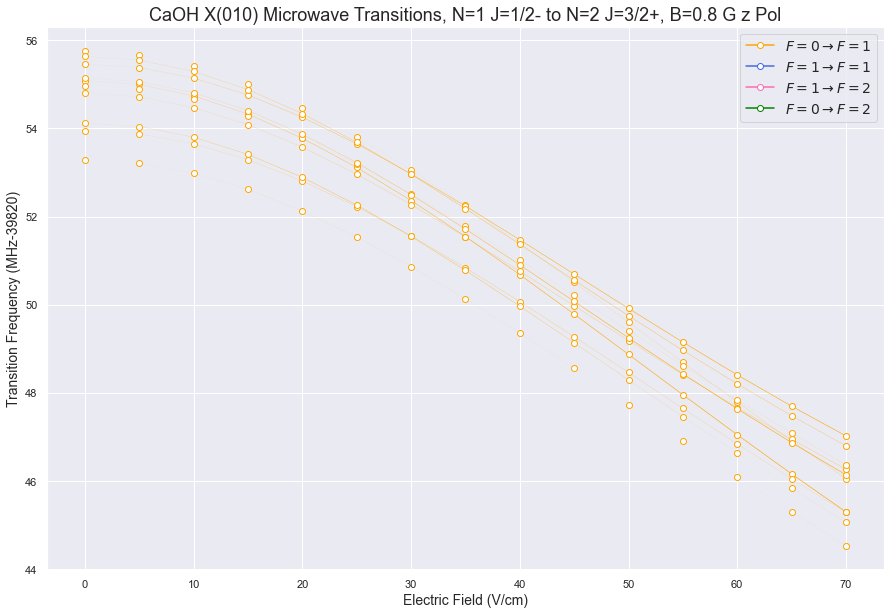

B = 0.8 g

E (V/cm) = 0.0
Pol = z
Transition    Estimated Frequency (MHz-39820)    Dipole Moment (D)
------------  ---------------------------------  -------------------

E (V/cm) = 5.0
Pol = z
Transition                                      Estimated Frequency (MHz-39820)    Dipole Moment (D)
--------------------------------------------  ---------------------------------  -------------------
(N=1+,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=1,M=1)                            53.211645               0.0025
(N=1+,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=1,M=0)                            53.875545               0.0053
(N=1+,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=1,M=-1)                           54.043928              -0.0121
(N=1+,J=0.5,F=1,M=0)->(N=2+,J=1.5,F=1,M=1)                            54.717705              -0.0059
(N=1+,J=0.5,F=1,M=1)->(N=2+,J=1.5,F=1,M=1)                            54.997315               0.0102
(N=1+,J=0.5,F=1,M=-1)->(N=2+,J=1.5,F=1,M=-1)                          55.062598              -0.005

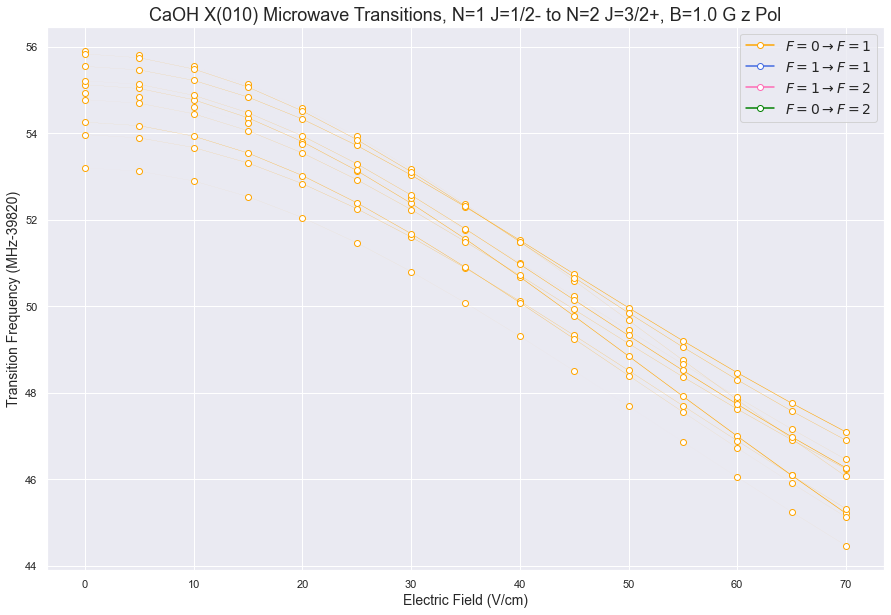

B = 1.0 g

E (V/cm) = 0.0
Pol = z
Transition    Estimated Frequency (MHz-39820)    Dipole Moment (D)
------------  ---------------------------------  -------------------

E (V/cm) = 5.0
Pol = z
Transition                                      Estimated Frequency (MHz-39820)    Dipole Moment (D)
--------------------------------------------  ---------------------------------  -------------------
(N=1+,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=1,M=1)                            53.122153               0.0019
(N=1+,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=1,M=0)                            53.891512              -0.0062
(N=1+,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=1,M=-1)                           54.173169               0.0130
(N=1+,J=0.5,F=1,M=0)->(N=2+,J=1.5,F=1,M=1)                            54.692032              -0.0054
(N=1+,J=0.5,F=1,M=1)->(N=2+,J=1.5,F=1,M=1)                            55.032547              -0.0103
(N=1+,J=0.5,F=1,M=-1)->(N=2+,J=1.5,F=1,M=-1)                          55.126465              -0.004

In [64]:
pol = 'z'
print_bool = True
for B in Trans_B.keys():
    Nall.eigensystem(0,B)
    g1 = Nall.select_q({'N':1,'J':0.5,'F':[0,1]},parity='+')
    e1 = Nall.select_q({'N':2,'J':1.5,'F':[1]},parity='+')
    g2 = Nall.select_q({'N':1,'J':0.5,'F':[1]},parity='-')
    e2 = Nall.select_q({'N':2,'J':1.5,'F':[1]},parity='+')
    g4 = Nall.select_q({'N':1,'J':0.5,'F':[1]},parity='-')
    e4 = Nall.select_q({'N':2,'J':1.5,'F':[2]},parity='+')
    g5 = Nall.select_q({'N':1,'J':0.5,'F':[0]},parity='-')
    e5 = Nall.select_q({'N':2,'J':1.5,'F':[2]},parity='+')
    g3 = Nall.select_q({'N':1,'J':0.5,'F':[0,1]},parity='-')
    e3 = Nall.select_q({'N':2,'J':1.5,'F':[1,2]},parity='+')
    fig,a = plt.subplots(figsize=(15,10))
#     TDM_E = Trans_B[B][pol][0]
    TDM_E = Trans_B[B]['z'][0] + Trans_B[B]['x'][0]
    dE_E,t_str_E = Trans_B[B][pol][1:]
#     N1.eigensystem(E,1e-4)
#     N2.eigensystem(E,1e-4)
#     g1 = N1.select_q({'N':1,'J':0.5,'F':[0]},parity='-')
#     e1 = N2.select_q({'N':2,'J':1.5,'F':[1]},parity='+')
#     g2 = N1.select_q({'N':1,'J':0.5,'F':[1]},parity='-')
#     e2 = N2.select_q({'N':2,'J':1.5,'F':[1]},parity='+')
#     g4 = N1.select_q({'N':1,'J':0.5,'F':[1]},parity='-')
#     e4 = N2.select_q({'N':2,'J':1.5,'F':[2]},parity='+')
#     g5 = N1.select_q({'N':1,'J':0.5,'F':[0]},parity='-')
#     e5 = N2.select_q({'N':2,'J':1.5,'F':[2]},parity='+')
#     g3 = N1.select_q({'N':1,'J':0.5,'F':[0,1]},parity='-')
#     e3 = N2.select_q({'N':2,'J':1.5,'F':[1,2]},parity='+')
#     fig,a = plt.subplots(figsize=(12,8))
#     TDM_B,dE_B,t_str_B = Trans_E[E][pol]
    
#     g = N1.select_q({'N':1,'J':0.5,'F':0},parity='-')
#     e = N2.select_q({'N':2,'J':1.5,'M':[-2,-1,1,2]},parity='+')
#     plot_B(Bscan,TDM_B,dE_B,g_idx=g,e_idx=e,linescale=10,figure=fig,color='pink',marker=None,mfc='white')
#     g = N1.select_q({'N':1,'J':0.5,'F':[1]},parity='-')
#     e = N2.select_q({'N':2,'J':1.5,'M':[-2,-1,0,1,2]},parity='+')
#     plot_E(Escan,TDM_E,dE_E,g_idx=g4,e_idx=e4,linescale=10,figure=fig,color='hotpink',marker='o',mfc='white')
#     plot_E(Escan,TDM_E,dE_E,g_idx=g5,e_idx=e5,linescale=10,figure=fig,color='green',marker='o',mfc='white')
#     plot_E(Escan,TDM_E,dE_E,g_idx=g2,e_idx=e2,linescale=10,figure=fig,color='royalblue',marker='o',mfc='white')
    plot_E(Escan,TDM_E,dE_E,g_idx=g1,e_idx=e1,linescale=10,figure=fig,color='orange',marker='o',mfc='white')
    colors = ['orange','royalblue','hotpink','green']
    mark = ['o','o','o','o']
    mf = ['white','white','white','white']
    lines = [plt.Line2D([0], [0], color=c, marker=mk,mfc=m) for c,m,mk in zip(colors,mf,mark)]
    labels = [r'$F=0\rightarrow F=1$',r'$F=1\rightarrow F=1$',r'$F=1\rightarrow F=2$',r'$F=0\rightarrow F=2$']#,r'$M_e\neq0$']
    plt.legend(lines, labels,loc='best',fontsize=14)
    plt.title('CaOH X(010) Microwave Transitions, N=1 J=1/2- to N=2 J=3/2+, B={} G {} Pol'.format(B,pol),fontsize=18)
    plt.show()
    if print_bool:
        print('B = {} g'.format(B))
        table = print_table_E(Escan,TDM_E,dE_E,t_str_E,g1,e1,thresh = 0.001,cut=True,dipole=pol)

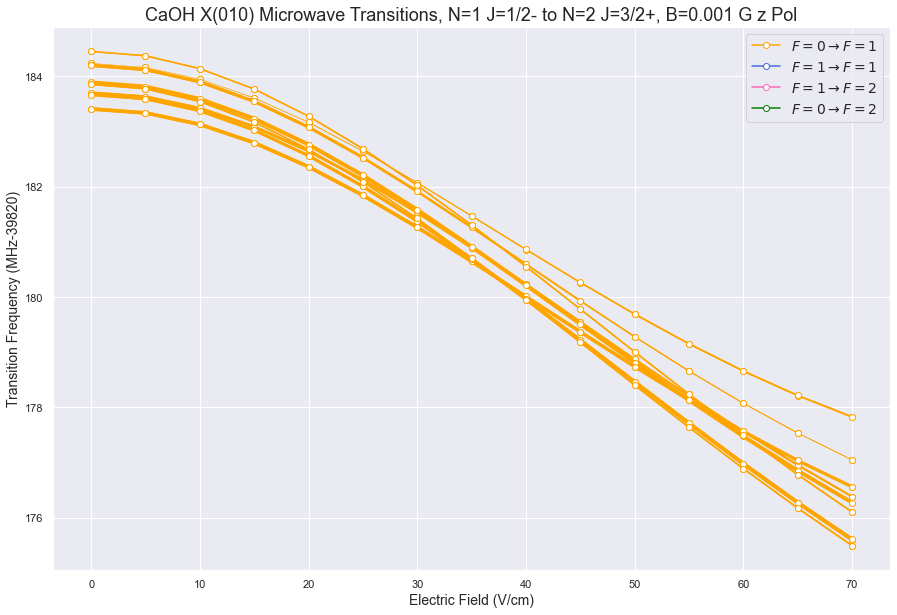

B = 0.001 g

E (V/cm) = 0.0
Pol = z
Transition                                      Estimated Frequency (MHz-39820)    Dipole Moment (D)
--------------------------------------------  ---------------------------------  -------------------
(N=1+,J=0.5,F=1,M=1)->(N=2-,J=1.5,F=2,M=2)                           183.408594              -0.5191
(N=1+,J=0.5,F=1,M=-1)->(N=2-,J=1.5,F=2,M=-2)                         183.409346               0.5191
(N=1+,J=0.5,F=1,M=1)->(N=2-,J=1.5,F=2,M=1)                           183.664913              -0.3718
(N=1+,J=0.5,F=1,M=-1)->(N=2-,J=1.5,F=2,M=-1)                         183.665198               0.3722
(N=1+,J=0.5,F=1,M=0)->(N=2-,J=1.5,F=2,M=1)                           183.700370              -0.4185
(N=1+,J=0.5,F=1,M=0)->(N=2-,J=1.5,F=2,M=-1)                          183.701625              -0.4184
(N=1+,J=0.5,F=1,M=-1)->(N=2-,J=1.5,F=2,M=0)                          183.852285               0.2140
(N=1+,J=0.5,F=1,M=1)->(N=2-,J=1.5,F=2,M=0)             

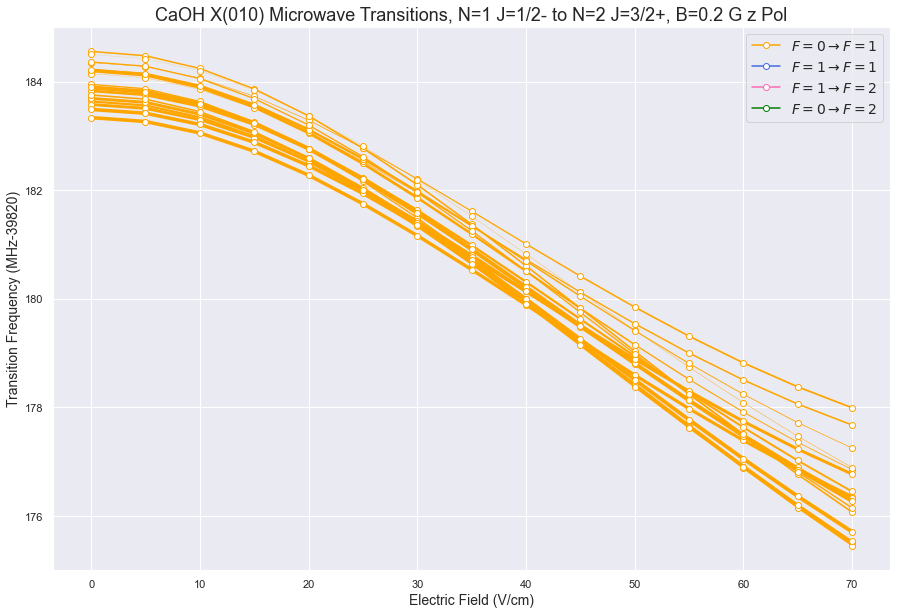

B = 0.2 g

E (V/cm) = 0.0
Pol = z
Transition                                      Estimated Frequency (MHz-39820)    Dipole Moment (D)
--------------------------------------------  ---------------------------------  -------------------
(N=1+,J=0.5,F=1,M=1)->(N=2-,J=1.5,F=2,M=2)                           183.335705               0.5205
(N=1+,J=0.5,F=1,M=-1)->(N=2-,J=1.5,F=2,M=-2)                         183.486045               0.5177
(N=1+,J=0.5,F=1,M=0)->(N=2-,J=1.5,F=2,M=1)                           183.576883              -0.4326
(N=1+,J=0.5,F=1,M=1)->(N=2-,J=1.5,F=2,M=1)                           183.633612               0.3277
(N=1+,J=0.5,F=1,M=-1)->(N=2-,J=1.5,F=2,M=-1)                         183.690259              -0.4171
(N=1+,J=0.5,F=1,M=-1)->(N=2-,J=1.5,F=2,M=0)                          183.752817              -0.2322
(N=1+,J=0.5,F=1,M=0)->(N=2-,J=1.5,F=2,M=-1)                          183.827547              -0.4028
(N=1+,J=0.5,F=1,M=0)->(N=2-,J=1.5,F=2,M=0)               

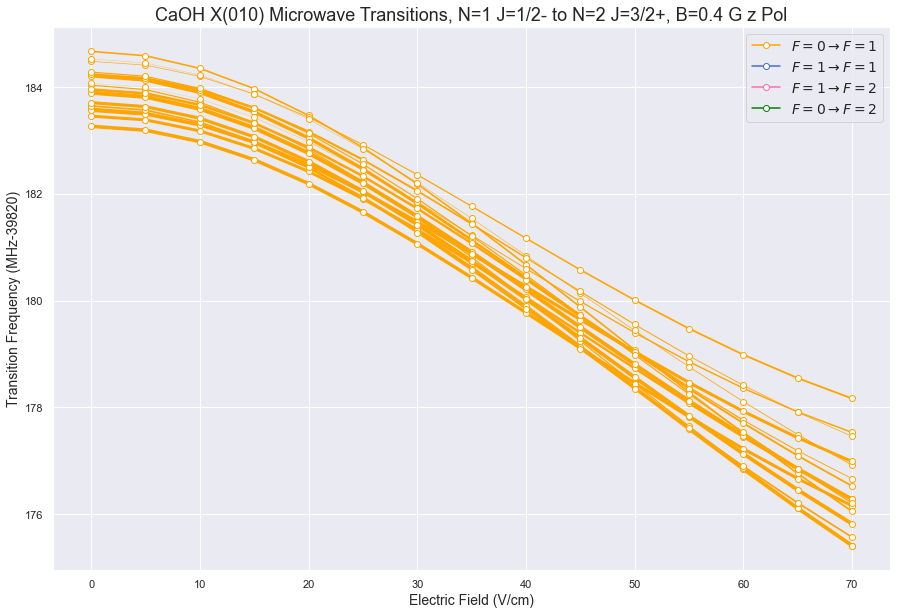

B = 0.4 g

E (V/cm) = 0.0
Pol = z
Transition                                      Estimated Frequency (MHz-39820)    Dipole Moment (D)
--------------------------------------------  ---------------------------------  -------------------
(N=1+,J=0.5,F=1,M=1)->(N=2-,J=1.5,F=2,M=2)                           183.266158              -0.5219
(N=1+,J=0.5,F=1,M=0)->(N=2-,J=1.5,F=2,M=1)                           183.456764              -0.4453
(N=1+,J=0.5,F=1,M=-1)->(N=2-,J=1.5,F=2,M=-2)                         183.567021              -0.5162
(N=1+,J=0.5,F=1,M=1)->(N=2-,J=1.5,F=2,M=1)                           183.597540               0.2875
(N=1+,J=0.5,F=1,M=-1)->(N=2-,J=1.5,F=2,M=0)                          183.647464              -0.2481
(N=1+,J=0.5,F=1,M=-1)->(N=2-,J=1.5,F=2,M=-1)                         183.708377              -0.4589
(N=1+,J=0.5,F=1,M=0)->(N=2-,J=1.5,F=2,M=0)                           183.894503               0.6006
(N=1+,J=0.5,F=1,M=0)->(N=2-,J=1.5,F=2,M=-1)              

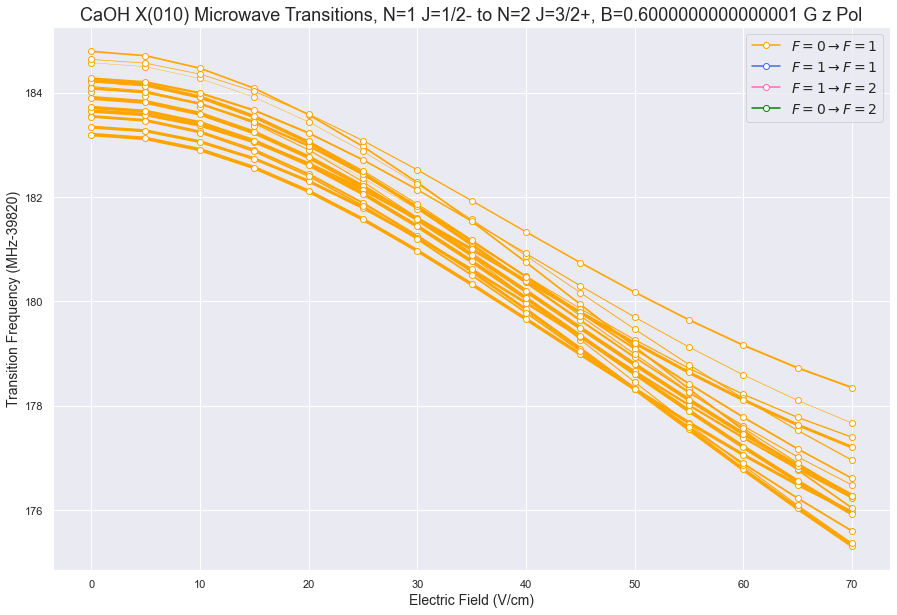

B = 0.6000000000000001 g

E (V/cm) = 0.0
Pol = z
Transition                                      Estimated Frequency (MHz-39820)    Dipole Moment (D)
--------------------------------------------  ---------------------------------  -------------------
(N=1+,J=0.5,F=1,M=1)->(N=2-,J=1.5,F=2,M=2)                           183.200231              -0.5232
(N=1+,J=0.5,F=1,M=0)->(N=2-,J=1.5,F=2,M=1)                           183.342053               0.4565
(N=1+,J=0.5,F=1,M=-1)->(N=2-,J=1.5,F=2,M=0)                          183.537820              -0.2613
(N=1+,J=0.5,F=1,M=1)->(N=2-,J=1.5,F=2,M=1)                           183.558606              -0.2527
(N=1+,J=0.5,F=1,M=-1)->(N=2-,J=1.5,F=2,M=-2)                         183.651986               0.5146
(N=1+,J=0.5,F=1,M=-1)->(N=2-,J=1.5,F=2,M=-1)                         183.719759              -0.4941
(N=1+,J=0.5,F=1,M=0)->(N=2-,J=1.5,F=2,M=0)                           183.902439               0.5991
(N=1+,J=0.5,F=1,M=0)->(N=2-,J=1.5,F=1,M=1)

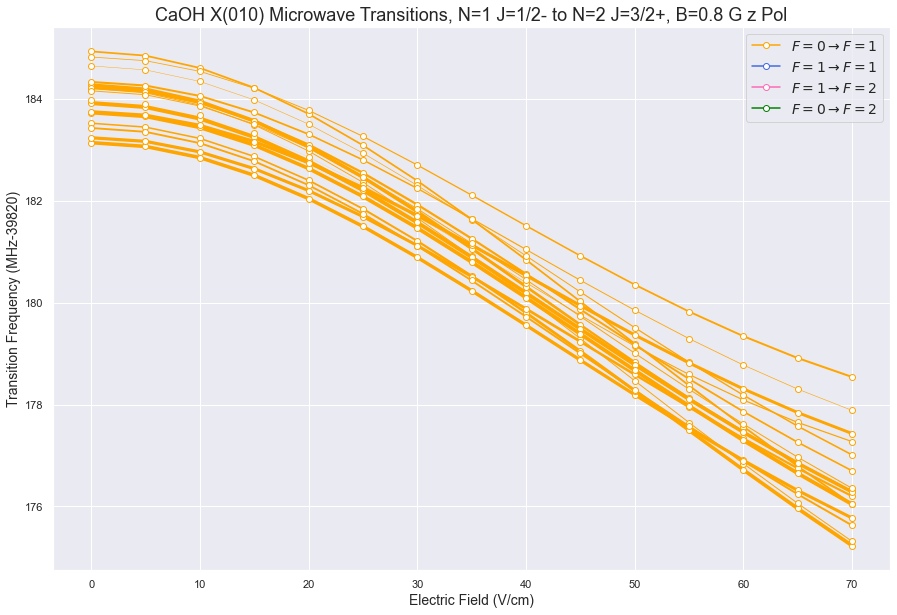

B = 0.8 g

E (V/cm) = 0.0
Pol = z
Transition                                      Estimated Frequency (MHz-39820)    Dipole Moment (D)
--------------------------------------------  ---------------------------------  -------------------
(N=1+,J=0.5,F=1,M=1)->(N=2-,J=1.5,F=2,M=2)                           183.137828               0.5244
(N=1+,J=0.5,F=1,M=0)->(N=2-,J=1.5,F=2,M=1)                           183.233694               0.4663
(N=1+,J=0.5,F=1,M=-1)->(N=2-,J=1.5,F=2,M=0)                          183.425283               0.2720
(N=1+,J=0.5,F=1,M=1)->(N=2-,J=1.5,F=2,M=1)                           183.518335               0.2234
(N=1+,J=0.5,F=1,M=-1)->(N=2-,J=1.5,F=2,M=-1)                         183.725783               0.5214
(N=1+,J=0.5,F=1,M=-1)->(N=2-,J=1.5,F=2,M=-2)                         183.741024               0.5130
(N=1+,J=0.5,F=1,M=0)->(N=2-,J=1.5,F=2,M=0)                           183.914512               0.5976
(N=1+,J=0.5,F=1,M=0)->(N=2-,J=1.5,F=1,M=1)               

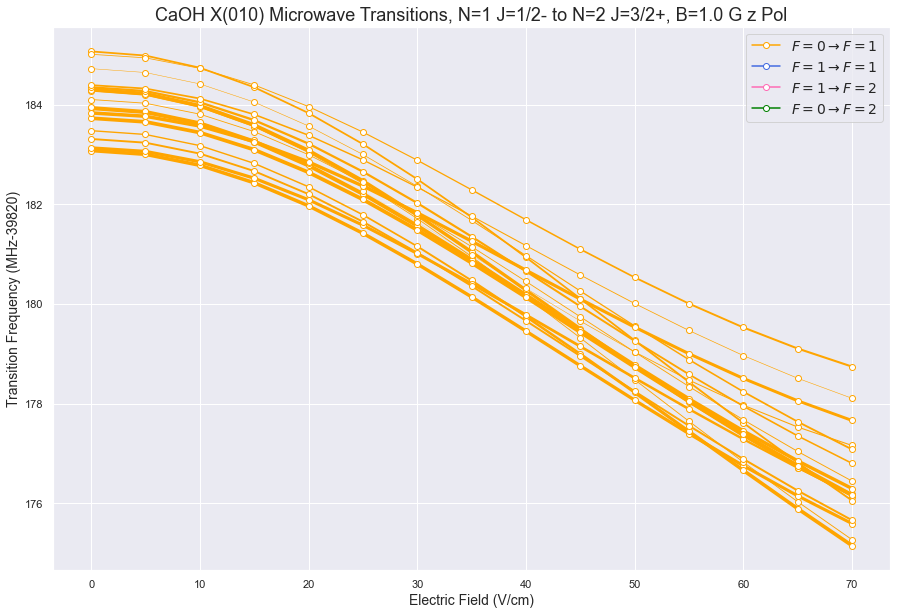

B = 1.0 g

E (V/cm) = 0.0
Pol = z
Transition                                      Estimated Frequency (MHz-39820)    Dipole Moment (D)
--------------------------------------------  ---------------------------------  -------------------
(N=1+,J=0.5,F=1,M=1)->(N=2-,J=1.5,F=2,M=2)                           183.078848               0.5256
(N=1+,J=0.5,F=1,M=0)->(N=2-,J=1.5,F=2,M=1)                           183.132121               0.4749
(N=1+,J=0.5,F=1,M=-1)->(N=2-,J=1.5,F=2,M=0)                          183.311243               0.2805
(N=1+,J=0.5,F=1,M=1)->(N=2-,J=1.5,F=2,M=1)                           183.477886              -0.1991
(N=1+,J=0.5,F=1,M=-1)->(N=2-,J=1.5,F=2,M=-1)                         183.728282               0.5418
(N=1+,J=0.5,F=1,M=-1)->(N=2-,J=1.5,F=2,M=-2)                         183.834213               0.5114
(N=1+,J=0.5,F=1,M=0)->(N=2-,J=1.5,F=2,M=0)                           183.931175              -0.5961
(N=1+,J=0.5,F=1,M=0)->(N=2-,J=1.5,F=1,M=1)               

In [65]:
pol = 'z'
print_bool = True
for B in Trans_B.keys():
    Nall.eigensystem(0,B)
    g1 = Nall.select_q({'N':1,'J':0.5,'F':[1]},parity='+')
    e1 = Nall.select_q({'N':2,'J':1.5,'F':[1,2]},parity='-')
    g2 = Nall.select_q({'N':1,'J':0.5,'F':[1]},parity='-')
    e2 = Nall.select_q({'N':2,'J':1.5,'F':[1]},parity='+')
    g4 = Nall.select_q({'N':1,'J':0.5,'F':[1]},parity='-')
    e4 = Nall.select_q({'N':2,'J':1.5,'F':[2]},parity='+')
    g5 = Nall.select_q({'N':1,'J':0.5,'F':[0]},parity='-')
    e5 = Nall.select_q({'N':2,'J':1.5,'F':[2]},parity='+')
    g3 = Nall.select_q({'N':1,'J':0.5,'F':[0,1]},parity='-')
    e3 = Nall.select_q({'N':2,'J':1.5,'F':[1,2]},parity='+')
    fig,a = plt.subplots(figsize=(15,10))
#     TDM_E = Trans_B[B][pol][0]
    TDM_E = Trans_B[B]['z'][0] + Trans_B[B]['x'][0]
    dE_E,t_str_E = Trans_B[B][pol][1:]
#     N1.eigensystem(E,1e-4)
#     N2.eigensystem(E,1e-4)
#     g1 = N1.select_q({'N':1,'J':0.5,'F':[0]},parity='-')
#     e1 = N2.select_q({'N':2,'J':1.5,'F':[1]},parity='+')
#     g2 = N1.select_q({'N':1,'J':0.5,'F':[1]},parity='-')
#     e2 = N2.select_q({'N':2,'J':1.5,'F':[1]},parity='+')
#     g4 = N1.select_q({'N':1,'J':0.5,'F':[1]},parity='-')
#     e4 = N2.select_q({'N':2,'J':1.5,'F':[2]},parity='+')
#     g5 = N1.select_q({'N':1,'J':0.5,'F':[0]},parity='-')
#     e5 = N2.select_q({'N':2,'J':1.5,'F':[2]},parity='+')
#     g3 = N1.select_q({'N':1,'J':0.5,'F':[0,1]},parity='-')
#     e3 = N2.select_q({'N':2,'J':1.5,'F':[1,2]},parity='+')
#     fig,a = plt.subplots(figsize=(12,8))
#     TDM_B,dE_B,t_str_B = Trans_E[E][pol]
    
#     g = N1.select_q({'N':1,'J':0.5,'F':0},parity='-')
#     e = N2.select_q({'N':2,'J':1.5,'M':[-2,-1,1,2]},parity='+')
#     plot_B(Bscan,TDM_B,dE_B,g_idx=g,e_idx=e,linescale=10,figure=fig,color='pink',marker=None,mfc='white')
#     g = N1.select_q({'N':1,'J':0.5,'F':[1]},parity='-')
#     e = N2.select_q({'N':2,'J':1.5,'M':[-2,-1,0,1,2]},parity='+')
#     plot_E(Escan,TDM_E,dE_E,g_idx=g4,e_idx=e4,linescale=10,figure=fig,color='hotpink',marker='o',mfc='white')
#     plot_E(Escan,TDM_E,dE_E,g_idx=g5,e_idx=e5,linescale=10,figure=fig,color='green',marker='o',mfc='white')
#     plot_E(Escan,TDM_E,dE_E,g_idx=g2,e_idx=e2,linescale=10,figure=fig,color='royalblue',marker='o',mfc='white')
    plot_E(Escan,TDM_E,dE_E,g_idx=g1,e_idx=e1,linescale=10,figure=fig,color='orange',marker='o',mfc='white')
    colors = ['orange','royalblue','hotpink','green']
    mark = ['o','o','o','o']
    mf = ['white','white','white','white']
    lines = [plt.Line2D([0], [0], color=c, marker=mk,mfc=m) for c,m,mk in zip(colors,mf,mark)]
    labels = [r'$F=0\rightarrow F=1$',r'$F=1\rightarrow F=1$',r'$F=1\rightarrow F=2$',r'$F=0\rightarrow F=2$']#,r'$M_e\neq0$']
    plt.legend(lines, labels,loc='best',fontsize=14)
    plt.title('CaOH X(010) Microwave Transitions, N=1 J=1/2- to N=2 J=3/2+, B={} G {} Pol'.format(B,pol),fontsize=18)
    plt.show()
    if print_bool:
        print('B = {} g'.format(B))
        table = print_table_E(Escan,TDM_E,dE_E,t_str_E,g1,e1,thresh = 0.001,cut=True,dipole=pol)

In [40]:
Nall.select_q({'N':2,'J':1.5,'M':0,'F':2},parity='+')

array([28])

In [43]:
TDM_E[0,]

(15, 64, 64)

In [54]:
Nall.eigensystem(0,1e-3);
Nall.select_q({'N':2,'J':1.5,'M':0,'F':2},parity='+')[0]

28

In [55]:
Nall.eigensystem(0,1e-3);
Nall.select_q({'N':1,'J':0.5,'M':0,'F':0},parity='-')[0]

3

In [56]:
Bscan

array([0.001, 0.2  , 0.4  , 0.6  , 0.8  , 1.   ])

In [59]:
TDM_E = Trans_B[.001]['z'][0]
TDM_E[14,3,28]

0.0003662272746491098

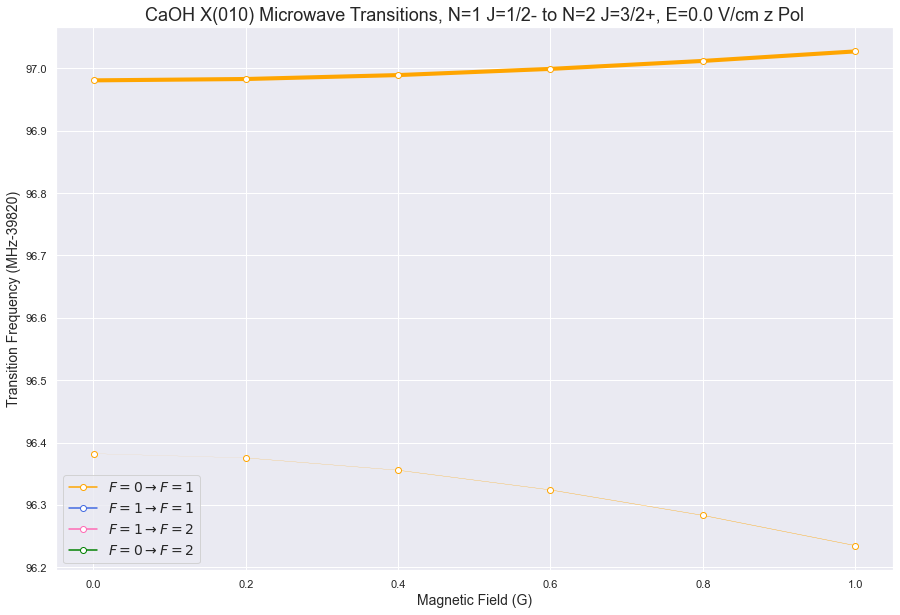

E = 0.0 V/cm

B (G) = 0.001
Pol = z
Transition                                    Estimated Frequency (MHz-39820)    Dipole Moment (D)
------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=1,M=0)                          96.980648              -0.5992

B (G) = 0.2
Pol = z
Transition                                    Estimated Frequency (MHz-39820)    Dipole Moment (D)
------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=2,M=0)                          96.375337              -0.0176
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=1,M=0)                          96.982820              -0.5990

B (G) = 0.4
Pol = z
Transition                                    Estimated Frequency (MHz-39820)    Dipole Moment (D)
------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=1

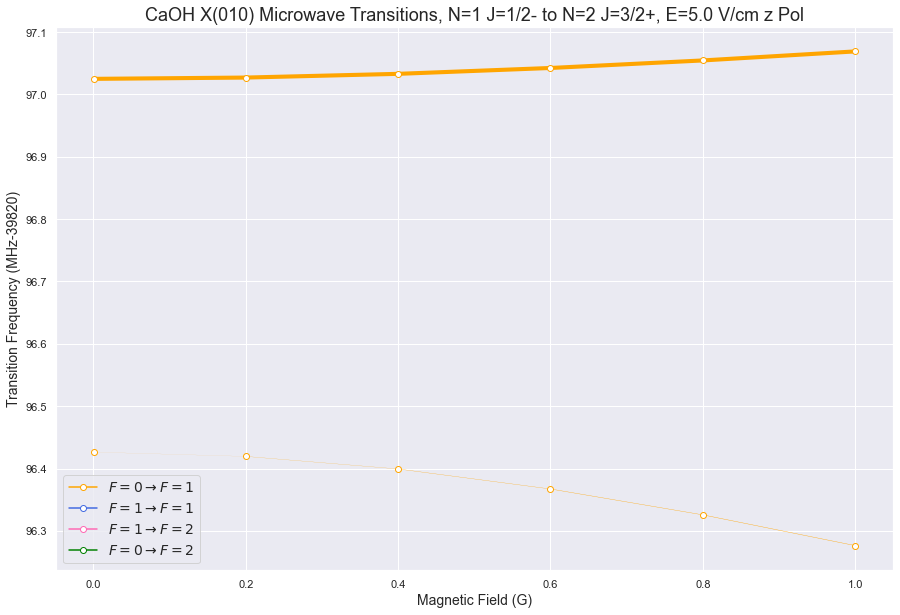

E = 5.0 V/cm

B (G) = 0.001
Pol = z
Transition                                    Estimated Frequency (MHz-39820)    Dipole Moment (D)
------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=1,M=0)                          97.024908              -0.5988

B (G) = 0.2
Pol = z
Transition                                    Estimated Frequency (MHz-39820)    Dipole Moment (D)
------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=2,M=0)                          96.419526               0.0171
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=1,M=0)                          97.026969              -0.5987

B (G) = 0.4
Pol = z
Transition                                    Estimated Frequency (MHz-39820)    Dipole Moment (D)
------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=1

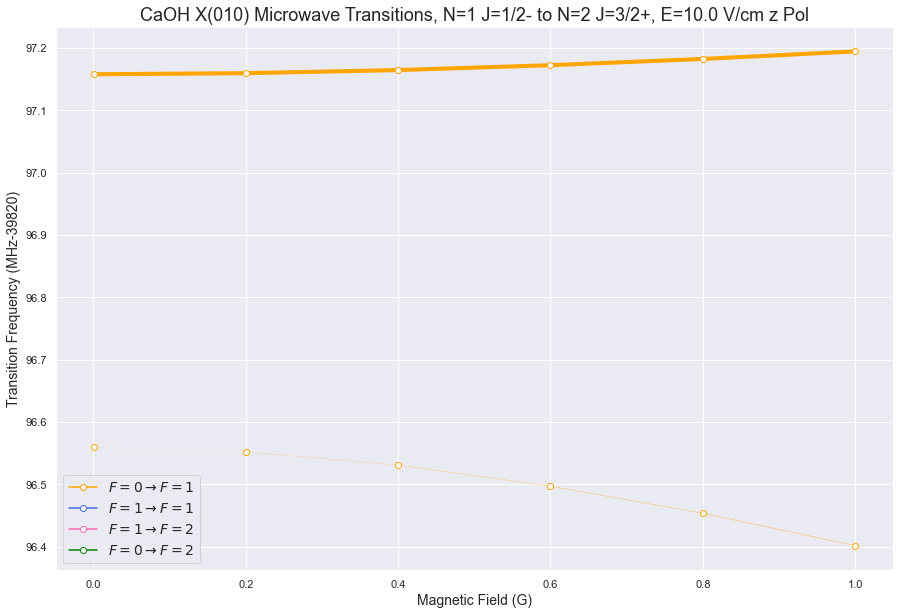

E = 10.0 V/cm

B (G) = 0.001
Pol = z
Transition                                    Estimated Frequency (MHz-39820)    Dipole Moment (D)
------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=1,M=0)                          97.157649              -0.5978

B (G) = 0.2
Pol = z
Transition                                    Estimated Frequency (MHz-39820)    Dipole Moment (D)
------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=2,M=0)                          96.552048               0.0157
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=1,M=0)                          97.159372              -0.5977

B (G) = 0.4
Pol = z
Transition                                    Estimated Frequency (MHz-39820)    Dipole Moment (D)
------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=

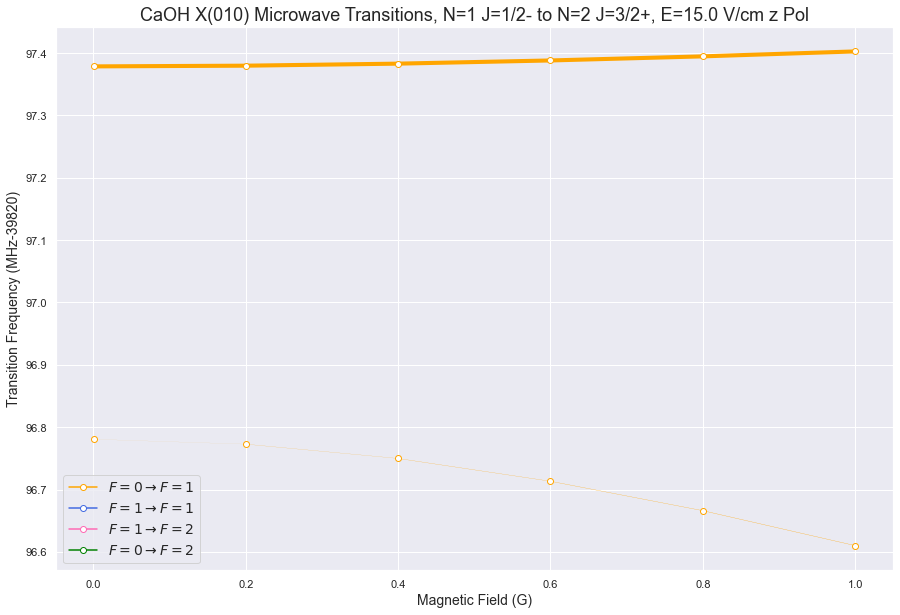

E = 15.0 V/cm

B (G) = 0.001
Pol = z
Transition                                    Estimated Frequency (MHz-39820)    Dipole Moment (D)
------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=1,M=0)                          97.378739               0.5961

B (G) = 0.2
Pol = z
Transition                                    Estimated Frequency (MHz-39820)    Dipole Moment (D)
------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=2,M=0)                          96.772749              -0.0133
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=1,M=0)                          97.379874               0.5961

B (G) = 0.4
Pol = z
Transition                                    Estimated Frequency (MHz-39820)    Dipole Moment (D)
------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=

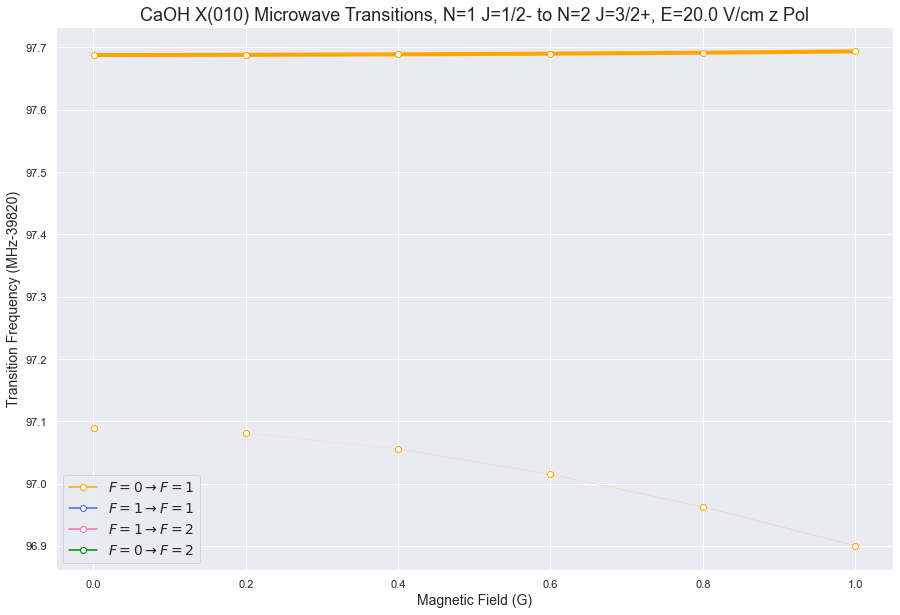

E = 20.0 V/cm

B (G) = 0.001
Pol = z
Transition                                    Estimated Frequency (MHz-39820)    Dipole Moment (D)
------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=1,M=0)                          97.687879               0.5938

B (G) = 0.2
Pol = z
Transition                                    Estimated Frequency (MHz-39820)    Dipole Moment (D)
------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=2,M=0)                          97.081297              -0.0100
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=1,M=0)                          97.688144               0.5938

B (G) = 0.4
Pol = z
Transition                                    Estimated Frequency (MHz-39820)    Dipole Moment (D)
------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=

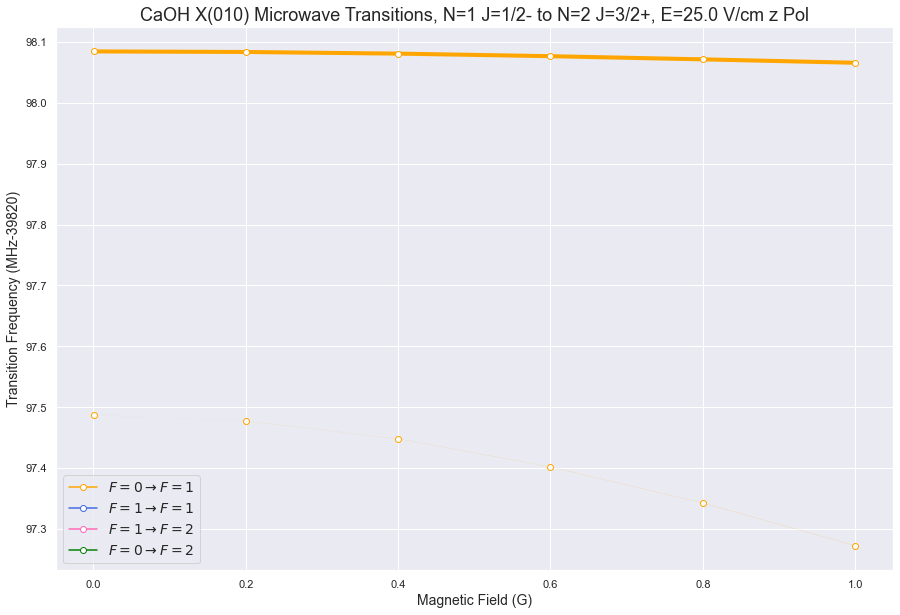

E = 25.0 V/cm

B (G) = 0.001
Pol = z
Transition                                    Estimated Frequency (MHz-39820)    Dipole Moment (D)
------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=1,M=0)                          98.084507               0.5908

B (G) = 0.2
Pol = z
Transition                                    Estimated Frequency (MHz-39820)    Dipole Moment (D)
------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=2,M=0)                          97.477086              -0.0058
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=1,M=0)                          98.083576               0.5909

B (G) = 0.4
Pol = z
Transition                                    Estimated Frequency (MHz-39820)    Dipole Moment (D)
------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=

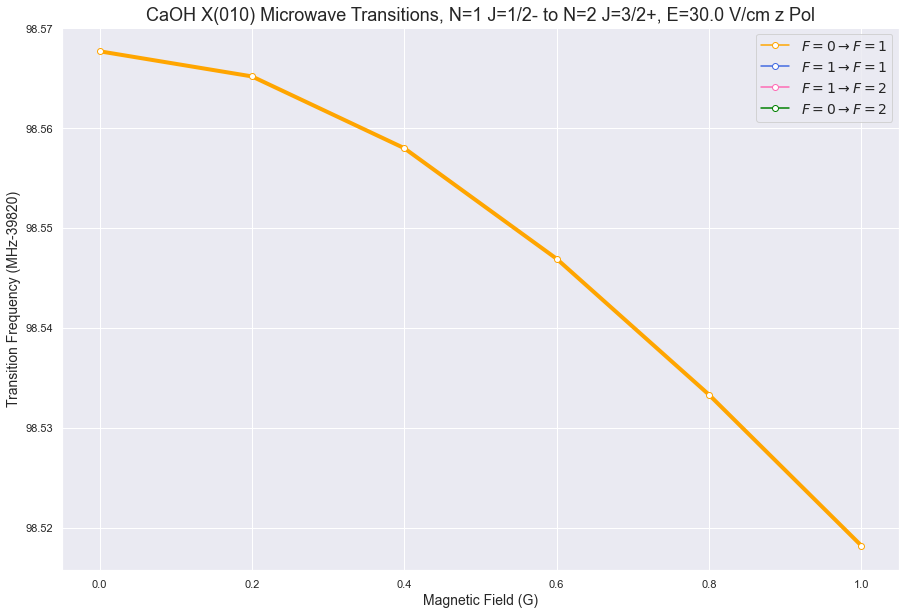

E = 30.0 V/cm

B (G) = 0.001
Pol = z
Transition                                    Estimated Frequency (MHz-39820)    Dipole Moment (D)
------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=1,M=0)                          98.567681               0.5871

B (G) = 0.2
Pol = z
Transition                                    Estimated Frequency (MHz-39820)    Dipole Moment (D)
------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=1,M=0)                          98.565178               0.5873

B (G) = 0.4
Pol = z
Transition                                    Estimated Frequency (MHz-39820)    Dipole Moment (D)
------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=2,M=0)                          97.925381              -0.0010
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=

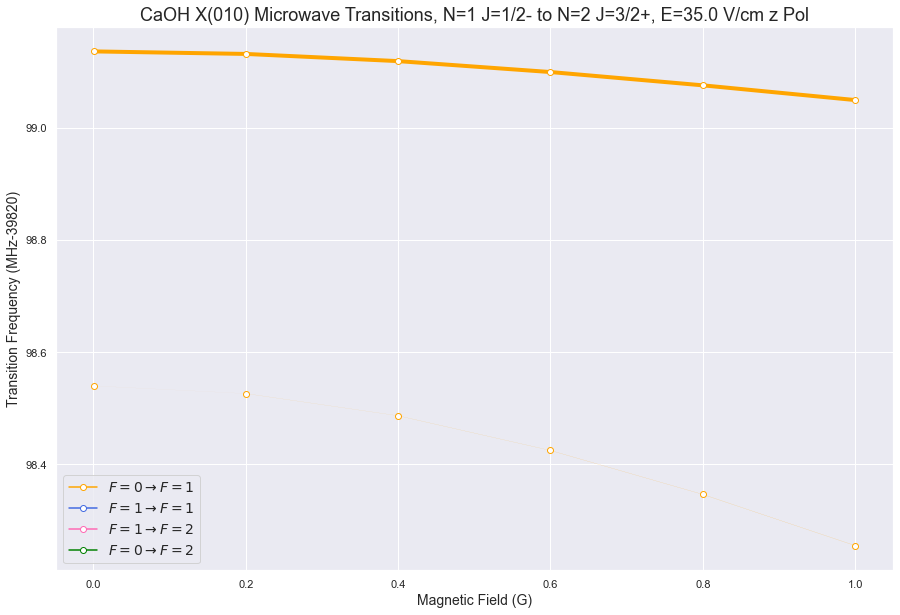

E = 35.0 V/cm

B (G) = 0.001
Pol = z
Transition                                    Estimated Frequency (MHz-39820)    Dipole Moment (D)
------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=1,M=0)                          99.135972               0.5829

B (G) = 0.2
Pol = z
Transition                                    Estimated Frequency (MHz-39820)    Dipole Moment (D)
------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=2,M=0)                          98.525934               0.0054
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=1,M=0)                          99.131472               0.5831

B (G) = 0.4
Pol = z
Transition                                    Estimated Frequency (MHz-39820)    Dipole Moment (D)
------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=

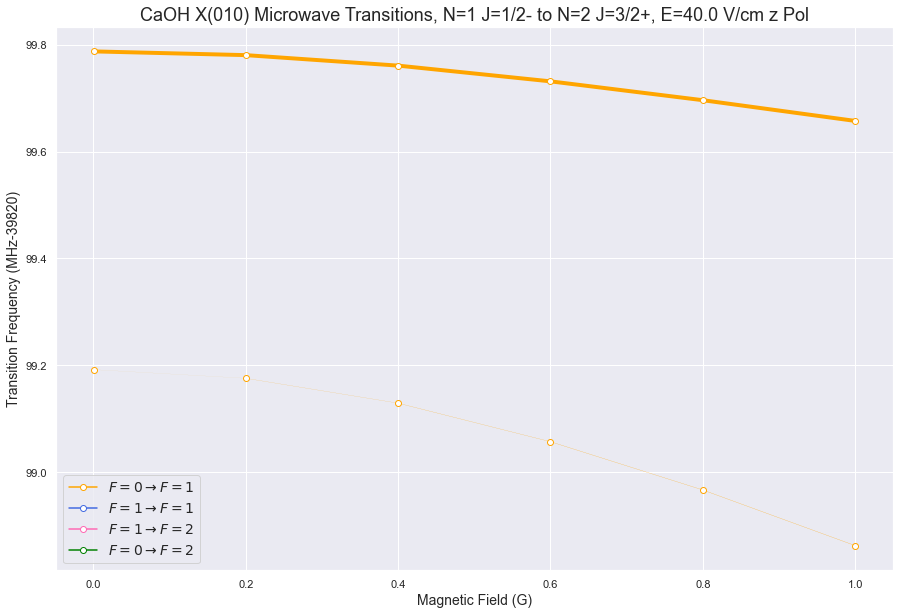

E = 40.0 V/cm

B (G) = 0.001
Pol = z
Transition                                    Estimated Frequency (MHz-39820)    Dipole Moment (D)
------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=1,M=0)                          99.787380               0.5781

B (G) = 0.2
Pol = z
Transition                                    Estimated Frequency (MHz-39820)    Dipole Moment (D)
------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=2,M=0)                          99.175469               0.0123
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=1,M=0)                          99.780414               0.5783

B (G) = 0.4
Pol = z
Transition                                    Estimated Frequency (MHz-39820)    Dipole Moment (D)
------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=

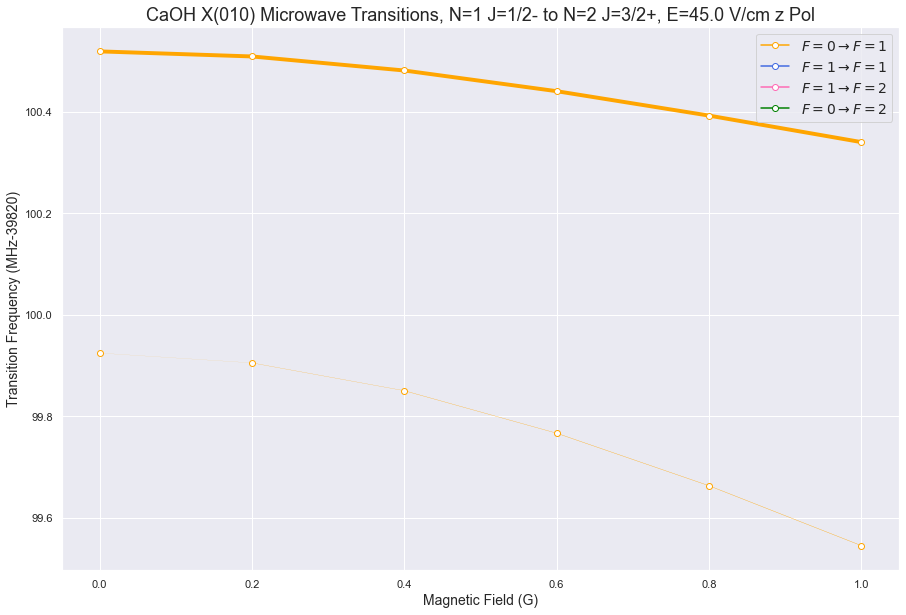

E = 45.0 V/cm

B (G) = 0.001
Pol = z
Transition                                    Estimated Frequency (MHz-39820)    Dipole Moment (D)
------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=1,M=0)                         100.519297               0.5729

B (G) = 0.2
Pol = z
Transition                                    Estimated Frequency (MHz-39820)    Dipole Moment (D)
------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=2,M=0)                          99.905083               0.0200
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=1,M=0)                         100.509356               0.5729

B (G) = 0.4
Pol = z
Transition                                    Estimated Frequency (MHz-39820)    Dipole Moment (D)
------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=

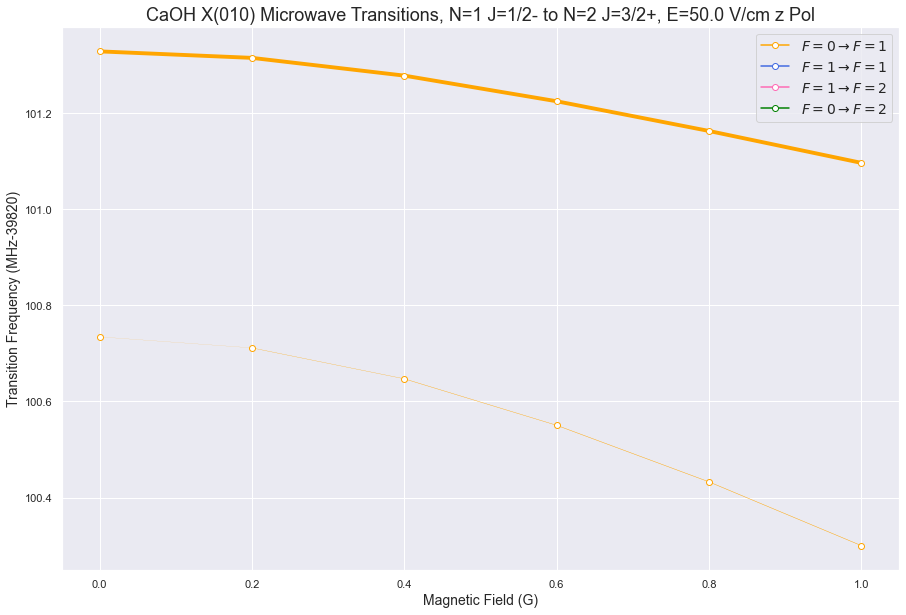

E = 50.0 V/cm

B (G) = 0.001
Pol = z
Transition                                    Estimated Frequency (MHz-39820)    Dipole Moment (D)
------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=1,M=0)                         101.328515               0.5672

B (G) = 0.2
Pol = z
Transition                                    Estimated Frequency (MHz-39820)    Dipole Moment (D)
------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=2,M=0)                         100.711545               0.0283
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=1,M=0)                         101.315069               0.5670

B (G) = 0.4
Pol = z
Transition                                    Estimated Frequency (MHz-39820)    Dipole Moment (D)
------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=

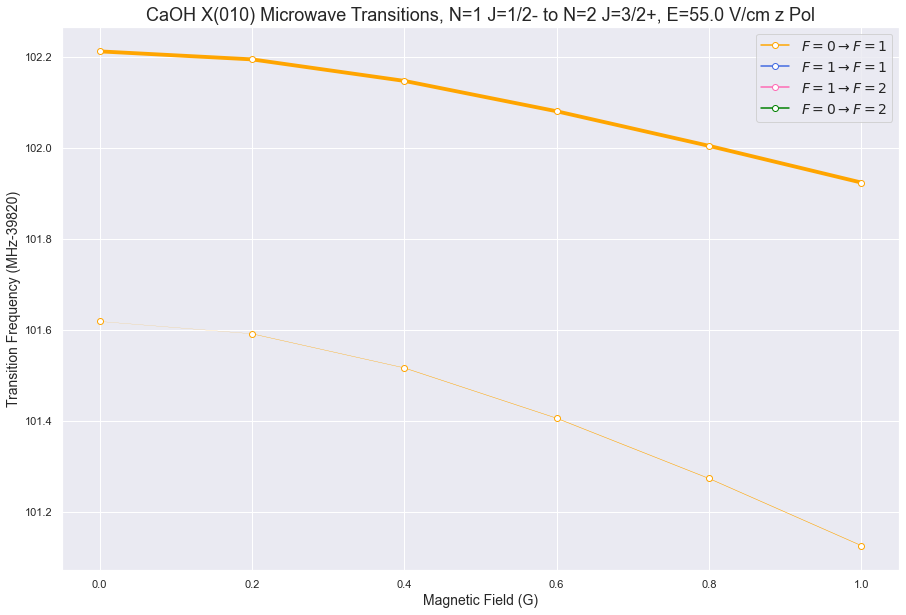

E = 55.0 V/cm

B (G) = 0.001
Pol = z
Transition                                    Estimated Frequency (MHz-39820)    Dipole Moment (D)
------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=1,M=0)                         102.211289               0.5613

B (G) = 0.2
Pol = z
Transition                                    Estimated Frequency (MHz-39820)    Dipole Moment (D)
------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=2,M=0)                         101.591100               0.0373
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=1,M=0)                         102.193797               0.5606

B (G) = 0.4
Pol = z
Transition                                    Estimated Frequency (MHz-39820)    Dipole Moment (D)
------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=

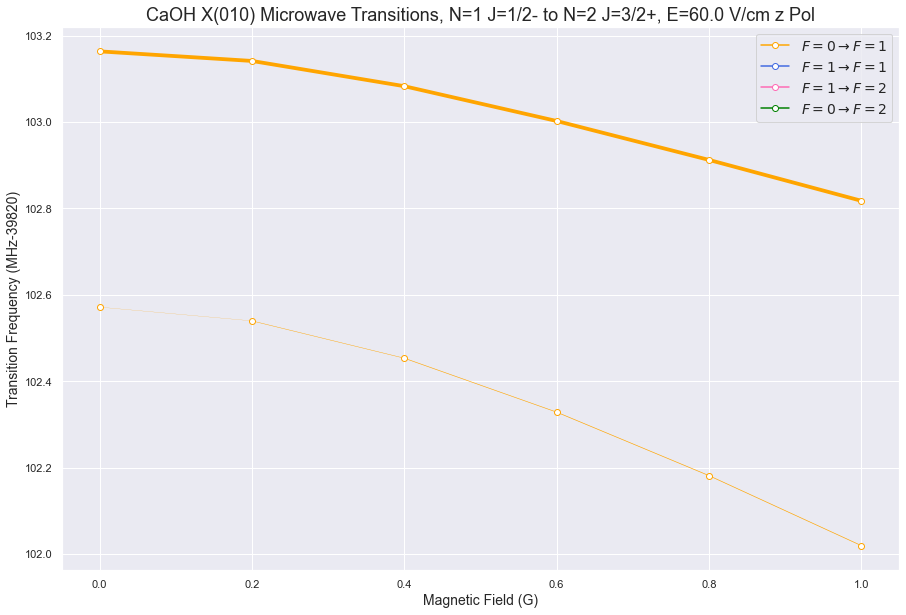

E = 60.0 V/cm

B (G) = 0.001
Pol = z
Transition                                    Estimated Frequency (MHz-39820)    Dipole Moment (D)
------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=1,M=0)                         103.163429               0.5551

B (G) = 0.2
Pol = z
Transition                                    Estimated Frequency (MHz-39820)    Dipole Moment (D)
------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=2,M=0)                         102.539569              -0.0467
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=1,M=0)                         103.141363               0.5538

B (G) = 0.4
Pol = z
Transition                                    Estimated Frequency (MHz-39820)    Dipole Moment (D)
------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=

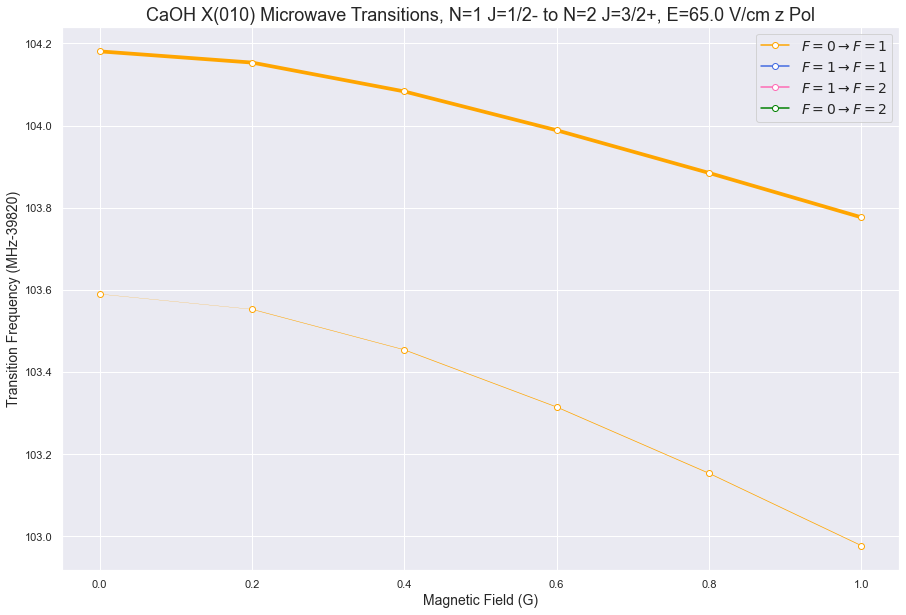

E = 65.0 V/cm

B (G) = 0.001
Pol = z
Transition                                    Estimated Frequency (MHz-39820)    Dipole Moment (D)
------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=1,M=0)                         104.180434               0.5489

B (G) = 0.2
Pol = z
Transition                                    Estimated Frequency (MHz-39820)    Dipole Moment (D)
------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=2,M=0)                         103.552479              -0.0565
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=1,M=0)                         104.153292               0.5467

B (G) = 0.4
Pol = z
Transition                                    Estimated Frequency (MHz-39820)    Dipole Moment (D)
------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=

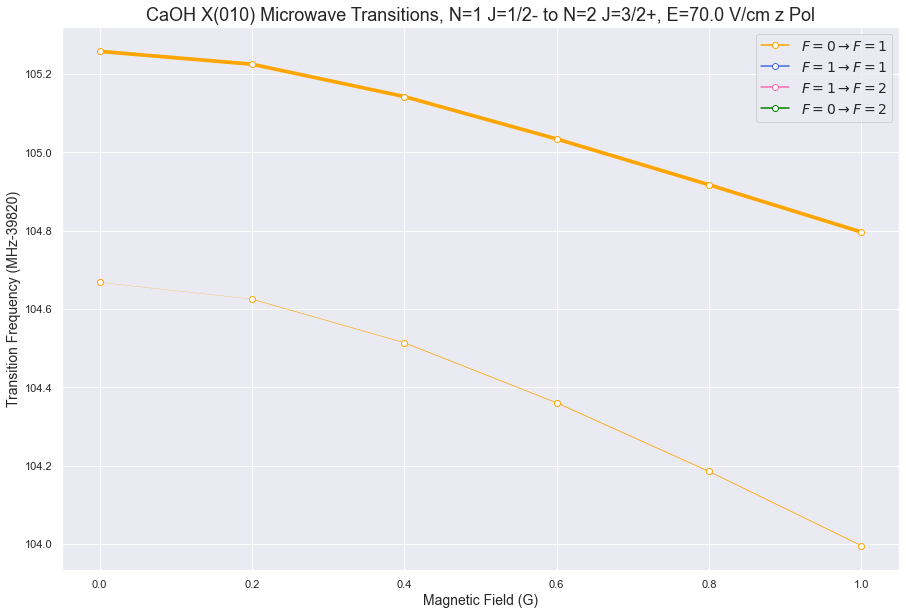

E = 70.0 V/cm

B (G) = 0.001
Pol = z
Transition                                    Estimated Frequency (MHz-39820)    Dipole Moment (D)
------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=1,M=0)                         105.257621               0.5426

B (G) = 0.2
Pol = z
Transition                                    Estimated Frequency (MHz-39820)    Dipole Moment (D)
------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=2,M=0)                         104.625188              -0.0664
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=1,M=0)                         105.224946               0.5393

B (G) = 0.4
Pol = z
Transition                                    Estimated Frequency (MHz-39820)    Dipole Moment (D)
------------------------------------------  ---------------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=

In [24]:
pol = 'z'
print_bool = True
for E in Trans_E.keys():
    Nall.eigensystem(E,1e-4)
    g1 = Nall.select_q({'N':1,'J':0.5,'F':[0]},parity='-')
    e1 = Nall.select_q({'N':2,'J':1.5,'F':[1,2]},parity='+')
    g2 = Nall.select_q({'N':1,'J':0.5,'F':[1]},parity='-')
    e2 = Nall.select_q({'N':2,'J':1.5,'F':[1,2]},parity='+')
#     g4 = Nall.select_q({'N':1,'J':0.5,'F':[1]},parity='-')
#     e4 = Nall.select_q({'N':2,'J':1.5,'F':[2]},parity='+')
#     g5 = Nall.select_q({'N':1,'J':0.5,'F':[0]},parity='-')
#     e5 = Nall.select_q({'N':2,'J':1.5,'F':[2]},parity='+')
    g3 = Nall.select_q({'N':1,'J':0.5,'F':[0,1]},parity='-')
    e3 = Nall.select_q({'N':2,'J':1.5,'F':[1,2]},parity='+')
    fig,a = plt.subplots(figsize=(15,10))
    TDM_B,dE_B,t_str_B = Trans_E[E][pol]
#     N1.eigensystem(E,1e-4)
#     N2.eigensystem(E,1e-4)
#     g1 = N1.select_q({'N':1,'J':0.5,'F':[0]},parity='-')
#     e1 = N2.select_q({'N':2,'J':1.5,'F':[1]},parity='+')
#     g2 = N1.select_q({'N':1,'J':0.5,'F':[1]},parity='-')
#     e2 = N2.select_q({'N':2,'J':1.5,'F':[1]},parity='+')
#     g4 = N1.select_q({'N':1,'J':0.5,'F':[1]},parity='-')
#     e4 = N2.select_q({'N':2,'J':1.5,'F':[2]},parity='+')
#     g5 = N1.select_q({'N':1,'J':0.5,'F':[0]},parity='-')
#     e5 = N2.select_q({'N':2,'J':1.5,'F':[2]},parity='+')
#     g3 = N1.select_q({'N':1,'J':0.5,'F':[0,1]},parity='-')
#     e3 = N2.select_q({'N':2,'J':1.5,'F':[1,2]},parity='+')
#     fig,a = plt.subplots(figsize=(12,8))
#     TDM_B,dE_B,t_str_B = Trans_E[E][pol]
    
#     g = N1.select_q({'N':1,'J':0.5,'F':0},parity='-')
#     e = N2.select_q({'N':2,'J':1.5,'M':[-2,-1,1,2]},parity='+')
#     plot_B(Bscan,TDM_B,dE_B,g_idx=g,e_idx=e,linescale=10,figure=fig,color='pink',marker=None,mfc='white')
#     g = N1.select_q({'N':1,'J':0.5,'F':[1]},parity='-')
#     e = N2.select_q({'N':2,'J':1.5,'M':[-2,-1,0,1,2]},parity='+')
#     plot_B(Bscan,TDM_B,dE_B,g_idx=g4,e_idx=e4,linescale=10,figure=fig,color='hotpink',marker='o',mfc='white')
#     plot_B(Bscan,TDM_B,dE_B,g_idx=g5,e_idx=e5,linescale=10,figure=fig,color='green',marker='o',mfc='white')
#     plot_B(Bscan,TDM_B,dE_B,g_idx=g2,e_idx=e2,linescale=10,figure=fig,color='royalblue',marker='o',mfc='white')
    plot_B(Bscan,TDM_B,dE_B,g_idx=g1,e_idx=e1,linescale=10,figure=fig,color='orange',marker='o',mfc='white')
    colors = ['orange','royalblue','hotpink','green']
    mark = ['o','o','o','o']
    mf = ['white','white','white','white']
    lines = [plt.Line2D([0], [0], color=c, marker=mk,mfc=m) for c,m,mk in zip(colors,mf,mark)]
    labels = [r'$F=0\rightarrow F=1$',r'$F=1\rightarrow F=1$',r'$F=1\rightarrow F=2$',r'$F=0\rightarrow F=2$']#,r'$M_e\neq0$']
    plt.legend(lines, labels,loc='best',fontsize=14)
    plt.title('CaOH X(010) Microwave Transitions, N=1 J=1/2- to N=2 J=3/2+, E={} V/cm {} Pol'.format(E,pol),fontsize=18)
    plt.show()
    if print_bool:
        print('E = {} V/cm'.format(E))
        table = print_table_B(Bscan,TDM_B,dE_B,t_str_B,g1,e1,thresh = 0.001,cut=True,dipole=pol)

2.5


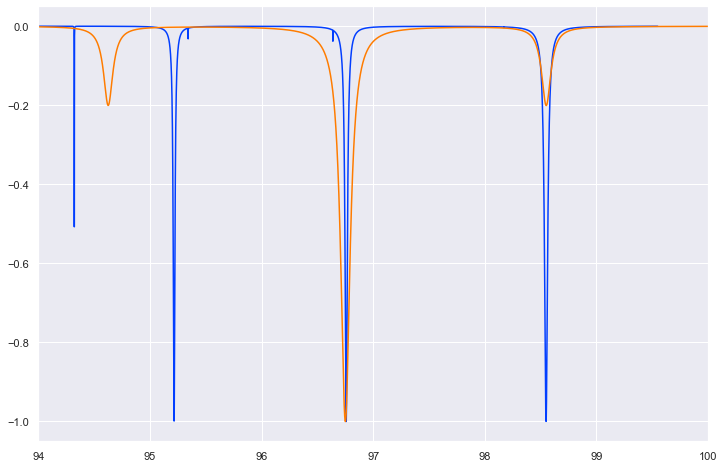

In [88]:
TDM_B,dE_B,t_str_B = Trans_E[0.1]['all']
simulate_spectra(np.square(TDM_B),dE_B,g1,e3,Bscan,F0=2.5,g=0.1,cut=True,thresh = 1e-3,dip=True);
plt.xlim(94,100)
fmin = 94
fmax = 100
freq = np.linspace(fmin,fmax,10000)
tot_lor = np.zeros(10000)
# all_param = [[96.78,0.2,1],[97.54,0.2,1],[98.14,0.2,1]]
all_param = [[94.625,0.1,0.2],[96.75,0.1,1],[98.55,0.1,0.2]]
for param in all_param:
    tot_lor+=lorentzian(freq,*param)
if True:
    tot_lor*=-1
plt.plot(freq,tot_lor)

2.7


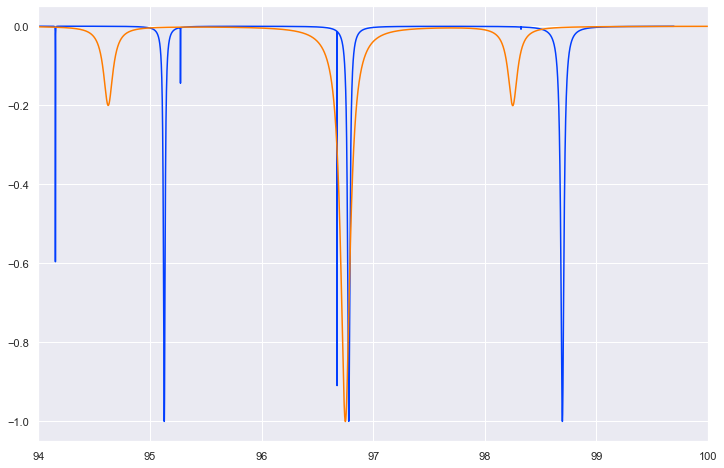

In [35]:
TDM_B,dE_B,t_str_B = Trans_E[0.1]['all']
simulate_spectra(np.square(TDM_B),dE_B,g1,e3,Bscan,F0=2.7,g=0.1,cut=True,thresh = 1e-3,dip=True);
plt.xlim(94,100)
fmin = 94
fmax = 100
freq = np.linspace(fmin,fmax,10000)
tot_lor = np.zeros(10000)
# all_param = [[96.78,0.2,1],[97.54,0.2,1],[98.14,0.2,1]]
all_param = [[94.625,0.1,0.2],[96.75,0.1,1],[98.25,0.1,0.2]]
for param in all_param:
    tot_lor+=lorentzian(freq,*param)
if True:
    tot_lor*=-1
plt.plot(freq,tot_lor)

In [86]:
print(np.round(19958.39*2-39820,2))
print(np.round(19958.77*2-39820,2))
print(np.round(19959.07*2-39820,2))

96.78
97.54
98.14


In [64]:
X010 = MoleculeLevels.initialize_state('CaOH','40','X010',[1,2],M_values = 'all',I=[0,1/2],S=1/2,round=6,P_values=[1/2,3/2],trap=False)

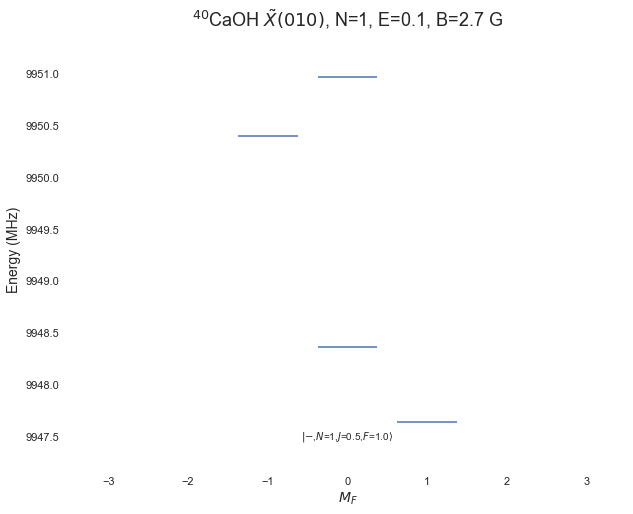

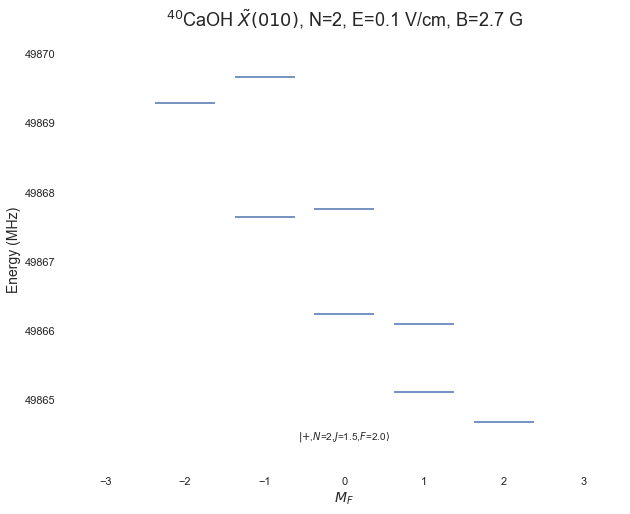

In [26]:
B0 = 2.7
E0 = 0.1
X010.I_trap=0.01324*2/3.5
X010.theta_trap= np.pi/2#np.arccos(1/np.sqrt(3))
evals, evecs = X010.eigensystem(E0,B0,order=True,method='torch')

N=1
X010.display_levels(E0,B0,'J',idx=X010.select_q({'N':1,'J':0.5},parity='-'),parity=True,label_q=[q for q in X010.q_str if q not in ['K']],label_off=0.05,figsize=(10,8),alt_label=False)
plt.title(X010.state_str+', N={}, E={}, B={} G'.format(N,E0,B0),fontsize=18)
plt.xlim(-3.5,3.5)
# plt.ylim(10000,10020)
plt.grid(False)
ax = plt.gca()
ax.set_facecolor('None')

N=2
X010.display_levels(E0,B0,'J',idx=X010.select_q({'N':2,'J':1.5},parity='+'),parity=True,label_q=[q for q in X010.q_str if q not in ['K']],label_off=0.05,figsize=(10,8),alt_label=False)
plt.title(X010.state_str+', N={}, E={} V/cm, B={} G'.format(N,E0,B0),fontsize=18)
plt.xlim(-3.5,3.5)
# plt.ylim(50000,50020)
ax = plt.gca()
ax.set_facecolor('None')
plt.grid(False)

In [27]:
B0 = 2.5
E0 = 0.1
evals, evecs = X010.eigensystem(E0,B0,order=True,method='torch')
M0_idx = X010.select_q({'N':2,'J':1.5},parity='+')
print(M0_idx)
print('\n')
for i in M0_idx:
    display(Latex('$E = '+str(np.round(X010.evals0[i],4))+r'\:\mathrm{MHz}$'))
#     print('Decoupled:')
#     display(Latex(X010.gen_state_str(i,basis='decoupled',thresh=0.05,label_q=['K','M_N','M_S','M_I','M_F'],round=4)))
    print('Case A:')
    display(Latex(X010.gen_state_str(i,basis='aBJ',thresh=0.05,label_q=['K','J','F','Sigma','P','M'],round=4)))
#     print('Case BbS:')
#     display(Latex(X010.gen_state_str(i,basis='bBS',thresh=0.05,label_q=['K','G','N','F','M'],round=4)))
    print('Case B:')
    print('Parity=',X010.parities[i])
    display(Latex(X010.gen_state_str(i,thresh=0.0005,round=4)))
    print('\n')

[24 25 26 27 28 29 30 31]




<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:
Parity= 1.0


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:
Parity= 1.0


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:
Parity= 1.0


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:
Parity= 1.0


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:
Parity= 1.0


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:
Parity= 1.0


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:
Parity= 1.0


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:
Parity= 1.0


<IPython.core.display.Latex object>

In [88]:
print(np.round(19958.39*2-39820,2))
print(np.round(19958.77*2-39820,2))
print(np.round(19959.07*2-39820,2))

96.78
97.54
98.14


In [ ]:
pol = 'z'
print_bool = True
for B in Bscan:
    N1.eigensystem(0,1e-4)
    N2.eigensystem(0,1e-4)
    g1 = N1.select_q({'N':1,'J':0.5},parity='-')
    e1 = N2.select_q({'N':2},parity='+')
    g2 = N1.select_q({'N':1,'J':1.5},parity='-')
    e2 = N2.select_q({'N':2},parity='+')
    g3 = N1.select_q({'N':1},parity='-')
    e3 = N2.select_q({'N':2},parity='+')
    fig,a = plt.subplots(figsize=(12,8))
    TDM_E,dE_E,t_str_E = Trans_B[B][pol]
    
#     g = N1.select_q({'N':1,'J':0.5,'F':0},parity='-')
#     e = N2.select_q({'N':2,'J':1.5,'M':[-2,-1,1,2]},parity='+')
#     plot_B(Bscan,TDM_B,dE_B,g_idx=g,e_idx=e,linescale=10,figure=fig,color='pink',marker=None,mfc='white')
#     g = N1.select_q({'N':1,'J':0.5,'F':[1]},parity='-')
#     e = N2.select_q({'N':2,'J':1.5,'M':[-2,-1,0,1,2]},parity='+')
#     plot_B(Bscan,TDM_B,dE_B,g_idx=g,e_idx=e,linescale=10,figure=fig,color='pink',marker=None,mfc='white')
    plot_E(Escan,TDM_E,dE_E,g_idx=g2,e_idx=e2,linescale=10,figure=fig,color='cornflowerblue',marker='o',mfc='white')
    plot_E(Escan,TDM_E,dE_E,g_idx=g1,e_idx=e1,linescale=10,figure=fig,color='orange',marker='o',mfc='white')
    colors = ['orange','cornflowerblue']#,'pink']
    mark = ['o','o']#,None]
    mf = ['white','white']#,'white']
    lines = [plt.Line2D([0], [0], color=c, marker=mk,mfc=m) for c,m,mk in zip(colors,mf,mark)]
    labels = [r'$J_g=0.5$',r'$J_g=1.5$']#,r'$M_e\neq0$']
    plt.legend(lines, labels,loc='best',fontsize=14)
    plt.title('CaOH X(010) Microwave Transitions, N=1 J=1/2- to N=2 J=3/2+, B={} G {} Pol'.format(B,pol),fontsize=18)
    plt.show()
    if print_bool:
        print('B = {} G'.format(B))
        table = print_table_E(Escan,TDM_E,dE_E,t_str_E,g3,e3,thresh = 0.001,cut=True,dipole=pol)

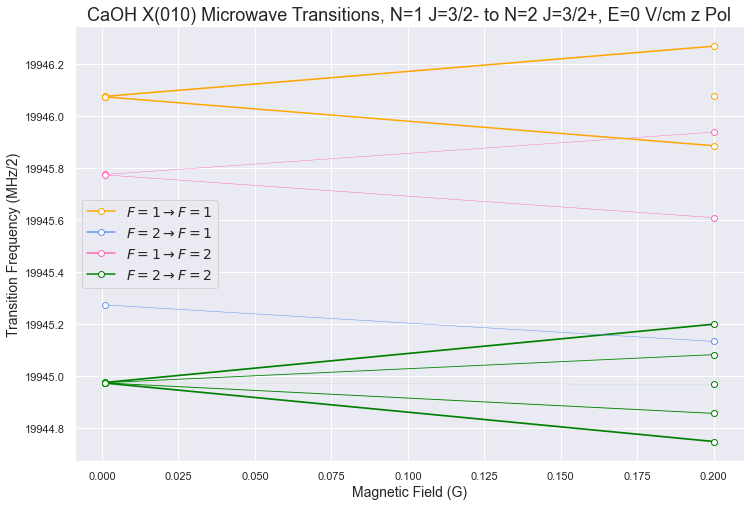

E = 0 V/cm

B (G) = 0.001
Pol = z
Transition                                      Estimated Frequency (MHz/2)    Dipole Moment (D)
--------------------------------------------  -----------------------------  -------------------
(N=1-,J=1.5,F=2,M=2)->(N=2+,J=1.5,F=2,M=2)                     19944.972457              -0.2502
(N=1-,J=1.5,F=2,M=1)->(N=2+,J=1.5,F=2,M=1)                     19944.973021              -0.1252
(N=1-,J=1.5,F=2,M=-1)->(N=2+,J=1.5,F=2,M=-1)                   19944.974149              -0.1251
(N=1-,J=1.5,F=2,M=-2)->(N=2+,J=1.5,F=2,M=-2)                   19944.974713               0.2502
(N=1-,J=1.5,F=2,M=1)->(N=2+,J=1.5,F=1,M=1)                     19945.273214              -0.0732
(N=1-,J=1.5,F=2,M=0)->(N=2+,J=1.5,F=1,M=0)                     19945.273915              -0.0846
(N=1-,J=1.5,F=2,M=-1)->(N=2+,J=1.5,F=1,M=-1)                   19945.274615               0.0733
(N=1-,J=1.5,F=1,M=1)->(N=2+,J=1.5,F=2,M=1)                     19945.773370              -0.0

In [14]:
pol = 'z'
print_bool = True
for E in [0]:
    N1.eigensystem(E,1e-4)
    N2.eigensystem(E,1e-4)
    g1 = N1.select_q({'N':1,'J':1.5,'F':[1]},parity='-')
    e1 = N2.select_q({'N':2,'J':1.5,'F':[1]},parity='+')
    g2 = N1.select_q({'N':1,'J':1.5,'F':[2]},parity='-')
    e2 = N2.select_q({'N':2,'J':1.5,'F':[1]},parity='+')
    g4 = N1.select_q({'N':1,'J':1.5,'F':[1]},parity='-')
    e4 = N2.select_q({'N':2,'J':1.5,'F':[2]},parity='+')
    g5 = N1.select_q({'N':1,'J':1.5,'F':[2]},parity='-')
    e5 = N2.select_q({'N':2,'J':1.5,'F':[2]},parity='+')
    g3 = N1.select_q({'N':1,'J':1.5,'F':[1,2]},parity='-')
    e3 = N2.select_q({'N':2,'J':1.5,'F':[1,2]},parity='+')
    fig,a = plt.subplots(figsize=(12,8))
    TDM_B,dE_B,t_str_B = Trans_E[E][pol]
    
#     g = N1.select_q({'N':1,'J':0.5,'F':0},parity='-')
#     e = N2.select_q({'N':2,'J':1.5,'M':[-2,-1,1,2]},parity='+')
#     plot_B(Bscan,TDM_B,dE_B,g_idx=g,e_idx=e,linescale=10,figure=fig,color='pink',marker=None,mfc='white')
#     g = N1.select_q({'N':1,'J':0.5,'F':[1]},parity='-')
#     e = N2.select_q({'N':2,'J':1.5,'M':[-2,-1,0,1,2]},parity='+')
    plot_B(Bscan,TDM_B,dE_B,g_idx=g4,e_idx=e4,linescale=10,figure=fig,color='hotpink',marker='o',mfc='white')
    plot_B(Bscan,TDM_B,dE_B,g_idx=g5,e_idx=e5,linescale=10,figure=fig,color='green',marker='o',mfc='white')
    plot_B(Bscan,TDM_B,dE_B,g_idx=g2,e_idx=e2,linescale=10,figure=fig,color='cornflowerblue',marker='o',mfc='white')
    plot_B(Bscan,TDM_B,dE_B,g_idx=g1,e_idx=e1,linescale=10,figure=fig,color='orange',marker='o',mfc='white')
    colors = ['orange','cornflowerblue','hotpink','green']
    mark = ['o','o','o','o']
    mf = ['white','white','white','white']
    lines = [plt.Line2D([0], [0], color=c, marker=mk,mfc=m) for c,m,mk in zip(colors,mf,mark)]
    labels = [r'$F=1\rightarrow F=1$',r'$F=2\rightarrow F=1$',r'$F=1\rightarrow F=2$',r'$F=2\rightarrow F=2$']#,r'$M_e\neq0$']
    plt.legend(lines, labels,loc='best',fontsize=14)
    plt.title('CaOH X(010) Microwave Transitions, N=1 J=3/2- to N=2 J=3/2+, E={} V/cm {} Pol'.format(E,pol),fontsize=18)
    plt.show()
    if print_bool:
        print('E = {} V/cm'.format(E))
        table = print_table_B(Bscan,TDM_B,dE_B,t_str_B,g3,e3,thresh = 0.001,cut=True,dipole=pol)

In [147]:
def T00_alphaZZ_bBJ(K0,N0,J0,F0,M0,K1,N1,J1,F1,M1,S=1/2,I=1/2):
    if not kronecker(K0,K1)*kronecker(F0,F1)*kronecker(M0,M1):
        return 0
    else:
        return (-1)**(F0-M0)*wigner_3j(F0,0,F1,-M0,0,M1)*\
            (-1)**(F1+J0+I)*np.sqrt((2*F0+1)*(2*F1+1))*wigner_6j(J1,F1,I,F0,J0,0)*\
            1/(np.sqrt(3))*(-1)**(J1+N0+0+S)*np.sqrt((2*J0+1)*(2*J1+1))*wigner_6j(N1,J1,S,J0,N0,0)*\
            (-1)**(N0-K0)*wigner_3j(N0,0,N1,-K0,0,K1)*np.sqrt((2*N0+1)*(2*N1+1))
            #To be multiplied by alpha00 = 2R(omega)d^2

def T00_alphaXXYY_bBJ(K0,N0,J0,F0,M0,K1,N1,J1,F1,M1,S=1/2,I=1/2):
    if not kronecker(K0,K1)*kronecker(F0,F1)*kronecker(M0,M1):
        return 0
    else:
        return (-1)**(F0-M0)*wigner_3j(F0,0,F1,-M0,0,M1)*\
            (-1)**(F1+J0+I)*np.sqrt((2*F0+1)*(2*F1+1))*wigner_6j(J1,F1,I,F0,J0,0)*\
            -1/(np.sqrt(3))*np.sqrt((2*N0+1)*(2*N1+1))*(-1)**(N0+N1-2*S+K0+K1)*np.sqrt((2*J0+1)*(2*J1+1))*\
            sum([(-1)**(-Sigma+2*Sigma+J0-K0)*wigner_3j(J1,S,N1,(Sigma+K1),-Sigma,-K1)*wigner_3j(J0,S,N0,(Sigma+K0),-Sigma,-K0)*\
                wigner_3j(J0,0,J1,-(Sigma+K0),0,(Sigma+K1)) for Sigma in [-1/2,1/2]])
    
def kronecker(a,b):         # Kronecker delta function
    if a==b:
        return 1
    else:
        return 0

In [157]:
-1/4*-1/np.sqrt(3)*0.01324*2*3.76730314*10**(10)*(-3.33441*10**(-8)*20/13*T00_alphaZZ_bBJ(1,1,1.5,1,0,1,1,1.5,1,0)+9.5101e-8*T00_alphaXXYY_bBJ(1,1,1.5,1,0,1,1,1.5,1,0))

-12.1704668581805

-0.577350269189626

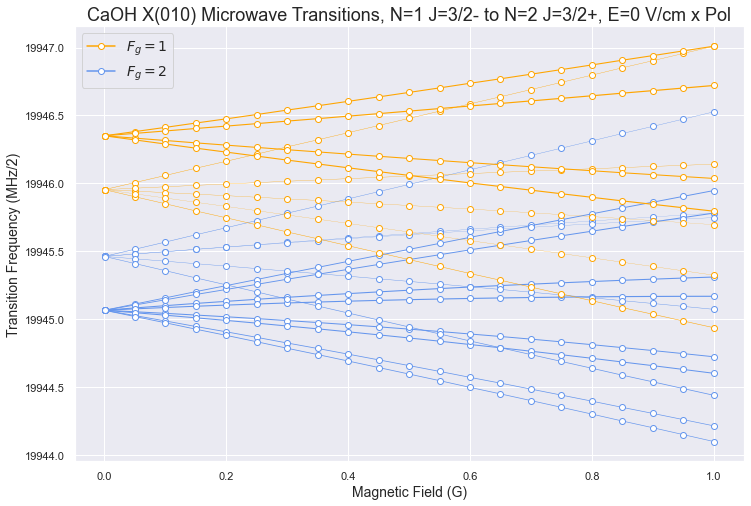

E = 0 V/cm

B (G) = 0.001
Pol = x
Transition                                      Estimated Frequency (MHz/2)    Dipole Moment (D)
--------------------------------------------  -----------------------------  -------------------
(N=1-,J=1.5,F=2,M=2)->(N=2+,J=1.5,F=2,M=1)                     19945.066322              -0.1249
(N=1-,J=1.5,F=2,M=1)->(N=2+,J=1.5,F=2,M=2)                     19945.066458              -0.1249
(N=1-,J=1.5,F=2,M=1)->(N=2+,J=1.5,F=2,M=0)                     19945.066887               0.1530
(N=1-,J=1.5,F=2,M=0)->(N=2+,J=1.5,F=2,M=1)                     19945.067023              -0.1530
(N=1-,J=1.5,F=2,M=0)->(N=2+,J=1.5,F=2,M=-1)                    19945.067451              -0.1530
(N=1-,J=1.5,F=2,M=-1)->(N=2+,J=1.5,F=2,M=0)                    19945.067588               0.1530
(N=1-,J=1.5,F=2,M=-1)->(N=2+,J=1.5,F=2,M=-2)                   19945.068016               0.1249
(N=1-,J=1.5,F=2,M=-2)->(N=2+,J=1.5,F=2,M=-1)                   19945.068152               0.1

In [125]:
pol = 'x'
print_bool = True
for E in [0]:
    N1.eigensystem(E,1e-4)
    N2.eigensystem(E,1e-4)
    g1 = N1.select_q({'N':1,'J':1.5,'F':[1]},parity='-')
    e1 = N2.select_q({'N':2,'J':1.5},parity='+')
    g2 = N1.select_q({'N':1,'J':1.5,'F':[2]},parity='-')
    e2 = N2.select_q({'N':2,'J':1.5},parity='+')
    g3 = N1.select_q({'N':1,'J':1.5},parity='-')
    e3 = N2.select_q({'N':2,'J':1.5},parity='+')
    fig,a = plt.subplots(figsize=(12,8))
    TDM_B,dE_B,t_str_B = Trans_E[E][pol]
    
#     g = N1.select_q({'N':1,'J':0.5,'F':0},parity='-')
#     e = N2.select_q({'N':2,'J':1.5,'M':[-2,-1,1,2]},parity='+')
#     plot_B(Bscan,TDM_B,dE_B,g_idx=g,e_idx=e,linescale=10,figure=fig,color='pink',marker=None,mfc='white')
#     g = N1.select_q({'N':1,'J':0.5,'F':[1]},parity='-')
#     e = N2.select_q({'N':2,'J':1.5,'M':[-2,-1,0,1,2]},parity='+')
#     plot_B(Bscan,TDM_B,dE_B,g_idx=g,e_idx=e,linescale=10,figure=fig,color='pink',marker=None,mfc='white')
    plot_B(Bscan,TDM_B,dE_B,g_idx=g2,e_idx=e2,linescale=10,figure=fig,color='cornflowerblue',marker='o',mfc='white')
    plot_B(Bscan,TDM_B,dE_B,g_idx=g1,e_idx=e1,linescale=10,figure=fig,color='orange',marker='o',mfc='white')
    colors = ['orange','cornflowerblue']#,'pink']
    mark = ['o','o']#,None]
    mf = ['white','white']#,'white']
    lines = [plt.Line2D([0], [0], color=c, marker=mk,mfc=m) for c,m,mk in zip(colors,mf,mark)]
    labels = [r'$F_g=1$',r'$F_g=2$']#,r'$M_e\neq0$']
    plt.legend(lines, labels,loc='best',fontsize=14)
    plt.title('CaOH X(010) Microwave Transitions, N=1 J=3/2- to N=2 J=3/2+, E={} V/cm {} Pol'.format(E,pol),fontsize=18)
    plt.show()
    if print_bool:
        print('E = {} V/cm'.format(E))
        table = print_table_B(Bscan,TDM_B,dE_B,t_str_B,g3,e3,thresh = 0.001,cut=True,dipole=pol)

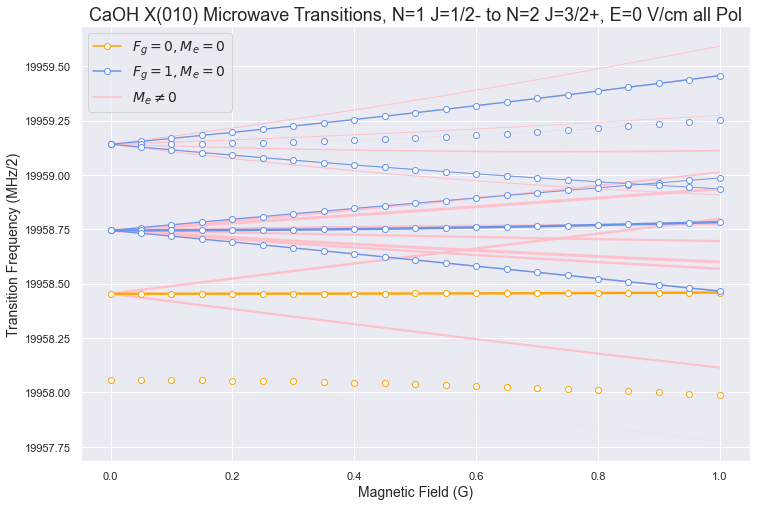

E= 0


NameError: name 'print_table' is not defined

In [119]:
pol = 'all'
print_bool = True
for E in [0]:
    N1.eigensystem(E,1e-4)
    N2.eigensystem(E,1e-4)
    g1 = N1.select_q({'N':1,'J':0.5,'F':[0]},parity='-')
    e1 = N2.select_q({'N':2,'J':1.5,'M':0},parity='+')
    g2 = N1.select_q({'N':1,'J':0.5,'F':1},parity='-')
    e2 = N2.select_q({'N':2,'J':1.5,'M':0},parity='+')
    g3 = N1.select_q({'N':1,'J':0.5},parity='-')
    e3 = N2.select_q({'N':2,'J':1.5},parity='+')
    fig,a = plt.subplots(figsize=(12,8))
    TDM_B,dE_B,t_str_B = Trans_E[E][pol]
    
    g = N1.select_q({'N':1,'J':0.5,'F':0},parity='-')
    e = N2.select_q({'N':2,'J':1.5,'M':[-2,-1,1,2]},parity='+')
    plot_B(Bscan,TDM_B,dE_B,g_idx=g,e_idx=e,linescale=10,figure=fig,color='pink',marker=None,mfc='white')
    g = N1.select_q({'N':1,'J':0.5,'F':[1]},parity='-')
    e = N2.select_q({'N':2,'J':1.5,'M':[-2,-1,0,1,2]},parity='+')
    plot_B(Bscan,TDM_B,dE_B,g_idx=g,e_idx=e,linescale=10,figure=fig,color='pink',marker=None,mfc='white')
    
    plot_B(Bscan,TDM_B,dE_B,g_idx=g1,e_idx=e1,linescale=10,figure=fig,color='orange',marker='o',mfc='white')
    plot_B(Bscan,TDM_B,dE_B,g_idx=g2,e_idx=e2,linescale=10,figure=fig,color='cornflowerblue',marker='o',mfc='white')
    colors = ['orange','cornflowerblue','pink']
    mark = ['o','o',None]
    mf = ['white','white','white']
    lines = [plt.Line2D([0], [0], color=c, marker=mk,mfc=m) for c,m,mk in zip(colors,mf,mark)]
    labels = [r'$F_g=0, M_e=0$',r'$F_g=1, M_e=0$',r'$M_e\neq0$']
    plt.legend(lines, labels,loc='best',fontsize=14)
    plt.title('CaOH X(010) Microwave Transitions, N=1 J=1/2- to N=2 J=3/2+, E={} V/cm {} Pol'.format(E,pol),fontsize=18)
    plt.show()
    if print_bool:
        print('E=',E)
        table = print_table(Bscan,TDM_B,dE_B,t_str_B,g3,e3,thresh = 0.001,cut=True,dipole=pol)

In [275]:
N1.write_state(3)

E = 9958.569766667135 MHz

 0.7071067808654263 |K=-1,N=1,J=0.5,F=0.0,M=0.0> 

 -0.7071067808653126 |K=1,N=1,J=0.5,F=0.0,M=0.0> 

 -1.1154576882391881e-17 |K=-1,N=1,J=0.5,F=1.0,M=-1.0> 

 8.544868371901382e-18 |K=1,N=1,J=0.5,F=1.0,M=-1.0> 

 -2.07526478949049e-05 |K=-1,N=1,J=0.5,F=1.0,M=0.0> 

 2.0752647894908524e-05 |K=1,N=1,J=0.5,F=1.0,M=0.0> 

 -4.5145966869495714e-23 |K=-1,N=1,J=0.5,F=1.0,M=1.0> 

 4.8449842558306146e-23 |K=1,N=1,J=0.5,F=1.0,M=1.0> 

 4.895194127386319e-19 |K=-1,N=1,J=1.5,F=1.0,M=-1.0> 

 -4.451839384081833e-19 |K=1,N=1,J=1.5,F=1.0,M=-1.0> 

 4.851996047073014e-06 |K=-1,N=1,J=1.5,F=1.0,M=0.0> 

 -4.851996047073296e-06 |K=1,N=1,J=1.5,F=1.0,M=0.0> 

 2.192253315551256e-24 |K=-1,N=1,J=1.5,F=1.0,M=1.0> 

 -2.2484058116120987e-24 |K=1,N=1,J=1.5,F=1.0,M=1.0> 

 1.0627447553439413e-41 |K=-1,N=1,J=1.5,F=2.0,M=-2.0> 

 -3.90682011853759e-42 |K=1,N=1,J=1.5,F=2.0,M=-2.0> 

 -4.626600654443192e-23 |K=-1,N=1,J=1.5,F=2.0,M=-1.0> 

 4.192708680799953e-23 |K=1,N=1,J=1.5,F=2.0,M=-1.

(10000,)
(10000, 1, 2)
(9999, 1, 2)
(9999,)
(9999, 2, 2)
[ 1.       1.00126  1.00251 ... 13.5626  13.56386 13.56511]


<Figure size 432x288 with 0 Axes>

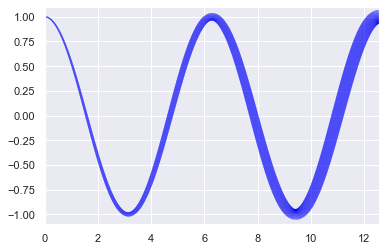

In [192]:
import numpy as np
from matplotlib.collections import LineCollection
import matplotlib.pyplot as plt
x = np.linspace(0,4*np.pi,10000)
y = np.cos(x)
lwidths=1+x[:-1]
print(x.shape)
points = np.array([x, y]).T.reshape(-1, 1, 2)
print(points.shape)
print(points[:-1].shape)
segments = np.concatenate([points[:-1], points[1:]], axis=1)
print(lwidths.shape)
print(segments.shape)
lc = LineCollection(segments, linewidths=lwidths,color='blue')
plt.figure()
fig,a = plt.subplots()
a.add_collection(lc)
a.set_xlim(0,4*np.pi)
a.set_ylim(-1.1,1.1)
# plt.plot(x,y*0.5)
print(lwidths)

In [190]:
x = Bscan
y = dE_B[:,1,1]
print(y.shape)
print(x.shape)
lwidth = TDM_B[:,1,1]/1.465
points = np.array([x, y]).T.reshape(-1, 1, 2)
print(np.array([x,y]).shape)
print(points.shape)
print(points[1:].shape)
segments = np.concatenate([points, points], axis=1)
print(lwidth.shape)
print(segments.shape)

(11,)
(11,)
(2, 11)
(11, 1, 2)
(10, 1, 2)
(11,)
(11, 2, 2)


In [159]:
points = np.array([x, y]).T.reshape(-1,1,2)
segments = np.concatenate([points[:-1], points[1:]], axis=1)
segments

array([[[ 0.     ,  1.     ],
        [ 0.00126,  1.     ]],

       [[ 0.00126,  1.     ],
        [ 0.00251,  1.     ]],

       [[ 0.00251,  1.     ],
        [ 0.00377,  0.99999]],

       ...,

       [[12.5626 ,  0.99999],
        [12.56386,  1.     ]],

       [[12.56386,  1.     ],
        [12.56511,  1.     ]],

       [[12.56511,  1.     ],
        [12.56637,  1.     ]]])

In [103]:
points = np.array([x, y]).T.reshape(-1, 1, 2)
segments = np.concatenate([points[:-1], points[1:]], axis=1)
segments[2]

array([[0.00251, 1.     ],
       [0.00377, 0.99999]])

In [101]:
np.array([x,y]).T

array([[ 0.     ,  1.     ],
       [ 0.00126,  1.     ],
       [ 0.00251,  1.     ],
       ...,
       [12.56386,  1.     ],
       [12.56511,  1.     ],
       [12.56637,  1.     ]])

In [100]:
points = np.array([x, y]).T.reshape(-1, 1, 2)
points

array([[[ 0.     ,  1.     ]],

       [[ 0.00126,  1.     ]],

       [[ 0.00251,  1.     ]],

       ...,

       [[12.56386,  1.     ]],

       [[12.56511,  1.     ]],

       [[12.56637,  1.     ]]])

In [ ]:
g_idx=None,e_idx=None,thresh = 0.001,title=None,figure=None,**kwargs)

In [340]:
x=np.zeros((21,20,40))

In [348]:
x[:,1,39].shape

(21,)

In [337]:
x=np.zeros((20,40))

In [339]:
x[

IndexError: index 30 is out of bounds for axis 0 with size 20

In [268]:
Bscan = np.linspace(0,50,21)
Bscan[0]=1e-3
print(Bscan)

[ 0.001  2.5    5.     7.5   10.    12.5   15.    17.5   20.    22.5
 25.    27.5   30.    32.5   35.    37.5   40.    42.5   45.    47.5
 50.   ]


0.001
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
2.5
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
5.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
7.5
Successfully converted eigenvectors from bBJ t

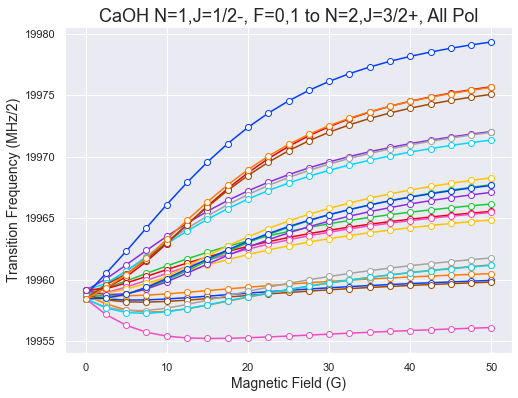

In [273]:
Bl01all,table01all=all_B_tracking(X010,{'N':1,'J':0.5,'F':[0,1]},{'N':2,'J':1.5},Bscan,dipole='abs',plot=False)
Bl01allT = plot_B_tracking(Bscan,Bl01all,dipole='abs',reorder_missing=True,title='CaOH N=1,J=1/2-, F=0,1 to N=2,J=3/2+, All Pol')

0.001
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
2.5
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
5.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
7.5
Successfully converted eigenvectors from bBJ t

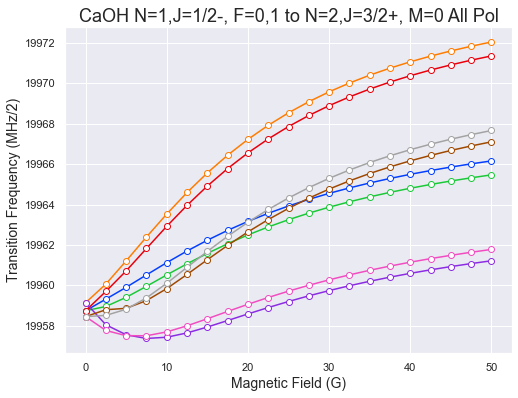

In [274]:
Bltargall,tabletargall=all_B_tracking(X010,{'N':1,'J':0.5,'F':[0,1]},{'N':2,'J':1.5,'M':[0]},Bscan,dipole='abs',plot=False)
BltargallT = plot_B_tracking(Bscan,Bltargall,dipole='abs',reorder_missing=True,title='CaOH N=1,J=1/2-, F=0,1 to N=2,J=3/2+, M=0 All Pol')

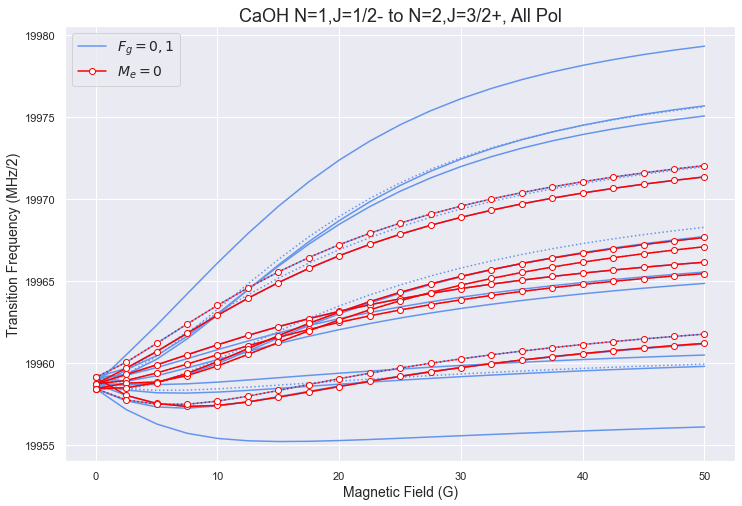

In [329]:
plt.figure(1,figsize=(12,8))
# plot_B_tracking(Bscan,Bl01all,table01all,dipole='all',reorder_missing=True,title='CaOH N=1,J=1/2- to N=2,J=3/2+, All Pol',figure=1,color='cornflowerblue',marker=None)
plot_B_tracking(Bscan,Bltargall,tabletargall,dipole='all',reorder_missing=True,title='CaOH N=1,J=1/2- to N=2,J=3/2+, All Pol',figure=1,color='red')
colors = ['cornflowerblue','red']
mark = [None,'o']
mf = [None,'white']
lines = [plt.Line2D([0], [0], color=c, marker=mk,mfc=m) for c,m,mk in zip(colors,mf,mark)]
labels = [r'$F_g=0,1$',r'$M_e=0$']
plt.legend(lines, labels,loc='best',fontsize=14)
plt.show()

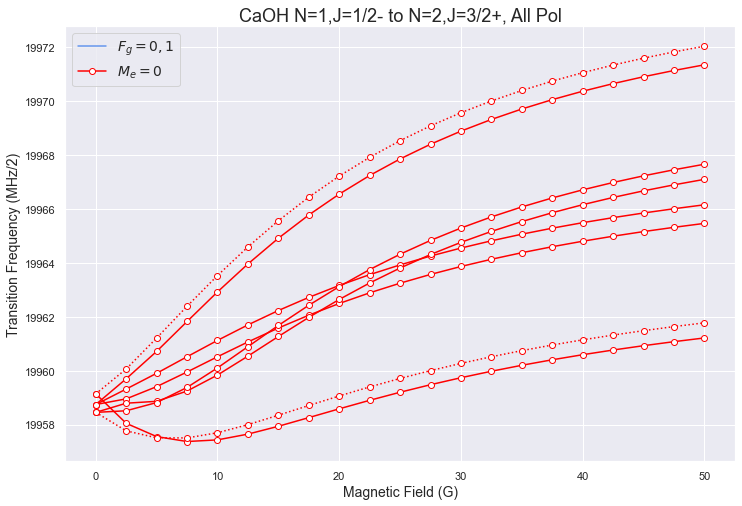

In [330]:
plt.figure(1,figsize=(12,8))
# plot_B_tracking(Bscan,Bl01all,table01all,dipole='all',reorder_missing=True,title='CaOH N=1,J=1/2- to N=2,J=3/2+, All Pol',figure=1,color='cornflowerblue',marker=None)
plot_B_tracking(Bscan,Bltargall,tabletargall,dipole='all',reorder_missing=True,title='CaOH N=1,J=1/2- to N=2,J=3/2+, All Pol',figure=1,color='red')
colors = ['cornflowerblue','red']
mark = [None,'o']
mf = [None,'white']
lines = [plt.Line2D([0], [0], color=c, marker=mk,mfc=m) for c,m,mk in zip(colors,mf,mark)]
labels = [r'$F_g=0,1$',r'$M_e=0$']
plt.legend(lines, labels,loc='best',fontsize=14)
plt.show()

0.001
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
2.5
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
5.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
7.5
Successfully converted eigenvectors from bBJ t

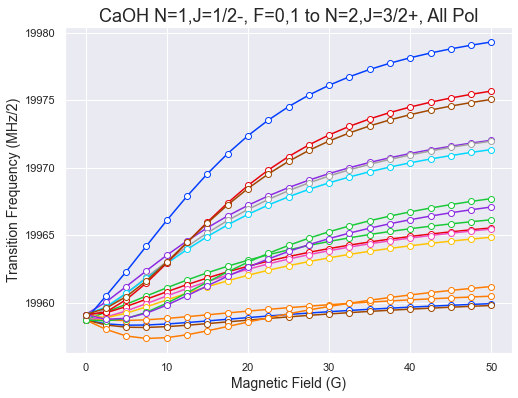

In [269]:
Bl1all,table1all=all_B_tracking(X010,{'N':1,'J':0.5,'F':[1]},{'N':2,'J':1.5},Bscan,dipole='abs',plot=False)
Bl1allT = plot_B_tracking(Bscan,Bl1all,dipole='abs',reorder_missing=True,title='CaOH N=1,J=1/2-, F=1 to N=2,J=3/2+, All Pol')

0.001
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
2.5
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
5.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
7.5
Successfully converted eigenvectors from bBJ t

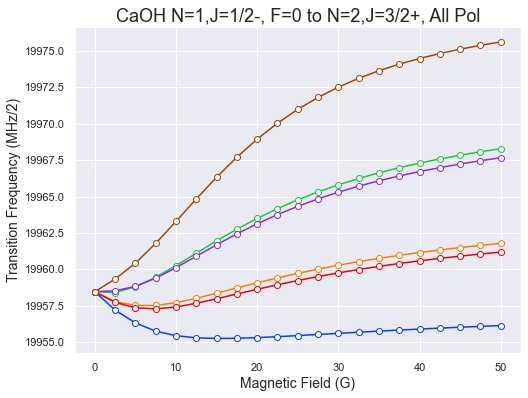

In [270]:
Bl0all,table0all=all_B_tracking(X010,{'N':1,'J':0.5,'F':[0]},{'N':2,'J':1.5},Bscan,dipole='abs',plot=False)
Bl0allT = plot_B_tracking(Bscan,Bl0all,dipole='abs',reorder_missing=True,title='CaOH N=1,J=1/2-, F=0 to N=2,J=3/2+, All Pol')

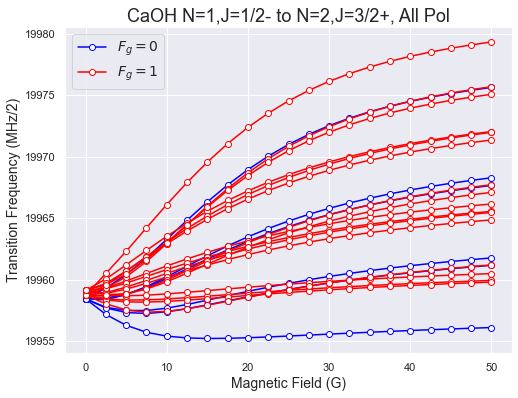

In [272]:
plt.figure(1,figsize=(8,6))
plot_B_tracking(Bscan,Bl0all,dipole='all',reorder_missing=True,title='CaOH N=1,J=1/2- to N=2,J=3/2+, All Pol',figure=1,color='blue')
plot_B_tracking(Bscan,Bl1all,dipole='all',reorder_missing=True,title='CaOH N=1,J=1/2- to N=2,J=3/2+, All Pol',figure=1,color='red')
colors = ['blue','red']
lines = [plt.Line2D([0], [0], color=c, marker='o',mfc='white') for c in colors]
labels = [r'$F_g=0$',r'$F_g=1$']
plt.legend(lines, labels,loc='best',fontsize=14)
plt.show()

In [183]:
Bl1z,table1z=all_B_tracking(X010,{'N':1,'J':0.5,'F':[1]},{'N':2,'J':1.5},Bscan,dipole='z',plot=False)
Bl1zT = plot_B_tracking(Bscan,Bl1z,dipole='z',reorder_missing=True,title='CaOH N=1,J=1/2-, F=1 to N=2,J=3/2+, Z Pol')

0.001
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
2.5
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
5.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
7.5
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
10.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
12.5
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
15.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
17.5
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
20.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ

B (G) = 0.001
Pol = 

NameError: name 'Bvals' is not defined

Number of lines: 6
Number of lines: 6
Number of lines: 6
Number of lines: 6
Number of lines: 6
Number of lines: 6
Number of lines: 6
Number of lines: 6
Number of lines: 6


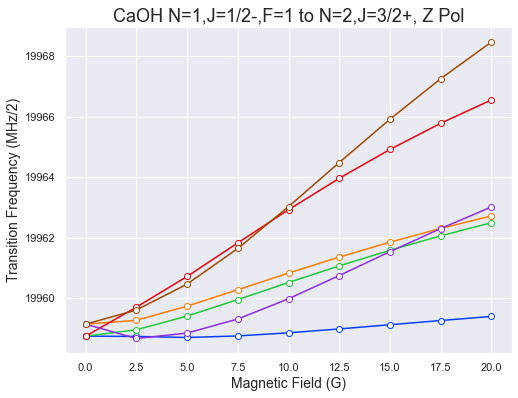

In [193]:
Bl1zT = plot_B_tracking(Bscan,Bl1z,dipole='z',reorder_missing=True,title='CaOH N=1,J=1/2-,F=1 to N=2,J=3/2+, Z Pol')

0.001
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
2.5
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
5.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
7.5
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
10.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from 

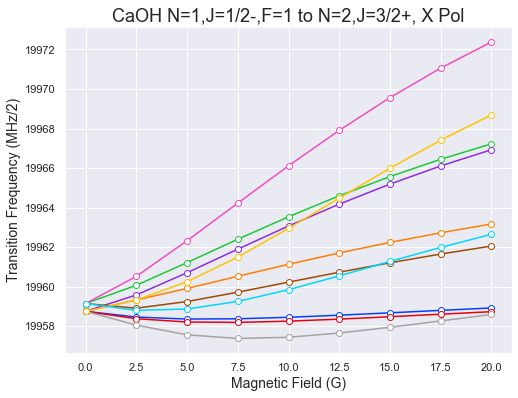

In [196]:
Bl1x,table1x=all_B_tracking(X010,{'N':1,'J':0.5,'F':[1]},{'N':2,'J':1.5},Bscan,dipole='x',plot=False)
Bl1xT = plot_B_tracking(Bscan,Bl1x,dipole='x',reorder_missing=True,title='CaOH N=1,J=1/2-,F=1 to N=2,J=3/2+, X Pol')

0.001
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
2.5
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
5.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
7.5
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
10.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
12.5
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
15.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
17.5
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
20.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ

B (G) = 0.001
Pol = 

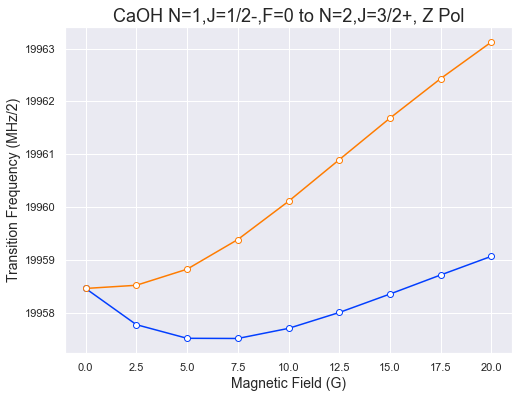

In [198]:
Bl0z,table0z=all_B_tracking(X010,{'N':1,'J':0.5,'F':[0]},{'N':2,'J':1.5},Bscan,dipole='z',plot=False)
Bl0zT = plot_B_tracking(Bscan,Bl0z,dipole='z',reorder_missing=True,title='CaOH N=1,J=1/2-,F=0 to N=2,J=3/2+, Z Pol')

0.001
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
2.5
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
5.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
7.5
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
10.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from 

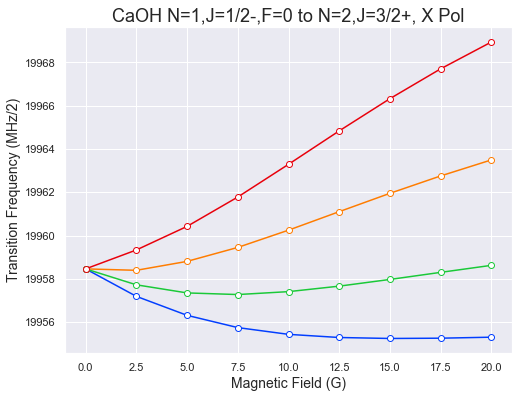

In [197]:
Bl0x,table0x=all_B_tracking(X010,{'N':1,'J':0.5,'F':[0]},{'N':2,'J':1.5},Bscan,dipole='x',plot=False)
Bl0xT = plot_B_tracking(Bscan,Bl0x,dipole='x',reorder_missing=True,title='CaOH N=1,J=1/2-,F=0 to N=2,J=3/2+, X Pol')

0.001
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
2.5
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
5.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
7.5
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
10.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
12.5
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
15.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
17.5
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
20.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ

B (G) = 0.001
Pol = 

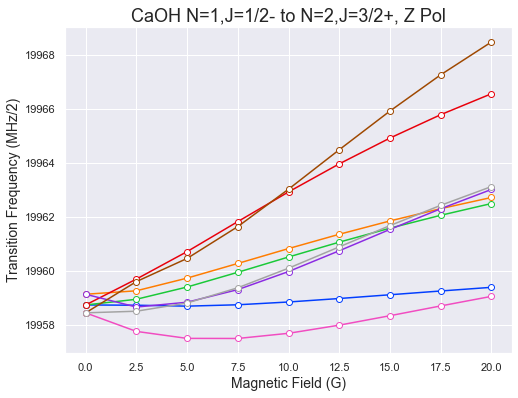

In [201]:
Bl01z,table01z=all_B_tracking(X010,{'N':1,'J':0.5,'F':[0,1]},{'N':2,'J':1.5},Bscan,dipole='z',plot=False)
Bl01zT = plot_B_tracking(Bscan,Bl01z,dipole='z',reorder_missing=True,title='CaOH N=1,J=1/2- to N=2,J=3/2+, Z Pol')

0.001
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
2.5
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
5.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
7.5
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
10.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from 

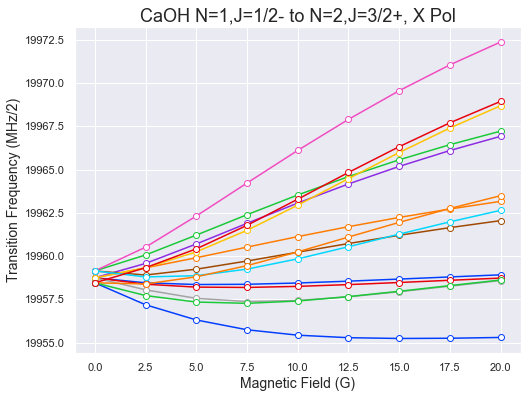

In [202]:
Bl01x,table01x=all_B_tracking(X010,{'N':1,'J':0.5,'F':[0,1]},{'N':2,'J':1.5},Bscan,dipole='x',plot=False)
Bl01xT = plot_B_tracking(Bscan,Bl01x,dipole='x',reorder_missing=True,title='CaOH N=1,J=1/2- to N=2,J=3/2+, X Pol')

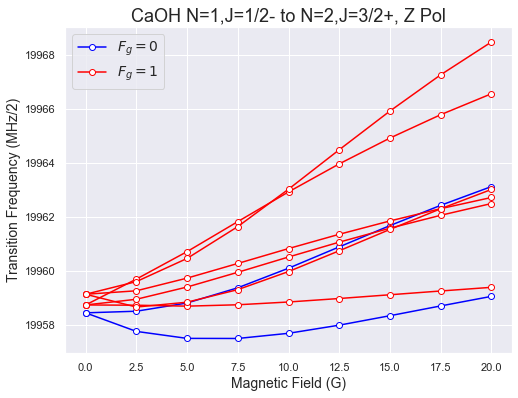

In [216]:
plt.figure(1,figsize=(8,6))
plot_B_tracking(Bscan,Bl0z,dipole='z',reorder_missing=True,title='CaOH N=1,J=1/2- to N=2,J=3/2+, Z Pol',figure=1,color='blue')
plot_B_tracking(Bscan,Bl1z,dipole='z',reorder_missing=True,title='CaOH N=1,J=1/2- to N=2,J=3/2+, Z Pol',figure=1,color='red')
colors = ['blue','red']
lines = [plt.Line2D([0], [0], color=c, marker='o',mfc='white') for c in colors]
labels = [r'$F_g=0$',r'$F_g=1$']
plt.legend(lines, labels,loc='best',fontsize=14)
plt.show()

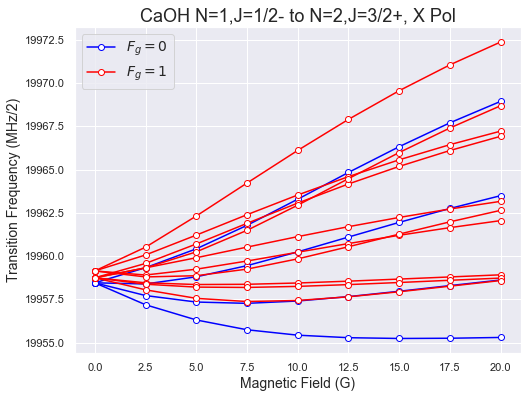

In [217]:
plt.figure(1,figsize=(8,6))
plot_B_tracking(Bscan,Bl0x,dipole='x',reorder_missing=True,title='CaOH N=1,J=1/2- to N=2,J=3/2+, X Pol',figure=1,color='blue')
plot_B_tracking(Bscan,Bl1x,dipole='x',reorder_missing=True,title='CaOH N=1,J=1/2- to N=2,J=3/2+, X Pol',figure=1,color='red')
colors = ['blue','red']
lines = [plt.Line2D([0], [0], color=c, marker='o',mfc='white') for c in colors]
labels = [r'$F_g=0$',r'$F_g=1$']
plt.legend(lines, labels,loc='best',fontsize=14)
plt.show()

In [226]:
Bfine = np.arange(0,2+0.1,0.1)
Bfine[0] = 0.001

0.001
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.1
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.2
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.30000000000000004
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.4
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.5
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.6000000000000001
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.7000000000000001
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.8
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvect

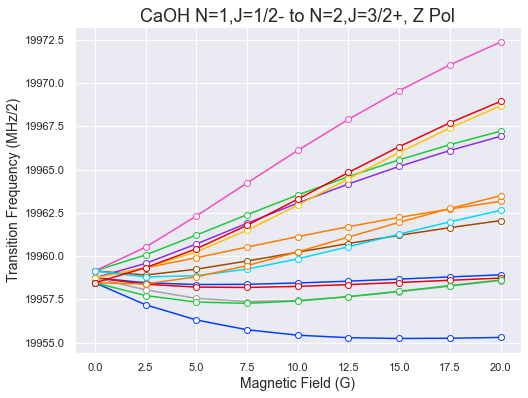

In [229]:
Bf0z,tablef0x=all_B_tracking(X010,{'N':1,'J':0.5,'F':[0]},{'N':2,'J':1.5},Bfine,dipole='z',plot=False)
Bf0zT = plot_B_tracking(Bfine,Bf01x,dipole='z',reorder_missing=True,title='CaOH N=1,J=1/2- to N=2,J=3/2+, Z Pol')

In [130]:
from sympy.physics.wigner import wigner_3j,wigner_6j,wigner_9j

def T2IS_bBJ(K0,N0,J0,F0,M0,K1,N1,J1,F1,M1,S=1/2,I=1/2):
    if not kronecker(F0,F1)*kronecker(M0,M1)*kronecker(K0,K1):
        return 0
    else:
        return (-1)**(N0-K0)*wigner_3j(N0,2,N1,-K0,0,K1)
#         return -np.sqrt(5/3)*(-1)**(3*F0-2*M0+I+J0)*np.sqrt((2*I+1)*(I+1)*I)*\
#             np.sqrt((2*J0+1)*(2*J1+1)*3*(2*S+1)*(S+1)*S)*wigner_6j(I,J1,F0,J0,I,1)*\
#             wigner_9j(S,N1,J1,1,2,1,S,N0,J0)*np.sqrt((2*N0+1)*(2*N1+1))*(-1)**(N0-K0)*wigner_3j(N0,2,N1,-K0,0,K1)
    
def kronecker(a,b):         # Kronecker delta function
    if a==b:
        return 1
    else:
        return 0

In [133]:
print(T2IS_bBJ(1,1,0.5,0,0,1,1,0.5,0,0))
print(T2IS_bBJ(0,1,0.5,0,0,0,1,0.5,0,0))

sqrt(30)/30
-sqrt(30)/15


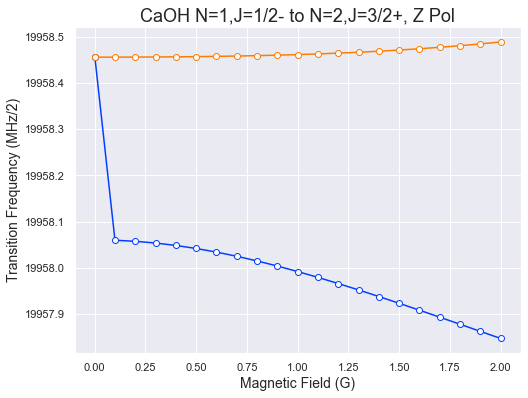

In [233]:
Bf0zT = plot_B_tracking(Bfine,Bf0z,dipole='z',reorder_missing=True,title='CaOH N=1,J=1/2- to N=2,J=3/2+, Z Pol')

0.001
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.1
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.2
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.30000000000000004
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.4
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.5
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.6000000000000001
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.7000000000000001
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
0.8
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvect

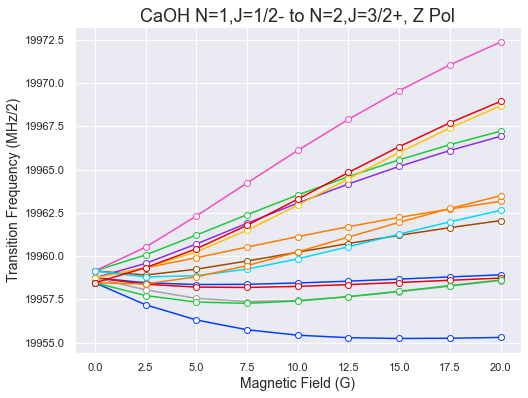

In [230]:
Bf1z,tablef1x=all_B_tracking(X010,{'N':1,'J':0.5,'F':[1]},{'N':2,'J':1.5},Bfine,dipole='z',plot=False)
Bf1zT = plot_B_tracking(Bfine,Bf1z,dipole='z',reorder_missing=True,title='CaOH N=1,J=1/2- to N=2,J=3/2+, Z Pol')

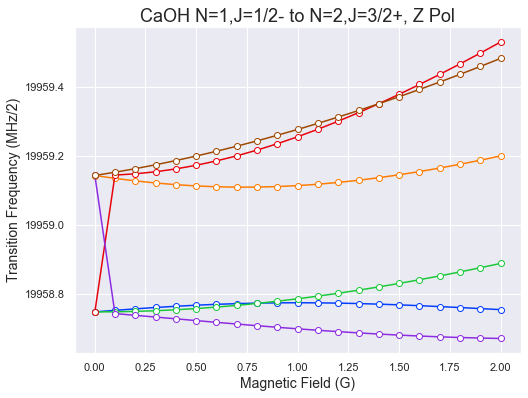

In [234]:
Bf1zT = plot_B_tracking(Bfine,Bf1z,dipole='z',reorder_missing=True,title='CaOH N=1,J=1/2- to N=2,J=3/2+, Z Pol')

In [ ]:
plt.figure(1,figsize=(8,6))
plot_B_tracking(Bscan,Bl0x,dipole='x',reorder_missing=True,title='CaOH N=1,J=1/2- to N=2,J=3/2+, X Pol',figure=1,color='blue')
plot_B_tracking(Bscan,Bl1x,dipole='x',reorder_missing=True,title='CaOH N=1,J=1/2- to N=2,J=3/2+, X Pol',figure=1,color='red')
colors = ['blue','red']
lines = [plt.Line2D([0], [0], color=c, marker='o',mfc='white') for c in colors]
labels = [r'$F_g=0$',r'$F_g=1$']
plt.legend(lines, labels,loc='best',fontsize=14)
plt.show()

In [96]:
header = ['Transition','Estimated Frequency (MHz/2)','Dipole Moment (D)']
for i in range(len(Bscan)):
    print('\nB (G) =',Bscan[i])
    print(tabulate(B_tables[i],headers=header,floatfmt=('','.6f','.3f')))


B (G) = 0.001
Transition                                      Estimated Frequency (MHz/2)    Dipole Moment (D)
--------------------------------------------  -----------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=1,M=1))                    19958.456081               -0.423
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=1,M=-1))                   19958.456781               -0.423

B (G) = 2.0
Transition                                      Estimated Frequency (MHz/2)    Dipole Moment (D)
--------------------------------------------  -----------------------------  -------------------
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=2,M=1))                    19957.390325               -0.051
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=1,M=1))                    19957.836587               -0.349
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=2,M=-1))                   19958.333572                0.014
(N=1-,J=0.5,F=0,M=0)->(N=2+,J=1.5,F=1,M=-1))                   19959.146777                0.475

B

In [104]:
for B in B_lines:
    print(len(B))

In [105]:
Bh = Bscan[1:]
Blh = B_lines[1:]
BlhT = list(zip(*Blh))

In [106]:
for line in BlhT:
    plt.plot(Bh,line,marker='o')

In [107]:
for x,y in zip(Bscan,B_lines):
    plt.scatter([x] * len(y), y)

In [108]:
B_lines

[]

In [99]:
def all_B_tracking(state,g_q,e_q,Bvals,dipole='z'):
    B_lines,B_tables = track_transition_B(state,g_q,state,e_q,Bvals,dipole)
    header = ['Transition','Estimated Frequency (MHz/2)','Dipole Moment (D)']
    for i in range(len(Bvals)):
        print('\nB (G) =',Bvals[i])
        print(tabulate(B_tables[i],headers=header,floatfmt=('','.6f','.3f')))
    print()
    for B in B_lines:
        print('Number of lines:',len(B))
    BT = list(zip(*B_lines))
    plt.figure(figsize=(10,10))
    for line in BT:
        plt.plot(Bvals,line,marker='o',mfc='white')
    plt.xlabel('Magnetic Field (G)')
    plt.ylabel('Transition Frequency (MHz/2)')
    plt.title('CaOH Microwave Transitions')
    return BT, B_tables

0.001
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
2.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
4.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
6.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
8.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
10.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
12.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
14.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
16.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
18.0
Successfully conv

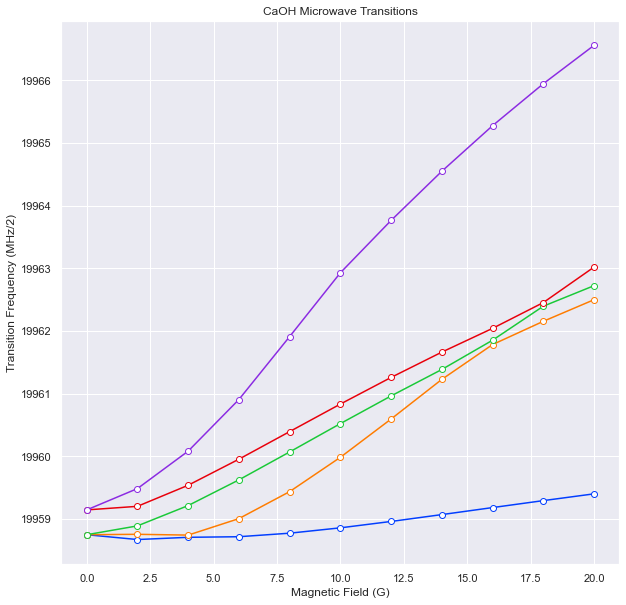

In [92]:
all_B_tracking(X010,{'N':1,'J':0.5,'F':[1]},{'N':2,'J':1.5},Bscan,dipole='z')

In [77]:
B_lines,B_tables = track_transition_B(X010,{'N':1,'J':0.5,'F':[1]},X010,{'N':2,'J':1.5},Bscan,dipole='z')

0.001
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
2.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
4.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
6.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
8.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from b

In [78]:
header = ['Transition','Estimated Frequency (MHz/2)','Dipole Moment (D)']
for i in range(len(Bscan)):
    print('\nB (G) =',Bscan[i])
    print(tabulate(B_tables[i],headers=header,floatfmt=('','.6f','.3f')))


B (G) = 0.001
Transition                                       Estimated Frequency (MHz/2)    Dipole Moment (D)
---------------------------------------------  -----------------------------  -------------------
(N=1-,J=0.5,F=1,M=-1)->(N=2+,J=1.5,F=2,M=0))                    19958.747594                0.213
(N=1-,J=0.5,F=1,M=0)->(N=2+,J=1.5,F=2,M=1))                     19958.747641               -0.369
(N=1-,J=0.5,F=1,M=1)->(N=2+,J=1.5,F=2,M=2))                     19958.747688               -0.521
(N=1-,J=0.5,F=1,M=-1)->(N=2+,J=1.5,F=2,M=-2))                   19958.748023               -0.521
(N=1-,J=0.5,F=1,M=0)->(N=2+,J=1.5,F=2,M=-1))                    19958.748070               -0.368
(N=1-,J=0.5,F=1,M=1)->(N=2+,J=1.5,F=2,M=0))                     19958.748117                0.213
(N=1-,J=0.5,F=1,M=0)->(N=2+,J=1.5,F=1,M=1))                     19959.143592                0.205
(N=1-,J=0.5,F=1,M=-1)->(N=2+,J=1.5,F=1,M=0))                    19959.143681               -0.204
(N=1-

In [81]:
for B in B_lines:
    print(len(B))

10
10
10
10
10
10
10
10
10
10
10


In [84]:
BT = list(zip(*B_lines))

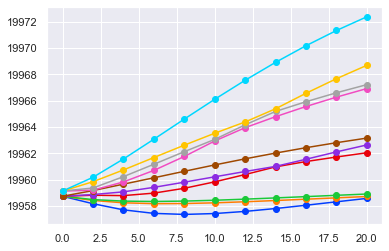

In [85]:
for line in BT:
    plt.plot(Bscan,line,marker='o')

In [237]:
import csv

def write_labeled_CSV_rows(data_array,file_path,label_array):
    data_array = np.array(data_array)
    save_all = []
    save_all.append(label_array)
    for _data in data_array:
        save_all.append(_data)
    writeCSVrows(save_all,file_path)
    
def writeCSVrows(array_of_arrays,filepath):
    with open(filepath,'w+',newline='') as f:
        w = csv.writer(f)
        for array in array_of_arrays:
            w.writerow(array)
    print('Done! Array written to', filepath)
    return

In [238]:
write_labeled_CSV_rows(table_N21,'CaOH_X010_N21_lines.csv',header_N21)
write_labeled_CSV_rows(table_N12,'CaOH_X010_N12_lines.csv',header_N12)

Done! Array written to CaOH_X010_N21_lines.csv
Done! Array written to CaOH_X010_N12_lines.csv


In [83]:
x_labels = [X010.gen_state_str(i,thresh=0.1,single=True,parity=False,show_coeff=True, basis='decoupled',label_q=['K','M_N','M_S','M_I','M_F'],round=2) for i in N2]
display(Latex(x_labels[7]))

<IPython.core.display.Latex object>

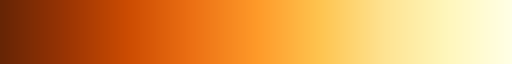

In [68]:
sns.color_palette("YlOrBr_r", as_cmap=True)

In [123]:
Bz = np.linspace(1e-6,5,1000)
Ez = np.linspace(0,200,1000)

In [124]:
X010.StarkMap(Ez,1e-3,plot=False)
# X010.plot_evals_EB('E',kV_kG=True,GHz=True)

In [108]:
X010.ZeemanMap(Bz,0,plot=False)

In [135]:
plt.figure(figsize=(10,7))
for (i,trace) in enumerate(X010.evals_B.T[N2]):
    plt.plot(Bz,trace)
plt.xlabel('B (G)',fontsize=14)
plt.ylabel('Energy (MHz)',fontsize=14)
plt.title(r'$^{40}$CaOH $\tilde{X}(010)$ Zeeman Shifts, $N=2-$',fontsize=16);
plt.ylim(49865,49885)

plt.figure(figsize=(10,7))
for (i,trace) in enumerate(X010.evals_E.T[N1]):
    grad = np.gradient(trace)/(Ez[1]-Ez[0])
    plt.plot(Bz,grad)
plt.xlabel('B (G)',fontsize=14)
plt.ylabel('Polarization (MHz/Volts)',fontsize=14)
plt.title(r'$^{40}$CaOH $\tilde{X}(010)$ Magnetization, $N=2-$',fontsize=16);

AttributeError: 'NoneType' object has no attribute 'T'

<Figure size 720x504 with 0 Axes>

(9900.0, 10090.0)

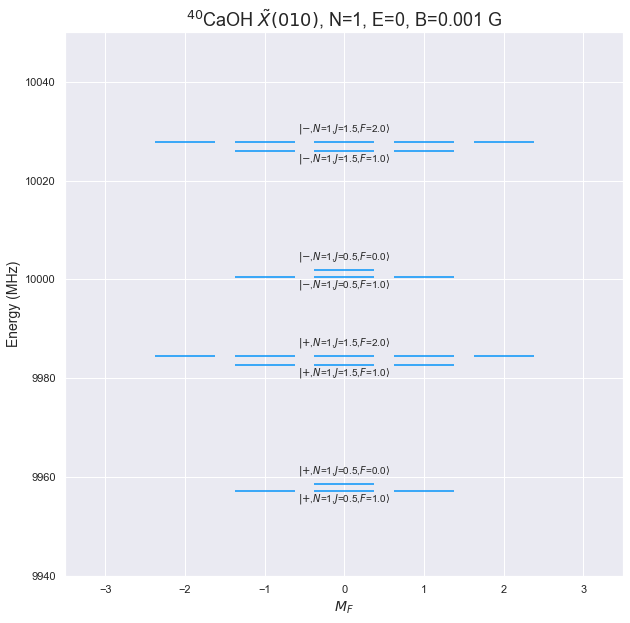

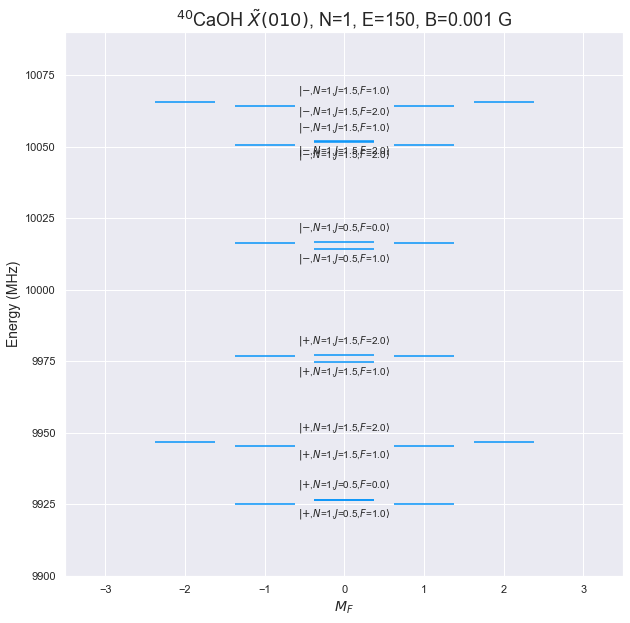

In [57]:
E0=0
B0=1e-3
N=1
X010.display_levels(E0,B0,'F',idx=N_idx[N-1],parity=True,label_q=[q for q in X010.q_str if q!='K'],figsize=(10,10),alt_label=True)
plt.title(X010.state_str+', N={}, E={}, B={} G'.format(N,E0,B0),fontsize=18)
plt.xlim(-3.5,3.5)
plt.ylim(9940,10050)

E0=150
B0=1e-3
N=1
X010.display_levels(E0,B0,'F',idx=N_idx[N-1],parity=True,label_q=[q for q in X010.q_str if q!='K'],figsize=(10,10),alt_label=True)
plt.title(X010.state_str+', N={}, E={}, B={} G'.format(N,E0,B0),fontsize=18)
plt.xlim(-3.5,3.5)
plt.ylim(9900,10090)

# N=2
# X010.display_levels(E0,B0,'F',idx=N_idx[N-1],parity=True,label_q=[q for q in X010.q_str if q!='K'],figsize=(10,10),alt_label=True)
# plt.title(X010.state_str+', N={}, E={} V/cm, B={} G'.format(N,E0,B0),fontsize=18)
# plt.xlim(-3.5,3.5)

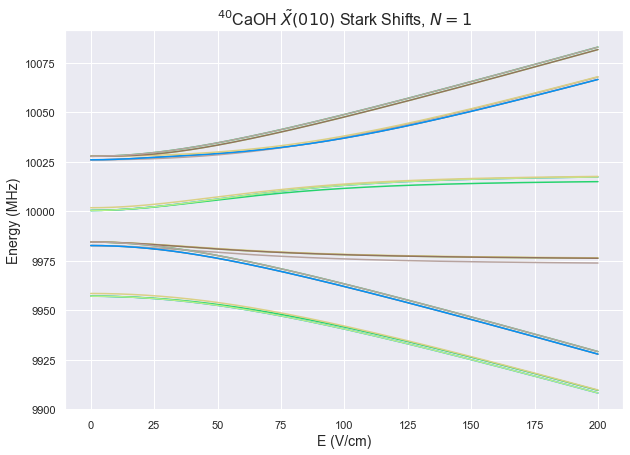

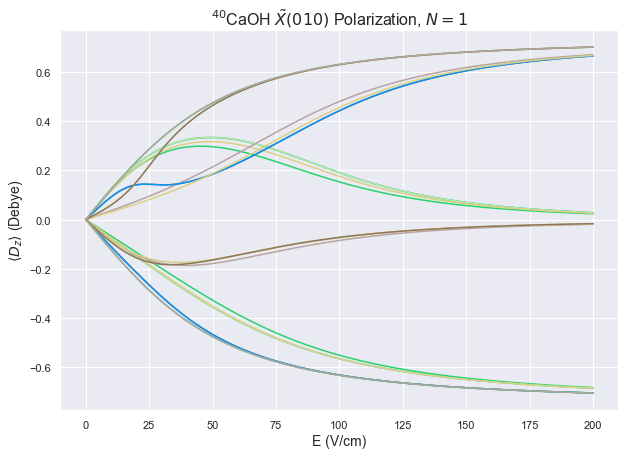

In [133]:
plt.figure(figsize=(10,7))
for (i,trace) in enumerate(X010.evals_E.T[N_idx[0]]):
    plt.plot(Ez,trace)
plt.xlabel('E (V/cm)',fontsize=14)
plt.ylabel('Energy (MHz)',fontsize=14)
plt.title(r'$^{40}$CaOH $\tilde{X}(010)$ Stark Shifts, $N=1$',fontsize=16);

plt.figure(figsize=(10,7))
for (i,trace) in enumerate(X010.evals_E.T[N_idx[0]]):
    grad = np.gradient(trace)/(Ez[1]-Ez[0])
    plt.plot(Ez,grad*1.986)
plt.xlabel('E (V/cm)',fontsize=14)
plt.ylabel(r'$\langle D_z \rangle$ (Debye)',fontsize=14)
plt.title(r'$^{40}$CaOH $\tilde{X}(010)$ Polarization, $N=1$',fontsize=16);

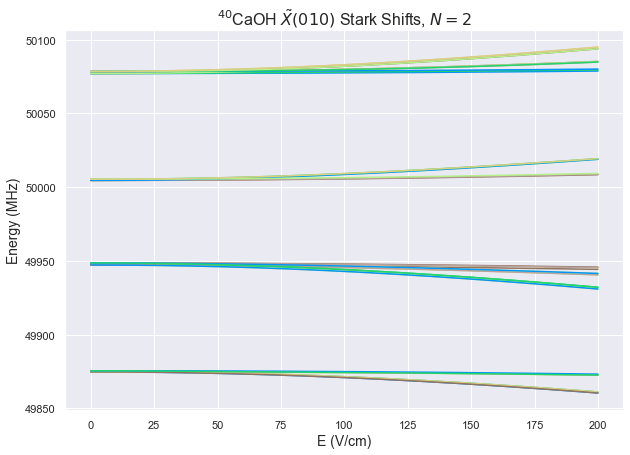

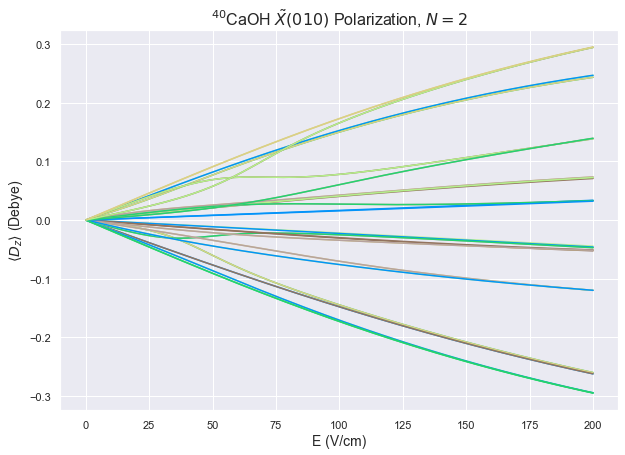

In [134]:
plt.figure(figsize=(10,7))
for (i,trace) in enumerate(X010.evals_E.T[N_idx[1]]):
    plt.plot(Ez,trace)
plt.xlabel('E (V/cm)',fontsize=14)
plt.ylabel('Energy (MHz)',fontsize=14)
plt.title(r'$^{40}$CaOH $\tilde{X}(010)$ Stark Shifts, $N=2$',fontsize=16);

plt.figure(figsize=(10,7))
for (i,trace) in enumerate(X010.evals_E.T[N_idx[1]]):
    grad = np.gradient(trace)/(Ez[1]-Ez[0])
    plt.plot(Ez,grad*1.986)
plt.xlabel('E (V/cm)',fontsize=14)
plt.ylabel(r'$\langle D_z \rangle$ (Debye)',fontsize=14)
plt.title(r'$^{40}$CaOH $\tilde{X}(010)$ Polarization, $N=2$',fontsize=16);

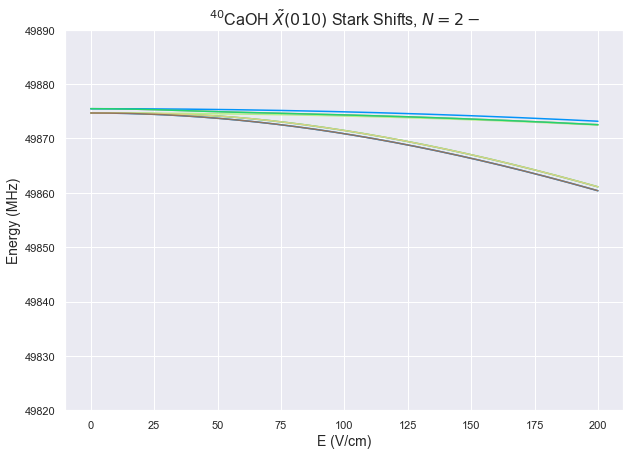

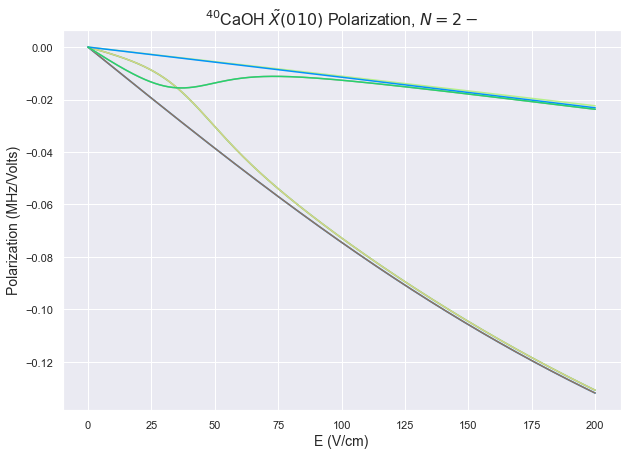

In [135]:
plt.figure(figsize=(10,7))
for (i,trace) in enumerate(X010.evals_E.T[N2_all]):
    plt.plot(Ez,trace)
plt.xlabel('E (V/cm)',fontsize=14)
plt.ylabel('Energy (MHz)',fontsize=14)
plt.title(r'$^{40}$CaOH $\tilde{X}(010)$ Stark Shifts, $N=2-$',fontsize=16);
plt.ylim(49820,49890)

plt.figure(figsize=(10,7))
for (i,trace) in enumerate(X010.evals_E.T[N2_all]):
    grad = np.gradient(trace)/(Ez[1]-Ez[0])
    plt.plot(Ez,grad)
plt.xlabel('E (V/cm)',fontsize=14)
plt.ylabel('Polarization (MHz/Volts)',fontsize=14)
plt.title(r'$^{40}$CaOH $\tilde{X}(010)$ Polarization, $N=2-$',fontsize=16);

In [36]:
X010.display_levels(0,1e-6,'F',idx=N1_all,label_q=[q for q in X010.q_str if q!='K'],alt_label=True)
plt.title(X010.state_str+', N=1d',fontsize=18)

Text(0.5, 1.0, '$^{40}$CaOH $\\tilde{X}(010)$, N=1,2, Free Field')

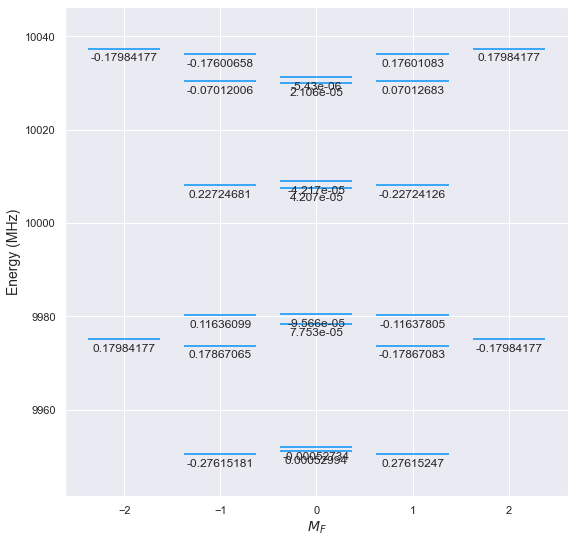

In [130]:
# X010 = MoleculeLevels.initialize_state('CaOH','40','X010',N_list,M_values = 'custom',I=[0,1/2],S=1/2,round=16,M_range=[1])
X010 = MoleculeLevels.initialize_state('CaOH','40','X010',[1],M_values = 'all',I=[0,1/2],S=1/2,round=8)
X010.display_PTV(60.8,1e-3,'EDM')

Text(0.5, 1.0, '$^{40}$CaOH $\\tilde{X}(010)$, N=1,2 60 V/cm, 1e-06 G')

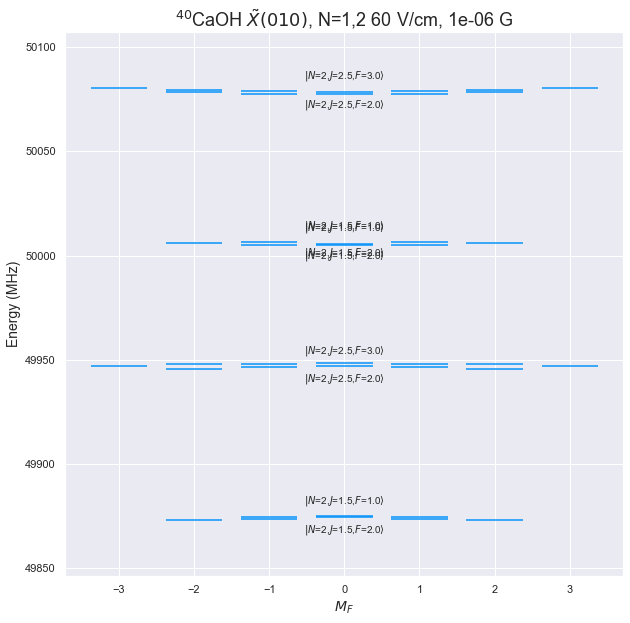

In [14]:
Efield = 60
Bfield = 1e-6
X010.display_levels(Efield,Bfield,'F',idx=N2,label_q=[q for q in X010.q_str if q!='K'],alt_label=True)
plt.title(X010.state_str+', N=1,2 {} V/cm, {} G'.format(Efield,Bfield),fontsize=18)

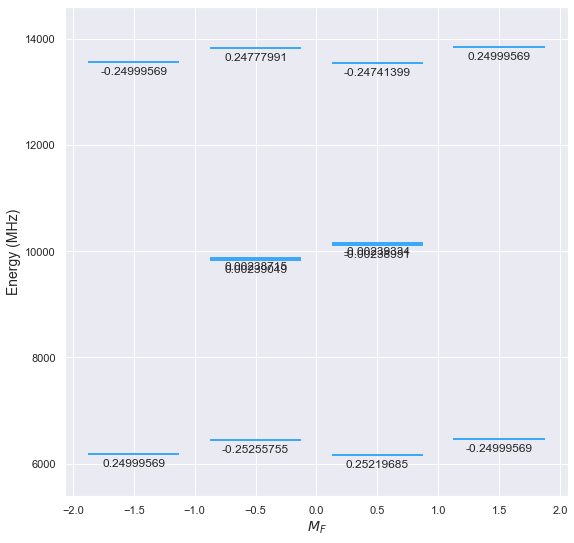

In [41]:
X010.display_PTV(,'EDM')

In [10]:
evals, evecs = X010.eigensystem(Efield,Bfield,order=True,method='torch')
M0_idx = X010.select_q({'M':[-3/2,-1/2,1/2,3/2]})
print(M0_idx)
print('\n')
# for i in M0_idx:
#     display(Latex('$E = '+str(np.round(X010.evals0[i],4))+r'\:\mathrm{MHz}$'))
#     print('Decoupled:')
#     display(Latex(X010.gen_state_str(i,basis='decoupled',thresh=0.05,label_q=['K','M_N','M_S','M_I','M_F'],round=4)))
#     print('Case A:')
#     display(Latex(X010.gen_state_str(i,basis='aBJ',thresh=0.05,label_q=['K','J','F','Sigma','P','M'],round=4)))
#     print('Case B:')
#     display(Latex(X010.gen_state_str(i,thresh=0.05,round=4)))
#     print('\n')

NameError: name 'Efield' is not defined

In [9]:
evals, evecs = X010.eigensystem(1000,1e-8,order=True,method='torch')
M0_idx = X010.select_q({'M':[0]})
print(M0_idx)
print('\n')
# for i in M0_idx:
#     display(Latex('$E = '+str(np.round(X010.evals0[i],4))+r'\:\mathrm{MHz}$'))
#     print('Decoupled:')
#     display(Latex(X010.gen_state_str(i,basis='decoupled',thresh=0.01,label_q=['K','M_N','M_S','M_I','M_F'],round=4)))
#     print('Case A:')
#     display(Latex(X010.gen_state_str(i,basis='aBJ',thresh=0.01,label_q=['J','K','Sigma','P','M'],round=4)))
#     print('Case B:')
#     display(Latex(X010.gen_state_str(i,thresh=0.01,round=4)))
#     print('\n')

[ 2  3  8 11 12 15 18 19]




In [42]:
Bz = np.linspace(1e-6,40,1000)
Ez = np.linspace(0,500,1000)

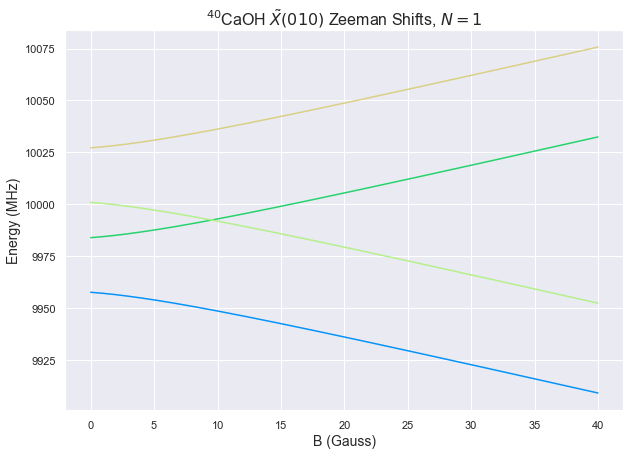

In [75]:
X010.ZeemanMap(Bz,0,plot=True)

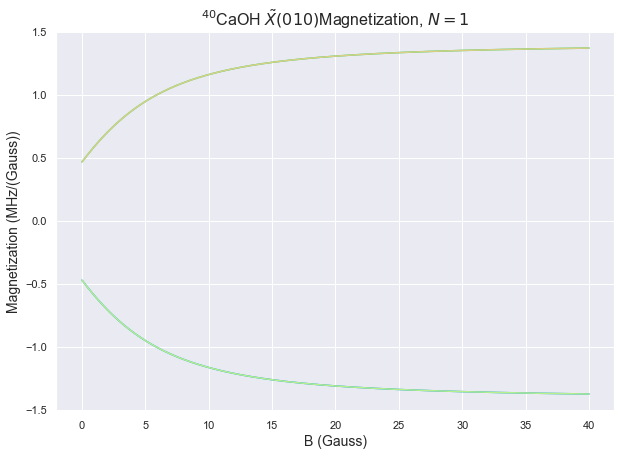

In [76]:
plt.figure(figsize=(10,7))
for (i,trace) in enumerate(X010.evals_B.T):
    grad = np.gradient(trace)/(Bz[1]-Bz[0])
    plt.plot(Bz,grad)
plt.xlabel('B (Gauss)',fontsize=14)
plt.ylabel('Magnetization (MHz/(Gauss))',fontsize=14)
plt.title(X010.state_str + r'Magnetization, $N={}$'.format(*X010.N_range),fontsize=16);

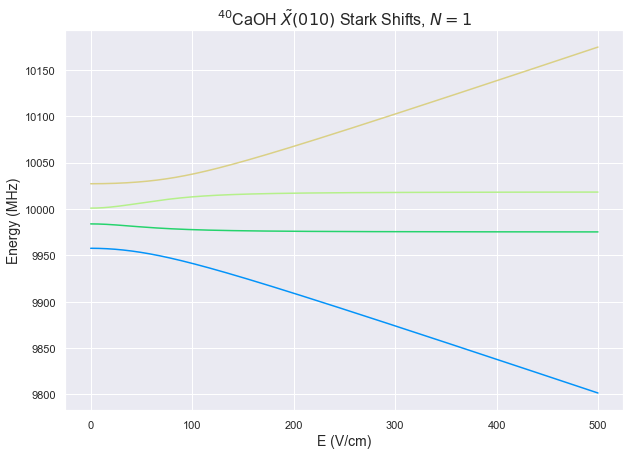

In [78]:
X010.StarkMap(Ez,1e-6,plot=True)
# X010.plot_evals_EB('E',kV_kG=True,GHz=True)

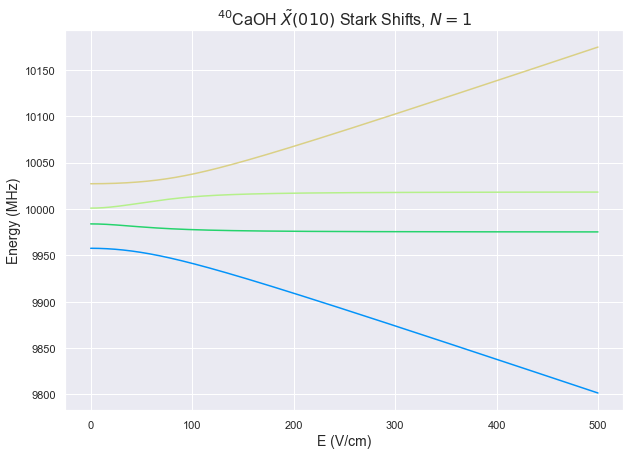

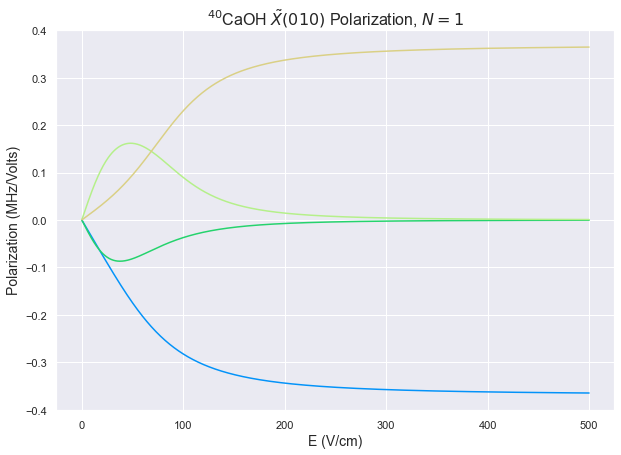

In [98]:
plt.figure(figsize=(10,7))
for (i,trace) in enumerate(X010.evals_E.T):
    plt.plot(Ez,trace)
plt.xlabel('E (V/cm)',fontsize=14)
plt.ylabel('Energy (MHz)',fontsize=14)
plt.title(r'$^{40}$CaOH $\tilde{X}(010)$ Stark Shifts, $N=1$',fontsize=16);

plt.figure(figsize=(10,7))
for (i,trace) in enumerate(X010.evals_E.T):
    grad = np.gradient(trace)/(Ez[1]-Ez[0])
    plt.plot(Ez,grad)
plt.xlabel('E (V/cm)',fontsize=14)
plt.ylabel('Polarization (MHz/Volts)',fontsize=14)
plt.title(r'$^{40}$CaOH $\tilde{X}(010)$ Polarization, $N=1$',fontsize=16);

We can display a plot of the energy levels at arbitray field. (The code does not handle parity labeling well, so I am leaving out L for zero field.)

Text(0.5, 1.0, '$^{40}$CaOH $\\tilde{X}(010)$, N=1, 0.5 kV/cm')

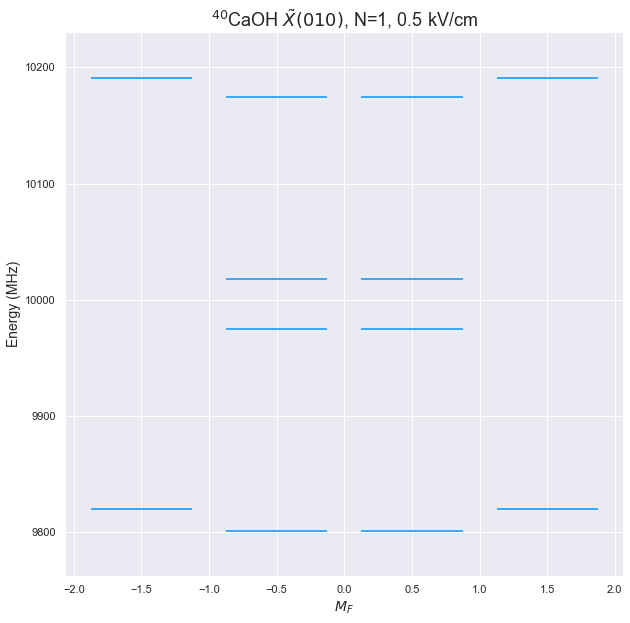

In [47]:
X010.display_levels(500,1e-7,'F',label=None,alt_label=True)
plt.title(X010.state_str+', N=1, 0.5 kV/cm',fontsize=18)

We can also look at PT violating shifts. Here, we consider the EDM shifts as a function of E field. 

In [48]:
X010.eigensystem(0,1e-8);

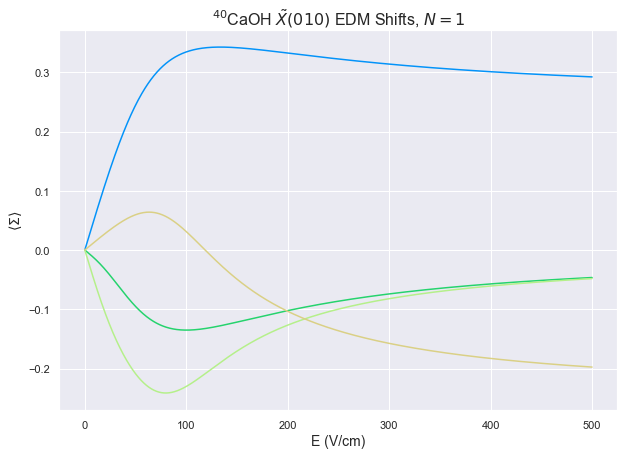

In [85]:
X010.PTV_Map('EDM',E_or_B='E',plot=True)

We can look specifically at the upper and lower Stark manifolds at a given field value too.

Text(0.5, 1.0, '$^{40}$CaOH $\\tilde{X}(010)$, EDM shifts at 60.8 V/cm')

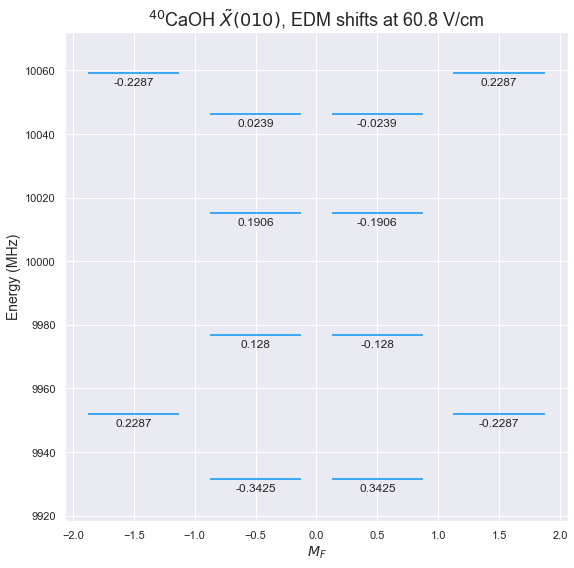

In [51]:
X010.display_PTV(133,1e-7,'EDM',round=4)
plt.title(X010.state_str+', EDM shifts at 60.8 V/cm',fontsize=18)

In [11]:
X010.eigensystem(1000,0)
M0_idx = X010.select_q({'M':[1]})
print(M0_idx)
print('\n')
# for i in M0_idx:
#     display(Latex('$E = '+str(np.round(X010.evals0[i],4))+r'\:\mathrm{MHz}$'))
#     print('Decoupled:')
#     display(Latex(X010.gen_state_str(i,basis='decoupled',thresh=0.01,label_q=['K','M_N','M_S','M_I','M_F'],round=4)))
#     print('Case A:')
#     display(Latex(X010.gen_state_str(i,basis='aBJ',thresh=0.01,label_q=['K','Sigma','P','M'],round=4)))
#     print('Case B:')
#     display(Latex(X010.gen_state_str(i,thresh=0.01,round=4)))
#     print('\n')

[ 1  4 10 13 16 21]




In [50]:
X010.eigensystem(100,1e-2)
(sy.Matrix(X010.evecs0[0]).T*X010.H_symbolic*sy.Matrix(X010.evecs0[0]))[0]

-0.048487643331535*Bz - 0.277154404334809*Ez + 9969.35364112334

In [43]:
(sy.Matrix(X010.evecs0[1]).T*X010.H_symbolic*sy.Matrix(X010.evecs0[1]))[0]

1.28069264538709*Bz - 0.368490639112473*Ez + 9987.63731699745

In [2]:
import matrix_elements as me
from functools import partial
from matrix_elements import decouple_b_even


trap=True
def H_even_X(q_numbers,params,matrix_elements,symbolic=True,E=0,B=0,M_values='all',precision=5,trap=trap,I0=0.01324/7,theta=np.pi/2):
    q_str = list(q_numbers)     # Get keys for quantum number dict
    if symbolic:
        Ez =E
        Bz = B
        if trap:
#             I0 = sy.symbols('I_0')
#             theta = sy.symbols('theta')
            T00_E = -1/np.sqrt(3)*I0*params['2/e0c']
            T20_E = (3*sy.cos(theta)**2 - 1)/np.sqrt(6)*I0*params['2/e0c']
            T2p1_E = -(sy.sin(2*theta)/2)*I0*params['2/e0c']
            T2m1_E = -T2p1_E
            T22_E = (sy.sin(theta)**2)/2*I0*params['2/e0c']
        size = len(q_numbers[q_str[0]])
        # Need to construct empty matrices to fill with matrix elements
        # Sympy does not like numpy arrays, so convert to list
        H0 = np.zeros((size,size)).tolist()
        V_B = np.zeros((size,size)).tolist()
        V_E = np.zeros((size,size)).tolist()
        V_trap = np.zeros((size,size)).tolist()
        if params.get('D') is not None:
            N0 = np.zeros((size,size)).tolist()
        if params.get('q_lD_D') is not None:
            lD0 = np.zeros((size,size)).tolist()
        #Iz = np.zeros((size,size)).tolist()
        #Sz = np.zeros((size,size)).tolist()
        for i in range(size):
            for j in range(size):
                # State out is LHS of bra ket, state in is RHS
                state_out = {q+'0':q_numbers[q][i] for q in q_str}
                state_in = {q+'1':q_numbers[q][j] for q in q_str}
                q_args = {**state_out,**state_in}
                elements = {term: sy.N(element(**q_args)) for term, element in matrix_elements.items()}
                # The Hamiltonian
                H0[i][j] = params['Be']*elements['N^2'] + params['Gamma_SR']*elements['N.S'] + \
                    params['bF']*elements['I.S'] + params['c']/3*np.sqrt(6)*elements['T2_0(I,S)']
                if params.get('q_lD') is not None:
                    H0[i][j] += params['p_lD']*elements['l doubling p'] - params['q_lD']*elements['l doubling q'] -params['Gamma_SR']*elements['NzSz']+params['Gamma_Prime']*elements['NzSz'] #old: params['q_lD']/2*elements['l-doubling']
                    # H0[i][j] += -params['q_lD']/2*elements['l-doubling'] - params['Gamma_SR']*elements['NzSz']+params['Gamma_Prime']*elements['NzSz']
                if M_values!='none':
                    V_B[i][j]+=params['g_S']*params['mu_B']*elements['ZeemanZ']
                    V_E[i][j]+=-params['muE']*elements['StarkZ']
                if M_values!='none' and trap:
                    V_trap[i][j]+= -1/4*(T00_E*(-elements['T0_azz']*params['azz']+elements['T0_axxyy']*params['axxyy']))
                    V_trap[i][j]+= -1/4*(T20_E*(2*params['azz']*elements['T20_azz']+params['axxyy']*elements['T20_axxyy']))
                    V_trap[i][j]+= -1/4*(-1)*(T2p1_E*(2*params['azz']*elements['T2-1_azz']+params['axxyy']*elements['T2-1_axxyy'])+T2m1_E*(2*params['azz']*elements['T21_azz']+params['axxyy']*elements['T21_axxyy']))
                    V_trap[i][j]+= -1/4*(T22_E*(2*params['azz']*elements['T22_azz']+params['axxyy']*elements['T22_axxyy'])+T22_E*(2*params['azz']*elements['T2-2_azz']+params['axxyy']*elements['T2-2_axxyy']))
                if params.get('D') is not None:
                    N0[i][j] += elements['N^2']
                if params.get('q_lD_D') is not None:
                    lD0[i][j] += elements['l doubling q']
                # H[i][j] = round(H[i][j],precision)
                #Iz[i][j] = params['c']*elements['Iz']
                #Sz[i][j] = elements['Sz']
        # Need to add centrifugal terms
        if params.get('D') is not None:
            H0 = matadd(H0,scalarmult(-params['D'],matmult(N0,N0)))
        if params.get('q_lD_D') is not None:
            H0 = matadd(H0,scalarmult(-params['q_lD_D']/2,(matadd(matmult(lD0,N0),matmult(N0,lD0)))))
        #H=matadd(H,matmult(Iz,Sz))
        # Create symbolic object
        H_symbolic = sy.Matrix(H0)+Ez*sy.Matrix(V_E)+Bz*sy.Matrix(V_B)
        if trap:
            H_symbolic+=sy.Matrix(V_trap)
#         H0_num = np.array(H0).astype(np.float64)
#         V_E_num = np.array(V_E).astype(np.float64)
#         V_B_num = np.array(V_B).astype(np.float64)
#         # Use symbolic object to create function that given E and B values, returns a numpy array
#         if trap:
#             H_func = sy.lambdify((Ez,Bz,I0,theta), H_symbolic, modules='numpy')
#         else:
#             H_func = lambda E,B: H0_num + V_E_num*E + V_B_num*B
        # H_func = sy.lambdify((Ez,Bz), H_symbolic, modules='numpy')
        return H_symbolic
                        
def matmult(a,b):
    zip_b = list(zip(*b))
    return [[sum(ele_a*ele_b for ele_a, ele_b in zip(row_a, col_b))
             for col_b in zip_b] for row_a in a]

def scalarmult(s,mat):
    return [[s*ele for ele in inner] for inner in mat]

def matadd(a,b):
    return [[ele_a+ele_b for ele_a,ele_b in zip(row_a,row_b)] for row_a,row_b in zip(a,b)]

def decouple_b(input_qnumbers,output_qnumbers,S=1/2,I=1/2):
    input_keys = list(input_qnumbers)
    output_keys = list(output_qnumbers)
    input_size = len(input_qnumbers[input_keys[0]])
    output_size = len(output_qnumbers[output_keys[0]])
    basis_matrix = np.zeros((output_size,input_size)).tolist()
    for i in range(output_size):
        for j in range(input_size):
            decoupled_qnumbers = {q:output_qnumbers[q][i] for q in output_keys}
            b_qnumbers = {q:input_qnumbers[q][j] for q in input_keys}
            basis_matrix[i][j] = sy.nsimplify(decouple_b_even(decoupled_qnumbers,b_qnumbers,S=S,I=I))
    return basis_matrix
   
M_values='all' 

bBJ_even_X_matrix_elements={
        # Fine Structure
        'N^2': me.Rot_bBJ,                 # N^2 Rotation
        'N.S': me.SR_bBJ,                  # N.S Spin Rotation
        'l-doubling': me.lD_bBJ,           # Effective l doubling
        'l doubling p':me.p_lD_bBJ,
        'l doubling q':me.q_lD_bBJ,
        'NzSz': me.NzSz_bBJ,               # NzSz for bending mode

        # Hydrogen Hyperfine
        'I.S': me.IS_bBJ,                  # I.S Fermi Contact Interaction
        'T2_0(I,S)': me.T2IS_bBJ,          # I S dipolar interaction
        'Iz': me.Iz_bBJ,                   # I.n projection of I on internuclear axis n
        'Sz': me.Sz_bBJ,                   # S.n projection of S on internuclear axis n
        }

if M_values != 'none':
    ext_fields = {
    # External Fields
    'ZeemanZ': me.ZeemanZ_bBJ,         # Zeeman interaction with lab z magnetic field
    'StarkZ': me.StarkZ_bBJ            # Stark interaction with lab z electric field
    }
    bBJ_even_X_matrix_elements.update(ext_fields)
if trap:
    trap_shifts = {
    'T0_azz': me.T00_alphaZZ_bBJ,
    'T0_axxyy': me.T00_alphaXXYY_bBJ,
    'T20_azz': partial(me.T20p_alphaZZ_bBJ,p=0),
    'T21_azz': partial(me.T20p_alphaZZ_bBJ,p=1),
    'T2-1_azz': partial(me.T20p_alphaZZ_bBJ,p=-1),
    'T22_azz': partial(me.T20p_alphaZZ_bBJ,p=2),
    'T2-2_azz': partial(me.T20p_alphaZZ_bBJ,p=-2),
    'T20_axxyy': partial(me.T20p_alphaXXYY_bBJ,p=0),
    'T21_axxyy': partial(me.T20p_alphaXXYY_bBJ,p=1),
    'T2-1_axxyy': partial(me.T20p_alphaXXYY_bBJ,p=-1),
    'T22_axxyy': partial(me.T20p_alphaXXYY_bBJ,p=2),
    'T2-2_axxyy': partial(me.T20p_alphaXXYY_bBJ,p=-2),
    }
    bBJ_even_X_matrix_elements.update(trap_shifts)
for term,element in bBJ_even_X_matrix_elements.items():       #iterate through, substitute hydrogen proton value
    bBJ_even_X_matrix_elements[term] = partial(element,I=1/2)

        

B,D,gamma,gammap, bF,c,b,q_lD,muE,muB,g_S,g_L = sy.symbols('B_{rot} D gamma gamma^\' b_F c b q_{lD} D mu_B g_S g_L')
params_40X010 = {
'Be': 9996.82,
'D': 0.008823,
'Gamma_SR': 35.5,
'Gamma_Prime': 0,
'bF': bF,#2.2445, #2.602, #2.29 fit?
'c': c,#2.6074, #2.053, #2.52 fit?
# 'b': (2.29-2.52/3),
'p_lD': -0.00,
'q_lD': -21.53,
# 'q_lD_D': 6.4*10**-4,
'muE': 1.465*0.503412,
'mu_B': 1.399624494, #MHz/Gauss
'g_S': 2.0023,
'g_L': 1,
'2/e0c': 2*3.76730314*10**(10),# (V/cm)^2/(W/um^2),
'azz': 3.5555*10**(-8), #From Lan for X(000)
'axxyy': 1.1718*10**(-7) #From Lan for X(000)
}

params_40X000 = {
'Be': B,#10023.0841,
'D': 0,#1.154*10**-2,
'Gamma_SR':gamma,# 34.7593,
'bF': bF,#2.602,
'c': c,#2.053,
'b': (2.602-2.053/3),
'muE': 1.465*0.503412 #Debye in MHz/(V/cm)
}

def build_operator(q_numbers,parameter,operator_element,M_values='all',precision=5):
    q_str = list(q_numbers)     # Get keys for quantum number dict
    size = len(q_numbers[q_str[0]])
    # Need to construct empty matrices to fill with matrix elements
    # Sympy does not like numpy arrays, so convert to list
    H0 = np.zeros((size,size)).tolist()
    #Iz = np.zeros((size,size)).tolist()
    #Sz = np.zeros((size,size)).tolist()
    for i in range(size):
        for j in range(size):
            # State out is LHS of bra ket, state in is RHS
            state_out = {q+'0':q_numbers[q][i] for q in q_str}
            state_in = {q+'1':q_numbers[q][j] for q in q_str}
            q_args = {**state_out,**state_in}
            operator = sy.nsimplify(operator_element(**q_args))
            H0[i][j]+= parameter*operator
    H_symbolic = sy.Matrix(H0)
    return H_symbolic

In [3]:
# X000 = MoleculeLevels.initialize_state('CaOH','40','X000',[1,2],M_values = 'none',I=[0,1/2],S=1/2,round=8,P_values=[1/2,3/2])
X010 = MoleculeLevels.initialize_state('CaOH','40','X010',[1,2],M_values = 'all',I=[0,1/2],S=1/2,round=8,P_values=[1/2,3/2],trap=True)

In [4]:
H_sym010 = H_even_X(X010.q_numbers,params_40X010,bBJ_even_X_matrix_elements,symbolic=True,E=0,B=1e-3,M_values='all',precision=8,theta=np.arccos(1/np.sqrt(3)))
# H_sym000 = H_even_X(X000.q_numbers,params_40X000,bBJ_even_X_matrix_elements,symbolic=True,E=0,B=0,M_values='none',precision=8)

In [17]:
(H_sym010)

Matrix([
[    9978.24299167691,                21.53,                    0,                    0,  -0.0004670780207227,                    0,                    0,                    0,                    0,                    0, -0.00132109614318485,                    0,                    0,                    0,   0.031588343148646,                   0,   0.0446726632937104,                    0, 8.59038646151817e-18,                    0,  -0.0446726632937104,                    0,   0.031588343148646,                   0],
[               21.53,     9978.24299167691,                    0,                    0,                    0,  -0.0004670780207227,                    0,                    0,                    0,                    0,                    0, -0.00132109614318485,                    0,                    0,                   0,   0.031588343148646,                    0,   0.0446726632937104,                    0, 8.59038646151817e-18,                    0,  -0.

In [5]:
X010.I_trap = 0.01324/7
X010.theta_trap =  np.pi/2  #np.arccos(1/np.sqrt(3))

In [6]:
X010.eigensystem(0,0)
x = sy.Matrix(X010.evecs0[1]).T*H_sym010*sy.Matrix(X010.evecs0[1])
y = sy.Matrix(X010.evecs0[3]).T*H_sym010*sy.Matrix(X010.evecs0[3])
sy.N(y-x)[0]

0.367961922990009*b_F + 0.219345803243874*c - 0.0353908476481593

In [7]:
X010.eigensystem(0,0)
x = sy.Matrix(X010.evecs0[24]).T*H_sym010*sy.Matrix(X010.evecs0[24])
y = sy.Matrix(X010.evecs0[30]).T*H_sym010*sy.Matrix(X010.evecs0[30])
sy.N(y-x)[0]

0.413632090988582*b_F - 0.131166263357486*c - 0.0175993431912502

In [22]:
X010.eigensystem(0,0)
x = sy.Matrix(X010.evecs0[3]).T*H_sym010*sy.Matrix(X010.evecs0[3])
y = sy.Matrix(X010.evecs0[30]).T*H_sym010*sy.Matrix(X010.evecs0[30])
sy.N(y-x)[0]

-0.00307041379534623*b_F - 0.249142774119685*c + 39917.371471207

In [24]:
X010.eigensystem(0,0)
x = sy.Matrix(X010.evecs0[1]).T*H_sym010*sy.Matrix(X010.evecs0[1])
y = sy.Matrix(X010.evecs0[24]).T*H_sym010*sy.Matrix(X010.evecs0[24])
sy.N(y-x)[0]

-0.0493531466337837*b_F + 0.101460332543083*c + 39917.3212006853

In [26]:
X010.eigensystem(0,0)
x = sy.Matrix(X010.evecs0[8]).T*H_sym*sy.Matrix(X010.evecs0[8])
y = sy.Matrix(X010.evecs0[9]).T*H_sym*sy.Matrix(X010.evecs0[9])
sy.N(y-x)[0]

0.418411255309182*b_F - 0.131967862542875*c - 0.0256237563371542

In [20]:
X010.eigensystem(0,0)
x = sy.Matrix(X010.evecs0[0]).T*H_sym*sy.Matrix(X010.evecs0[0])
y = sy.Matrix(X010.evecs0[9]).T*H_sym*sy.Matrix(X010.evecs0[9])
sy.N(x-y)[0]

-0.368690266949417*b_F + 0.0308154564509281*c - 39917.095216173

In [46]:
X010.write_state(30)

E = 49873.20483311392 MHz

 -2.2936271480030665e-10 |K=-1,N=1,J=0.5,F=0.0,M=0.0> 

 -2.2936271477596342e-10 |K=1,N=1,J=0.5,F=0.0,M=0.0> 

 -3.32418757776308e-14 |K=-1,N=1,J=0.5,F=1.0,M=-1.0> 

 -3.316791286067655e-14 |K=1,N=1,J=0.5,F=1.0,M=-1.0> 

 8.659286603866219e-06 |K=-1,N=1,J=0.5,F=1.0,M=0.0> 

 8.659286603892935e-06 |K=1,N=1,J=0.5,F=1.0,M=0.0> 

 -3.3667708462852214e-14 |K=-1,N=1,J=0.5,F=1.0,M=1.0> 

 -3.362845822662587e-14 |K=1,N=1,J=0.5,F=1.0,M=1.0> 

 1.0029459952294725e-12 |K=-1,N=1,J=1.5,F=1.0,M=-1.0> 

 1.0028097952111719e-12 |K=1,N=1,J=1.5,F=1.0,M=-1.0> 

 -0.00026228990700559587 |K=-1,N=1,J=1.5,F=1.0,M=0.0> 

 -0.00026228990700557467 |K=1,N=1,J=1.5,F=1.0,M=0.0> 

 1.0223014113536995e-12 |K=-1,N=1,J=1.5,F=1.0,M=1.0> 

 1.0222085720831591e-12 |K=1,N=1,J=1.5,F=1.0,M=1.0> 

 1.251982996970983e-05 |K=-1,N=1,J=1.5,F=2.0,M=-2.0> 

 1.2519829969943248e-05 |K=1,N=1,J=1.5,F=2.0,M=-2.0> 

 -6.855161698692353e-14 |K=-1,N=1,J=1.5,F=2.0,M=-1.0> 

 -6.857561467998541e-14 |K=1,N=1,J=1.5

In [23]:
NzSz = build_operator(X010.q_numbers,params_40X010['Gamma_Prime'],bBJ_even_X_matrix_elements['NzSz'],precision=8)
NS = build_operator(X010.q_numbers,params_40X010['Gamma_SR'],bBJ_even_X_matrix_elements['N.S'],precision=8)

In [24]:
NS-NzSz

Matrix([
[-gamma + gamma^'/2,                  0,                  0,                  0,                  0,                  0,                  0,                  0,                   0,                   0,                   0,                   0,                   0,                   0,                   0,                   0,                   0,                   0,                   0,                   0,                   0,                   0,                   0,                   0],
[                 0, -gamma + gamma^'/2,                  0,                  0,                  0,                  0,                  0,                  0,                   0,                   0,                   0,                   0,                   0,                   0,                   0,                   0,                   0,                   0,                   0,                   0,                   0,                   0,                   0,                  

In [25]:
inputt = X010.q_numbers
output = X010.alt_q_numbers['decoupled']
basis_matrix = sy.Matrix(decouple_b(inputt,output,I=1/2))

In [26]:
H_dcpl = basis_matrix*H_sym*basis_matrix.T

In [27]:
NzSz_dcpl = basis_matrix*NzSz*basis_matrix.T
NS_dcpl = basis_matrix*NS*basis_matrix.T

In [28]:
SR_dcpl = NS_dcpl-NzSz_dcpl

In [29]:
SR_dcpl

Matrix([
[gamma/2 - gamma^'/4,                   0,                   0,                   0,                                   0,                                   0,                                   0,                                   0,                                   0,                                   0,                                   0,                                   0,                                   0,                                   0,                                   0,                                   0,                                   0,                                   0,                                   0,                                   0,                   0,                   0,                   0,                   0],
[                  0, gamma/2 - gamma^'/4,                   0,                   0,                                   0,                                   0,                                   0,                                  

In [28]:
ilist = range(0,24)
for i in ilist:
    print(i)
    for k,v in X010.q_numbers.items():
        print('{} = {}'.format(k,v[i]))

0
K = -1
N = 1
J = 0.5
F = 0.0
M = 0.0
1
K = 1
N = 1
J = 0.5
F = 0.0
M = 0.0
2
K = -1
N = 1
J = 0.5
F = 1.0
M = 0.0
3
K = 1
N = 1
J = 0.5
F = 1.0
M = 0.0
4
K = -1
N = 1
J = 1.5
F = 1.0
M = 0.0
5
K = 1
N = 1
J = 1.5
F = 1.0
M = 0.0
6
K = -1
N = 1
J = 1.5
F = 2.0
M = 0.0
7
K = 1
N = 1
J = 1.5
F = 2.0
M = 0.0
8
K = -1
N = 2
J = 1.5
F = 1.0
M = 0.0
9
K = 1
N = 2
J = 1.5
F = 1.0
M = 0.0
10
K = -1
N = 2
J = 1.5
F = 2.0
M = 0.0
11
K = 1
N = 2
J = 1.5
F = 2.0
M = 0.0
12
K = -1
N = 2
J = 2.5
F = 2.0
M = 0.0
13
K = 1
N = 2
J = 2.5
F = 2.0
M = 0.0
14
K = -1
N = 2
J = 2.5
F = 3.0
M = 0.0
15
K = 1
N = 2
J = 2.5
F = 3.0
M = 0.0
16


IndexError: list index out of range

In [25]:
vec = np.zeros(24)
vec[6] = 1/sy.sqrt(2) #
vec[17] = 1/sy.sqrt(2)

In [26]:
NS_dcpl-NzSz_dcpl

Matrix([
[gamma/4,       0,               0,               0,               0,               0,               0,               0,               0,               0,       0,       0],
[      0, gamma/4,               0,               0,               0,               0,               0,               0,               0,               0,       0,       0],
[      0,       0,        -gamma/4,               0, sqrt(2)*gamma/4,               0,               0,               0,               0,               0,       0,       0],
[      0,       0,               0,        -gamma/4,               0, sqrt(2)*gamma/4,               0,               0,               0,               0,       0,       0],
[      0,       0, sqrt(2)*gamma/4,               0,               0,               0,               0,               0,               0,               0,       0,       0],
[      0,       0,               0, sqrt(2)*gamma/4,               0,               0,               0,               0, 

In [27]:
H_dcpl=sy.simplify(H_dcpl)
H_dcpl

Matrix([
[-B_z*g_S*mu_B/2 + B_{rot} - D*E_z/2 + gamma/4,                                       -q_{lD},                                            0,                                            0,                         0,                         0,                        0,                        0,                                             0,                                             0,                                            0,                                            0],
[                                      -q_{lD}, -B_z*g_S*mu_B/2 + B_{rot} + D*E_z/2 + gamma/4,                                            0,                                            0,                         0,                         0,                        0,                        0,                                             0,                                             0,                                            0,                                            0],
[                              

In [135]:
X010.eigensystem(1000,0)
even = sy.Matrix([0,1/sy.sqrt(2),0,0,0,0,1/sy.sqrt(2),0])
odd = sy.Matrix([1/sy.sqrt(2),0,0,0,0,0,0,-1/sy.sqrt(2)])
x = sy.simplify(even.T*H_dcpl*even)
y = sy.simplify(odd.T*H_dcpl*odd)
x[0]

B_{rot} + D*E_z/2 + b_F/4 + c/60 - gamma/4

In [136]:
y[0]

B_{rot} - D*E_z/2 + b_F/4 + c/60 - gamma/4

In [142]:
X010.eigensystem(1000,)
x = sy.Matrix(X010.evecs0[0]).T*H_sym*sy.Matrix(X010.evecs0[0])
y = sy.Matrix(X010.evecs0[1]).T*H_sym*sy.Matrix(X010.evecs0[1])
sy.N(x-y)[0]

-1.09823410572936e-11*B_z*g_S*mu_B + 3.74903172901661e-5*D*E_z - 0.00019018948895402*b_F - 0.0122648086400407*c - 5.8647193332706e-5*gamma + 0.00118230125639449*q_{lD}

In [42]:
X010.H_symbolic

Matrix([
[                           9980.21896666667,                                      21.649,         -0.4670780207227*Bz + 0.24583286*Ez,                                           0, -1.32109614318485*Bz + 0.173830082344483*Ez,                                           0,                                           0,                                           0],
[                                     21.649,                            9980.21896666667,                                           0,         -0.4670780207227*Bz - 0.24583286*Ez,                                           0, -1.32109614318485*Bz - 0.173830082344483*Ez,                                           0,                                           0],
[        -0.4670780207227*Bz + 0.24583286*Ez,                                           0,                            9978.89541111111,                                      21.649,                            1.14594510633293,                                          

In [17]:
X010.eigensystem(100000,0)
M0_idx = X010.select_q({'M':[0]})
print(M0_idx)
for i in M0_idx:
    print('E =',X010.evals0[i])
    display(Latex(X010.gen_state_str(i,basis='decoupled',thresh=0.001,label_q=['K','M_N','M_S','M_I','M_F'])))
#     display(Latex(X010.gen_state_str(i,basis='aBJ',thresh=0.05,label_q=['K','Sigma','P','M'])))
#     display(Latex(X010.gen_state_str(i,thresh=0.05)))

[0 1 2 3 4 5 6 7]
E = -26869.87053477218


<IPython.core.display.Latex object>

E = -26869.753213628093


<IPython.core.display.Latex object>

E = 9973.151313958582


<IPython.core.display.Latex object>

E = 10016.449292801037


<IPython.core.display.Latex object>

E = 10042.423225935365


<IPython.core.display.Latex object>

E = 10085.720997939427


<IPython.core.display.Latex object>

E = 46880.36769489169


<IPython.core.display.Latex object>

E = 46880.485222874166


<IPython.core.display.Latex object>

In [83]:
X010.eigensystem(0,1e-6)
X010.g_eff_Map(step=1e-6);

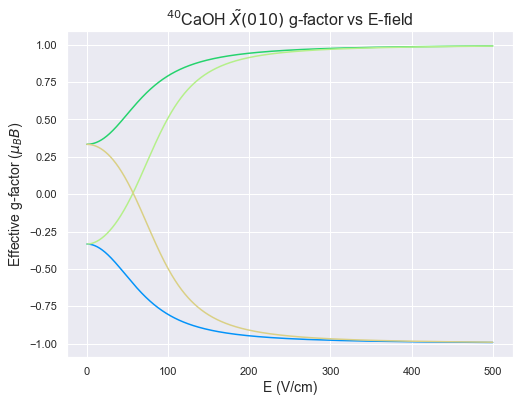

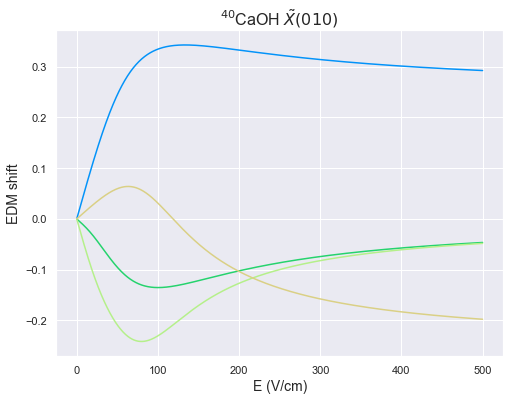

In [86]:
j = range(len(X010.evals0))
plt.figure(figsize=(8,6))
for i in range(len(X010.g_eff_E.T)):#range(len(X010_174.g_eff_E.T)):
    plt.plot(Ez,X010.g_eff_E.T[i])
plt.xlabel('E (V/cm)',fontsize=14)
plt.ylabel(r'Effective g-factor ($\mu_B B$)',fontsize=14)
plt.title(X010.state_str + ' g-factor vs E-field',fontsize=16);
plt.figure(figsize=(8,6))
for i in range(len(X010.g_eff_E.T)):#range(len(X010_174.PTV_E.T)):
    plt.plot(Ez,X010.PTV_E.T[i])
plt.xlabel('E (V/cm)',fontsize=14)
plt.ylabel('EDM shift',fontsize=14)
plt.title(X010.state_str,fontsize=16);

In [81]:
X010.eigensystem(0,1e-6)
M_idx = X010.select_q({'M':[1/2]})
print(M_idx)

[0 1 2 3]


IndexError: index 4 is out of bounds for axis 0 with size 4

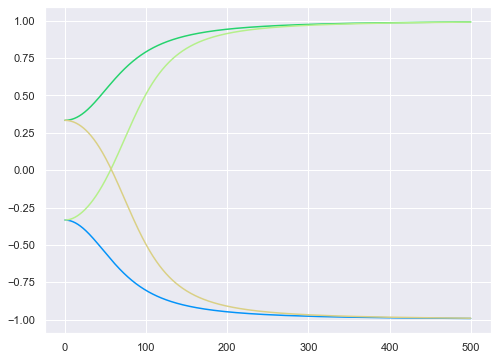

In [87]:
j = range(len(X010.evals0))
plt.figure(figsize=(8,6))
for i in range(10):#range(len(X010_174.g_eff_E.T)):
    plt.plot(Ez,X010.g_eff_E.T[i])
plt.xlabel('E (V/cm)',fontsize=14)
plt.ylabel(r'Effective g-factor ($\mu_B B$)',fontsize=14)
plt.title(X010.state_str + ' g-factor vs E-field',fontsize=16);
plt.xlim(53,73)
plt.figure(figsize=(8,6))
for i in range(12):#range(len(X010_174.PTV_E.T)):
    plt.plot(Ez,X010.PTV_E.T[i])
plt.xlabel('E (V/cm)',fontsize=14)
plt.ylabel('EDM shift',fontsize=14)
plt.title(X010.state_str,fontsize=16);
plt.xlim(53,73);

In [175]:
for j in [12,18]:
    g_eff = X010.g_eff_E.T[j]
    for i in range(1,len(g_eff)):
        if (g_eff[i]>0 and g_eff[i-1]<0) or g_eff[i]<0 and g_eff[i-1]>0:
            print('idx =',j)
            print('E field =',(Ez[i]+Ez[i-1])/2)
            print('PTV =,',(X010.PTV_E.T[j][i]+X010.PTV_E.T[j][i-1])/2)
            print('Energy =',(X010.evals_E.T[j][i]+X010.evals_E.T[j][i-1])/2)

idx = 12
E field = 60.83108310831083
PTV =, -0.22727988
Energy = 10008.053070099853
idx = 18
E field = 65.28152815281528
PTV =, 0.070567485
Energy = 10030.921999206803


In [196]:
X010.eigensystem(1000,1e-7)
M_idx = X010.select_q({'M':[0]})
idx = M_idx
for i in idx:
    print(idx)
    print(X010.g_eff_EB()[i])
    display(Latex('$E = '+str(np.round(X010.evals0[i],4))+r'\:\mathrm{MHz}$'))
    print('Decoupled:')
    display(Latex(X010.gen_state_str(i,basis='decoupled',thresh=0.05,label_q=['K','M_N','M_S','M_I','M_F'],round=4)))
    print('Case A:')
    display(Latex(X010.gen_state_str(i,basis='aBJ',thresh=0.05,label_q=['J','K','Sigma','P','M'],round=4)))
    print('Case B:')
    display(Latex(X010.gen_state_str(i,thresh=0.05,round=4)))
    print('\n')

[ 2  3  8 11 12 15 18 19]
3.8988801882439546e-05


<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:


<IPython.core.display.Latex object>



[ 2  3  8 11 12 15 18 19]
7.797760376487909e-05


<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:


<IPython.core.display.Latex object>



[ 2  3  8 11 12 15 18 19]
-1.2996267294146515e-05


<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:


<IPython.core.display.Latex object>



[ 2  3  8 11 12 15 18 19]
-2.599253458829303e-05


<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:


<IPython.core.display.Latex object>



[ 2  3  8 11 12 15 18 19]
-1.2996267294146515e-05


<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:


<IPython.core.display.Latex object>



[ 2  3  8 11 12 15 18 19]
-3.8988801882439546e-05


<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:


<IPython.core.display.Latex object>



[ 2  3  8 11 12 15 18 19]
-2.599253458829303e-05


<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:


<IPython.core.display.Latex object>



[ 2  3  8 11 12 15 18 19]
1.2996267294146515e-05


<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:


<IPython.core.display.Latex object>

Text(0.5, 1.0, '$^{40}$CaOH $\\tilde{X}(010)$, EDM shifts at 65.28 V/cm')

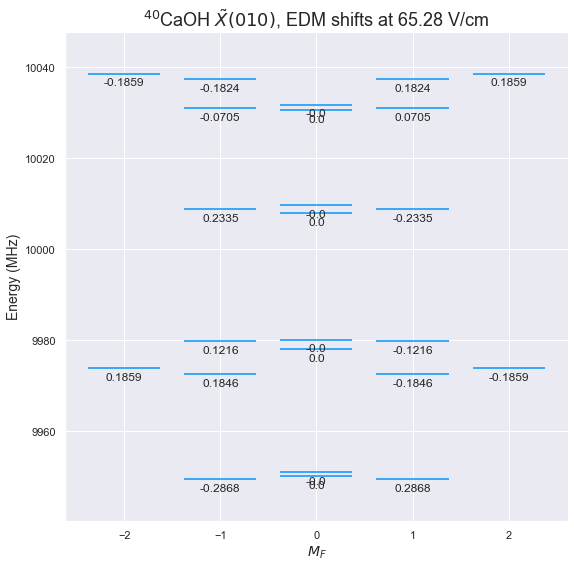

In [179]:
X010.display_PTV(65.28,1e-7,'EDM',round=4)
plt.title(X010.state_str+', EDM shifts at 65.28 V/cm',fontsize=18)

[ 1  3  5  9 13 15 17 21]
1 1.45e-05 499.7999799979998
3 1.45e-05 499.74997499749975
5 1.3e-07 105.06050605060506
9 1.3e-07 90.65906590659066
13 1.6e-07 105.71057105710571
15 1.8e-07 106.66066606660665
17 1.149e-05 499.8999899989999
21 1.149e-05 499.84998499849985


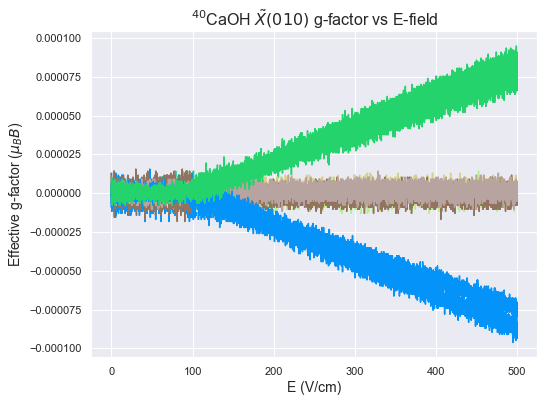

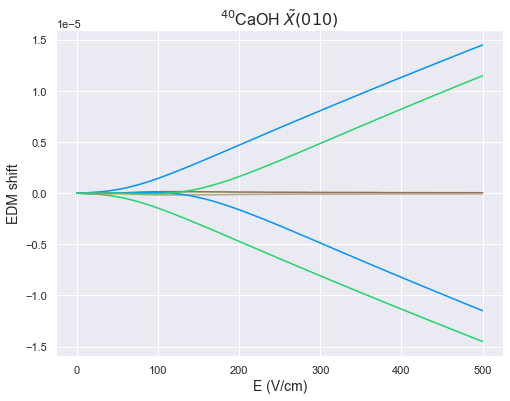

In [192]:
X010.eigensystem(0,1e-6)
M_idx = X010.select_q({'M':[0]})
print(M_idx)

j = range(len(X010.evals0))
plt.figure(figsize=(8,6))
for i in M_idx:#range(len(X010_174.g_eff_E.T)):
    plt.plot(Ez,X010.g_eff_E.T[i])
plt.xlabel('E (V/cm)',fontsize=14)
plt.ylabel(r'Effective g-factor ($\mu_B B$)',fontsize=14)
plt.title(X010.state_str + ' g-factor vs E-field',fontsize=16);
plt.figure(figsize=(8,6))
for i in M_idx:#range(len(X010_174.PTV_E.T)):
    plt.plot(Ez,X010.PTV_E.T[i])
    print(i,max(abs(X010.PTV_E.T[i])),Ez[np.argmax(abs(X010.PTV_E.T[i]))])
plt.xlabel('E (V/cm)',fontsize=14)
plt.ylabel('EDM shift',fontsize=14)
plt.title(X010.state_str,fontsize=16);

Text(0.5, 1.0, '$^{40}$CaOH $\\tilde{X}(010)$, EDM shifts at 1000 V/cm and 10 mG')

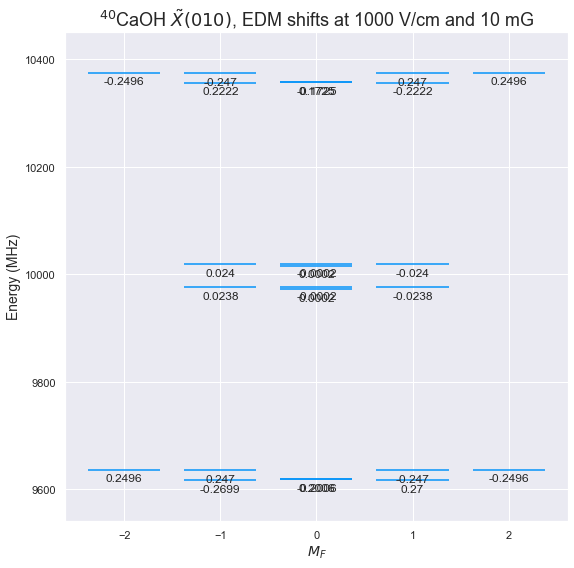

In [199]:
X010.display_PTV(1000,1e-2,'EDM',round=4)
plt.title(X010.state_str+', EDM shifts at 1000 V/cm and 10 mG',fontsize=18)

In [105]:
import time
X010_p = MoleculeLevels.initialize_state('CaOH','40','X010',N_list,M_values = 'custom',I=[0,1/2],S=1/2,round=8,M_range=[1])

Bz = np.linspace(1e-6,20,1000)
Ez = np.linspace(0,500,1000)
t0 = time.perf_counter()
Bslices_p = X010_p.EB_grid(Ez,Bz,PTV=True,E_or_B_first='B',output=True,EDM_or_MQM='EDM')
t1 = time.perf_counter()
elapsed = t1 - t0
print(elapsed, 'sec')

25.03476210000008 sec


In [49]:
import json
import ujson as uj

def get_json_data(file_path,numpy=False,ujson=True):
    if '.json' not in file_path:
        file_path+='.json'
    with open(file_path, 'r') as f:
        if ujson:
            data = uj.load(f)
        else:
            data = json.load(f)
    if numpy:
        data = np.array(data)
    return data

def save_json_data(data,file_path,ujson=True):
    if type(data) is np.ndarray:
        data_save = data.tolist()
    else:
        data_save=data
    if '.json' not in file_path:
        file_path+='.json'
    with open(file_path,'w') as f:
        if ujson:
            uj.dump(data_save,f)
        else:
            json.dump(data_save,f)
    print('Data saved to', file_path)

In [50]:
# save_json_data(Bslices[0].tolist(),'X010_CaOH_Mpm0p5_EB_grid_evals_20220306')
# save_json_data(Bslices[1].tolist(),'X010_CaOH_Mpm0p5_EB_grid_PTV_20220306')

In [106]:
mesh = np.array(np.meshgrid(Ez,Bz,indexing='ij'))

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  after removing the cwd from sys.path.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  """


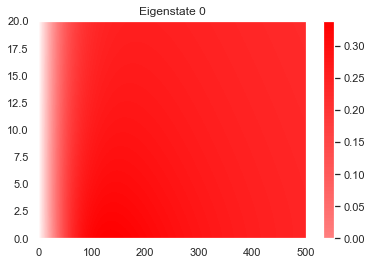

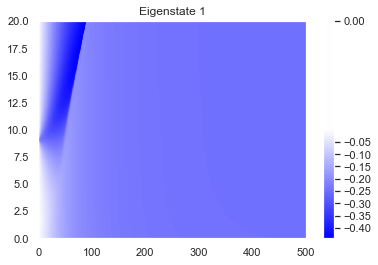

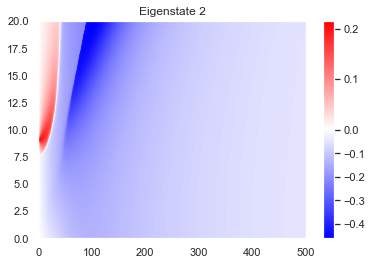

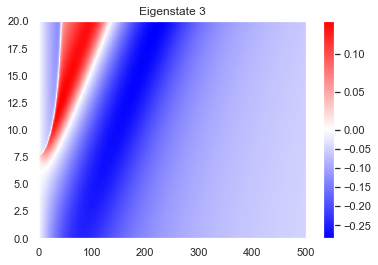

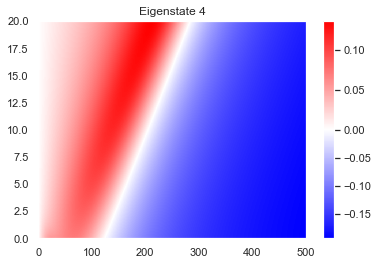

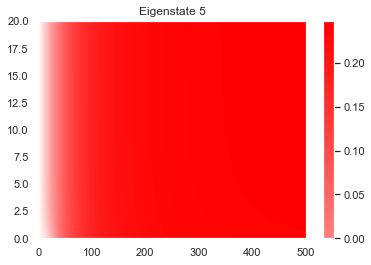

In [107]:
from matplotlib.colors import TwoSlopeNorm
for i in range(len(Bslices_p[0])):
    plt.figure()
    plt.pcolormesh(*mesh,Bslices_p[1][i],shading='auto',cmap='bwr',norm=TwoSlopeNorm(0))
    plt.colorbar()
    plt.title('Eigenstate {}'.format(i))

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  


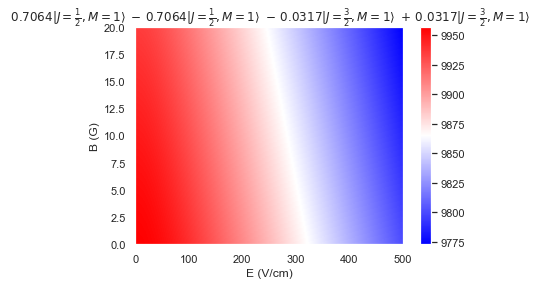

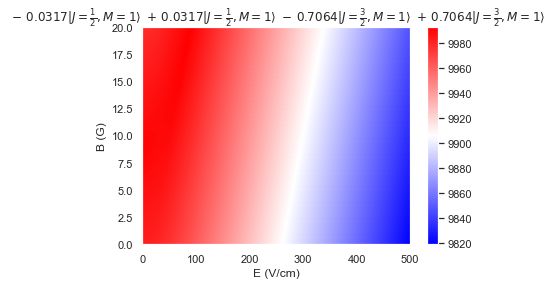

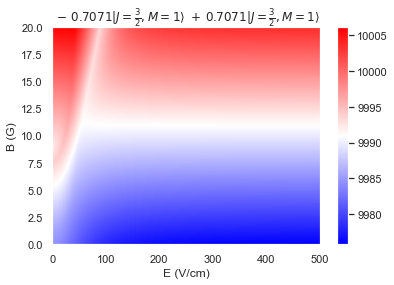

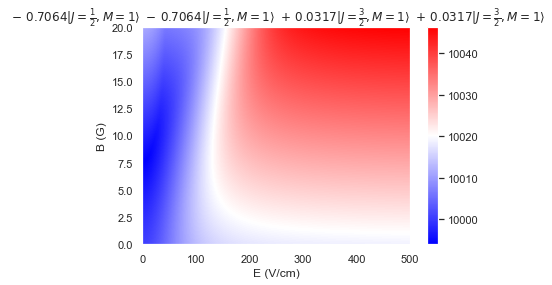

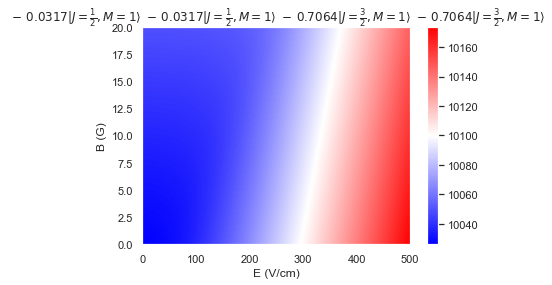

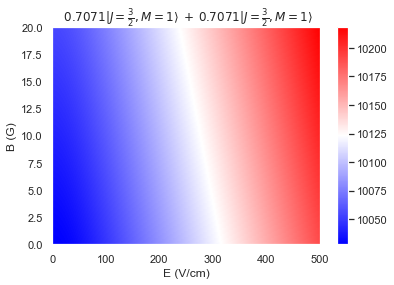

In [108]:
mesh = np.array(np.meshgrid(Ez,Bz,indexing='ij'))
for i in range(len(Bslices_p[0])):
    plt.figure()
    plt.grid(False)
    plt.pcolormesh(*mesh,Bslices_p[0][i],shading='auto',cmap='bwr')
    plt.colorbar()
    plt.title(X010_p.gen_state_str(i,round=4,label_q=['J','M']))
    plt.xlabel('E (V/cm)')
    plt.ylabel('B (G)')

In [73]:
np.gradient(Bslices_p[0][0])[1]/(Bz[1]-Bz[0])

array([[-5355728.85423, -2678181.5899 , -1339206.26323, ...,
           -7655.38735,    -7654.93535,    -7654.7095 ],
       [-5355531.53913, -2678082.64793, -1339156.52261, ...,
           -7655.38253,    -7654.93054,    -7654.70469],
       [-5354934.98431, -2677784.10418, -1339007.56767, ...,
           -7655.36806,    -7654.91609,    -7654.69025],
       ...,
       [  -30677.45953,   -17459.08086,   -10543.94911, ...,
           -7165.79655,    -7165.78812,    -7165.7839 ],
       [  -30660.62245,   -17451.45616,   -10540.68135, ...,
           -7165.76865,    -7165.76022,    -7165.75601],
       [  -30643.80722,   -17443.84186,   -10537.41838, ...,
           -7165.74078,    -7165.73236,    -7165.72816]])

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  import sys


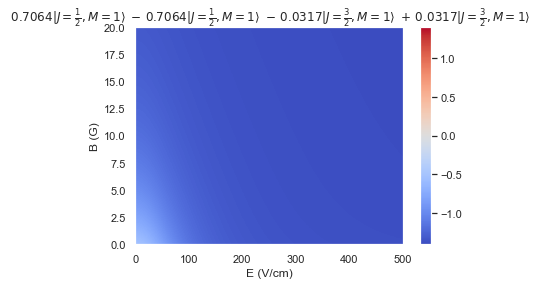

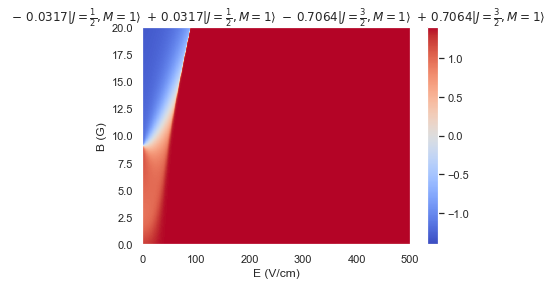

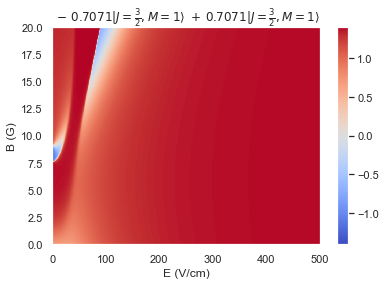

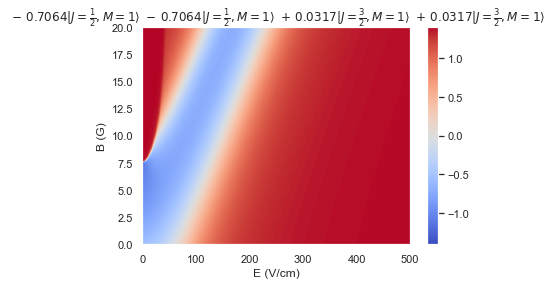

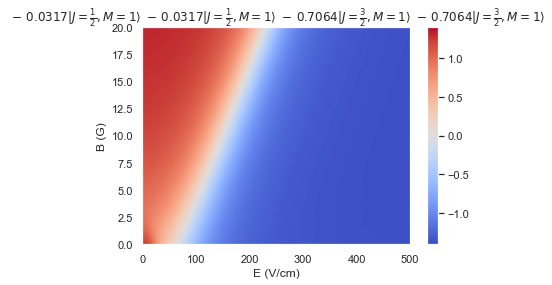

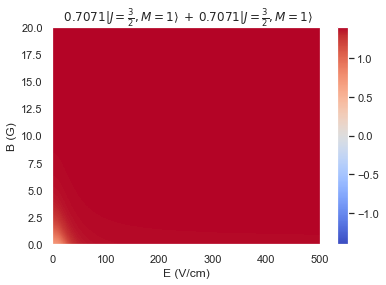

In [109]:
mesh = np.array(np.meshgrid(Ez,Bz,indexing='ij'))
for i in range(len(Bslices_p[0])):
    geff = np.gradient(Bslices_p[0][i])[1]/(Bz[1]-Bz[0])
    plt.figure()
    plt.grid(False)
    plt.pcolormesh(*mesh,geff,shading='auto',cmap='coolwarm',vmin=-1.4,vmax=1.4)
    plt.colorbar()
    plt.title(X010_p.gen_state_str(i,round=4,label_q=['J','M']))
    plt.xlabel('E (V/cm)')
    plt.ylabel('B (G)')

In [97]:
np.log10(-0.01)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in log10
  """Entry point for launching an IPython kernel.


nan

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  import sys


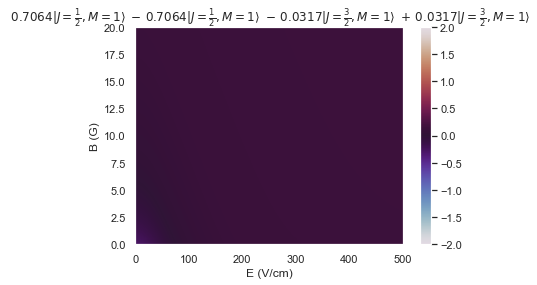

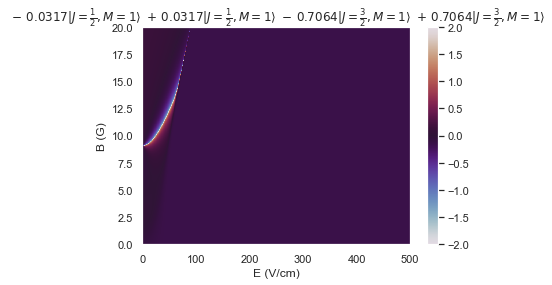

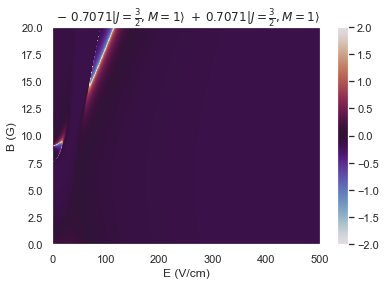

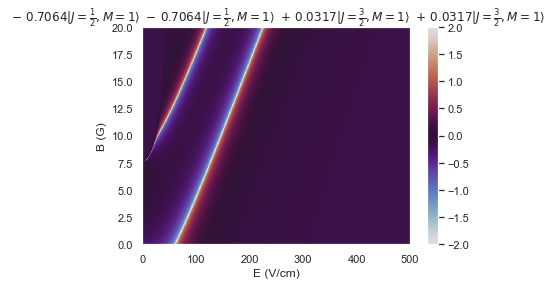

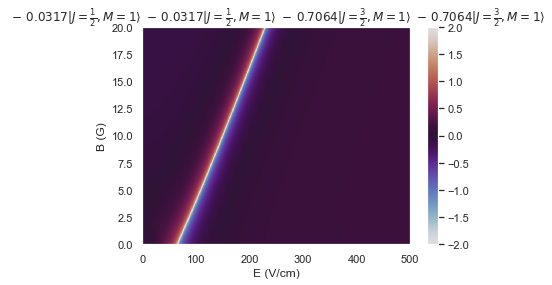

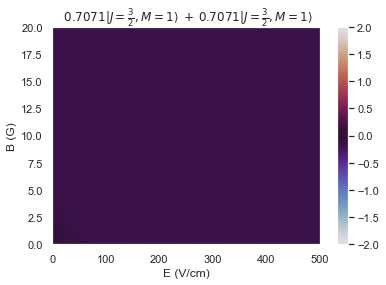

In [110]:
mesh = np.array(np.meshgrid(Ez,Bz,indexing='ij'))
for i in range(len(Bslices_p[0])):
    geff = np.gradient(Bslices_p[0][i])[1]/(Bz[1]-Bz[0])
    plt.figure()
    plt.grid(False)
    plt.pcolormesh(*mesh,-np.sign(geff)*np.log10(abs(geff)),shading='auto',cmap='twilight',vmin=-2,vmax=2)
    plt.colorbar()
    plt.title(X010_p.gen_state_str(i,round=4,label_q=['J','M']))
    plt.xlabel('E (V/cm)')
    plt.ylabel('B (G)')